In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torchvision import datasets, transforms
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader, Subset
import mnist.utils.mnist_reader as reader
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedShuffleSplit
import os
import gzip
from sklearn.model_selection import train_test_split
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt

In [2]:
# import training images and labels in numpy format
# Reference: https://github.com/zalandoresearch/fashion-mnist
training_labels_path = 'train-labels-idx1-ubyte.gz'
training_images_path = 'train-images-idx3-ubyte.gz'
with gzip.open(training_labels_path, 'rb') as lbpath:
    y_org_train = np.frombuffer(lbpath.read(), dtype=np.uint8,
                           offset=8)
with gzip.open(training_images_path, 'rb') as lbpath:
    x_org_train = np.frombuffer(lbpath.read(), dtype=np.uint8,
                           offset=16).reshape(len(y_org_train), 784)

# import test images and labels in numpy format
# Reference: https://github.com/zalandoresearch/fashion-mnist
test_labels_path = 't10k-labels-idx1-ubyte.gz'
test_images_path = 't10k-images-idx3-ubyte.gz'
with gzip.open(test_labels_path, 'rb') as lbpath:
    y_test = np.frombuffer(lbpath.read(), dtype=np.uint8,
                           offset=8)
with gzip.open(test_images_path, 'rb') as lbpath:
    x_test = np.frombuffer(lbpath.read(), dtype=np.uint8,
                           offset=16).reshape(len(y_test), 784)

In [3]:
# Reshape the images to 28*28
x_org_train = np.reshape(x_org_train, (60000, 28, 28))
x_test = np.reshape(x_test, (10000, 28, 28))

# Normalising the data(images) to the range (-1, 1)
x_org_train = (x_org_train-127.5) / 127.5
x_test = (x_test - 127.5) / 127.5

In [4]:
# Splitting the training set into train and validation set with a stratified split
x_valid, x_train, y_valid, y_train = train_test_split(x_org_train, y_org_train, stratify = y_org_train, train_size=1000)


In [5]:
#a = numpy.array([0, 3, 0, 1, 0, 1, 2, 1, 0, 0, 0, 0, 1, 3, 4])
unique, counts = np.unique(y_valid, return_counts=True)

print(dict(zip(unique, counts)))

{0: 100, 1: 100, 2: 100, 3: 100, 4: 100, 5: 100, 6: 100, 7: 100, 8: 100, 9: 100}


In [6]:
# Define the data augmentation done during training using torchvision.transforms
data_transforms = transforms.Compose([
    # Performing random horizontal Flip
    transforms.RandomHorizontalFlip(),
    # Performing a zero-pad 4 pixels on each side of the input image and randomly crop 28x28 
    transforms.RandomCrop(28, padding = 4, fill = 0, padding_mode = 'constant'),
])

In [7]:
# Defining Custom Dataset and allow performing transformations to images before training
class CustomDataset(Dataset):
    def __init__(self, images, labels, transform = None, target_transform=None):
        # Converting labels into torch format
        self.img_labels = torch.from_numpy(labels)
        self.images = images
        self.transform = transform
        self.target_transform = target_transform
    def __len__(self):
        return self.images.shape[0]
    def __getitem__(self, idx):
        # Converting images to torch format to enable data augmentation before being used for training
        image_torch = torch.from_numpy(self.images[idx]).float()
        # Transform the image if transformation is specified
        if self.transform is not None:
            image_torch = self.transform(image_torch)
        # Unsqueeze the image for later use
        image_torch = image_torch.unsqueeze(0)
        return image_torch, self.img_labels[idx]

In [8]:
# Create a training dataset with specified data transformation applied to images before they are being used for training
train_dataset = CustomDataset(x_train, y_train, data_transforms)
# Create a validation dataset with no transformation before being used
val_dataset = CustomDataset(x_valid, y_valid)

In [9]:
batch_size = 64
# Creating a data loader with specified batch size for training dataset
train_loader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
# Create a data loader with specified batch size for validation dataset
val_loader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False)

In [10]:
# CNN Architecture
class BaseModel(nn.Module):
    def __init__(self):
        super(BaseModel, self).__init__()
        # Defining a 5x5 Convolutional Layer with 32 filters, stride 1 and padding 2 (input = 1, output = 32, img_size = 28*28)
        self.conv1 = nn.Conv2d(1, 32, kernel_size=5, stride=1, padding=2)
        # Defining a ReLU Activation Layer
        self.relu1 = nn.ReLU()
        # Defining a 2x2 Max Pooling Layer with a stride of 2 (image_size = 14*14)
        self.max_pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Defining a 3x3 Convolutional Layer with 64 filters, stride 1 and padding 1 (input = 32, output = 64, img_size = 14*14)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        # Defining the second ReLU Activation Layer
        self.relu2 = nn.ReLU()
        # Defining the second 2x2 Max Pooling Layer with a stride of 2 (image_size = 7*7)
        self.max_pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Defining a Fully-connected layer with 1024 output units (input = 64*7*7, output = 1024)
        self.fc1 = nn.Linear(64 * 7 * 7, 1024)
        # Defining the third ReLU Activation Layer
        self.relu3 = nn.ReLU()
        # Defining a Fully-connected layer with 1024 inputs and 10 outputs
        self.fc2 = nn.Linear(1024, 10)

    def forward(self, x):
        # Defining how the input data is processed in this CNN network layer by layer to generate the output
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.max_pool1(x)
        
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.max_pool2(x)
        
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        x = self.relu3(x)
        x = self.fc2(x)
        return x

In [11]:
# Define which device to do training on
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = BaseModel().to(device)
# Set up Cross Entropy loss
criterion = nn.CrossEntropyLoss()
# Set up Adam optimizer with 1e-3 learning rate and betas = (0.9, 0.999)
optimizer = optim.Adam(model.parameters(), lr=1e-3, betas=(0.9, 0.999))

tensor([[-8.1407e-01, -6.7358e+00,  8.4484e-01, -3.6653e-01,  2.0731e+00,
         -5.7171e+00, -3.0335e-01, -4.4431e+00,  7.3114e+00, -7.0182e+00],
        [ 4.3422e+00, -3.6906e+00, -2.9442e-01,  8.6853e-01, -9.7753e-01,
         -4.9264e+00,  3.3826e+00, -5.0218e+00, -2.5934e+00, -6.2812e+00],
        [-4.5730e+00, -7.6321e+00, -4.9039e+00, -6.4919e+00, -6.8022e+00,
         -7.3088e-01, -3.5849e+00,  3.5529e+00,  2.4520e-01,  9.2223e+00],
        [-7.1095e-01,  2.3806e+00, -1.6897e+00,  3.7156e+00, -8.6836e-01,
         -2.8539e+00, -8.1618e-01, -5.7714e+00, -3.0282e+00, -2.1891e+00],
        [ 9.1642e-01, -2.0080e-01,  9.4172e-02,  2.1979e+00, -6.8811e-01,
         -5.0553e+00,  1.0253e+00, -5.8947e+00, -2.7481e+00, -3.0906e+00],
        [-4.5291e+00, -8.3590e+00, -6.2842e+00, -6.6625e+00, -9.2469e+00,
         -1.8147e-01, -4.4425e+00,  4.3305e+00, -2.2268e-01,  1.0440e+01],
        [ 4.7703e+00, -3.0128e+00,  4.2603e-01,  1.7148e+00, -2.7560e+00,
         -3.7694e+00,  2.1471e+0

tensor([[ -3.6181,  -2.7572,   2.6641,  -1.7218,   4.3521,  -5.7620,   1.2165,
          -5.3210,  -3.2875,  -3.1660],
        [ -2.3153,  -7.5602,  -0.7833,  -4.7388,  -2.3674,  -5.2284,  -1.7206,
          -2.5312,   9.0778,  -1.5230],
        [ -0.7368,  -2.6905,   4.3992,  -0.4108,   1.7451,  -6.2139,   4.0695,
          -9.2779,  -4.9970,  -4.7359],
        [ -1.9820,  -7.7262,  -2.5631,  -4.8077,  -4.8134,   1.3370,  -2.2087,
           5.3024,   0.1591,  -1.1895],
        [ -1.7175,   8.1067,  -0.6648,   0.7513,  -1.9682,  -2.1926,  -1.4834,
         -10.3559,  -3.8898,  -4.4440],
        [ -3.9593,  -2.8491,  -1.6826,  -3.9683,  -2.7116,   1.3606,  -1.8916,
          -0.5564,  -2.2698,   4.3083],
        [ -0.9845,  -4.4552,   2.2854,  -1.4028,   3.1612,  -6.2481,   2.1993,
          -5.7693,  -0.4570,  -4.3446],
        [  5.2187,  -5.3135,  -1.0427,   0.1435,  -2.8036,  -3.4598,   2.7802,
          -6.4659,   0.3450,  -5.8238],
        [  5.6409,  -4.0019,   2.1312,   1.3478,

tensor([[-3.3444e+00, -5.8109e+00, -3.0310e+00, -3.5308e+00, -5.1002e+00,
         -2.7429e-01, -2.8932e+00,  1.4965e+00, -5.3558e-01,  6.1359e+00],
        [-3.8584e+00,  8.5290e+00, -1.0734e+00,  4.4795e-01,  7.0922e-01,
         -3.7642e+00, -1.1084e+00, -1.2272e+01, -2.7755e+00, -6.6427e+00],
        [ 2.6254e+00, -3.7270e+00,  2.9951e+00,  5.1357e-01, -9.5327e-01,
         -5.3019e+00,  2.7788e+00, -6.5737e+00, -1.9407e-01, -5.7369e+00],
        [-7.8474e-01, -1.8783e+00,  1.8157e-01,  1.7761e+00,  4.3551e-01,
         -3.8406e+00, -4.8283e-01, -4.0815e+00, -1.9136e+00, -1.7554e+00],
        [-3.2647e+00, -6.4174e+00, -2.5210e+00, -6.1322e+00, -5.6421e+00,
          1.8769e+00, -3.8667e+00,  6.0247e+00, -2.6769e+00,  3.0068e+00],
        [-3.3672e+00, -9.6136e+00, -4.3717e+00, -5.3857e+00, -7.3846e+00,
          1.8238e+00, -3.8262e+00,  7.8246e+00, -9.2564e-02,  1.6880e+00],
        [-2.4019e+00, -2.2467e+00,  2.8003e+00, -2.5053e+00,  8.3370e-01,
         -4.8997e+00,  1.1058e+0

tensor([[  5.9926,  -3.0911,   1.5827,  -0.0885,  -2.5994,  -4.2704,   2.5232,
          -8.1166,  -1.6354,  -6.6365],
        [ -3.1551,  -5.5706,  -3.9795,  -4.5530,  -6.1793,   0.3249,  -3.1750,
           2.9978,  -2.4724,   7.9703],
        [  3.3674,  -4.3955,   1.1510,   5.1634,   0.3213,  -5.4170,   1.2641,
          -7.3657,  -2.1685,  -8.3369],
        [  0.1130,  -3.2883,   4.4077,  -1.8194,   0.6950,  -5.1994,   2.9994,
          -8.0976,  -2.5551,  -5.6190],
        [ -3.0611,  -7.0084,  -1.4990,  -2.5563,  -0.3440,  -1.7540,  -0.0365,
          -2.3256,   6.1372,  -3.7816],
        [ -1.9688,  -3.4089,   2.4495,  -1.0847,   1.3174,  -2.1027,   0.6463,
          -4.9619,  -0.4091,  -5.0972],
        [ -3.6421,  -8.4576,  -4.4447,  -6.2819,  -7.7465,   2.7075,  -3.3891,
           6.9131,  -1.8156,   2.2339],
        [ -0.6882,  -3.5423,   4.1029,  -2.1288,   2.0554,  -6.9723,   4.5182,
          -8.7088,  -4.4805,  -4.4268],
        [ -2.7701,  -6.2689,  -1.7390,  -3.9718,

tensor([[-1.7790e+00, -1.7768e+00,  1.0743e+00, -1.4100e+00,  1.4170e+00,
         -3.9528e+00,  1.1960e+00, -4.5346e+00,  7.4438e-01, -2.2493e+00],
        [-1.0955e+00, -1.8672e+00,  1.3240e+00, -4.2751e-02,  1.8863e+00,
         -4.3973e+00,  2.7060e+00, -5.9123e+00, -1.9887e+00, -3.0724e+00],
        [-2.5124e+00,  1.0683e+01, -1.3915e+00,  2.6798e-01,  1.3741e-01,
         -4.8579e+00, -2.0198e+00, -1.0780e+01, -3.3033e+00, -5.9468e+00],
        [-4.6188e-01,  4.3124e-01,  4.3818e-01, -6.5156e-01, -4.0739e-01,
          3.3923e-01, -1.7485e-01, -3.2773e+00, -3.4250e+00, -1.4007e+00],
        [-3.0803e-01, -2.6082e+00,  6.6777e+00, -1.0715e+00,  7.8979e-01,
         -5.5974e+00,  3.3304e+00, -1.1220e+01, -6.1908e+00, -5.4401e+00],
        [ 2.8686e+00, -2.1038e+00,  7.5261e-01,  1.5693e+00, -3.0082e-01,
         -5.4032e+00,  1.7952e+00, -4.9102e+00, -1.6439e+00, -4.1884e+00],
        [ 3.6502e+00, -3.5131e+00,  4.1485e-01,  2.0902e+00, -1.0448e+00,
         -3.1001e+00,  7.5557e-0

tensor([[  0.4558,  -2.2408,   1.6389,  -2.5782,   0.3107,  -3.3857,   0.6377,
          -4.7224,   1.0176,  -3.2407],
        [  0.9261,   0.1825,  -3.1220,   3.3926,  -1.9813,  -0.9818,  -1.2344,
          -5.2134,  -2.3508,  -5.0567],
        [ -0.2562,  -0.8495,  -0.2696,   2.8235,   3.3212,  -6.1675,   0.4503,
          -5.9538,  -3.6248,  -5.0691],
        [  1.5714,   0.6384,  -0.9313,   1.6423,   0.5940,  -5.5142,   1.4162,
          -5.9340,  -4.6563,  -4.0186],
        [ -5.1001,  -4.3195,  -3.7941,  -3.9004,  -4.4363,   1.0353,  -3.6719,
           1.5196,  -4.8060,   7.9731],
        [ -2.6572,  -1.7179,   4.0972,  -2.5183,   3.8373,  -5.6857,   1.8999,
          -8.4172,  -3.6456,  -4.9694],
        [ -3.6742,  -7.2485,  -3.7388,  -7.2065,  -7.1536,   1.5087,  -3.9694,
           5.9874,  -1.4392,   3.1955],
        [ -2.7813,  -5.7137,  -1.1644,  -5.7975,  -4.8247,   2.0060,  -2.6286,
           3.1428,  -0.0743,   0.2815],
        [ -3.2385,  -9.7411,  -4.3969,  -6.0332,

tensor([[-3.4113e-01,  6.0575e+00, -1.5090e+00,  2.6471e+00, -1.7521e+00,
         -3.1564e+00, -1.6710e+00, -8.4372e+00, -4.4797e+00, -2.5259e+00],
        [-6.8764e+00, -1.0083e+01, -5.7011e+00, -8.2587e+00, -8.3630e+00,
          3.2007e+00, -6.0751e+00,  5.1833e+00, -2.6242e+00,  8.8873e+00],
        [-8.5615e-03,  8.0732e+00, -8.8673e-01,  9.9641e-01, -7.0566e-01,
         -5.1891e+00, -1.0902e+00, -1.0262e+01, -4.0085e+00, -2.4713e+00],
        [ 8.6410e-01, -8.9607e-01, -1.8323e+00,  4.0499e+00, -1.0499e+00,
         -5.0695e+00, -1.1455e+00, -5.0725e+00, -4.1261e+00, -1.9630e+00],
        [-3.7258e+00, -5.9827e+00, -3.4645e+00, -6.0047e+00, -7.7865e+00,
          2.5049e+00, -4.7991e+00,  2.2330e+00, -2.4710e-01,  4.4906e+00],
        [-1.7309e+00,  9.4360e+00, -3.4346e-01,  9.5701e-01, -4.6422e-01,
         -3.9263e+00, -1.9825e+00, -1.1211e+01, -4.5132e+00, -3.5558e+00],
        [-5.8687e+00, -8.9613e+00, -4.4314e+00, -7.0423e+00, -9.3907e+00,
          4.4467e+00, -5.2062e+0

tensor([[-6.4427e+00, -8.3777e+00, -4.9090e+00, -6.5692e+00, -7.9267e+00,
          2.5469e+00, -4.9311e+00,  3.7399e+00, -2.9632e+00,  8.9065e+00],
        [-1.9743e-02,  7.1952e-01, -5.3737e+00,  5.2111e+00, -1.9269e+00,
         -4.3652e+00, -1.9447e+00, -7.4418e+00,  1.3005e+00, -3.8615e+00],
        [-2.1249e+00,  1.2120e+01, -1.3368e+00,  6.8130e-01, -1.1783e+00,
         -3.5947e+00, -3.0727e+00, -1.3230e+01, -4.8980e+00, -3.1101e+00],
        [-3.9140e+00, -8.9953e+00, -5.0149e+00, -5.8772e+00, -9.6787e+00,
          8.2859e+00, -4.6657e+00,  3.0903e+00,  2.1610e+00, -1.1179e+00],
        [-4.7172e+00, -4.9389e+00, -3.4339e+00, -5.0701e+00, -5.4754e+00,
          2.0572e+00, -4.2250e+00,  1.7055e+00, -2.2526e+00,  7.4696e+00],
        [-9.3515e-01, -5.9413e-01,  3.0453e+00, -1.6046e+00,  2.4924e+00,
         -5.8620e+00,  2.1874e+00, -8.4820e+00, -4.4340e+00, -3.6263e+00],
        [ 7.0694e-01, -1.6275e+00,  8.8115e-01,  9.7346e-01,  1.0444e+00,
         -4.7956e+00,  2.7005e+0

tensor([[ -4.5162,  13.5773,  -3.6496,  -2.5622,   0.0868,  -5.0021,  -1.4216,
         -13.8432,  -4.8305,  -6.0620],
        [  4.3643,  -3.2843,   0.4951,   0.9822,  -1.0069,  -4.9556,   3.8461,
          -7.8789,  -1.8864,  -6.5105],
        [  3.9984,  -3.0551,   0.7620,  -1.5338,  -0.9190,  -6.1919,   3.7682,
          -9.1937,  -1.9377,  -4.9115],
        [ -1.7026,  10.8896,  -2.0786,   0.4370,  -1.2502,  -5.3538,  -0.8191,
         -12.5361,  -4.5191,  -4.1960],
        [ -0.7347,   8.0051,  -1.7642,   1.2079,  -0.6002,  -5.1312,  -0.5557,
         -10.7213,  -3.0090,  -2.8329],
        [  5.4809,  -3.3412,   2.2209,   1.3620,  -1.7420,  -4.9888,   3.5766,
          -9.7084,  -2.7765,  -9.2192],
        [ -1.5713,  -2.4633,   3.1170,  -1.9245,   2.7521,  -6.5657,   4.3538,
          -8.7161,  -5.0462,  -4.8828],
        [ -3.1123, -10.2918,  -5.9975,  -7.1977,  -9.9001,   4.2011,  -3.6454,
           8.0881,  -0.8285,   1.3399],
        [ -1.3905,  -1.3798,   2.8983,   0.4655,

tensor([[-2.0240e+00,  7.9604e+00, -2.6067e+00, -7.3058e-01, -2.1349e+00,
         -4.3749e+00, -7.1175e-01, -9.7401e+00, -3.4080e+00, -3.6562e-01],
        [-2.8365e+00, -7.7320e+00, -1.2044e+00, -6.0334e+00, -1.6559e+00,
         -3.4205e+00,  1.1698e-02, -3.2335e+00,  7.3022e+00, -2.0901e+00],
        [-2.3523e+00, -8.1956e+00, -4.7505e-01, -2.4570e+00,  5.7532e-01,
         -3.1866e+00, -1.8232e+00, -4.8919e+00,  1.1054e+01, -5.8115e+00],
        [ 6.3434e+00, -5.5073e+00,  8.0918e-01,  3.9585e-01, -3.5988e+00,
         -4.6455e+00,  5.2212e+00, -6.4166e+00, -2.6054e+00, -7.1936e+00],
        [ 1.0362e-01, -2.6821e+00,  6.9309e+00, -2.9600e+00,  2.2285e-01,
         -7.5083e+00,  4.7573e+00, -1.3134e+01, -5.0191e+00, -5.9119e+00],
        [ 4.4248e+00, -2.4586e+00, -4.2723e-01,  4.4125e-01, -1.3741e+00,
         -4.3574e+00,  3.1184e+00, -6.3204e+00, -1.5315e+00, -6.3895e+00],
        [-6.8481e-01, -4.2337e+00,  6.3935e+00, -4.2407e-02,  3.3451e-01,
         -5.2131e+00,  4.1063e+0

torch.return_types.max(
values=tensor([ 6.5835,  4.5223,  4.5537,  8.9004, 10.7165,  7.1493, 10.9272,  4.2879,
         4.9920,  3.1206,  3.7495,  1.7276,  1.8350,  6.0144,  9.3186, 13.7975,
         4.9402,  8.4544,  5.8075,  3.7678, 15.1820,  4.3194,  5.7259,  3.7933,
        11.3210,  7.5057, 10.5783,  1.6742,  7.5479, 12.7623,  2.6546,  3.0504,
        10.1924,  1.6043,  6.0592,  6.6534,  4.1015,  3.9094,  6.9775,  4.8036,
         4.1586,  7.4107,  7.4530,  9.3247, 10.0182,  9.9808,  4.6377,  7.4375,
         8.5775,  3.6248,  2.2350,  7.1895,  3.5811,  8.7593,  8.4987,  8.7000,
        12.7367,  5.6484,  4.7795,  4.9548,  3.4491, 10.5592,  5.1312,  6.0514],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 6, 4, 9, 1, 5, 1, 0, 4, 2, 6, 4, 4, 0, 9, 8, 7, 7, 3, 6, 1, 3, 4, 4,
        9, 9, 8, 4, 1, 1, 3, 6, 1, 0, 2, 9, 3, 0, 5, 4, 3, 7, 7, 9, 1, 8, 3, 3,
        9, 4, 6, 2, 9, 9, 8, 9, 8, 2, 7, 8, 3, 9, 2, 0], device='cuda:0'))
tensor([[ 7.4041e-01, -2.8180e+00,  

tensor([[ 1.1061e+00, -3.7074e+00,  3.0310e+00, -1.5051e+00,  1.5459e+00,
         -6.4008e+00,  2.2449e+00, -7.0584e+00, -6.3907e-01, -4.7667e+00],
        [-2.9315e+00, -2.0458e+00,  1.6268e+00, -6.5401e-01,  4.3839e+00,
         -4.5374e+00,  2.5044e+00, -8.0872e+00, -5.3259e+00, -4.1369e+00],
        [-5.2148e+00, -7.1758e+00, -5.3048e+00, -5.4289e+00, -7.9819e+00,
          2.6716e+00, -3.8876e+00,  1.7045e+00, -2.7400e+00,  9.4379e+00],
        [-1.1229e+00, -7.0252e+00, -9.8217e-01,  2.0125e-01,  5.5446e-01,
         -2.6790e+00, -5.3020e-01, -5.7024e+00,  9.3652e+00, -4.7851e+00],
        [-4.9742e+00, -1.3620e+01, -1.8213e+00, -5.9505e+00, -8.2692e-01,
         -3.3639e+00, -3.2752e+00, -2.6567e+00,  1.4914e+01, -4.0358e+00],
        [-7.1855e+00, -1.1300e+01, -7.9631e+00, -8.9503e+00, -1.0330e+01,
          2.3852e+00, -5.5628e+00,  5.6679e+00, -2.2065e-01,  1.0847e+01],
        [ 1.0575e-01, -1.0187e+00,  5.8396e-01,  2.6792e+00,  1.2140e+00,
         -4.9190e+00,  2.7549e-0

torch.return_types.max(
values=tensor([ 4.1258,  7.2001,  2.8355,  5.3665,  3.1844,  4.8667,  9.0853, 10.0841,
         3.0110,  5.7497,  8.1085,  6.3068,  6.9919,  8.3445, 10.3383,  3.0650,
         3.2498,  4.0551,  8.6662,  8.7278,  8.2744,  7.5530,  4.3180,  4.6453,
        12.5097,  2.3702,  7.6087,  8.3245,  3.5303, 10.4056, 10.4057,  3.3995,
         3.2131,  3.5630,  5.7286,  4.2310,  4.8593,  4.4860,  3.6698,  8.4809,
         4.5909,  6.1488,  5.9259,  4.4529,  5.5756,  2.2406,  6.5010,  7.1422,
         3.1269,  0.7867,  5.1573, 11.1904, 12.7802,  8.6488, 13.4434,  7.6622,
         7.7300,  5.2236,  3.4833,  4.7621,  5.4496,  3.6211,  3.2385,  6.3613],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 9, 4, 2, 0, 4, 5, 8, 6, 3, 9, 5, 8, 7, 1, 6, 3, 4, 7, 8, 9, 7, 4, 7,
        1, 5, 5, 7, 2, 8, 7, 6, 3, 2, 4, 4, 4, 4, 6, 7, 2, 3, 0, 4, 0, 3, 1, 7,
        3, 3, 2, 7, 1, 7, 8, 5, 5, 4, 9, 4, 8, 2, 3, 9], device='cuda:0'))
tensor([[ -7.1148, -12.2117,  -6.677

torch.return_types.max(
values=tensor([ 4.5204,  7.1477, 11.0024,  2.5063, 10.1215,  9.7306,  9.5890,  3.4571,
         6.1937,  3.6732,  3.2012,  3.4165,  2.4234,  3.2625, 10.4275,  9.6914,
         6.6506,  4.0146,  2.2076,  3.8128,  8.0423, 10.2341,  7.8950,  8.2451,
        10.1398,  5.6970,  4.8863,  4.9243,  7.0326,  7.2431,  4.2835,  6.4996,
         2.3992,  6.7691,  7.8448, 14.2495,  4.6839,  2.3385,  6.7763,  4.1780,
         4.3641,  3.1112, 13.6200,  3.4537,  6.9543,  5.9747,  9.8567,  4.2574,
         5.2058,  5.7208,  4.4639,  9.4147,  6.7770,  1.7897,  5.1318,  6.1033,
         2.5344,  7.9749,  4.6261,  8.6709,  6.1697, 10.7746,  3.8552,  6.6717],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 5, 5, 2, 8, 8, 8, 0, 9, 4, 8, 3, 2, 3, 5, 8, 0, 6, 4, 4, 5, 9, 9, 1,
        8, 9, 9, 7, 7, 9, 6, 0, 6, 0, 7, 1, 0, 3, 1, 6, 3, 4, 1, 6, 5, 4, 8, 3,
        3, 9, 4, 7, 3, 6, 3, 0, 2, 9, 0, 7, 2, 9, 4, 7], device='cuda:0'))
tensor([[-2.6231e+00,  6.9884e+00,  

tensor([[-2.5173e+00, -1.1661e+01, -1.6621e+00, -9.6673e+00, -4.0900e+00,
         -3.2762e+00, -7.3614e-01, -5.4828e+00,  1.1205e+01, -3.7140e+00],
        [-2.2752e+00, -7.7550e+00, -1.2637e+00, -1.2121e+00,  3.9541e-01,
         -1.8617e+00, -6.4882e-03, -5.9047e+00,  9.4986e+00, -6.6587e+00],
        [-9.6686e-01, -2.6708e+00,  1.2376e+00, -2.5482e-02,  9.2602e-01,
         -3.5242e+00,  2.5242e+00, -5.4718e+00, -1.7469e+00, -5.0908e+00],
        [ 1.0585e+00, -3.2102e+00,  1.0486e+00,  7.6311e-01,  6.7413e-01,
         -3.7272e+00,  2.2969e+00, -6.7567e+00, -1.9793e+00, -5.9714e+00],
        [-1.9837e+00, -1.0301e+01, -7.6741e-01, -6.0872e+00, -8.1748e-01,
         -1.4781e+00, -8.7927e-01, -2.9692e+00,  7.7138e+00, -6.6105e+00],
        [ 6.5746e+00, -4.9185e+00,  9.9493e-01,  2.1953e-02, -3.0605e+00,
         -3.3285e+00,  5.0282e+00, -1.1077e+01, -3.2321e-01, -9.8889e+00],
        [-1.4862e+00, -5.9400e+00,  8.1077e-01, -2.5881e+00,  3.9099e+00,
         -5.6605e+00,  7.8726e-0

tensor([[-4.6747e+00, -1.2052e+01, -6.8745e+00, -9.5460e+00, -1.1701e+01,
          5.2493e+00, -4.0598e+00,  9.6181e+00, -2.2885e+00,  3.7091e+00],
        [ 7.3449e+00, -5.3296e+00,  2.0258e-01,  1.4126e+00, -4.6739e+00,
         -4.8832e+00,  5.4920e+00, -9.2578e+00, -3.1098e+00, -6.8332e+00],
        [ 2.6189e+00, -9.3272e-01,  2.0621e+00,  2.1530e-01,  2.6525e-01,
         -4.6831e+00,  1.1887e+00, -6.2722e+00, -3.5136e+00, -4.4222e+00],
        [-3.5483e+00, -4.7084e+00, -3.0214e+00, -2.8688e+00, -2.9349e+00,
          3.6143e-01, -2.3051e+00,  2.5532e-01, -3.8199e+00,  5.5607e+00],
        [-2.9590e+00, -6.6846e+00, -6.2637e+00, -3.9826e+00, -8.5997e+00,
          2.0856e+00, -4.7192e+00,  2.7504e+00, -1.3567e+00,  8.2359e+00],
        [ 1.2466e+00, -3.0621e+00,  2.3889e+00, -8.6072e-02,  2.6187e-01,
         -5.1679e+00,  2.8336e+00, -7.5921e+00, -2.2413e+00, -5.9446e+00],
        [-1.8692e+00, -7.7332e+00, -1.5074e+00, -3.9242e+00, -1.2684e+00,
         -2.6224e+00,  5.0585e-0

tensor([[ -3.6963,  -8.8870,  -2.3609,  -5.5647,  -7.4201,   8.1845,  -1.4609,
          -1.5663,  -0.1797,  -0.8830],
        [ -5.1424, -11.6212,  -7.6269,  -7.8856, -10.3030,   5.2878,  -4.2570,
           7.8491,  -3.9013,   5.2769],
        [ -4.5692, -13.5563,  -7.8862, -10.3097, -11.3194,   4.7299,  -5.6242,
           9.0608,  -2.9297,   4.3989],
        [ -4.7473,  14.5314,  -3.0707,   0.4116,  -1.1908,  -4.6762,  -1.4034,
         -14.7106,  -5.0771,  -5.2226],
        [ -2.8550,  -7.1040,  -3.9071,  -3.4964,  -6.7134,   5.7896,  -0.9032,
          -2.0707,  -1.5370,   0.5905],
        [ -0.8053,  -2.4511,   4.0420,  -2.2023,   1.7544,  -5.1505,   2.9039,
          -8.8908,  -2.8629,  -5.6991],
        [ -1.9085,  -1.9374,  -3.7332,   4.3150,  -1.5492,  -1.8133,  -0.5102,
          -5.3831,   0.7028,  -2.9682],
        [  0.3930,  -2.6444,   5.0737,  -1.4438,   1.6787,  -6.5562,   5.2029,
         -12.0680,  -5.9499,  -6.6757],
        [  6.7715,  -4.7191,   2.7865,   0.5481,

tensor([[ -1.1564,  -4.0802,   5.0475,  -3.1191,   2.5595,  -5.6805,   1.5504,
         -10.2477,  -4.8635,  -5.2152],
        [ -1.0632,  -4.6965,   2.2145,  -1.7353,   5.7173,  -7.2269,   2.3610,
          -8.1987,  -1.5954,  -6.6185],
        [ -2.6074,  -9.9152,  -4.8979,  -6.4748,  -6.7920,   3.3336,  -2.6975,
           6.5099,  -2.0671,   0.4147],
        [ -5.4231,  13.0121,  -2.4261,  -0.1076,  -0.1998,  -3.8947,  -2.6827,
         -13.5679,  -7.9089,  -5.0895],
        [ -1.2657,   1.2243,  -5.4707,   6.0809,  -0.3144,  -5.0979,  -1.3111,
          -5.6210,  -2.9881,  -2.5864],
        [ -0.5939,  -3.9244,   2.2722,  -2.4764,   2.4718,  -4.8616,   3.7518,
          -6.9708,  -1.2124,  -5.3670],
        [ -6.0237,  -7.3720,  -5.8995,  -6.8528,  -6.7930,   2.6634,  -5.3313,
           5.2643,  -5.2876,   9.5282],
        [ -4.1352, -11.2648,  -6.2247,  -8.0137,  -7.9907,   2.1310,  -2.9521,
           8.6365,  -2.8137,   3.4112],
        [ -5.2158, -11.7111,  -5.8148,  -9.2604,

torch.return_types.max(
values=tensor([ 9.3071,  4.0602,  4.0798,  2.7409,  9.1186,  2.8375,  3.7280, 11.1779,
         4.4911, 10.2063, 11.5496,  5.1476,  6.8854, 10.0728,  7.8898,  6.3192,
         4.8134,  5.0624,  4.4537,  4.2683,  6.5695,  8.8502,  7.6206,  7.4545,
        11.5264,  4.7824,  4.5641,  9.4041,  4.7895,  9.2976,  5.9645,  9.2549,
         3.0428,  5.9300,  4.9331,  5.9942,  5.3669,  6.3150,  3.9820,  8.1066,
         3.0484,  6.4372,  5.9931,  8.4991,  1.9790,  7.6418,  5.5511,  6.5902,
         7.3822,  8.4100,  4.6789,  5.9926, 11.8951,  3.3080, 14.1007,  2.9581,
         8.1471,  6.2619,  5.4158,  4.0546,  4.6925,  4.6422,  5.2451,  7.0694],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 3, 3, 2, 9, 3, 5, 5, 3, 1, 1, 4, 9, 7, 5, 7, 5, 2, 9, 6, 1, 7, 1, 7,
        1, 8, 6, 5, 3, 9, 0, 5, 6, 8, 9, 7, 4, 8, 3, 5, 4, 0, 3, 5, 3, 9, 5, 8,
        9, 7, 5, 1, 1, 4, 1, 2, 7, 4, 3, 9, 5, 2, 2, 5], device='cuda:0'))
tensor([[  5.0736,  -3.0314,  -2.810

tensor([[ -0.3679,  -7.4860,  -2.9692,  -4.6941,  -5.3249,   4.3634,   0.1531,
           1.3412,  -0.1653,  -2.3507],
        [  4.6285,  -4.1107,   1.2523,   0.7771,  -2.2221,  -3.7461,   4.8535,
          -8.0820,  -3.5927,  -7.0164],
        [ -3.1523,  -4.7190,  -4.0348,  -5.7152,  -8.3235,   7.2000,  -2.8053,
           0.5329,  -4.5397,   2.6637],
        [  0.1064,   2.2461,  -2.0330,   5.6973,   1.3129,  -5.4275,  -0.4565,
          -8.5553,  -2.6563,  -7.4023],
        [ -2.5296,  10.2986,  -1.4824,   1.3735,   0.0325,  -5.4727,  -0.7370,
         -11.3569,  -5.0835,  -2.7491],
        [ -1.3790, -12.3121,  -4.0024,  -8.0154, -10.8026,   8.4282,  -2.4244,
           2.5556,  -2.5053,  -0.0340],
        [  0.0723,  -3.9097,   0.5296,  -1.6092,  -0.1395,  -1.5552,   2.4617,
          -5.8057,   1.6351,  -4.1034],
        [ -2.0581,  -3.6523,   5.1864,  -1.4806,   5.6192,  -7.5565,   2.1267,
         -10.4899,  -6.2755,  -6.7639],
        [ -6.4487, -12.6455,  -7.9694,  -7.6780,

tensor([[ 5.9928e+00, -5.3768e+00,  6.3020e-01,  1.4476e+00, -2.8120e+00,
         -4.9312e+00,  4.1523e+00, -6.3080e+00, -3.2894e+00, -6.9793e+00],
        [ 3.3351e+00, -1.6133e+00, -3.9821e-01,  4.7228e+00, -8.3654e-01,
         -5.8275e+00,  2.0691e+00, -8.1252e+00, -3.3435e+00, -6.8514e+00],
        [ 2.5964e+00, -4.8883e+00,  1.6059e+00,  2.6006e-02, -1.4965e+00,
         -4.2207e+00,  3.2310e+00, -5.9414e+00,  9.3591e-01, -5.1235e+00],
        [-4.1844e-01, -5.5884e+00, -1.8665e+00,  1.8538e+00,  1.2752e-01,
         -4.6845e+00, -6.3542e-01, -3.8951e+00,  3.9258e+00, -2.8772e+00],
        [ 3.2192e+00, -5.2686e+00, -1.1725e+00,  2.0636e+00, -2.4689e+00,
         -3.9044e+00,  1.6588e+00, -5.4024e+00, -3.5482e+00, -2.9831e+00],
        [ 6.8787e-01,  1.3160e+00, -4.2946e+00,  5.4461e+00, -7.6385e-01,
         -7.1566e+00,  7.9221e-01, -7.4614e+00, -2.8235e+00, -3.2820e+00],
        [-3.1644e+00,  9.2290e+00, -2.7654e+00,  5.0183e-01,  2.3746e-01,
         -5.0572e+00, -1.7471e+0

tensor([[  3.0895,  -2.3638,  -2.1266,   1.4637,  -2.8552,  -3.9069,   1.6490,
          -4.1329,  -3.6730,  -5.0872],
        [  0.1695,  -8.3957,  -0.8619,  -5.5927,  -1.6862,  -4.2622,   1.1113,
          -4.3811,   6.2469,  -2.5561],
        [ -2.3123,  -6.6668,  -4.5589,  -5.1702,  -6.8381,   2.4644,  -3.0028,
           6.2080,  -4.1209,   2.8649],
        [ -3.5129,  -3.1007,  -3.7264,  -3.3448,  -3.5972,   0.9039,  -1.8850,
          -0.5690,  -2.3595,   6.3595],
        [ -0.1958,  -1.7171,   7.6435,  -3.1485,   2.5891,  -7.9276,   2.3298,
         -12.3334,  -6.5399,  -7.5895],
        [  4.0675,  -3.6232,  -1.0212,   0.6824,  -0.5596,  -5.9245,   4.3650,
          -6.2499,  -3.1393,  -6.3634],
        [ -0.4540,  -5.4810,   6.5224,  -2.2554,   3.2463,  -6.4161,   2.7449,
         -11.5087,  -1.7745,  -8.4549],
        [  1.0805,  -1.8863,   2.3420,   0.7483,   2.0667,  -5.7724,   2.1537,
          -7.6468,  -3.7262,  -5.4701],
        [  2.1360,  -0.3757,  -0.3207,   2.2023,

torch.return_types.max(
values=tensor([ 2.7613,  2.7403,  4.3094,  3.7337,  6.1824,  9.4314,  5.0949,  7.4982,
         4.4814,  3.6470,  2.4088,  5.1516,  5.6839,  4.5558,  4.6292,  8.7812,
         8.7951,  3.2387,  2.9779,  5.7300, 10.2969,  3.6300,  6.7697,  5.3453,
        10.1559,  4.8905,  9.3410,  7.4998,  3.1310,  5.1519,  4.3120,  5.0717,
         5.3930,  4.9341,  3.1912,  2.0640, 13.4516,  6.8067,  9.4305,  6.3176,
         8.8021,  6.6809,  4.7801,  3.2306,  7.3838,  7.7790,  5.0287, 13.3377,
         8.6313,  3.8031,  4.0416,  6.2196,  4.0838,  6.6817,  5.6480,  8.7876,
         6.3136,  7.3976,  5.8039,  6.0961, 10.4006,  3.5148,  6.0632,  5.3188],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 6, 3, 4, 1, 1, 6, 8, 6, 6, 6, 6, 0, 5, 7, 9, 9, 6, 3, 3, 1, 5, 7, 0,
        1, 3, 8, 0, 4, 0, 6, 3, 9, 9, 3, 9, 1, 7, 1, 0, 8, 7, 3, 2, 9, 1, 3, 1,
        9, 3, 2, 9, 3, 8, 2, 3, 0, 7, 2, 5, 1, 6, 4, 9], device='cuda:0'))
tensor([[ 6.6649e-01, -5.1770e+00,  

tensor([[-2.5168e-02, -9.7556e+00, -3.0409e+00, -5.5786e+00, -7.2268e+00,
          7.1710e+00, -2.0417e+00,  2.6532e+00, -2.8544e+00, -4.0656e+00],
        [-7.0616e-01, -2.9589e+00,  2.0171e+00, -4.5023e-01,  3.9295e+00,
         -5.4779e+00,  1.5625e+00, -5.8588e+00, -2.7900e+00, -4.4176e+00],
        [ 6.2261e+00, -5.7486e+00, -1.4348e-01,  4.0319e-01, -3.4085e+00,
         -5.1873e+00,  4.6874e+00, -5.8468e+00, -3.0858e+00, -7.1759e+00],
        [-2.2230e+00,  1.0370e+01, -2.4891e+00,  4.6521e-01,  1.4581e-01,
         -4.6585e+00,  7.2468e-01, -1.1755e+01, -5.2953e+00, -5.4144e+00],
        [-8.2408e-01, -3.4993e+00,  5.0415e-01, -1.5227e+00,  2.5348e+00,
         -4.9422e+00,  1.4601e+00, -3.6578e+00, -2.0092e+00, -2.5970e+00],
        [ 8.4840e+00, -5.9874e+00, -8.7099e-01,  1.5625e+00, -5.7462e+00,
         -4.0512e+00,  5.3375e+00, -9.2516e+00, -1.8426e+00, -9.1288e+00],
        [-2.6550e+00, -7.7142e+00, -4.5725e+00, -4.7898e+00, -6.8223e+00,
          5.9655e+00, -2.6850e+0

tensor([[-8.4738e-01, -4.5486e+00,  3.3963e+00, -3.1330e+00,  2.5066e+00,
         -2.0623e+00,  1.6181e+00, -6.9635e+00,  2.1479e-01, -5.5401e+00],
        [-5.0977e+00, -1.0927e+01, -7.7745e+00, -7.5395e+00, -8.9918e+00,
          4.8744e+00, -5.3145e+00,  6.5944e+00, -3.5547e+00,  7.5739e+00],
        [ 8.4383e-01, -2.9396e+00,  4.5519e+00, -2.2096e+00,  1.0669e+00,
         -5.9590e+00,  2.3965e+00, -7.3500e+00, -2.7957e+00, -5.4970e+00],
        [-3.2235e+00, -1.1966e+01, -7.7057e+00, -6.1685e+00, -9.3473e+00,
          6.4343e+00, -3.9471e+00,  8.9258e+00, -4.3550e+00, -1.1151e-01],
        [ 4.8785e+00, -5.6030e+00,  7.9785e-02, -7.8320e-01, -1.5147e+00,
         -5.1904e+00,  3.9276e+00, -6.4478e+00, -1.7550e-01, -5.5798e+00],
        [ 1.3557e+00,  3.3002e-01, -1.3085e+00,  4.9587e+00,  1.0924e+00,
         -5.7606e+00,  1.0425e-01, -7.2907e+00, -3.6291e+00, -6.8619e+00],
        [-5.4033e-01, -7.5572e+00, -2.3914e+00, -4.8197e+00, -2.9787e+00,
         -1.7950e+00, -3.0538e-0

tensor([[  6.1911,  -4.7355,  -1.0752,  -0.5296,  -2.9764,  -4.3785,   3.6813,
          -5.1136,  -0.3935,  -6.5463],
        [  0.2112,   0.3735,  -5.0583,   4.7768,  -1.4358,  -3.2331,   0.0848,
          -5.9313,  -0.5240,  -6.4600],
        [  2.1685,  -3.5200,  -1.4279,   3.0449,   0.5903,  -4.7882,   1.5440,
          -5.1431,  -3.5214,  -6.6767],
        [  0.4830,  -3.4862,   1.2380,   1.0263,   3.4522,  -6.0512,   3.3131,
          -7.2433,  -2.2793,  -5.9630],
        [ -2.7396,  11.4200,  -2.7249,  -0.0852,  -1.1189,  -4.1118,  -1.6197,
         -10.6083,  -6.6488,  -2.5822],
        [  9.2991,  -5.7307,  -0.1867,   0.2819,  -4.7709,  -5.5501,   5.2435,
         -10.2491,  -2.2451,  -7.4197],
        [  1.0993,  -0.5549,  -3.5745,   3.6044,  -2.0495,  -3.8630,   0.8638,
          -5.7368,  -2.8790,  -2.4236],
        [ -1.1181,   7.9264,  -2.4018,   1.2679,  -2.0212,  -4.6405,  -1.2027,
          -9.4672,  -5.8464,  -5.0054],
        [  1.5161,  -1.6446,   1.1965,   0.7720,

tensor([[-4.0857e+00, -1.1175e+01, -8.7290e+00, -6.1812e+00, -9.8648e+00,
          4.3973e+00, -6.4946e+00,  9.5324e+00, -2.7953e+00,  3.2813e+00],
        [-2.0460e+00,  8.9747e+00, -2.5898e+00,  8.6194e-01, -1.5957e+00,
         -3.9411e+00, -1.5145e+00, -8.1296e+00, -4.8119e+00, -2.1760e-01],
        [-3.9937e-01, -3.4013e+00,  1.2551e+00, -1.4895e-01,  3.5171e+00,
         -5.8344e+00,  2.6389e+00, -6.3012e+00, -1.4773e+00, -4.0191e+00],
        [-3.7901e+00, -3.2650e+00,  3.0484e+00, -3.8549e+00,  4.7278e+00,
         -6.0605e+00,  2.6029e+00, -6.9708e+00, -5.1587e+00, -4.1600e+00],
        [-3.1970e+00,  9.5125e+00, -5.4578e+00,  2.8918e+00, -8.2790e-01,
         -5.7387e+00, -2.9110e+00, -1.1165e+01, -1.8985e+00, -4.5869e+00],
        [-3.1630e+00,  1.1157e+01, -2.4903e+00,  1.8903e+00,  1.2538e+00,
         -6.3389e+00, -1.6644e+00, -1.0665e+01, -6.3639e+00, -2.1673e+00],
        [ 4.7430e+00, -2.9997e+00,  2.2285e-01,  2.6825e+00, -8.0871e-01,
         -5.0900e+00,  1.5134e+0

tensor([[-2.1402e+00, -2.7418e+00,  7.8146e+00, -4.7913e+00,  3.1755e+00,
         -6.3278e+00,  2.4727e+00, -1.2234e+01, -4.9458e+00, -6.9995e+00],
        [-2.6263e+00, -2.1530e+00,  2.8803e+00, -3.0502e+00,  2.8842e+00,
         -4.5298e+00,  1.3451e+00, -7.0055e+00, -2.4591e+00, -3.3392e+00],
        [-2.6095e+00, -1.2122e+01, -6.3336e+00, -7.5394e+00, -9.6371e+00,
          6.4833e+00, -5.9579e+00,  8.6940e+00, -4.1980e+00,  7.5994e-01],
        [-2.1842e+00, -3.1410e+00,  1.4385e+00, -1.8821e+00,  4.0473e+00,
         -5.4881e+00,  2.9238e+00, -6.6118e+00, -2.8039e+00, -3.6791e+00],
        [ 6.5660e+00, -5.2907e+00,  2.4374e+00,  7.3425e-01, -2.4255e+00,
         -4.8505e+00,  3.6693e+00, -6.5315e+00, -3.2459e+00, -7.6809e+00],
        [-6.5278e+00, -6.4781e+00, -5.0483e+00, -5.5793e+00, -5.4522e+00,
          2.8986e+00, -6.3840e+00,  2.4859e+00, -4.6065e+00,  8.3152e+00],
        [-1.0817e+00, -2.7160e+00, -3.3223e+00, -2.4279e+00, -4.6184e+00,
         -9.3517e-01, -3.1358e+0

tensor([[ -6.0861, -10.0610,  -6.3384,  -6.9499,  -8.0602,   2.3491,  -6.7645,
           3.4329,  -3.0561,   9.3006],
        [ -5.7942, -12.0388,  -2.9113,  -6.9599,  -2.1400,  -2.5657,  -3.5729,
          -1.9591,   6.9134,  -1.3477],
        [  2.1270,  -6.3961,  -0.0847,  -2.2636,  -1.2896,  -2.9520,   0.5009,
          -2.3401,   1.4976,  -1.5770],
        [ -0.3297,  -0.7833,  -1.1187,   2.6758,   3.5059,  -6.7962,   1.0703,
          -5.9550,  -3.2735,  -5.1152],
        [ -3.6005, -10.8696,  -0.5777,  -6.8836,   0.4934,  -3.0431,  -2.3351,
          -4.0192,   9.5455,  -5.7183],
        [  3.7833,  -0.7514,   0.5970,   1.8573,  -1.7287,  -4.9441,   3.8945,
          -8.6926,  -4.1415,  -6.4321],
        [ -4.0477,  -5.2251,  -3.5858,  -4.5148,  -4.8980,   3.2976,  -3.2902,
           0.8607,  -3.2854,   5.5869],
        [  6.9787,  -4.6259,   2.5185,  -0.6686,  -3.3433,  -5.9575,   4.1818,
          -7.1025,  -2.3977,  -7.8338],
        [ -4.3612,  -3.8912,   5.2693,  -5.1984,

tensor([[ 7.3217e-01, -2.6052e+00, -1.6339e+00,  8.0351e-01, -1.4669e+00,
         -3.8039e-01, -1.0975e+00, -7.7318e-01, -9.8305e-01, -5.2489e+00],
        [-2.0200e+00, -4.1825e+00, -1.5548e-01,  5.7188e-01,  4.0377e+00,
         -6.1314e+00,  2.7325e+00, -6.8405e+00, -2.4760e+00, -4.1453e+00],
        [-4.5753e+00,  1.2144e+01, -2.2288e+00,  6.7270e-01,  3.6095e-01,
         -4.1500e+00, -1.6230e+00, -1.1681e+01, -3.8614e+00, -6.9210e+00],
        [-7.2368e-01,  1.4849e+00, -2.6002e+00,  7.1193e+00,  2.8248e+00,
         -6.0348e+00, -2.3089e+00, -8.0471e+00, -6.6060e-01, -7.6126e+00],
        [-2.9786e+00,  8.0514e+00, -3.2980e+00,  1.7925e+00,  2.1601e-02,
         -2.4166e+00, -1.6548e+00, -8.7223e+00, -5.5676e+00, -4.3342e+00],
        [-2.7709e+00,  9.0083e+00, -2.4586e+00,  7.9503e-01, -1.6758e+00,
         -2.8731e+00, -1.9411e+00, -1.0872e+01, -4.9719e+00, -4.3418e+00],
        [-5.2231e+00, -1.0037e+01, -5.5141e+00, -6.8425e+00, -7.5619e+00,
          4.3990e+00, -4.5806e+0

torch.return_types.max(
values=tensor([ 4.1953,  4.5374,  5.5961,  4.8970,  3.8192,  5.9809,  9.0817, 11.9090,
         5.7468, 10.3557,  6.5375,  4.3132,  9.3978,  5.8118, 14.2287,  3.0374,
         4.6332,  5.4763, 12.0752,  4.5464,  6.0516,  5.7454,  6.7122,  7.8526,
         5.8148,  4.7755,  9.2230, 11.1316,  5.7514,  2.5342,  5.1424,  2.2736,
         8.0722,  6.6447,  3.4612,  8.9257,  3.3717,  8.6928,  5.5422,  6.0118,
         4.0644,  7.2171,  8.4540,  4.5097,  7.7385,  5.3747,  8.4878,  5.3358,
         3.8435,  3.9437, 10.2218,  8.7923, 14.0091,  9.1396,  4.7972, 10.0057,
         7.2969, 11.0395,  1.4881,  9.3328,  5.7136,  4.2661,  2.8106,  4.6075],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 8, 2, 4, 3, 2, 5, 1, 0, 1, 7, 4, 1, 7, 1, 8, 2, 7, 1, 6, 0, 7, 4, 7,
        5, 5, 9, 5, 3, 4, 3, 3, 1, 4, 4, 7, 3, 5, 8, 3, 7, 5, 0, 4, 9, 4, 7, 5,
        6, 2, 1, 7, 1, 9, 4, 1, 1, 1, 6, 5, 6, 3, 0, 6], device='cuda:0'))
tensor([[ -2.5823,  -4.4279,   4.677

tensor([[-1.1077e+00,  6.6993e-01, -6.4155e+00,  6.2216e+00, -8.2800e-01,
         -4.7400e+00, -3.2019e+00, -5.4808e+00,  9.6949e-01, -4.1285e+00],
        [-4.2122e+00, -6.7140e+00, -4.1030e+00, -6.6524e+00, -8.9243e+00,
          1.1101e+01, -6.4474e+00,  1.6965e+00,  7.1464e-03, -3.3996e+00],
        [ 6.0763e-01, -3.2693e+00,  1.3048e+00, -6.3810e-02,  1.4187e+00,
         -5.4909e+00,  2.5444e+00, -6.0854e+00, -1.5785e+00, -3.9287e+00],
        [ 1.3079e-02, -4.4402e+00,  4.6200e+00, -5.4179e-01,  6.7823e-01,
         -6.0110e+00,  4.9213e+00, -1.0074e+01, -3.7410e+00, -5.5215e+00],
        [-1.5674e+00, -3.7109e+00,  7.2662e+00, -2.6821e+00,  2.1571e+00,
         -6.0593e+00,  4.8631e+00, -1.2583e+01, -5.3682e+00, -7.3564e+00],
        [-2.3834e+00, -4.2745e+00,  2.7141e+00, -2.5939e+00,  4.4950e+00,
         -7.2350e+00,  2.8364e+00, -6.2919e+00, -2.6390e+00, -5.0989e+00],
        [ 2.0692e+00, -1.2507e+00, -5.9399e+00,  6.0602e+00, -1.8295e+00,
         -4.7426e+00,  6.3829e-0

tensor([[ -5.7731,  -9.8902,  -5.9815,  -6.8486,  -6.4305,   2.1257,  -5.3459,
           6.1339,  -4.3700,   6.6248],
        [ -0.2734,  -2.6265,   1.4253,   0.0321,   2.3269,  -5.5477,   0.8361,
          -6.2825,  -3.4099,  -2.7639],
        [ -4.5342,  11.2670,  -2.3615,   2.4864,   1.3686,  -4.4083,  -2.6303,
         -13.0047,  -2.9497,  -6.3082],
        [  6.3362,  -5.2973,  -1.0400,   1.1130,  -3.3445,  -3.6480,   3.9902,
          -7.6275,  -2.4585,  -4.9504],
        [ -1.3602, -11.9277,  -5.2036,  -8.3550,  -8.1925,   3.0894,  -3.7810,
           8.2835,  -2.8974,   1.2323],
        [ -0.7768,  -4.2189,   0.6410,   2.1536,   3.4991,  -6.3927,   3.5047,
          -8.7478,  -3.2020,  -6.1371],
        [ -2.9554,  -2.8374,  -0.3053,   2.5689,   1.7505,  -4.0779,  -0.1578,
          -5.4733,  -4.2986,  -3.2369],
        [ -3.2097, -10.4137,  -4.6129,  -6.5278,  -8.8339,   8.9227,  -4.3658,
           1.2476,   1.1533,  -0.1658],
        [ -6.1272,  -4.0047,  -6.1591,  -3.5364,

torch.return_types.max(
values=tensor([ 1.4578,  3.8100,  8.3442,  4.0269,  3.7890,  5.1868,  5.0592,  2.3129,
         4.0968,  1.2599,  4.3087,  4.1524,  3.5900,  6.3023,  5.5495,  2.6236,
         5.1117,  6.3793, 11.6811,  6.7490,  3.6750,  8.1945,  2.9744,  8.2497,
         8.4464, 11.7540,  9.2833,  5.4134, 11.2486,  3.1196,  7.2109,  4.6298,
         3.8640,  7.5073,  3.2454, 11.8062,  2.8334,  8.5875,  2.2141,  3.0049,
         9.2505,  2.6276,  6.0722,  8.3211,  5.7455,  6.3714, 11.6678,  6.9322,
         5.4370,  3.8106,  7.8210,  4.6052,  8.2968,  4.4043,  8.6330,  5.3254,
         4.6644,  3.6483,  5.0253, 10.8308,  6.9939,  9.7839,  4.9569,  6.4681],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 3, 5, 9, 3, 4, 2, 2, 3, 0, 9, 3, 5, 7, 7, 6, 4, 0, 1, 0, 4, 7, 0, 5,
        7, 8, 1, 0, 8, 3, 9, 5, 0, 0, 8, 1, 2, 9, 2, 2, 9, 4, 5, 7, 3, 3, 1, 1,
        4, 8, 1, 4, 7, 3, 7, 5, 3, 3, 7, 8, 0, 1, 4, 8], device='cuda:0'))
tensor([[-2.5975e+00,  9.1484e+00, -

torch.return_types.max(
values=tensor([ 4.9452,  2.2485,  9.6686,  3.4892,  1.4196, 13.6467,  7.3044,  4.3326,
         1.8631,  6.3848,  4.0951,  2.6441,  5.8148,  4.6597,  5.7020,  2.6407,
         6.6404,  7.0842,  6.1326,  3.1332,  3.5850,  2.9965,  9.0154,  6.1941,
         2.0904,  6.4287,  1.8753,  3.0206,  5.4495,  9.1793,  3.4674,  2.1773,
         6.4979,  2.3718,  4.9618,  8.0715,  5.6464,  3.9461,  7.2193,  4.3866,
         1.6793,  5.9355, 11.1242,  3.0547,  2.6338,  2.8854,  2.7379,  5.7235,
         3.7286, 12.9836,  4.8329,  6.1245,  4.7531, 13.0131, 11.0993,  1.6114,
         5.3338,  5.8132,  6.5987,  3.4545,  5.0071,  3.2125,  7.8865,  8.0006],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 3, 8, 4, 4, 1, 9, 4, 4, 7, 4, 0, 7, 5, 2, 4, 3, 0, 9, 4, 2, 7, 9, 2,
        0, 2, 3, 8, 5, 0, 2, 0, 8, 3, 0, 9, 0, 0, 9, 7, 8, 2, 8, 8, 3, 2, 8, 5,
        2, 1, 6, 5, 2, 8, 8, 8, 7, 8, 2, 8, 7, 4, 0, 9], device='cuda:0'))
tensor([[-1.5131e+00, -1.1952e+01, -

tensor([[ -2.8692, -11.1873,  -5.8896,  -6.3805,  -9.2888,   6.7540,  -5.5356,
           5.9132,  -0.3842,   0.4577],
        [ -0.4314,  -2.9998,   3.6629,  -1.5262,   2.4410,  -4.8504,   0.9841,
          -6.0614,  -1.9111,  -5.8743],
        [ -1.8610,  -7.8711,  -3.1087,  -3.7922,  -6.0690,   6.7265,  -3.1888,
           0.5751,   1.4475,  -2.2002],
        [ -2.5482,   9.0067,  -4.9563,   3.0126,  -1.0425,  -4.3701,  -1.6253,
         -12.0837,  -2.4001,  -6.2688],
        [ -3.1858,  -5.6246,  -5.8400,  -4.5281,  -7.4287,   2.6053,  -4.9762,
           1.6917,  -3.3554,   9.7017],
        [ -0.4056,   0.2694,  -0.6646,   3.8581,   2.7911,  -5.1083,  -1.3522,
          -5.9662,  -1.4912,  -5.3129],
        [ -2.2727,  -2.8997,  -0.5208,   1.1964,   3.9397,  -5.6867,   0.7238,
          -5.5087,  -2.4561,  -3.8031],
        [  5.4635,  -3.1637,  -0.1564,  -0.6072,  -2.3980,  -4.9815,   2.4627,
          -7.2523,  -1.0627,  -5.1337],
        [  0.5606,  -8.9118,  -0.4448,  -6.3321,

tensor([[ 1.5534e+00, -1.3590e+00, -2.9933e+00,  4.4381e+00, -2.1817e-01,
         -5.2820e+00, -1.1357e+00, -6.0730e+00, -3.1186e+00, -3.4835e+00],
        [ 2.5770e+00, -6.9737e-01, -2.5013e+00,  3.3177e+00, -3.4154e-01,
         -5.8011e+00,  2.7373e-01, -6.5219e+00, -4.7851e+00, -3.3989e+00],
        [-3.1686e+00, -1.0566e+01, -3.3909e-01, -5.4917e+00, -2.4781e-01,
         -3.0654e+00, -2.5028e+00, -2.6121e+00,  9.7359e+00, -3.1797e+00],
        [ 9.8435e-01, -1.8684e+00,  4.4971e+00, -1.6153e+00, -5.3061e-03,
         -5.2289e+00,  2.9697e+00, -8.5963e+00, -4.1823e+00, -5.8899e+00],
        [-2.4440e+00,  8.2313e+00, -2.7178e+00, -1.0109e+00,  8.1598e-03,
         -2.6205e+00, -1.6267e+00, -9.8650e+00, -4.3498e+00, -3.3167e+00],
        [ 2.0872e-01, -2.4435e+00,  3.5207e+00, -2.3264e-01,  6.8089e-01,
         -4.9480e+00,  3.6721e+00, -6.9277e+00, -3.4017e+00, -4.2121e+00],
        [-2.5895e+00,  1.0038e+01, -4.3348e+00,  1.0033e+00,  1.0875e-03,
         -4.2027e+00, -1.8158e+0

tensor([[-4.1862e+00, -2.7974e+00,  1.3334e+00, -2.3374e+00,  5.3194e+00,
         -7.1039e+00,  4.1730e+00, -7.3834e+00, -4.6220e+00, -4.4598e+00],
        [-1.3276e+00, -8.7232e+00, -4.0435e+00, -4.3520e+00, -5.7049e+00,
          4.8821e+00, -1.8454e+00,  3.2097e+00, -1.5652e+00, -1.3232e+00],
        [-1.5619e+00, -5.9172e+00, -1.1398e+00, -1.9076e+00,  4.4172e-02,
         -3.7413e+00, -8.8464e-01, -2.5069e+00,  4.3079e+00, -1.6930e+00],
        [-1.5525e+00, -5.8327e+00, -8.4186e-01, -2.5661e+00,  1.4477e-01,
         -2.7693e+00, -1.0895e+00, -1.8189e+00,  5.8169e+00, -2.7751e+00],
        [ 4.8111e+00, -3.5596e+00, -2.1078e+00,  6.8908e-01, -1.5218e+00,
         -5.8607e+00,  4.2219e+00, -5.1656e+00, -4.9980e+00, -5.5624e+00],
        [ 5.7986e-01, -4.7703e-01, -7.6994e+00,  6.7917e+00, -1.4434e+00,
         -6.1213e+00, -1.1484e+00, -7.3000e+00, -2.6760e+00, -2.5358e+00],
        [-1.0709e+00,  1.2430e-01, -1.9644e+00,  1.1744e+00,  1.5263e+00,
         -5.8241e+00,  1.0669e+0

torch.return_types.max(
values=tensor([ 6.8585, 13.0007,  5.6729, 13.4228,  3.7047,  7.5694,  3.5203,  7.2899,
         5.2167,  8.4189,  3.9887,  3.7582,  3.9741,  7.6806,  4.5272,  9.8293,
         4.8059,  5.7893,  3.4197,  7.8350,  4.9747,  5.2640,  6.1952,  4.8726,
         5.6799,  9.6768,  4.6018,  4.0464,  1.7965,  4.0990,  6.0974,  6.3178,
         5.4808,  4.5881,  3.6767,  8.6417,  3.3498,  5.2844,  3.6548,  7.3804,
         5.7171,  2.1523,  7.5332,  5.1235,  3.2514,  7.5654,  6.1889,  5.8457,
         7.0009,  1.8453,  6.4165,  2.3292,  5.8134,  5.0830,  9.4673,  4.0722,
         5.9892,  8.5212,  3.7553,  4.2034,  3.1051,  1.8940,  9.2148,  8.4269],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 1, 4, 1, 6, 1, 6, 5, 4, 9, 4, 0, 6, 9, 4, 9, 3, 7, 3, 5, 3, 6, 2, 6,
        4, 7, 6, 6, 2, 2, 8, 8, 5, 6, 4, 9, 4, 5, 6, 7, 2, 4, 7, 4, 3, 9, 2, 4,
        7, 4, 7, 6, 0, 0, 8, 6, 5, 9, 5, 6, 6, 3, 8, 9], device='cuda:0'))
tensor([[ 5.8224e-01, -1.4615e+00, -

tensor([[ -3.3218,   8.3419,  -3.3399,   2.1323,   1.3927,  -3.4060,  -0.3849,
         -12.3859,  -4.5110,  -6.4587],
        [  3.7327,  -3.8476,   0.3861,  -0.8341,  -0.9884,  -6.0735,   4.4292,
          -5.5458,  -2.5186,  -6.2418],
        [ -5.6785,  13.6042,  -3.2949,   1.8487,   0.3079,  -4.5347,  -1.9997,
         -13.2654,  -5.1893,  -7.4370],
        [ -4.9113,  -7.4933,  -5.4907,  -3.8002,  -4.4271,   0.9144,  -3.3816,
           1.6356,  -3.6196,   6.5831],
        [ -1.4906,  -1.0582,   2.5602,  -0.4386,   2.7358,  -5.1780,   3.2049,
          -7.3062,  -4.3928,  -4.8984],
        [ -0.6890,  -4.4731,   1.8037,  -4.6407,  -0.6300,  -5.0324,   0.8520,
          -7.1132,   5.2315,  -3.9293],
        [  1.5364,  -1.2156,  -5.6041,   4.6818,  -1.0370,  -4.9409,   0.0783,
          -4.7008,  -3.0075,  -3.3745],
        [ -3.4122,   8.2078,  -2.7607,   1.6586,  -0.2532,  -2.9146,  -1.0579,
          -9.3624,  -4.6415,  -4.3154],
        [  1.6213,  -1.9777,   0.0404,   1.1491,

torch.return_types.max(
values=tensor([11.9195,  9.3166,  7.1157,  3.7556,  5.7673,  6.4026, 15.3097,  4.6783,
         7.8937,  5.1028,  3.0026,  4.6216,  3.2688, 10.5280,  7.2390,  7.0343,
         3.0910,  1.7594,  5.1453,  2.3774,  5.2566,  6.3875,  3.9711,  5.5973,
         5.5087,  4.8266,  3.6847,  8.5876,  8.3055,  9.5481,  2.1435,  7.0183,
         1.4304,  6.9027,  4.7022,  6.7651,  2.2303,  3.6989,  8.4345,  8.4367,
         5.9513,  3.8398,  3.3144,  9.5515,  6.6251,  4.0369,  6.8849, 11.2497,
         2.7223,  2.6071,  2.3519,  7.8449,  3.9192,  5.3518,  8.3421,  2.2044,
         5.2569,  8.4289,  3.0912,  2.7887,  3.1780,  3.1132,  5.6172,  5.1367],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([8, 9, 5, 2, 7, 9, 1, 9, 8, 5, 4, 4, 4, 1, 7, 8, 3, 0, 3, 0, 8, 5, 3, 8,
        8, 2, 2, 8, 5, 9, 3, 2, 6, 8, 4, 8, 4, 2, 2, 9, 5, 0, 4, 1, 6, 3, 2, 1,
        6, 0, 3, 9, 4, 0, 1, 3, 7, 7, 1, 3, 7, 7, 5, 3], device='cuda:0'))
tensor([[ 6.7298e+00, -4.7495e+00, -

tensor([[-1.6444e+00, -3.1844e+00,  1.1775e+00, -4.3003e-02,  3.1762e+00,
         -5.0085e+00,  1.6955e+00, -5.4183e+00, -1.4250e+00, -3.6902e+00],
        [-2.1844e+00, -3.3492e+00,  5.8645e+00, -4.1830e+00,  2.2080e+00,
         -5.2053e+00,  2.2400e+00, -9.6582e+00, -2.2599e+00, -6.0921e+00],
        [-3.0858e+00,  8.1795e+00, -2.8893e+00,  6.7871e-02, -7.2189e-01,
         -2.3456e+00, -1.7687e+00, -8.8308e+00, -3.9346e+00, -2.9411e+00],
        [ 4.1387e+00, -4.7432e+00, -1.6523e+00, -6.7971e-01, -2.2152e+00,
         -4.4468e+00,  3.2269e+00, -1.9342e+00, -2.1351e+00, -4.4105e+00],
        [-5.0306e-01, -2.9587e+00,  1.2146e+00,  1.5480e+00,  3.6495e+00,
         -5.6258e+00,  3.2275e-01, -4.4990e+00, -1.4720e+00, -5.0042e+00],
        [-5.5276e+00, -1.0126e+01, -7.1185e+00, -6.8039e+00, -7.0894e+00,
          2.6654e+00, -6.1009e+00,  6.9557e+00, -3.5781e+00,  6.7555e+00],
        [-8.4758e-01, -3.6493e+00,  1.7060e+00,  2.1895e-01,  3.2005e+00,
         -4.8275e+00,  6.8732e-0

tensor([[ -0.6522,  -3.5160,   3.6827,  -1.9608,   3.6499,  -6.4219,   3.7660,
          -9.7909,  -1.8017,  -8.3141],
        [ -2.5749,   9.6629,  -4.0219,   1.2375,  -1.0175,  -3.6192,  -2.2512,
          -8.7200,  -5.7882,  -1.9182],
        [ -0.0356,  -2.7275,   2.8369,  -0.1925,   2.0958,  -6.8079,   3.8915,
          -7.4543,  -3.7279,  -6.9154],
        [  1.0671,  -8.7634,  -0.6693,  -5.9989,  -4.0274,  -1.9244,  -0.0645,
          -2.2601,   6.3109,  -3.2535],
        [ -2.0370, -12.0505,  -6.8475,  -8.0044, -10.2620,   4.6939,  -4.6805,
           8.2684,  -1.8416,   2.7141],
        [  5.4309,  -6.0837,   0.2215,   0.1697,  -4.1391,  -3.5495,   4.4995,
          -4.7131,  -1.7228,  -5.4946],
        [ -3.2433,  -2.6987,   2.8415,  -3.6583,   4.8433,  -6.0067,   2.2382,
          -8.4502,  -2.8831,  -4.9608],
        [ -2.1402,  -1.8710,   5.9000,  -3.4102,   2.5300,  -5.6583,   2.2677,
          -9.2997,  -4.6850,  -5.3609],
        [ -1.1772,  -8.8644,  -3.9577,  -4.3665,

tensor([[-6.0733e+00, -1.0277e+01, -7.7366e+00, -6.7289e+00, -7.9052e+00,
          1.8969e+00, -6.4290e+00,  5.4095e+00, -3.0815e+00,  9.2943e+00],
        [ 6.9334e-01, -3.5837e+00,  1.2598e+00,  2.6208e-01,  2.3295e+00,
         -5.8423e+00,  2.4545e+00, -5.6897e+00, -1.7381e+00, -5.8377e+00],
        [-1.2996e+00, -4.4186e-01, -6.0978e+00,  4.3436e+00, -6.4129e-01,
         -4.0832e+00, -4.4260e+00, -3.9718e+00, -1.7002e+00, -2.0340e+00],
        [-1.9271e+00, -7.0093e+00, -4.6868e+00, -2.5902e+00, -5.1759e+00,
          3.5686e+00, -3.6907e+00,  2.1275e+00, -2.8428e-01,  8.9666e-01],
        [-6.8678e+00, -1.1125e+01, -7.4766e+00, -8.3977e+00, -7.7823e+00,
          3.7857e+00, -6.6548e+00,  7.1852e+00, -2.2265e+00,  5.6129e+00],
        [-6.1585e-02,  4.7234e-01,  4.7922e-01, -2.6309e+00,  4.3726e-01,
         -2.4540e+00,  1.4344e+00, -4.7469e+00, -3.8180e-01, -5.0789e+00],
        [-5.4733e+00, -9.0908e+00, -7.6627e+00, -6.7672e+00, -8.5910e+00,
          1.9625e+00, -5.9430e+0

torch.return_types.max(
values=tensor([ 8.3818,  7.3629,  6.8919,  9.7752,  4.3544,  7.1160,  8.0453,  4.8743,
         6.9027,  5.1123,  7.9262,  3.6617,  2.4825,  2.3534,  1.2457,  7.5142,
         3.3052,  1.6033,  4.8857,  3.3450, 12.6016, 15.2842,  7.2694,  6.0424,
         2.3515,  4.8083,  5.2939, 12.8594,  3.7985,  3.6175,  5.0406,  7.1168,
         7.5816,  6.9865,  3.7753,  7.3312,  2.8454,  6.1072, 13.1985,  6.4589,
         5.0665,  4.7432,  2.4790,  3.5120, 12.4015,  6.2387,  1.8467,  4.8078,
         7.2082,  9.0406,  5.0829,  5.8801,  9.7890, 14.1236,  4.2476, 11.6134,
         6.3738,  2.8244,  9.7206,  5.4163,  7.8814,  7.4779,  6.6977,  7.3540],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 8, 0, 9, 0, 5, 5, 6, 5, 6, 0, 5, 8, 6, 8, 9, 2, 6, 5, 0, 1, 1, 7, 3,
        0, 4, 3, 1, 8, 3, 3, 0, 7, 5, 3, 7, 6, 1, 1, 0, 0, 0, 6, 4, 8, 5, 2, 8,
        5, 9, 0, 5, 8, 1, 5, 1, 8, 0, 5, 3, 8, 2, 4, 7], device='cuda:0'))
tensor([[-2.1725e+00, -6.8584e+00, -

tensor([[-1.2350e+00, -8.2068e+00, -2.5239e+00, -7.5974e+00, -3.3300e+00,
         -5.1200e+00,  7.3946e-01, -4.7710e+00,  8.9829e+00, -1.0234e+00],
        [-2.8537e+00,  8.7524e+00, -2.5117e+00,  1.5965e+00, -3.5553e-01,
         -4.6823e+00, -2.2946e+00, -8.9793e+00, -3.6652e+00, -3.1303e+00],
        [ 5.6709e+00, -4.6138e+00, -2.8635e+00,  4.4972e-01, -4.8855e+00,
         -3.1233e+00,  2.7080e+00, -4.8994e+00, -1.9069e+00, -2.6231e+00],
        [-7.0067e-01, -7.2635e+00, -1.5828e+00, -1.2591e+00,  2.2816e+00,
         -5.3654e+00,  9.4697e-01, -3.7848e+00,  7.5437e+00, -5.8197e+00],
        [-1.1177e+00, -4.8435e-01, -2.1340e+00,  4.0150e+00,  3.3896e+00,
         -5.4411e+00, -9.4242e-01, -6.4111e+00, -2.0615e+00, -4.5101e+00],
        [-1.2576e+00, -2.3707e+00,  5.0609e-01,  7.8692e-01,  3.3632e+00,
         -6.4741e+00,  2.9961e+00, -6.3026e+00, -2.2932e+00, -5.2252e+00],
        [-1.9825e+00, -1.9895e+00,  2.1781e+00, -1.9927e+00,  2.4012e+00,
         -6.4925e+00,  5.6982e+0

torch.return_types.max(
values=tensor([13.8879,  3.5005,  4.5187, 13.2739,  9.5502,  5.4345,  3.3837,  3.9308,
         5.4320,  4.7903,  4.1768,  3.0268,  6.0103,  4.5181,  6.9569,  2.4817,
         2.8611,  6.6995,  5.3067,  2.1115,  3.3572,  7.3816,  9.7688,  6.6249,
         4.9254,  8.9556,  3.2228,  5.3713,  7.9790,  2.2270,  4.0734,  3.7021,
         4.5685,  3.8916,  6.3182,  3.4584,  2.3856,  6.2341,  7.2545,  9.3540,
         5.0453,  6.6651,  3.5208,  8.0941,  5.0466,  6.8419,  5.4187,  5.5893,
         4.8284,  3.8099,  4.1431,  2.7185,  5.4616,  3.0799,  6.9662,  5.0283,
         4.4831,  4.7710,  4.6722,  9.5117,  4.1768,  7.1538,  2.8760,  7.0209],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 9, 4, 1, 9, 7, 2, 2, 3, 4, 5, 6, 3, 5, 7, 6, 2, 0, 5, 9, 4, 8, 1, 3,
        4, 7, 2, 7, 5, 4, 0, 2, 4, 7, 8, 5, 0, 8, 8, 1, 3, 5, 0, 7, 8, 8, 0, 8,
        0, 3, 5, 6, 7, 4, 9, 4, 4, 5, 7, 8, 0, 8, 2, 9], device='cuda:0'))
tensor([[-3.7492e+00,  3.1722e+00, -

tensor([[-2.6149e+00, -1.5534e+00,  1.6944e+00,  7.7864e-01,  3.1138e+00,
         -4.8170e+00,  3.5124e+00, -6.9964e+00, -2.8038e+00, -5.2898e+00],
        [ 1.2940e+00, -3.2846e+00,  2.7520e+00, -1.0333e-01,  1.3956e+00,
         -5.9839e+00,  4.4236e+00, -9.1413e+00, -3.7599e+00, -7.2953e+00],
        [-3.7487e+00,  9.3664e+00, -2.7260e+00,  2.1320e+00,  3.2265e-01,
         -5.3961e+00, -1.5436e+00, -9.4853e+00, -3.4610e+00, -5.9814e+00],
        [-3.9784e+00,  9.9637e+00, -4.3012e+00, -3.5870e-01, -2.9904e+00,
         -2.2389e+00, -3.8767e+00, -9.8176e+00, -2.9570e+00, -1.9667e+00],
        [-1.3655e+00,  3.9147e-01,  4.3571e+00, -2.1387e+00, -2.3829e-01,
         -4.8289e+00,  1.5312e+00, -7.8844e+00, -4.5165e+00, -3.2240e+00],
        [-2.2075e+00, -3.1473e+00,  2.6399e+00, -1.6812e+00,  4.7882e+00,
         -5.7929e+00,  2.0175e+00, -6.9927e+00, -2.6579e+00, -5.2244e+00],
        [ 1.7381e+00, -3.3902e+00,  1.5672e+00, -3.9549e+00, -3.3645e+00,
         -4.4179e+00,  1.6336e+0

tensor([[-2.1873e+00, -8.4918e+00, -6.0764e+00, -3.9575e+00, -8.9072e+00,
          6.9571e+00, -5.3620e+00,  3.6651e+00, -2.4465e-01, -5.9697e-02],
        [-1.6068e+00, -1.6386e+00,  4.6745e+00,  7.2323e-01,  7.5375e-01,
         -4.2608e+00,  3.4822e+00, -1.0149e+01, -3.9467e+00, -6.1694e+00],
        [ 1.9521e+00, -2.6011e+00,  2.6266e+00, -2.0496e+00, -1.3293e+00,
         -3.5325e+00,  1.9706e+00, -5.8206e+00, -2.7468e+00, -6.4195e+00],
        [ 4.6223e+00, -6.4919e+00, -6.1294e-01, -4.5658e-01, -1.6176e+00,
         -4.0190e+00,  4.8972e+00, -5.9637e+00, -1.6769e-02, -7.4040e+00],
        [-3.5686e+00,  8.1792e+00, -1.3096e+00,  3.0312e-01, -3.0591e-01,
         -1.9579e+00, -3.6292e+00, -1.3065e+01, -1.0303e+00, -5.4940e+00],
        [-5.8984e+00,  1.4109e+01, -1.4961e+00, -3.4526e+00, -3.2502e+00,
         -4.9973e-01, -5.9546e+00, -1.4614e+01, -2.1644e+00, -4.4150e+00],
        [ 1.0180e+00, -3.9350e+00, -3.7225e+00,  5.1014e+00, -1.4008e+00,
         -2.8682e+00, -2.0379e+0

tensor([[-2.3022e+00, -8.8592e+00, -2.9223e-01, -2.8198e+00, -1.9528e-01,
         -2.4714e+00, -2.0786e+00, -4.8816e+00,  9.5721e+00, -5.9086e+00],
        [-2.8057e-02, -2.1659e+00,  1.4246e+00, -1.9205e+00,  2.1989e-01,
         -4.3694e+00,  2.1464e+00, -5.5755e+00,  6.7791e-01, -3.1230e+00],
        [ 7.7039e+00, -5.9177e+00,  2.6897e+00,  4.6934e-02, -3.3558e+00,
         -5.4352e+00,  1.2906e+00, -8.8995e+00,  6.1745e-01, -1.2028e+01],
        [-1.8412e+00, -3.7392e+00,  2.0755e+00, -9.8715e-01,  4.0763e+00,
         -6.0191e+00,  2.8409e+00, -7.9700e+00, -2.3408e+00, -5.0799e+00],
        [-8.5310e-01, -1.3771e+00,  8.2709e-01,  3.6668e+00,  2.5741e+00,
         -5.0116e+00,  5.0238e-01, -7.8541e+00, -2.1936e+00, -7.0819e+00],
        [-1.2940e+00, -1.7669e+00,  1.7176e+00,  1.5911e+00,  3.1506e+00,
         -6.0956e+00,  1.3248e+00, -7.7005e+00, -3.5104e+00, -5.4126e+00],
        [-2.8634e+00, -3.3861e+00, -2.8898e+00, -1.0079e+00, -6.1196e+00,
          1.1524e+00, -3.8703e+0

torch.return_types.max(
values=tensor([ 6.9154,  5.0257,  3.4759,  7.6677,  5.9955,  4.9872,  4.6480,  2.2666,
         4.2712,  2.9669,  6.5636,  3.0831,  4.0808,  5.6178,  7.5223,  4.1744,
         2.7566,  4.9009, 13.9830,  6.9375,  3.9026,  6.2951,  9.1019,  5.4048,
         7.7710,  5.3111,  7.6528,  6.0936,  5.6687,  2.6608,  7.3753,  5.6819,
         2.3604, 10.7867,  8.0607,  6.4983,  7.9253,  7.7941,  6.7891,  6.7393,
         2.6780,  5.5685,  9.0928,  1.9781,  7.2969,  2.5734, 12.2222,  2.7060,
         2.0363, 10.5719,  2.4044,  7.4380,  1.6891,  2.7689,  3.1706,  1.5406,
        10.4219,  6.4616,  7.7891,  3.6793,  5.9303,  5.3668,  7.0338,  7.7857],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([2, 2, 3, 9, 3, 2, 4, 3, 4, 4, 7, 4, 3, 1, 5, 2, 3, 3, 1, 7, 4, 2, 9, 3,
        0, 3, 3, 8, 2, 9, 5, 1, 4, 5, 7, 7, 0, 0, 2, 5, 0, 3, 7, 2, 9, 2, 1, 3,
        0, 9, 8, 3, 6, 2, 8, 2, 5, 7, 0, 8, 0, 4, 7, 0], device='cuda:0'))
tensor([[ -1.5068,  -0.1867,   2.343

tensor([[  6.8654,  -4.6268,  -1.0827,   0.3033,  -3.3366,  -6.0836,   3.6253,
          -4.6852,  -1.6804,  -8.6329],
        [ -2.3344,   4.9562,  -5.2872,   3.3628,  -0.3292,  -2.9101,  -2.8812,
          -6.8043,  -4.0816,  -4.5274],
        [ -4.9170,  13.9692,  -2.9682,  -1.0840,  -1.4532,  -3.1820,  -6.4208,
         -10.3324,  -5.6794,  -1.4218],
        [ -4.5779,  -7.8384,  -5.6917,  -6.6211,  -6.9275,   1.9030,  -4.0679,
           4.8363,  -1.2219,   2.1964],
        [ -1.7950,  -2.1491,   3.2333,  -1.1596,   3.4188,  -6.2185,   2.2909,
          -7.9332,  -4.8567,  -4.1770],
        [ -1.8042,  -7.4777,  -2.8188,  -4.4668,  -4.0877,   2.5281,  -3.1462,
           4.0728,  -0.4877,  -2.5852],
        [ -2.9029,  -6.0408,  -5.6629,  -4.5021,  -6.9221,   1.6353,  -5.2079,
           4.1787,  -3.1942,   6.7314],
        [ -1.5656,  -1.9786,   1.8434,  -1.2522,   3.0922,  -6.3415,   4.2226,
          -7.5733,  -3.6963,  -4.5189],
        [ -5.4870,  -6.3699,  -6.6442,  -6.1002,

tensor([[-4.0384e+00,  1.1839e+00,  3.6787e+00, -2.7053e+00,  3.2165e+00,
         -3.6758e+00,  1.9069e+00, -8.2933e+00, -2.4659e+00, -7.8581e+00],
        [-5.7648e+00, -9.4556e+00, -6.4118e+00, -7.2896e+00, -8.9901e+00,
          1.5927e+00, -6.9126e+00,  5.7747e+00, -4.1316e+00,  7.6892e+00],
        [ 2.3811e-01, -5.6600e-01, -1.0925e+00,  3.7267e+00,  4.0541e+00,
         -6.8311e+00, -2.9018e-01, -6.3522e+00, -2.0094e+00, -6.0596e+00],
        [-1.6376e-01,  6.0680e-01, -6.4017e+00,  4.6098e+00, -1.5233e-02,
         -5.2365e+00, -2.1963e+00, -3.8798e+00, -2.9450e+00, -3.2651e+00],
        [-2.3613e+00, -5.9719e+00, -5.7570e+00, -2.5788e+00, -6.5907e+00,
          1.7171e+00, -5.6269e+00,  4.0631e+00, -2.4923e+00,  5.3078e+00],
        [-1.8291e+00, -2.2979e+00,  1.3375e+00, -1.3570e+00,  2.9419e+00,
         -5.2778e+00,  1.9369e+00, -5.1564e+00, -1.6620e+00, -3.3229e+00],
        [-2.5537e+00, -4.1787e+00,  4.2444e+00, -1.7221e+00,  3.4601e+00,
         -7.4523e+00,  5.3257e+0

tensor([[-1.0683e+00, -9.7099e+00, -6.3167e+00, -5.8505e+00, -8.6846e+00,
          3.6101e+00, -3.4118e+00,  7.0466e+00, -1.3624e+00,  4.4357e-01],
        [-4.6627e+00, -7.0439e+00, -5.9702e+00, -5.9004e+00, -7.5758e+00,
          1.4732e+00, -3.4622e+00,  4.9612e-02, -2.0443e+00,  7.9712e+00],
        [-5.5124e+00,  1.6837e+01, -3.4513e+00, -2.5922e+00, -1.5366e+00,
         -3.9466e+00, -3.9458e+00, -1.3677e+01, -4.6943e+00, -4.8687e+00],
        [ 6.8102e+00, -4.1770e+00, -2.1261e+00,  1.3311e+00, -4.1242e+00,
         -6.5347e+00,  5.6238e+00, -6.4172e+00, -3.4752e+00, -7.8388e+00],
        [ 1.4782e+00, -1.8848e+00, -3.1050e+00,  4.9051e+00, -3.0903e-01,
         -3.7353e+00,  1.0008e+00, -8.9329e+00, -1.8808e+00, -6.1149e+00],
        [-1.0580e+00, -5.9972e+00, -3.9379e+00, -3.8429e+00, -5.9947e+00,
          2.7283e+00, -1.8395e+00,  2.9474e+00,  1.3812e-01, -3.0850e-01],
        [-1.6304e+00, -2.6599e+00,  3.2984e+00, -1.3569e+00,  3.9493e+00,
         -6.5227e+00,  1.3127e+0

tensor([[-1.0140e-01, -5.5249e+00, -2.1552e-02, -5.1915e+00, -3.6217e+00,
         -2.1517e+00,  1.7719e-01, -6.9033e+00,  8.6116e+00, -5.1036e+00],
        [-2.6814e+00,  1.1717e+01, -1.8523e+00, -4.7160e-01, -1.2865e+00,
         -4.2421e+00, -1.6943e+00, -1.1623e+01, -4.9687e+00, -4.9251e+00],
        [ 1.2549e+00, -1.9289e+00,  1.3483e+00, -1.2484e-02, -1.6134e-01,
         -5.8457e+00,  3.1805e+00, -8.0719e+00, -2.0250e+00, -4.8193e+00],
        [-5.2221e+00,  1.4762e+01, -2.7728e+00, -1.8629e+00, -1.5040e+00,
         -3.6794e+00, -4.0218e+00, -1.2026e+01, -6.7103e+00, -3.2313e+00],
        [-2.7978e+00, -2.9121e+00,  3.4519e+00, -5.4418e-01,  2.7784e+00,
         -4.5543e+00,  2.3206e+00, -9.0582e+00, -2.4227e+00, -6.0226e+00],
        [-5.8146e+00, -6.9714e+00, -5.1731e+00, -5.9602e+00, -6.7790e+00,
          1.6440e+00, -5.4282e+00,  2.1319e+00, -1.6898e+00,  7.9084e+00],
        [ 5.2018e+00, -2.2190e+00, -1.6076e-02,  2.4021e-01, -1.7020e+00,
         -6.6956e+00,  3.3828e+0

tensor([[ 1.0555e+00, -5.4765e+00,  6.0493e-01, -4.6582e+00, -3.1722e+00,
         -3.9872e+00,  1.6363e+00, -5.4625e+00,  5.4135e+00, -3.4075e+00],
        [ 2.1645e+00,  8.0319e-01, -5.4054e+00,  6.6899e+00, -8.6577e-01,
         -6.3700e+00, -2.3285e+00, -7.0590e+00, -4.9344e+00, -5.3536e+00],
        [-3.2880e+00, -9.4066e+00, -4.5688e+00, -6.0862e+00, -6.5051e+00,
          8.1426e-01, -3.7131e+00,  8.0936e-03,  6.9029e-01,  4.5657e+00],
        [-1.0474e+00, -6.3079e+00, -4.7778e+00, -4.4745e+00, -9.8906e+00,
          9.7607e+00, -4.8145e+00, -6.8527e-01, -3.0252e+00, -2.5128e+00],
        [-4.6024e+00, -4.6637e+00, -4.4262e+00, -2.6288e+00, -4.5842e+00,
          3.7294e-01, -3.0068e+00,  2.1196e-01, -3.5330e+00,  6.8493e+00],
        [-3.4204e+00, -7.5939e+00, -1.0689e+00, -6.8151e+00, -7.6002e+00,
          8.6931e+00, -5.5323e+00, -1.5172e+00, -3.1954e-01, -1.8391e+00],
        [-6.0735e-01, -1.3247e+00,  2.5736e+00,  1.3609e-01,  1.9293e+00,
         -6.5009e+00,  3.9410e+0

torch.return_types.max(
values=tensor([ 2.6092,  6.5091,  5.1589,  4.1355,  6.5885,  6.4165,  4.9834,  4.1080,
         6.1831,  6.8267,  6.7770,  4.4827,  8.9992,  9.8588,  5.7032,  8.2213,
         6.7155,  6.8669,  9.4463,  3.5179,  8.3810,  9.6437,  5.1731,  5.9626,
         2.3630,  7.3469,  8.5696, 11.6282,  7.3701,  7.8462,  4.5935,  4.9324,
         2.0322,  3.7504,  4.2987,  5.1518, 10.6414,  3.4314,  4.7211,  4.1095,
        14.1672,  5.7637,  2.2637,  7.4035,  5.5051,  7.4091,  8.4259,  5.6639,
         5.4904,  3.8528,  4.8072,  5.2728,  8.2564,  8.8164, 10.2494,  8.0534,
         2.5226,  7.8351,  7.0044,  3.9275,  9.0430,  4.5158, 11.5273,  7.6133],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 9, 4, 6, 7, 7, 0, 3, 4, 9, 7, 2, 1, 1, 5, 7, 7, 5, 5, 3, 7, 1, 4, 3,
        6, 5, 5, 1, 7, 7, 5, 3, 2, 0, 3, 0, 9, 8, 4, 4, 1, 2, 0, 0, 3, 8, 7, 1,
        3, 4, 5, 0, 8, 8, 9, 5, 1, 0, 2, 4, 5, 0, 8, 5], device='cuda:0'))
tensor([[-4.2253e+00, -8.0252e+00, -

tensor([[-3.6187e+00, -6.5921e+00, -6.7364e+00, -4.4253e+00, -7.9942e+00,
          4.0853e-01, -5.5323e+00,  4.1652e+00, -2.7588e+00,  7.9531e+00],
        [-3.3362e+00, -1.0007e+01, -7.5535e+00, -8.3237e+00, -1.0366e+01,
          4.2812e+00, -5.8862e+00,  9.3626e+00, -4.3650e+00,  1.2459e+00],
        [-9.2874e-01, -3.8033e+00,  2.3616e-01,  1.3488e+00,  4.1359e+00,
         -7.0638e+00,  3.1024e+00, -6.9328e+00, -1.3662e+00, -5.6974e+00],
        [-4.9835e+00, -6.5283e+00, -7.7983e+00, -4.8152e+00, -8.5386e+00,
          3.0199e+00, -5.9244e+00,  4.6358e+00, -6.6252e+00,  8.9520e+00],
        [-3.3927e+00, -4.5007e+00, -4.6621e+00, -3.7189e+00, -7.9874e+00,
          8.5088e+00, -5.7101e+00,  4.8269e-01, -3.7241e-01, -2.3222e+00],
        [-3.1126e+00,  1.1249e+01, -3.9820e+00,  2.1336e+00,  1.5827e-01,
         -5.1617e+00, -3.4159e+00, -1.0576e+01, -2.6163e+00, -9.0110e+00],
        [ 1.0739e+00, -1.7606e+00, -1.3381e+00,  4.6671e+00,  1.0989e+00,
         -5.0392e+00,  2.0245e+0

torch.return_types.max(
values=tensor([ 7.0796,  6.2707,  5.0673,  7.1330,  7.1114,  5.4452,  3.5782,  6.3817,
        10.1270,  5.4016,  5.5441,  0.9188,  1.6982,  2.4177,  2.4101,  4.4191,
         2.7432,  5.6739,  5.0206,  8.5047, 11.7580, 10.5221,  4.0757, 14.5784,
         2.7654, 10.0345,  4.9403,  3.7744,  8.0269,  3.7189,  5.4657,  5.7276,
         5.3442,  4.7059,  2.7006,  6.5023,  2.3261,  9.2228,  9.8299,  9.3061,
         3.1864,  9.7916,  7.7882,  4.9995,  5.3576,  3.5307,  8.0178,  3.8689,
         3.5082,  2.8822,  3.1060,  5.0378,  4.8164, 11.8712,  3.8960,  6.9841,
        10.2425,  8.8891,  6.3370,  3.6824,  6.5282,  4.0011,  3.3114,  6.1564],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([2, 9, 4, 4, 8, 0, 4, 0, 1, 2, 6, 7, 2, 0, 2, 0, 4, 0, 3, 3, 1, 5, 3, 1,
        0, 7, 8, 3, 5, 4, 3, 5, 9, 0, 3, 7, 6, 7, 1, 1, 3, 7, 9, 8, 2, 4, 9, 4,
        4, 3, 4, 0, 4, 1, 4, 5, 1, 8, 7, 4, 7, 3, 2, 0], device='cuda:0'))
tensor([[-2.6390e+00,  5.6662e+00, -

tensor([[ -4.6776,  -5.5267,  -5.0518,  -4.4074,  -5.8072,   0.3439,  -3.4995,
           2.3291,  -3.3448,   7.0394],
        [ -0.3983,  -6.8601,  -2.3262,  -4.3040,  -8.2830,   8.0423,  -3.8805,
           1.9340,  -0.8547,  -5.8000],
        [  1.2421,   1.3304,  -1.6313,   2.7648,  -0.3892,  -5.5789,   1.8316,
          -6.7961,  -3.6300,  -4.5012],
        [ -2.3741,  -8.6313,  -1.7279,  -5.5376,  -6.9331,   7.3048,  -3.7410,
           2.2204,  -0.5730,  -5.0884],
        [  0.1992,  -4.6123,   0.5308,  -3.4618,  -2.2064,  -4.5361,   2.1201,
          -5.1458,   5.9369,  -3.3182],
        [ -5.5321,  -8.1027,  -5.8841,  -5.4526,  -6.5729,   1.5997,  -4.6791,
           3.6673,  -2.5916,   7.2693],
        [ -4.5836,  14.2875,  -0.7233,  -1.8968,  -0.0160,  -3.8799,  -2.2676,
         -11.0936,  -5.0052,  -4.9062],
        [ -3.2054,   0.4297,  -2.4877,   3.4922,  -0.5631,  -3.2727,  -2.7199,
          -4.3508,  -0.5764,  -4.5915],
        [ -3.2928,  -8.5840,  -1.8535,  -4.7957,

tensor([[-2.3777e+00, -8.5157e+00, -3.3389e+00, -6.0675e+00, -6.5642e+00,
          2.7208e+00, -3.1397e+00,  4.9451e+00, -1.7446e+00, -7.6370e-01],
        [-1.8324e+00, -7.6972e+00, -3.6371e+00, -4.5905e+00, -5.1451e+00,
          2.3690e+00, -2.5123e+00,  5.3819e+00, -9.4229e-01, -1.3329e+00],
        [-6.2330e-01, -3.6343e+00,  1.7506e+00,  1.7197e+00,  3.0689e+00,
         -6.6437e+00,  3.0390e+00, -8.1798e+00, -2.7642e+00, -6.0081e+00],
        [-1.1440e+00, -1.9312e+00,  5.6488e+00, -5.9676e-01, -1.1898e+00,
         -4.8877e+00,  3.8034e+00, -1.0546e+01, -3.7919e+00, -5.5317e+00],
        [ 1.2627e+00, -1.5371e+00, -8.4438e-01,  4.0908e+00,  5.7833e-01,
         -4.2274e+00, -5.3677e-01, -4.7092e+00, -1.0727e+00, -5.8532e+00],
        [-1.6440e+00, -5.8848e+00, -2.6339e+00, -2.6945e+00, -6.0611e+00,
          2.3395e+00, -8.2116e-01, -2.6876e-01, -2.1059e+00,  5.2633e-02],
        [ 3.6369e-01, -2.1186e+00,  4.7503e+00, -3.8629e+00, -6.5679e-01,
         -4.6377e+00,  1.6839e+0

torch.return_types.max(
values=tensor([ 5.2176,  5.5860,  1.8586,  5.0932,  7.9617, 10.8641,  8.0719,  6.8624,
         6.4585,  6.3808,  4.5609,  1.8045,  5.6456, 13.9291,  5.2933,  2.9395,
         5.3422,  3.1722,  4.4935,  5.6556,  3.2781,  3.3856, 10.9620,  2.6241,
         6.3024,  6.8895,  4.9575,  4.8274, 16.1499,  4.7784,  1.3458,  5.2062,
         5.3932,  4.1789,  3.9783,  9.7797,  3.9344,  5.4449,  3.4741,  4.5677,
         2.2526,  8.8468,  3.6831,  4.7764,  6.5519,  4.6227,  7.7625,  4.3526,
         2.6716,  3.5193,  6.5832,  5.0349,  4.0464,  8.0828,  7.7822,  6.9314,
        10.1220,  5.9748,  2.2564,  4.3945,  5.8740,  4.1336,  5.6354,  2.5002],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 3, 3, 8, 7, 5, 7, 7, 9, 9, 4, 2, 0, 1, 7, 2, 7, 2, 0, 0, 0, 6, 1, 3,
        0, 5, 8, 7, 1, 7, 8, 6, 4, 8, 7, 7, 7, 4, 8, 0, 3, 5, 2, 3, 9, 6, 5, 3,
        3, 9, 9, 5, 5, 1, 5, 5, 8, 7, 4, 7, 0, 0, 6, 6], device='cuda:0'))
tensor([[-1.9183e+00, -3.2050e+00,  

tensor([[ 5.0687e-01, -2.9249e+00,  1.5750e+00,  1.2187e-02,  1.7161e+00,
         -4.7007e+00,  3.1931e+00, -6.0215e+00, -2.2129e+00, -5.3849e+00],
        [-1.0703e-01, -3.6048e+00,  1.8754e+00, -1.4881e+00,  1.1724e+00,
         -3.5190e+00,  1.7582e+00, -3.4462e+00, -1.2711e+00, -3.9996e+00],
        [-1.2521e+00,  6.4002e+00, -3.1142e+00,  9.1254e-02, -3.7074e-01,
         -4.7390e+00, -1.7073e+00, -8.2283e+00, -2.7195e+00, -4.8650e+00],
        [-3.4318e+00,  1.4498e+01, -3.4496e+00, -8.5201e-01, -2.3192e+00,
         -2.6900e+00, -4.5758e+00, -1.1009e+01, -3.4594e+00, -4.6024e+00],
        [ 9.5095e-01,  2.8454e-01, -2.0451e+00,  5.3544e+00,  7.8280e-01,
         -4.6400e+00, -4.5595e-01, -6.9901e+00, -1.2943e+00, -7.3433e+00],
        [-1.3098e+00, -2.6769e+00,  1.7751e+00, -7.9306e-01,  2.8980e+00,
         -4.4423e+00,  2.2430e+00, -5.9857e+00, -1.3640e+00, -4.8820e+00],
        [-4.0267e-01, -3.9424e+00,  3.8465e+00, -6.1509e-01,  2.1855e+00,
         -5.1380e+00,  2.3332e+0

tensor([[ 1.9414e-01, -3.3835e+00,  2.0337e+00, -9.3140e-01,  1.7227e+00,
         -5.1622e+00,  2.5393e+00, -5.2750e+00, -1.4818e+00, -5.1660e+00],
        [-4.2828e+00, -6.3948e+00, -7.0823e+00, -5.8101e+00, -7.1260e+00,
          1.7213e+00, -4.8514e+00,  4.1466e+00, -4.0670e+00,  8.7850e+00],
        [-5.5214e-01, -3.3735e+00,  2.5420e+00,  1.4911e-01,  1.4991e+00,
         -5.4200e+00,  2.9486e+00, -6.7048e+00, -3.0304e+00, -4.9793e+00],
        [-2.1923e+00, -6.2015e+00, -6.7145e+00, -5.2637e+00, -6.9235e+00,
          2.1179e+00, -3.6776e+00,  3.4273e+00, -2.3653e+00,  6.1225e+00],
        [-1.7694e+00, -6.0853e+00, -4.7773e+00, -4.7552e+00, -7.1882e+00,
          8.9506e+00, -4.5920e+00,  1.8547e+00, -9.8859e-01, -4.1326e+00],
        [ 1.0593e+00, -3.7147e+00,  6.1481e+00,  2.5612e-01, -4.0877e-01,
         -5.1251e+00,  3.9586e+00, -1.2723e+01, -4.2690e+00, -8.8805e+00],
        [ 3.6626e+00, -2.1235e+00, -1.9126e+00,  7.3733e-01, -1.2174e+00,
         -3.0865e+00,  2.6503e+0

tensor([[ 3.1871e+00, -2.5653e+00, -2.9940e+00,  1.8818e+00, -3.2165e+00,
         -4.0887e+00,  3.6516e+00, -5.0095e+00, -3.4105e+00, -1.8917e+00],
        [-1.0372e+00, -7.0955e+00, -3.3497e+00, -6.2391e+00, -7.2143e+00,
          4.4538e+00, -3.0841e+00,  4.2466e+00, -1.9955e+00, -6.7835e-01],
        [-4.2521e-01, -6.6535e+00, -4.3436e+00, -5.0150e+00, -7.1621e+00,
          2.3917e+00, -3.3874e+00,  5.7095e+00, -2.0760e+00, -2.1807e-01],
        [-2.7189e+00, -7.2924e+00, -5.4778e+00, -7.0400e+00, -9.7422e+00,
          8.7870e+00, -4.9437e+00,  1.4061e+00, -1.7515e+00,  1.7132e+00],
        [-2.3171e-01, -7.3384e+00, -8.3006e-01, -7.2139e+00, -3.1513e+00,
         -6.3153e+00,  1.0387e+00, -6.6782e+00,  9.3639e+00, -1.6949e+00],
        [-9.8921e-01, -2.3512e+00, -6.7546e-01,  5.1142e-01,  4.1046e+00,
         -7.0833e+00,  2.2348e+00, -5.7906e+00, -2.1067e+00, -5.0609e+00],
        [ 3.5503e+00, -3.3421e+00, -1.2766e+00,  3.8510e+00, -2.0509e+00,
         -5.1472e+00,  3.9503e+0

torch.return_types.max(
values=tensor([ 5.7139, 10.3603,  4.4934,  7.2982,  5.1068,  3.5328,  4.5072,  3.0706,
         7.4144,  7.8886,  2.2795,  1.8970,  4.6542,  2.2046,  8.8043,  6.9645,
         5.0111,  4.6260,  5.1453,  7.4230,  7.2998,  3.2143,  5.5189,  2.5795,
        14.2801,  5.0553,  9.4732,  3.0277,  2.5423,  4.3503,  8.1007,  6.1729,
         9.3329, 11.9403,  4.8601,  3.9294,  3.8987,  3.4411,  3.8879,  4.6966,
         2.5667, 15.6405,  7.5325,  3.1961,  4.4517,  7.0747,  4.3672,  5.3835,
         2.7488,  2.8238,  4.5058,  7.7772,  5.9950,  2.3311,  1.9044,  3.8601,
         4.3517,  1.1662,  9.2763, 13.1685,  6.9143,  3.6373,  8.0024,  8.0233],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 9, 2, 7, 2, 6, 8, 8, 5, 1, 1, 3, 4, 0, 8, 7, 3, 7, 2, 0, 0, 0, 2, 5,
        1, 2, 8, 4, 6, 4, 8, 0, 9, 1, 0, 9, 9, 6, 7, 3, 4, 1, 7, 0, 3, 2, 5, 7,
        0, 6, 6, 8, 8, 8, 2, 0, 8, 5, 9, 1, 9, 6, 0, 2], device='cuda:0'))
tensor([[-2.1791e+00, -7.7907e+00, -

tensor([[ -3.7096,  14.5105,  -5.5858,   1.1227,  -0.5178,  -6.5476,  -1.1188,
         -12.8376,  -6.1504,  -6.4609],
        [ -2.7407,  -3.6905,   3.8262,  -3.5559,   4.4559,  -7.9424,   4.7303,
          -9.5592,  -4.3850,  -5.5470],
        [  0.3170,  -2.9093,   0.4790,  -1.0090,  -0.8318,  -3.6267,   1.6496,
          -4.5467,   2.7364,  -3.6719],
        [ -0.7281,  -3.6116,   1.8710,  -0.4218,   2.0585,  -5.8861,   3.2009,
          -6.9853,  -2.0131,  -4.1722],
        [ -2.6783,  -6.5115,   4.8214,  -5.5459,   4.1950,  -7.7893,   5.2679,
         -10.5561,  -3.7150,  -7.1339],
        [ -0.5339,   2.5348,  -4.5994,   4.6527,  -2.1779,  -4.8556,  -1.0097,
          -6.6210,  -4.3648,  -2.5302],
        [ -0.3552,  -8.9780,  -3.6356,  -6.9637,  -8.0900,   5.1967,  -2.0007,
           1.7785,  -1.1933,  -0.9835],
        [ -2.2201,  -7.4826,  -0.6496,  -5.6930,   0.5247,  -5.6150,   1.3101,
          -5.1779,   7.1629,  -5.0417],
        [ -1.6110,  10.3342,  -3.4801,   0.9916,

tensor([[-1.7925e-01, -6.4204e+00, -3.1885e+00, -3.8770e+00, -6.5001e+00,
          1.6812e+00, -3.5610e+00,  2.6739e+00, -2.8988e+00, -3.1514e+00],
        [-1.0504e+00, -7.2231e+00, -2.3100e+00, -6.9662e+00, -3.9655e+00,
         -3.7054e+00, -3.4835e-01, -1.3827e-01,  5.0645e+00, -4.0042e-01],
        [-5.8840e-01, -2.3098e+00,  2.5647e+00, -4.1365e-01,  1.7390e+00,
         -4.8804e+00,  8.2966e-01, -5.1280e+00, -1.2321e+00, -4.1925e+00],
        [-2.6917e+00, -9.1616e+00, -8.7709e-01, -1.0206e+01, -1.1148e+00,
         -8.5079e+00,  4.4747e-01, -7.1901e+00,  1.2631e+01, -5.3395e+00],
        [-4.2116e-01, -2.7071e+00,  1.6256e+00, -3.1809e-02,  1.7189e+00,
         -6.4565e+00,  3.3341e+00, -7.0664e+00, -1.6320e+00, -4.7293e+00],
        [-5.0321e+00, -5.3182e+00, -8.0185e+00, -5.8801e+00, -6.8474e+00,
          2.4176e-01, -5.3453e+00,  4.4176e+00, -2.8850e+00,  9.4396e+00],
        [-2.2093e+00, -1.9407e+00, -3.5175e+00, -3.0608e+00, -3.2130e+00,
         -2.2411e+00, -1.6894e+0

torch.return_types.max(
values=tensor([ 4.2387,  5.0524,  9.4093, 10.6934,  5.1948,  6.4176,  2.7295,  7.7203,
         2.8335, 10.0736,  6.1417,  3.6285,  5.3067,  7.1778,  4.6738,  6.4288,
         9.9471,  3.7618,  6.0588,  2.2922,  2.5033,  5.5632,  8.0275,  4.6607,
         2.8836,  2.3174,  8.0430,  3.2542,  3.7552,  4.9850,  7.3119,  3.5048,
         8.0252,  4.2030,  5.8087,  9.3450,  6.7361, 12.6394,  2.6029,  4.5174,
         4.7494, 11.5195,  4.6577, 10.3374,  4.3394,  6.6032, 13.7277,  3.8618,
         7.1266,  9.5951,  8.6488,  7.2318,  5.6370,  5.9110,  6.1223,  2.1685,
         1.9873, 14.3782, 13.1845,  2.9733,  2.8102,  7.8556,  3.5342,  5.5547],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 4, 9, 1, 4, 6, 3, 8, 3, 9, 8, 6, 9, 1, 5, 0, 8, 3, 0, 3, 8, 9, 1, 6,
        4, 3, 0, 3, 2, 3, 8, 6, 9, 4, 1, 7, 5, 8, 3, 0, 3, 8, 3, 1, 7, 3, 1, 4,
        9, 1, 8, 8, 0, 0, 4, 7, 8, 1, 1, 6, 3, 7, 6, 4], device='cuda:0'))
tensor([[-1.9219e-01, -5.9460e+00, -

torch.return_types.max(
values=tensor([ 6.8940,  4.5765,  6.1824,  4.9279,  3.0919,  6.9196, 12.4441,  3.9152,
         5.6344,  4.4592,  4.3456,  4.3036,  5.5934,  6.7852,  5.8126,  4.5688,
         5.2287,  7.1777,  2.3120,  5.7079,  3.4229,  3.2186,  6.0236,  6.6338,
         5.5518,  1.7571,  3.5298,  7.6797,  2.5227,  2.2978,  4.1281,  8.5133,
         2.4135,  8.7470,  4.9768,  5.4296,  4.6450,  5.8744,  2.8712,  4.5625,
        10.6108,  4.7842,  2.7625,  5.7144,  3.3906,  4.5593,  2.8586,  6.2824,
         4.2936,  3.7574,  4.7196,  4.8950,  8.2197,  4.0536,  2.9616,  2.4696,
         3.8315,  6.7221,  1.1623,  7.7090, 10.1094,  7.0665,  3.7878,  3.0820],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 6, 3, 0, 4, 0, 1, 2, 8, 2, 9, 7, 0, 8, 4, 2, 5, 0, 3, 2, 6, 0, 6, 3,
        5, 2, 8, 8, 9, 5, 6, 1, 3, 0, 6, 3, 5, 6, 3, 4, 1, 6, 3, 4, 6, 2, 4, 7,
        7, 4, 2, 3, 5, 3, 7, 9, 2, 5, 9, 1, 9, 0, 3, 0], device='cuda:0'))
tensor([[ 2.0363e-01, -4.5041e+00,  

torch.return_types.max(
values=tensor([ 6.7676,  9.3262,  3.3636,  7.1079, 12.7759,  3.4243,  3.0421,  3.6518,
         3.7327, 12.0744,  7.4942,  3.1771,  2.9120,  5.6234,  7.6534, 12.1292,
         2.8861,  3.8671,  6.2398,  3.2470,  2.6567,  3.0818,  3.0672,  5.8419,
         9.0096,  9.4602,  5.4362,  7.9119,  5.1501,  5.0261,  4.3346,  5.4960,
        12.1014,  5.2031,  5.6198,  4.8177,  4.4087, 11.9274,  8.5179,  4.4655,
         5.9514,  7.2492,  2.3823,  2.5895,  4.0455,  3.7461,  1.8445,  5.6935,
         5.6906,  1.6155,  5.1886,  3.8663,  8.1102,  7.8227,  3.2319,  3.5891,
         4.2066,  4.7725,  5.7333,  6.9511,  5.9842,  2.1242,  3.7677,  4.5460],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 1, 4, 5, 1, 4, 4, 6, 2, 1, 5, 2, 2, 8, 9, 8, 5, 5, 8, 4, 0, 3, 6, 8,
        9, 1, 8, 1, 4, 9, 4, 3, 1, 5, 5, 2, 5, 8, 8, 4, 9, 7, 3, 3, 6, 2, 4, 8,
        2, 6, 0, 6, 9, 0, 2, 4, 9, 6, 9, 7, 0, 3, 7, 5], device='cuda:0'))
tensor([[  6.4605,  -6.9382,  -1.751

torch.return_types.max(
values=tensor([ 2.6058,  6.2717,  4.4473,  7.8306,  3.7038,  3.3285,  5.8301,  5.9481,
         2.8889,  8.8089,  8.8672,  9.1926,  8.7379, 14.2842,  4.4456,  5.0448,
         2.4117,  7.8293, 10.5448,  8.3385,  3.0063,  3.9577,  3.5697,  6.2947,
         4.8841,  1.8120,  8.4567,  3.3407,  6.8532,  5.6410,  5.7040, 10.9063,
         4.2214,  6.1432,  0.5441,  6.6363,  8.6243,  3.6804,  3.3112,  4.4222,
         8.6338,  7.3918,  4.7445,  2.2580,  3.0969,  6.6776,  5.3717,  8.1332,
         3.1173,  2.2682,  8.4105,  4.6596,  4.8032,  4.4237,  4.9015,  8.3212,
         4.1916, 11.7827,  5.0811,  5.7593,  7.0578,  9.2748,  6.4834,  4.7094],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 2, 0, 1, 0, 4, 0, 4, 8, 8, 1, 1, 9, 1, 0, 3, 8, 8, 5, 5, 4, 6, 2, 0,
        8, 0, 9, 3, 7, 1, 3, 1, 0, 0, 4, 5, 9, 1, 7, 6, 5, 9, 4, 3, 4, 7, 9, 7,
        6, 0, 8, 7, 6, 2, 0, 5, 4, 8, 4, 0, 7, 8, 0, 5], device='cuda:0'))
tensor([[ -0.8401,  -2.9727,  -3.600

tensor([[  4.8134,  -4.9532,  -2.5278,   2.3320,  -3.2694,  -4.0633,   3.4300,
          -6.9201,  -2.6243,  -5.2951],
        [  1.4636,  -2.0978,  -3.5056,   5.2378,  -1.4597,  -5.6273,  -0.1341,
          -5.1115,  -3.0055,  -3.7479],
        [ -6.0197,  14.4843,  -4.0086,  -1.1695,  -1.6389,  -3.0076,  -6.1626,
         -10.6480,  -6.6767,  -3.2223],
        [ -4.3119,  -5.1525,  -6.6886,  -3.1687,  -4.2271,  -0.8556,  -4.5078,
           2.1655,  -4.2670,   6.2690],
        [  3.8803,  -5.1305,  -2.2523,   0.0878,  -1.4246,  -5.8721,   3.2856,
          -2.5543,  -3.5077,  -4.5900],
        [ -3.3368,  -9.0297,  -5.4986,  -6.1169, -10.5512,   6.3818,  -5.3451,
           5.6095,  -3.0530,  -0.2951],
        [ -3.5906,   7.7321,  -3.4899,   1.2188,  -1.6285,  -3.7239,  -4.6066,
          -8.0790,  -2.9854,  -5.3985],
        [  4.3254,  -4.4458,  -1.2205,   1.7376,  -1.6214,  -5.0987,   2.5582,
          -5.6317,  -2.3285,  -5.6229],
        [ -2.7498,  -4.3450,   4.9805,  -4.5070,

torch.return_types.max(
values=tensor([ 4.7854,  3.6536,  4.0554,  3.3504,  4.3326,  4.6263,  2.3322,  2.6806,
         2.8592,  6.8616,  8.6356,  6.7912,  4.2016,  7.9751,  4.4666,  7.8719,
         5.0103,  6.9779,  1.9719,  5.4190,  9.0063,  4.7585,  6.7234,  2.4245,
         9.5011,  3.0394,  6.1390,  5.8543,  2.6317,  6.0810, 11.9448,  5.5048,
         0.9479,  5.6776,  5.8840,  6.3599,  8.5573,  6.4732,  9.5380,  6.4810,
        11.4006,  4.6095,  4.0602,  4.8697,  8.9789,  2.2446, 10.3148,  8.0022,
        11.5786,  4.0460, 11.8726, 10.9221,  5.6102,  9.9093,  9.6270,  2.5323,
         6.7385,  7.6986,  7.0193,  7.4129,  5.0222,  4.9329,  5.5797,  3.2590],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 2, 3, 2, 8, 7, 3, 4, 6, 5, 9, 3, 0, 5, 1, 7, 4, 1, 0, 3, 7, 0, 8, 3,
        1, 6, 1, 3, 2, 8, 1, 2, 4, 0, 3, 7, 5, 2, 7, 3, 5, 4, 2, 2, 7, 2, 5, 8,
        8, 2, 9, 9, 3, 1, 7, 4, 7, 1, 9, 8, 2, 4, 2, 6], device='cuda:0'))
tensor([[-3.6557e+00, -7.0854e+00,  

torch.return_types.max(
values=tensor([10.5141,  9.0550,  5.8064,  3.6556,  9.9084,  5.0459,  3.8252,  1.7472,
         4.1144,  3.8133,  9.3968,  7.8096,  7.6005,  8.4305,  4.9905,  5.6790,
         6.4220,  9.1087,  6.4114, 10.5630,  7.5092,  5.3637,  2.8360, 11.1980,
         4.4976,  7.9757,  5.8889,  3.8947,  1.5669,  4.4392,  8.2624,  7.4922,
         6.6537,  7.7286,  8.3437,  6.6242,  6.3815,  2.6945,  5.6343,  7.4525,
         7.8517,  7.8808,  3.5582,  5.0300,  6.7046,  6.9303,  9.5135,  4.1505,
        10.1043,  6.8326,  3.1969,  2.2822,  5.7353, 11.2823,  7.5881,  9.1302,
         6.8174,  4.0081,  4.8459,  8.6670,  3.2921,  3.7691,  2.8802, 10.3638],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([9, 5, 9, 1, 9, 6, 1, 6, 5, 2, 5, 9, 5, 5, 1, 5, 7, 9, 5, 9, 3, 3, 1, 9,
        2, 7, 4, 2, 8, 4, 8, 2, 9, 8, 7, 5, 0, 0, 4, 8, 5, 9, 4, 0, 9, 5, 9, 3,
        1, 7, 2, 2, 6, 8, 7, 1, 1, 6, 2, 8, 4, 0, 0, 1], device='cuda:0'))
tensor([[ 1.4411e+00, -6.2159e-01, -

torch.return_types.max(
values=tensor([ 7.2969,  7.7417,  6.0902,  9.3231, 13.8217,  6.6501,  7.5607,  5.6264,
         1.2216,  5.8720,  1.9373,  7.6506, 10.0663,  5.4434,  4.3697,  4.0464,
         4.8921,  4.1243,  5.7365,  4.9016,  8.3207,  6.4832,  7.4975,  5.1800,
         7.0639, 11.6729,  3.4329,  7.3115,  8.1535,  5.8556,  7.2098,  6.6428,
         4.5274,  5.2976,  4.8175,  2.6658,  6.3607, 11.1202,  4.2413,  6.6173,
         5.1938, 10.9480,  4.2815,  8.2074,  2.4464, 10.0025,  4.3089,  3.8510,
         3.6431,  8.7329,  7.1952,  3.9648,  7.7710,  5.1383,  9.9810,  4.1665,
         4.7292,  8.0981,  2.4180,  5.8472, 13.9298,  8.4995,  8.6648,  7.5207],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 1, 8, 9, 1, 3, 2, 4, 6, 7, 4, 9, 5, 0, 0, 2, 7, 4, 9, 8, 9, 0, 7, 3,
        4, 9, 0, 2, 7, 7, 7, 2, 7, 3, 4, 6, 8, 1, 7, 7, 2, 1, 4, 7, 3, 9, 4, 5,
        2, 5, 9, 4, 8, 2, 1, 3, 2, 1, 6, 7, 8, 9, 7, 5], device='cuda:0'))
tensor([[-2.5822e+00, -6.0030e+00, -

torch.return_types.max(
values=tensor([ 3.4767,  9.4266,  3.5192,  5.9088, 11.4799,  7.5236,  8.5720,  3.2941,
         6.9295,  6.5238, 10.1340,  4.7510,  4.3705,  3.5232,  4.4976,  9.4252,
         7.3253,  1.8508,  3.3254,  2.7412,  4.6557,  4.2929,  3.2319,  3.8700,
        10.3990, 10.9549,  5.0161,  5.2784,  3.4900,  5.7991,  5.7298,  4.6746,
         5.2483,  7.5171,  6.7067,  8.7225,  5.0156, 10.2459,  8.7014,  5.5256,
         4.8029,  5.6589,  5.4695,  6.7981,  3.9407,  5.1198,  3.5718,  9.0845,
         6.2469,  8.3265,  7.9293,  7.4802, 10.6889,  6.6126,  4.6276,  3.0876,
         3.8923,  7.3252,  3.5697,  8.5558,  7.9082,  4.4375, 13.6667,  6.4359],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 7, 6, 5, 5, 8, 0, 2, 0, 7, 8, 2, 0, 3, 3, 9, 0, 4, 5, 3, 4, 2, 3, 2,
        1, 1, 4, 2, 4, 3, 2, 3, 8, 2, 1, 9, 9, 7, 0, 4, 5, 8, 2, 4, 2, 2, 6, 0,
        8, 3, 0, 7, 7, 7, 3, 0, 3, 2, 2, 8, 2, 0, 1, 1], device='cuda:0'))
tensor([[-2.7974e+00, -8.9680e+00, -

tensor([[-1.1683e+00, -2.8663e-01,  1.1268e+00, -8.6409e-01,  2.3123e+00,
         -4.7562e+00,  2.4024e+00, -8.0318e+00, -4.6872e+00, -3.9626e+00],
        [-1.9686e+00, -5.8829e+00, -1.3690e-02, -8.2706e+00, -3.1452e+00,
         -6.3338e+00, -1.0255e+00, -3.2284e+00,  7.7381e+00, -7.7964e-01],
        [-4.2172e-01, -3.7604e+00,  5.0019e+00, -3.0416e+00,  3.2217e+00,
         -7.2571e+00,  2.9194e+00, -9.8652e+00, -6.6063e+00, -7.2543e+00],
        [-1.4408e+00, -3.9926e+00,  4.6922e+00, -4.8013e+00,  1.7435e+00,
         -7.7010e+00,  2.7550e+00, -8.9285e+00, -1.1184e+00, -5.9848e+00],
        [ 2.9340e-01,  9.3126e+00, -2.7870e+00,  2.2819e-01, -3.3481e+00,
         -4.4586e+00, -1.4193e+00, -8.9161e+00, -3.7644e+00, -3.4918e+00],
        [-3.6589e+00, -5.6277e+00, -5.0205e+00, -4.6400e+00, -6.5886e+00,
         -2.1932e+00, -6.3100e+00,  3.3891e+00, -2.2975e+00,  7.4636e+00],
        [-3.9846e+00, -4.9956e+00, -6.1332e+00, -4.8000e+00, -6.1881e+00,
          2.9603e-01, -4.0112e+0

torch.return_types.max(
values=tensor([ 8.0809, 11.4150, 10.1041, 10.0473,  6.8650,  2.8916,  7.1183,  6.6128,
         5.6731,  5.0778,  8.7053,  6.4129,  6.3300,  7.6821,  5.9177,  5.3380,
         3.0448,  5.9493,  3.2903,  6.2011,  5.9756,  8.9485,  5.7355,  6.7506,
         7.2584,  5.1531,  4.7319,  3.7147, 10.2066,  3.3963,  4.8927, 10.8873,
         3.1267,  3.4324,  7.1679,  5.8986,  7.5653,  6.3207,  5.5537,  4.4610,
         7.7573,  6.7607,  4.2329,  5.4741,  4.0744,  2.8397,  7.9824,  2.8287,
         5.7540,  2.8170,  3.2127,  6.7284,  6.0858,  5.6407,  5.9753,  5.5392,
         4.4357,  7.3030,  6.8585,  4.1006,  5.5926,  2.6211,  8.0305,  6.5517],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([2, 1, 0, 1, 7, 3, 0, 5, 4, 5, 9, 7, 2, 9, 5, 5, 6, 3, 3, 8, 8, 7, 0, 9,
        7, 5, 0, 6, 5, 2, 4, 8, 0, 3, 8, 3, 5, 8, 1, 4, 8, 5, 6, 8, 9, 3, 9, 2,
        3, 8, 7, 9, 2, 4, 5, 3, 2, 9, 2, 3, 5, 6, 9, 3], device='cuda:0'))
tensor([[-3.7717e+00, -5.9647e+00, -

tensor([[-3.9954e+00, -9.7286e+00, -5.6819e+00, -5.2475e+00, -7.8442e+00,
          1.6909e+00, -4.7614e+00,  6.9342e+00,  2.5303e-01,  2.4860e+00],
        [-1.4037e+00, -4.7101e+00,  3.1925e+00, -1.1739e+00,  4.7225e+00,
         -7.8917e+00,  2.2202e+00, -7.8550e+00, -3.2724e+00, -6.8716e+00],
        [-5.2976e+00, -8.0740e+00, -5.2031e+00, -6.1880e+00, -5.4230e+00,
          2.6439e-02, -4.0037e+00,  3.8429e+00, -2.6936e+00,  6.7366e+00],
        [-3.7950e+00, -1.0102e+01, -5.1890e+00, -4.6978e+00, -5.5687e+00,
          7.5391e-01, -3.1838e+00,  5.3180e+00,  6.9311e-01,  8.1031e-01],
        [-2.5884e+00, -6.1965e+00, -2.9014e+00, -1.6529e+00, -4.9494e+00,
          4.6539e+00, -1.9898e+00,  2.6953e-01,  1.1854e+00, -1.9522e+00],
        [ 1.5116e+00, -1.9048e+00,  1.9393e+00,  6.7973e+00,  1.5935e+00,
         -7.9092e+00, -4.6623e-01, -1.0740e+01, -3.1228e+00, -9.3838e+00],
        [ 1.0456e+00, -4.7923e-01, -3.8327e+00,  6.5587e+00, -7.8277e-02,
         -7.9269e+00, -2.4180e-0

torch.return_types.max(
values=tensor([ 3.8636,  6.5892,  7.7537,  3.8389, 10.0045,  6.1482,  3.7553,  6.0709,
         6.7071,  7.5934,  3.6364,  2.6178,  5.7738,  5.2976,  4.7123, 14.7456,
         9.3958,  6.2741,  6.0425,  5.3787,  4.5826,  3.7463,  1.8282,  5.1976,
         7.5018,  5.2622,  8.0706,  7.8953, 12.4321,  4.0856,  2.3373,  6.8826,
         8.4124, 12.3820,  7.0701,  2.8482,  3.5211, 10.6029,  5.8330,  4.2713,
         8.9441,  4.4195,  6.5937,  4.4381,  2.8223,  3.8997,  6.9296,  8.9380,
         6.5906,  7.8322,  3.6630,  5.0073,  6.1880,  5.5784,  6.4750,  5.8285,
         5.0643,  7.1840,  3.8437,  5.0433,  3.2174,  7.4450,  6.8401,  7.8045],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 0, 1, 4, 1, 0, 3, 3, 3, 9, 7, 3, 3, 4, 2, 1, 8, 3, 2, 4, 4, 7, 7, 0,
        0, 6, 4, 7, 1, 6, 8, 7, 5, 1, 0, 7, 5, 1, 9, 3, 1, 2, 0, 6, 6, 7, 5, 8,
        0, 4, 4, 6, 8, 7, 5, 9, 0, 1, 6, 7, 4, 3, 7, 0], device='cuda:0'))
tensor([[ -1.5303,  -7.7216,  -2.316

tensor([[-9.9181e-02, -3.8538e+00,  6.6019e+00, -1.0830e+00,  1.6562e+00,
         -5.1447e+00,  1.6912e+00, -8.6579e+00, -4.3865e+00, -7.9430e+00],
        [-4.3872e-01, -4.0198e+00,  5.1331e+00, -1.9829e+00,  2.5349e+00,
         -6.4242e+00,  2.7459e+00, -1.0273e+01, -2.8313e+00, -7.9559e+00],
        [-6.3417e-01,  3.7743e-01,  2.2532e-01,  2.0088e+00,  2.4080e-01,
         -5.5757e+00, -1.4440e+00, -5.0546e+00, -2.9020e+00, -3.9468e+00],
        [-4.3247e+00,  6.9270e+00,  1.9865e+00,  1.9671e+00,  1.7678e-01,
         -5.5626e+00, -2.6245e+00, -1.2315e+01, -8.7622e+00, -6.8940e+00],
        [-5.8268e-01, -3.3809e+00,  3.5581e+00,  3.1372e-01,  1.3772e+00,
         -4.8959e+00,  3.1956e+00, -8.3602e+00, -3.5520e+00, -5.9328e+00],
        [-2.7266e+00,  8.4752e+00,  7.0270e-01,  1.1279e+00, -2.8712e-01,
         -3.8653e+00, -2.5821e+00, -1.0056e+01, -2.7053e+00, -6.7886e+00],
        [-2.8146e+00, -6.9754e+00, -1.7821e+00, -3.1510e+00,  4.4824e-01,
         -1.6923e+00, -2.6836e-0

tensor([[-2.7656e+00,  1.5065e+00,  1.0812e+00,  1.2464e+00,  2.5976e+00,
         -3.3046e+00, -3.3562e+00, -4.3974e+00, -3.7809e+00, -5.2290e+00],
        [-3.3674e+00,  1.3118e+01,  2.8635e-01, -2.5639e-02, -1.0340e+00,
         -4.3548e+00, -2.5971e+00, -1.3880e+01, -4.4709e+00, -6.7885e+00],
        [-4.4354e-01,  3.8636e+00, -1.4518e+00,  2.2194e+00, -3.0102e+00,
         -1.0394e+00, -3.0924e+00, -5.4608e+00, -3.0664e-02, -2.5392e+00],
        [ 2.3279e-01, -5.9462e+00,  4.0549e-02, -2.4171e+00, -5.6680e+00,
          3.6345e+00, -1.7568e+00,  1.4253e-01,  3.9848e-01, -5.0068e+00],
        [ 1.2723e-01, -4.6232e+00,  7.4198e+00, -2.1111e+00,  1.0033e+00,
         -7.0873e+00,  2.5368e+00, -1.2266e+01, -6.2824e+00, -7.9282e+00],
        [-2.2978e+00, -7.4367e+00, -4.2826e+00, -4.2991e+00, -7.1710e+00,
          3.6504e+00, -3.3530e+00,  5.5622e+00, -1.2480e+00, -1.7074e-01],
        [-1.2117e+00,  1.1811e+01, -1.7936e+00,  4.9144e-01, -3.0381e+00,
         -5.3128e+00, -1.7362e+0

tensor([[-4.3409e+00, -9.9166e+00, -4.9932e+00, -9.0292e+00, -1.0251e+01,
          3.1674e+00, -5.4979e+00,  4.5692e+00, -1.5439e+00,  7.1053e+00],
        [-4.9336e-01, -1.9748e+00,  2.2216e+00, -1.2028e+00,  9.9219e-01,
         -6.8702e+00,  5.3048e+00, -9.8838e+00, -6.5186e+00, -4.8097e+00],
        [-8.8132e-01, -4.3864e+00,  1.2080e-01, -3.1680e+00, -1.2041e+00,
         -3.6815e+00,  3.7505e-01, -3.8388e+00,  4.5595e+00, -2.3377e+00],
        [-5.7258e-01,  1.1751e+00, -1.0401e+00,  3.1455e+00, -1.2701e+00,
         -4.3003e+00, -2.8995e+00, -5.0339e+00, -1.6960e+00, -3.6553e+00],
        [ 2.3565e-02,  1.0440e+00, -1.0987e+00,  2.0289e+00,  1.4104e+00,
         -5.1280e+00, -8.9218e-02, -4.6333e+00, -2.1339e+00, -3.6202e+00],
        [-2.2537e+00, -3.2339e+00, -3.8811e+00, -2.4163e+00, -5.3364e+00,
          1.3183e+00, -2.2019e+00,  7.8226e-02, -2.9748e+00,  5.9206e+00],
        [-5.0322e+00,  1.6923e+01,  1.0281e-01, -3.3592e+00, -2.1218e+00,
         -4.0936e+00, -4.0800e+0

torch.return_types.max(
values=tensor([ 6.6195,  1.9361,  8.4214,  3.9729,  1.9801,  1.1100,  7.2137,  2.3563,
         2.8309,  0.5870,  2.9242,  8.4186,  7.5975,  4.6703,  3.7789, 10.2317,
         9.0224,  5.0471,  4.5989, 15.2544,  4.6688,  9.3241,  3.4264,  5.9821,
         5.3528,  3.2274,  1.9262,  3.8227,  4.3209,  2.5987,  9.9093,  5.5387,
        10.7826,  5.0043,  5.9653,  8.8470,  3.6066,  5.2269, 13.2828,  4.1497,
         6.1614, 13.9364,  6.5768, 12.1630,  4.4099,  5.4073,  9.2963,  7.1413,
         5.9479,  5.2270,  6.9078,  5.3008,  1.2194,  7.3230,  3.1214,  8.0924,
         2.8531,  7.5656,  7.3295,  5.8364,  9.2241, 10.0344,  6.8254,  3.4191],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([9, 3, 8, 4, 4, 6, 5, 3, 6, 4, 4, 8, 7, 3, 4, 5, 8, 4, 6, 1, 2, 9, 2, 5,
        4, 0, 0, 2, 2, 5, 8, 2, 1, 3, 2, 8, 6, 0, 8, 2, 0, 1, 5, 1, 3, 3, 9, 7,
        0, 3, 5, 5, 2, 7, 5, 8, 3, 9, 5, 3, 9, 1, 8, 0], device='cuda:0'))
tensor([[ -3.8511,  -8.7601,  -4.651

torch.return_types.max(
values=tensor([ 6.9107,  6.4440,  2.6218,  7.6561,  6.9608,  2.8076,  6.8954,  3.8188,
         7.2701,  7.8758,  3.3145,  7.7801,  2.8205,  6.7862,  4.2232,  4.3963,
         4.6711, 11.1527, 10.4468,  2.1751,  5.7110,  2.7520,  2.9463,  3.0490,
         2.1079,  4.0585,  4.5348,  7.8533,  5.4119,  4.3753,  1.0680,  3.2809,
         6.0110,  6.7164, 13.9272, 11.1153, 12.2255,  5.1580,  2.9940,  4.5818,
         3.5040,  4.4407,  8.5738,  2.2499,  9.7432, 13.8672, 13.3668,  2.0227,
         7.4601,  9.6482,  3.9199,  1.9779,  2.4947,  7.1872,  5.0415,  7.2765,
         6.7272,  4.9561, 10.2204,  5.3198,  5.2746,  3.5846, 15.2659,  7.0706],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 7, 2, 9, 0, 2, 1, 6, 9, 9, 4, 5, 3, 5, 0, 6, 7, 8, 9, 2, 0, 6, 4, 3,
        6, 4, 4, 5, 8, 6, 8, 6, 0, 7, 1, 8, 1, 4, 3, 3, 3, 0, 9, 3, 9, 1, 1, 6,
        7, 1, 8, 2, 0, 8, 0, 7, 4, 3, 8, 0, 4, 3, 1, 7], device='cuda:0'))
tensor([[-3.9449e+00, -5.5364e+00, -

tensor([[-6.8248e-01, -2.6045e+00, -9.3962e-01,  2.2459e-01,  1.2143e-01,
         -2.5655e+00,  1.6065e+00, -4.1398e+00, -2.3231e+00, -1.6485e+00],
        [ 1.2455e-01, -3.7170e+00,  3.6987e+00, -2.1249e+00,  2.3411e+00,
         -7.7146e+00,  4.3806e+00, -9.6385e+00, -4.8273e+00, -6.2171e+00],
        [-2.3642e+00, -1.9981e+00,  1.8988e+00, -1.1619e+00,  2.9896e+00,
         -5.6472e+00,  1.3930e+00, -4.8988e+00, -2.4530e+00, -3.5826e+00],
        [-2.6144e+00,  8.0043e+00, -7.2636e-01, -1.3490e+00, -2.4434e+00,
         -2.6503e+00, -4.0817e+00, -7.6740e+00, -7.1424e+00,  1.2503e+00],
        [-4.7749e+00, -1.0637e+01, -7.2625e+00, -8.7137e+00, -9.0567e+00,
          1.2160e+00, -5.3077e+00,  5.7582e+00, -1.5240e+00,  8.2372e+00],
        [-4.3915e+00, -7.9983e+00, -7.1070e+00, -6.2611e+00, -9.2563e+00,
          1.4236e-01, -5.2162e+00,  6.5036e+00, -9.3608e-01,  7.7940e+00],
        [ 4.8180e+00, -3.3777e+00, -1.4058e+00,  1.6648e+00, -4.3852e+00,
         -3.7012e+00,  2.4467e+0

tensor([[-1.7444e+00,  2.9894e+00,  5.2996e-02,  3.2034e+00,  1.5690e-01,
         -6.6105e+00, -1.0703e+00, -7.3524e+00, -4.7417e+00, -2.7321e+00],
        [-8.7716e-01, -1.2504e+00,  8.1435e-02, -1.8775e+00,  1.9706e+00,
         -4.3531e+00,  1.9977e+00, -4.4976e+00, -2.5997e+00, -2.1368e+00],
        [ 3.9162e-01, -8.2289e+00, -2.5495e+00, -8.5815e+00, -6.7689e+00,
         -1.5000e+00,  8.1630e-01, -1.8709e+00,  6.9235e+00, -3.2747e+00],
        [ 6.2472e+00, -3.9656e+00,  3.3392e-01,  1.2645e+00, -4.1609e+00,
         -5.6721e+00,  4.1537e+00, -7.5756e+00, -4.5900e+00, -6.8062e+00],
        [-4.7610e-01, -1.4920e+00,  1.1907e-01, -2.9720e+00, -2.3880e+00,
         -2.6207e-01, -3.1266e-01, -1.8518e+00, -3.7007e+00,  8.7343e-01],
        [ 5.8229e+00, -5.2273e+00,  5.6098e-01, -9.7475e-01, -3.5619e+00,
         -6.6333e+00,  4.6109e+00, -4.4438e+00, -3.4698e+00, -6.8934e+00],
        [ 7.0455e-01, -2.1013e+00,  1.5219e+00, -2.2041e-01,  1.5111e-01,
         -4.9786e+00,  3.4884e+0

tensor([[-1.0066e+00, -1.3944e+00,  4.1172e+00, -2.4580e+00,  2.6138e+00,
         -6.5719e+00,  3.6466e+00, -8.4644e+00, -6.4082e+00, -5.2925e+00],
        [-3.7751e+00,  1.2592e+01, -1.5213e+00, -2.3649e+00, -2.3629e-02,
         -6.1815e+00, -2.2056e+00, -1.2083e+01, -6.0637e+00, -6.6560e+00],
        [-1.4049e+00, -2.8263e+00,  1.8146e+00, -2.4515e+00,  2.8261e+00,
         -5.8882e+00,  9.6302e-01, -4.4893e+00, -2.4043e+00, -3.1194e+00],
        [ 2.4053e+00, -1.3152e+00, -1.4491e+00,  3.8194e+00,  3.3242e-01,
         -6.4731e+00,  1.8088e+00, -7.4418e+00, -3.3366e+00, -6.1816e+00],
        [-3.1213e+00, -9.7274e+00, -6.7877e+00, -8.9143e+00, -1.0420e+01,
          1.6786e+00, -5.3020e+00,  6.6788e+00, -4.1605e+00,  6.9742e+00],
        [-3.2786e+00, -9.7379e+00, -5.9625e+00, -7.4531e+00, -8.5938e+00,
          2.2707e+00, -4.2466e+00,  8.8175e+00, -9.9661e-01,  8.0609e-01],
        [-9.8722e-01, -2.1957e+00,  2.5308e+00, -7.8517e-01,  2.4528e+00,
         -5.0445e+00,  3.6733e+0

tensor([[ -1.8876,  -6.8015,   1.4756,  -1.0508,   0.2041,  -1.7713,  -0.2636,
          -3.5352,   4.1157,  -6.2582],
        [ -3.3771,   0.5028,  -5.2212,  -2.5578,  -5.5823,   0.4913,  -4.3482,
          -0.2872,  -7.1391,   8.6894],
        [ -1.8941, -10.2182,  -5.1045,  -8.8927, -10.5102,   3.6448,  -3.5399,
           7.7983,  -1.7971,  -0.1113],
        [ -2.2770,  -3.6848,   6.6868,  -5.0314,   3.7748,  -7.8382,   2.7145,
         -11.2544,  -4.5321,  -6.6763],
        [ -3.6440,  -9.8784,  -5.3186,  -8.2980,  -9.8818,   5.8695,  -4.5771,
           6.0344,  -3.2737,   3.1574],
        [ -1.0025,  -4.5431,   7.6057,  -5.0309,   3.1773,  -7.0731,   2.9562,
         -12.6590,  -5.3728,  -8.1164],
        [ -1.3661,  -2.6694,   1.7385,  -0.7607,   3.0198,  -6.8967,   1.6840,
          -6.2178,  -2.1043,  -4.3786],
        [ -1.1353,   0.5123,   0.8544,   4.5453,   3.9580,  -7.6761,  -0.6732,
          -9.8183,  -3.0228,  -9.0312],
        [ -3.0337,   2.5440,  -2.2433,   5.3805,

tensor([[  0.0966,  -2.2155,  -5.5391,   9.4361,  -1.4595,  -5.4547,  -1.0002,
          -9.3196,  -2.6380,  -7.3243],
        [ -4.8455,  -9.7049,  -8.1772,  -6.0461, -10.8807,   3.2837,  -7.0372,
          10.0482,  -4.5115,   3.1055],
        [ -1.4296,  -2.2377,   1.2709,   1.6086,   2.1160,  -6.5334,   0.1894,
          -6.5515,  -4.1875,  -4.4256],
        [ -1.2849,  -5.7642,   1.1169,   0.1357,   4.8995,  -7.1889,   0.6802,
          -5.7629,  -1.4490,  -6.6409],
        [ -3.5114,  -2.0890,  -3.9638,  -4.9114,  -3.8933,   1.1232,  -4.0443,
           0.5551,  -7.8318,   8.0221],
        [  0.5821,  -8.5022,  -0.3139,  -7.2897,  -3.4204,  -5.3138,   0.7179,
          -5.6048,   8.3614,  -3.0230],
        [ -2.9773,  11.0621,  -2.2778,   1.3205,  -1.2775,  -4.6776,  -3.6175,
         -11.6680,  -5.1681,  -8.1156],
        [ -1.1413,  -3.3762,   4.8696,  -1.6142,   4.3972,  -6.9903,   1.5011,
         -10.8439,  -6.8546,  -6.3207],
        [ -0.6204,  -1.9847,   1.0393,   1.8357,

tensor([[ 5.2131e-01, -7.2514e+00, -5.0097e-01, -6.7375e+00, -3.4983e+00,
         -5.4036e+00,  1.6953e+00, -6.0831e+00,  7.4867e+00, -3.8931e+00],
        [-3.7589e+00, -1.0720e+01, -9.3240e+00, -9.2205e+00, -1.2611e+01,
          2.8155e+00, -5.8921e+00,  9.9550e+00, -4.7543e+00,  6.8172e+00],
        [-7.3463e-02, -1.9909e+00,  2.6106e+00, -1.1217e+00,  9.6353e-01,
         -5.7554e+00,  1.8256e+00, -5.7023e+00, -2.5502e+00, -4.0246e+00],
        [-2.6885e+00, -9.3074e+00, -5.0141e+00, -7.8515e+00, -1.1049e+01,
          6.4158e+00, -4.3296e+00,  6.2622e+00, -1.9639e+00,  3.2198e-01],
        [-6.7011e-01, -2.4939e+00,  3.0034e+00, -1.9300e+00,  1.6378e+00,
         -6.5337e+00,  4.2095e+00, -8.1122e+00, -6.3322e+00, -4.1100e+00],
        [-2.9907e+00, -9.8390e+00, -5.9366e+00, -7.6172e+00, -7.3064e+00,
          1.6924e+00, -3.4203e+00,  7.0842e+00, -2.4363e+00,  2.0534e+00],
        [-2.8096e+00, -8.8792e+00, -4.5997e+00, -7.3454e+00, -8.7616e+00,
          2.9194e+00, -3.5721e+0

tensor([[ 1.9424e+00, -2.5548e+00,  2.7673e+00, -2.2616e+00, -7.6915e-01,
         -2.8605e+00,  1.2308e+00, -5.3137e+00, -1.0611e+00, -3.3998e+00],
        [-9.4370e-01, -4.6156e+00, -1.7049e+00, -3.5849e+00, -3.2059e+00,
          1.6156e+00,  2.3866e-01, -2.1076e+00,  2.7616e+00, -3.5824e+00],
        [-2.5410e+00, -7.2890e+00, -5.5972e+00, -5.4869e+00, -9.9158e+00,
          8.6951e+00, -4.2770e+00,  3.2424e+00, -1.0180e+00, -2.1013e+00],
        [ 8.1135e-01, -2.6442e+00,  2.9186e+00, -1.3151e+00, -3.3462e-01,
         -5.1873e+00,  3.8964e+00, -7.9627e+00, -4.1225e+00, -3.5223e+00],
        [-9.0365e-01, -3.9652e+00,  2.3562e+00, -3.6022e+00,  4.3123e+00,
         -7.8761e+00,  2.8616e+00, -7.4446e+00, -1.9731e+00, -5.3350e+00],
        [-3.0844e+00, -7.0265e+00, -5.9548e+00, -5.0364e+00, -8.6817e+00,
          3.6400e+00, -4.4507e+00,  6.0237e+00, -1.6825e+00,  8.1681e-01],
        [-3.2363e+00, -8.3293e+00, -5.8777e+00, -7.0236e+00, -8.6103e+00,
          2.2376e+00, -5.9335e+0

tensor([[ -3.3002,  -6.7011,  -6.2544,  -6.2928, -10.5549,   9.6940,  -4.3681,
           1.4982,   0.9476,  -0.5549],
        [  0.2062,  -3.0333,   5.0487,  -1.9595,   0.2978,  -5.6789,   3.2635,
          -8.7025,  -4.0375,  -5.3415],
        [ -4.0537,  -5.7092,  -5.2927,  -4.1501,  -4.9736,   0.2165,  -3.7119,
           3.5687,  -1.5862,   4.7582],
        [ -1.3134,   7.0644,  -5.0132,   1.8563,  -3.0405,  -4.5721,  -2.7139,
          -7.7570,  -3.9540,  -2.4309],
        [ -3.5773,  -3.4251,   4.1617,  -4.0937,   5.9039,  -6.6925,   1.7459,
          -8.4854,  -4.6658,  -5.0561],
        [  0.1917,  -5.7780,  -3.2610,   0.3246,  -2.2425,  -1.5384,  -0.0413,
          -0.7638,  -1.9898,  -3.2827],
        [ -1.4085,  -6.3260,  -3.4825,  -4.7003,  -7.9563,   9.5362,  -2.6087,
          -2.1178,  -0.0294,  -4.2505],
        [ -3.5510,  14.9252,  -1.9680,  -1.4008,  -0.6410,  -6.1776,  -1.6762,
         -12.6271,  -6.3566,  -4.2749],
        [ -2.6961,  -2.3666,   1.0789,  -1.5355,

tensor([[-1.8728e+00, -9.1681e+00, -6.1477e+00, -8.7342e+00, -9.8678e+00,
          1.3415e+00, -2.9050e+00,  6.1491e+00,  5.2690e-01,  2.9591e+00],
        [-1.0746e+00, -4.8680e-02, -2.1701e+00,  1.3182e+00,  4.7062e-01,
         -5.1135e+00, -1.9862e+00, -3.0286e+00, -3.3059e+00, -1.3741e+00],
        [-3.4531e+00, -4.9471e+00, -5.4177e+00, -6.9456e+00, -8.8146e+00,
          8.2508e+00, -2.8327e+00, -3.4843e-01, -1.6565e-01,  6.0468e-01],
        [-3.9325e+00, -8.4416e+00, -5.4218e+00, -7.4666e+00, -6.3643e+00,
         -1.2499e+00, -4.8943e+00,  4.7065e+00, -1.2520e+00,  3.8087e+00],
        [-3.2404e+00, -7.7548e+00, -5.2226e+00, -7.0447e+00, -8.1922e+00,
          2.2112e+00, -4.4903e+00,  5.6638e+00,  3.7189e-02,  2.0296e+00],
        [-2.2754e+00, -9.2291e+00, -6.3521e+00, -7.6431e+00, -9.3900e+00,
          3.5887e+00, -3.8246e+00,  7.0689e+00, -1.1960e+00,  1.7753e+00],
        [ 1.1729e+00, -1.6298e+00, -1.0017e+00,  8.1868e-01, -1.4253e+00,
         -4.4909e+00,  3.3302e+0

tensor([[  5.5222,  -4.4859,  -2.6098,  -0.4791,  -4.7267,  -4.0598,   2.8297,
          -3.8977,  -0.5921,  -5.1585],
        [ -3.7389,  12.7705,  -1.5557,  -1.7630,  -0.9369,  -5.0686,  -2.6856,
         -10.3706,  -6.2886,  -3.5953],
        [ -1.8954,  -1.7276,   4.0074,  -3.3969,   3.1267,  -6.6331,   2.2466,
          -8.9125,  -5.2233,  -4.0356],
        [ -2.7261,  -7.4388,  -4.4165,  -5.6878,  -7.3259,   2.6211,  -3.7938,
           6.0456,   0.5917,  -1.0091],
        [  4.1939,  -4.2362,  -1.7452,  -2.4954,  -2.1940,  -5.4944,   2.9893,
          -5.8036,  -0.7019,  -3.9980],
        [  0.9827,  -2.5178,  -2.3733,   2.5860,   0.7016,  -4.7537,   2.2450,
          -4.9919,  -2.9955,  -3.8214],
        [  0.2547,  -5.8167,  -0.8440,  -3.5468,  -4.2264,  -2.6155,   0.7901,
          -2.1071,   4.8047,  -1.8930],
        [  2.5213,  -5.5089,  -1.8148,  -2.3233,  -3.1447,  -3.2830,   4.3836,
          -3.9644,   1.2125,  -3.4627],
        [  4.5927,  -6.2790,  -0.5482,  -0.8027,

tensor([[ 4.6972e+00, -4.5126e+00,  4.2464e-01, -1.9617e+00, -2.1487e+00,
         -7.4521e+00,  3.7128e+00, -6.0624e+00, -6.9836e-01, -6.4399e+00],
        [ 3.5473e+00, -2.6520e+00, -1.3503e+00,  3.5299e+00, -2.6182e+00,
         -4.2974e+00,  2.3154e+00, -6.3734e+00, -2.4235e+00, -5.0566e+00],
        [-1.8176e+00, -6.9491e+00, -2.4854e+00, -6.1631e+00, -7.3344e+00,
          6.1031e+00, -3.0041e+00,  5.6649e-01,  2.2006e+00, -3.5386e+00],
        [ 1.4901e+00,  2.8518e-01, -9.7158e-01,  9.2084e-01, -2.4709e+00,
         -5.3945e+00, -2.9117e-01, -4.8843e+00, -1.6633e+00, -1.5883e+00],
        [-2.1216e+00, -6.9808e+00, -3.8615e+00, -6.9445e+00, -6.4906e+00,
          1.0844e+00, -3.1050e+00,  5.8164e+00, -1.5834e+00,  8.6282e-01],
        [-4.5239e+00, -6.1289e+00, -4.1567e+00, -6.0253e+00, -5.5304e+00,
         -8.0914e-01, -3.9973e+00,  1.6558e+00, -2.2242e+00,  7.2595e+00],
        [-2.7567e+00, -2.2184e+00, -5.1348e+00, -2.3223e+00, -6.2259e+00,
          2.6494e+00, -3.1495e+0

tensor([[ 3.4093e-01, -7.6650e+00,  1.7607e+00, -3.3413e+00, -3.5973e-01,
         -5.1066e+00, -3.2605e-01, -5.0197e+00,  8.4022e+00, -5.9106e+00],
        [ 5.9887e+00, -5.0004e+00,  1.0489e+00, -1.5277e+00, -4.8011e+00,
         -4.5960e+00,  2.3780e+00, -3.5172e+00, -9.9425e-01, -5.2673e+00],
        [ 6.3187e-01,  1.1671e+00, -4.3061e+00,  3.8495e+00, -1.3878e+00,
         -4.8575e+00, -1.3093e+00, -4.5431e+00, -4.9384e+00, -2.6752e+00],
        [-3.1451e+00, -7.9976e+00, -7.5422e+00, -8.3098e+00, -9.7355e+00,
          3.5280e-01, -4.4644e+00,  6.0160e+00, -2.4278e+00,  7.6259e+00],
        [ 2.3156e+00, -3.2213e-01, -9.0792e-01,  3.5690e+00, -4.4377e-01,
         -4.6234e+00,  2.6041e+00, -6.9640e+00, -3.5928e+00, -6.0674e+00],
        [-5.7087e+00, -7.0843e+00, -6.4010e+00, -6.6399e+00, -8.2705e+00,
          8.1346e-01, -6.0214e+00,  5.0043e+00, -4.1096e+00,  9.2428e+00],
        [-4.9282e+00, -8.9702e+00, -7.4560e+00, -6.5141e+00, -9.5123e+00,
          4.8591e+00, -5.0176e+0

tensor([[-2.6096e+00, -4.7381e+00,  2.2447e+00, -3.4648e+00,  5.3615e+00,
         -7.3859e+00,  2.1179e+00, -6.3488e+00, -2.3317e+00, -4.8418e+00],
        [-2.6575e+00, -5.8952e+00, -5.8526e+00, -2.3978e+00, -8.7355e+00,
          5.2866e+00, -4.1605e+00,  1.2699e-01,  1.0930e+00,  1.4524e+00],
        [-3.3622e+00, -9.5057e+00, -6.7449e+00, -8.8424e+00, -1.1172e+01,
          4.7982e+00, -4.3732e+00,  5.8971e+00, -7.7467e-01,  1.8825e+00],
        [-9.3096e-01, -5.6247e+00,  2.7128e+00, -1.5045e+00,  4.0219e+00,
         -9.4448e+00,  6.0602e+00, -1.0711e+01, -5.0457e+00, -6.0324e+00],
        [-1.6166e+00, -6.6898e+00, -1.8830e+00, -6.4065e+00, -5.4306e+00,
         -3.7860e+00, -5.2683e-01, -1.2054e+00,  5.9640e+00,  6.0126e-01],
        [-1.4131e+00,  1.1761e+01, -3.1717e+00,  1.3958e+00, -2.5019e+00,
         -6.6367e+00, -1.6384e+00, -1.1247e+01, -6.4272e+00, -2.5719e+00],
        [ 6.0125e+00, -5.0602e+00, -2.2581e+00,  2.7389e+00, -3.9516e+00,
         -6.2121e+00,  3.1411e+0

tensor([[  0.3932,  -3.3468,   4.3586,  -0.6898,   1.0368,  -6.6283,   3.3983,
         -11.3312,  -4.4463,  -5.9252],
        [ -5.4397,  -6.9861,  -7.0275,  -6.6210,  -7.9458,   1.2447,  -4.9018,
           3.3624,  -3.4323,  10.0185],
        [  2.0353,  -5.2452,   2.9385,  -2.6489,   0.1558,  -6.0484,   2.5673,
          -7.5895,   1.1521,  -5.7973],
        [ -1.8622,  -3.6057,   2.9844,  -0.0941,   2.9242,  -7.6233,   1.0297,
          -8.0367,  -4.3582,  -4.5884],
        [ -4.3611,  -7.0202,  -7.3316,  -2.7056,  -8.0191,   1.2723,  -7.2560,
           3.0873,  -0.0328,   6.7134],
        [ -3.4114,  11.7883,  -2.7838,   1.4986,  -0.4109,  -4.8921,  -2.8733,
         -12.4641,  -4.3812,  -5.8080],
        [ -5.6066,  -3.4099,  -5.1666,  -8.2138, -11.1844,  10.6045,  -7.5017,
          -0.4623,   0.7109,   0.5065],
        [ -0.2956,  -9.2896,  -1.6832,  -7.4624,  -3.9345,  -7.2154,   2.5500,
          -6.7440,  10.5356,  -3.5839],
        [ -3.0224, -10.7687,  -5.5916,  -6.2216,

torch.return_types.max(
values=tensor([ 3.5263,  5.2083,  2.2514,  4.5953,  4.5818, 15.1908, 10.9879, 13.1078,
         8.2482,  4.1493,  6.1341, 11.7845, 10.4158,  8.0372,  5.0484,  4.2492,
         4.2286,  9.1665, 12.2359,  5.7740,  5.7963,  4.5592,  4.1456,  7.7740,
         6.0684,  9.9197,  5.0228,  8.8810,  7.4075, 14.5495,  4.9924,  7.5697,
        12.6561,  5.5720,  5.8676, 14.7708,  6.2832, 10.0258,  3.2145,  8.4759,
        12.6516,  4.5588,  6.8512,  4.8048,  8.1002, 10.6435,  6.9246, 10.0201,
         4.8523,  5.0041,  5.4886,  6.6405,  6.6464,  6.8964,  6.0261,  8.4637,
         2.9825,  6.7440,  9.1810,  9.3167,  5.4299,  3.4951, 11.3481,  3.1628],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 2, 8, 6, 6, 5, 9, 1, 5, 3, 3, 9, 8, 7, 6, 3, 4, 9, 8, 7, 7, 3, 3, 0,
        7, 1, 7, 1, 5, 1, 4, 8, 1, 2, 2, 8, 1, 9, 3, 7, 1, 4, 0, 3, 8, 9, 1, 1,
        5, 3, 5, 7, 0, 5, 8, 0, 4, 0, 8, 1, 2, 6, 5, 4], device='cuda:0'))
tensor([[-1.3156e+00, -4.6334e+00,  

tensor([[ -1.0925,  -3.2820,   5.4404,  -3.4732,   1.7952,  -4.9453,   0.0840,
          -6.9791,  -1.4426,  -4.0568],
        [  1.0388,   6.6479,  -2.1242,  -2.1268,  -3.3273,  -3.7494,  -1.7345,
          -7.9199,  -2.7956,  -2.6805],
        [ -1.4766,  -5.2521,   1.4275,  -1.3386,   4.9339,  -7.0181,   0.1524,
          -4.3692,  -0.1817,  -5.0629],
        [  2.3447,  -4.0140,  -1.2538,  -2.2312,  -3.2875,  -2.2330,   1.7327,
          -2.7387,  -0.4547,  -2.2386],
        [ -1.8785,  -8.1119,  -4.2501,  -5.9705,  -6.2837,   2.0662,  -2.0795,
           3.2690,   0.1874,   0.7296],
        [  0.2707,  -3.8344,   2.4837,  -2.7813,   0.5929,  -5.5116,   2.4119,
          -5.5767,  -2.8128,  -3.5599],
        [  1.4760,  -8.3967,   7.5001,  -4.9558,   0.2194,  -6.5322,   3.2683,
         -12.4750,  -2.6919,  -7.5642],
        [  2.3006,  -4.9011,   2.1439,  -0.0883,  -0.0887,  -5.8472,   3.3164,
          -6.7897,  -1.1020,  -5.5253],
        [ -3.6627,  -8.3766,  -4.7529,  -8.9277,

tensor([[ 3.7445e-01,  7.8727e+00, -2.4819e+00, -2.6120e+00, -1.9467e+00,
         -6.1350e+00, -6.8583e-01, -7.7448e+00, -4.4784e+00, -1.2597e+00],
        [-4.0826e-01, -4.3488e+00,  4.9686e-01, -9.4686e-01,  4.1478e+00,
         -6.6258e+00,  1.5997e+00, -5.4069e+00, -1.3786e+00, -5.0851e+00],
        [-3.5028e+00, -9.0619e+00, -7.9549e+00, -6.6689e+00, -9.3472e+00,
          8.4560e-02, -3.9658e+00,  3.4812e+00, -1.7973e+00,  1.0529e+01],
        [ 2.6475e-01, -8.0784e+00, -1.0876e+00, -1.0389e+01, -6.1916e+00,
         -3.2573e+00, -7.3175e-01, -3.6751e+00,  5.8682e+00,  5.3702e-01],
        [ 3.3776e+00, -7.3387e+00,  1.8612e-01, -4.0518e+00, -1.4260e+00,
         -5.5951e+00,  3.5423e+00, -5.9404e+00,  1.6614e+00, -5.3231e+00],
        [ 1.7775e+00, -2.5699e+00, -2.3212e+00,  4.9262e+00, -7.7171e-01,
         -4.9902e+00, -2.4082e+00, -6.8704e+00, -2.7976e+00, -3.9830e+00],
        [-2.9383e+00, -1.0203e+01, -5.4992e+00, -9.0140e+00, -9.5386e+00,
          6.1166e+00, -4.5660e+0

tensor([[-4.8103e+00, -8.8067e+00, -7.9907e+00, -7.1861e+00, -8.1826e+00,
          1.7717e+00, -5.4893e+00,  4.4450e+00, -3.8329e+00,  1.0036e+01],
        [-2.7189e+00, -8.4449e+00, -3.6523e+00, -5.3336e+00, -5.2871e+00,
          4.7600e+00, -3.9925e+00,  3.4419e+00, -2.1752e+00, -8.9206e-01],
        [-3.9923e+00, -4.7281e+00,  3.1758e+00, -4.0271e+00,  6.0140e+00,
         -7.8529e+00,  2.6412e+00, -7.0028e+00, -5.1037e+00, -4.9109e+00],
        [-2.2140e+00, -1.0311e+01, -1.2303e+00, -1.2427e+01, -3.6228e+00,
         -5.9704e+00, -1.9510e+00, -3.3254e+00,  1.0840e+01, -1.3269e+00],
        [-5.1752e-01, -2.1277e+00, -3.4851e+00,  3.3134e+00, -1.6459e-01,
         -6.0030e+00, -1.8891e+00, -3.1490e+00, -4.1763e+00, -2.8329e+00],
        [-7.0782e-01, -2.6616e+00,  6.2898e+00, -3.2193e+00,  4.3260e-01,
         -6.0015e+00,  2.4856e+00, -9.4306e+00, -4.8049e+00, -4.2556e+00],
        [-3.0206e+00, -4.5610e+00,  1.4867e+00, -3.4462e+00,  4.3909e+00,
         -6.2616e+00,  4.0224e+0

tensor([[ -1.1835,  -9.5033,   0.0897,  -5.5657,   2.1304,  -5.9310,  -1.0123,
          -4.1297,   9.6064,  -5.6730],
        [  0.3611,  -2.4874,   1.0890,  -0.6204,   1.7752,  -6.9879,   3.9436,
          -6.8763,  -4.1768,  -4.4209],
        [  3.6485,  -7.0244,   0.3468,  -0.4658,  -2.2800,  -1.6892,   0.4494,
          -3.4858,  -1.9245,  -6.9095],
        [ -4.0255,  -8.8159,  -6.3744,  -6.7794,  -8.0774,   2.3193,  -4.9134,
           6.2909,  -4.1140,   5.1592],
        [ -2.5579,  -1.2577,  -2.3802,   4.2681,   4.4576,  -7.2803,  -2.2377,
          -4.4679,  -5.6557,  -3.6462],
        [ -1.9503,  -8.3854,  -4.2082,  -4.7614,  -6.4382,   3.2400,  -4.1637,
           6.0808,  -3.1313,  -3.0559],
        [ -3.1123, -11.6707,  -7.7778,  -7.1015, -10.4435,   3.6846,  -6.4059,
           9.6481,  -4.1535,   2.4636],
        [ -2.4179,  -5.5841,   3.0720,  -2.8627,   5.4277,  -9.1800,   5.8125,
         -10.0724,  -5.9630,  -5.8965],
        [ -0.0518,  -3.5833,   1.7528,  -0.6507,

tensor([[  0.7220,  -6.8772,   0.9372,  -6.0005,  -1.0095,  -6.4451,   3.1529,
          -7.7267,   6.3595,  -5.9433],
        [ -5.1399,  -7.6253,  -7.8199,  -6.6798,  -9.1475,   1.7151,  -5.7534,
           4.0181,  -4.5537,  11.2388],
        [  4.8347,  -6.5072,   0.8691,   0.8272,  -0.1231,  -5.7805,   3.6256,
          -7.3754,  -0.8797,  -8.5731],
        [ -0.5045,  -1.9774,   1.9241,  -0.0847,   2.2069,  -6.1974,   1.6735,
          -6.6426,  -4.8469,  -4.1646],
        [ -2.5856,  13.0919,  -4.1640,  -2.5451,  -3.0648,  -4.6289,  -2.5132,
         -10.8345,  -5.2914,  -2.4771],
        [ -2.5447,  -7.1710,  -3.6452,  -5.2340,  -6.0766,   1.9480,  -5.0093,
           4.7475,  -3.3447,   0.7770],
        [ -1.9538,  -1.5487,   2.3248,  -1.8056,   2.8758,  -5.4586,   2.7391,
          -8.0363,  -4.8181,  -5.0543],
        [ -2.1021,  -7.4980,   0.2522,  -3.1145,   1.0993,  -4.3444,  -1.8238,
          -2.3695,   6.5497,  -4.3781],
        [ -2.1869,   7.1699,  -1.2305,   2.4050,

torch.return_types.max(
values=tensor([ 3.6754,  5.4891,  3.3848,  4.0866,  4.2399,  2.7708, 12.7644,  4.2368,
         0.7793,  6.7842,  7.5404,  4.2047,  3.9389,  0.8102,  7.1385,  4.2399,
         6.8158,  9.3322,  7.8791,  3.9069, 11.8589,  3.9434,  2.6922,  2.0122,
         4.0864,  7.6884,  9.2172,  6.0117,  4.1979,  6.3025,  8.1085,  4.4852,
         5.9837,  7.0291,  7.3513,  5.3818,  7.1158,  4.0231,  4.3863,  5.6857,
         5.0111,  3.8107,  5.3951,  7.9974,  6.8609,  3.1811,  7.1020,  6.0186,
         5.5209,  1.5187,  7.4213,  3.0769, 10.3116,  3.8888,  4.8016, 12.5792,
         8.1862,  6.5762,  7.9472,  1.8791,  5.0365,  7.3258,  3.3584,  6.6793],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([2, 6, 3, 2, 6, 2, 1, 7, 6, 5, 5, 6, 0, 6, 3, 2, 3, 9, 5, 8, 1, 6, 0, 6,
        3, 1, 8, 6, 0, 3, 3, 8, 9, 0, 5, 6, 3, 6, 5, 8, 8, 4, 4, 0, 7, 8, 6, 5,
        4, 5, 7, 3, 1, 4, 2, 1, 5, 0, 9, 5, 4, 9, 3, 4], device='cuda:0'))
tensor([[ -2.2712,  11.0686,  -3.247

torch.return_types.max(
values=tensor([ 6.1981,  6.7671,  6.0903,  3.9113,  3.6346,  4.2278,  8.3135, 14.1222,
         3.6314,  6.7814,  8.7951, 13.4213, 12.4619,  8.9248,  7.8390,  9.8305,
         3.7795,  3.4748,  5.6389,  6.4595,  6.0835,  5.2853, 12.5541,  5.5224,
         4.6348,  2.7008,  8.8444,  3.7931,  2.4754,  3.8364,  5.7438,  2.9810,
         4.8147, 10.6033,  5.5262,  8.0634,  3.2712,  7.0101,  7.3387,  6.1849,
         6.3314, 15.0629,  5.6190, 11.9919,  6.1552,  7.5190,  2.7711,  4.0836,
         3.3297,  4.7442, 13.5408,  3.8378,  5.7048,  4.9880,  4.7489,  7.1319,
         5.0420,  2.5426,  3.5620,  3.9562, 10.7977,  5.0156,  4.4863,  6.2058],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 7, 7, 3, 4, 4, 8, 1, 8, 2, 8, 1, 1, 3, 8, 9, 0, 4, 0, 8, 3, 9, 1, 8,
        4, 2, 8, 4, 4, 6, 5, 2, 8, 8, 7, 1, 2, 9, 5, 8, 1, 1, 9, 1, 5, 8, 0, 0,
        6, 3, 9, 6, 0, 2, 2, 3, 0, 6, 6, 3, 5, 6, 0, 3], device='cuda:0'))
tensor([[-3.3090e+00,  9.0924e+00,  

tensor([[ 5.4640e+00, -3.1499e+00, -8.7724e-01,  1.3680e+00, -3.9092e+00,
         -6.1853e+00,  4.7143e+00, -8.2063e+00, -4.3562e+00, -3.9067e+00],
        [-1.9794e+00, -9.5589e+00,  7.1471e-01, -5.4805e+00,  1.2106e-03,
         -4.9265e+00, -2.4899e+00, -2.8576e+00,  8.3271e+00, -5.1010e+00],
        [ 2.9460e-02, -6.7491e+00,  6.5233e-01, -3.1654e+00,  6.0291e-02,
         -5.6316e+00,  1.6775e+00, -5.5597e+00,  6.8775e+00, -4.0814e+00],
        [-3.4560e+00,  1.2534e+01, -1.2458e+00,  1.0303e-01, -1.9972e+00,
         -6.4633e+00, -1.9067e+00, -1.3603e+01, -8.9471e+00, -2.0118e+00],
        [-9.7408e-01, -2.5601e+00,  6.2204e+00, -4.8893e+00,  1.0315e+00,
         -5.8828e+00,  1.6048e+00, -1.1051e+01, -1.9110e+00, -7.6384e+00],
        [-6.7781e-01, -1.8294e+00,  1.6594e+00, -1.7529e+00,  1.2568e+00,
         -4.9329e+00,  1.9778e+00, -5.9676e+00, -2.0770e+00, -3.7035e+00],
        [-2.8596e+00, -9.5358e+00, -5.7935e+00, -5.8113e+00, -9.1122e+00,
          2.5348e+00, -4.7993e+0

tensor([[  8.1427,  -6.4754,   0.9699,  -0.9047,  -3.6531,  -6.7087,   4.7637,
          -9.5685,  -0.2753,  -9.0634],
        [ -3.1507,  -6.1800,  -6.4900,  -5.1411,  -7.7003,   1.8588,  -5.4913,
           2.0340,  -5.6961,   8.7560],
        [  1.2869,  -0.5982,  -2.1956,   4.7175,  -0.4327,  -5.2416,  -0.7948,
          -8.1381,  -3.0199,  -5.7119],
        [ -1.9466,  -6.1646,  -3.5670,  -4.9818,  -5.4581,   1.0056,  -4.1154,
           4.4729,  -2.6726,   1.5111],
        [ -1.3552,  -7.8442,  -1.4088,  -6.7412,  -4.1826,  -3.9769,   0.8724,
          -5.5968,   9.3201,  -3.7142],
        [ -2.2817,  -5.6156,   5.1503,  -4.7192,   5.1538,  -9.6285,   4.4859,
         -11.1588,  -3.0917,  -7.1525],
        [ -3.2757, -10.2508,  -7.6418,  -6.2049, -10.2683,   1.6394,  -7.0185,
           8.7680,  -4.2310,   6.3306],
        [ -3.4732,  -3.2348,   2.7003,  -3.3946,   5.4072,  -7.6317,   2.9397,
          -7.7745,  -3.6236,  -4.8478],
        [ -2.2716,  -8.0178,  -0.4005,  -9.0773,

torch.return_types.max(
values=tensor([ 9.0263,  3.6004,  8.3808,  5.9687, 11.3654,  4.5436,  6.1222,  9.3880,
         7.9102,  7.5169,  7.5853,  9.2313,  1.7991,  6.1337,  4.2653,  9.2415,
         5.0364,  5.4110,  9.9407,  2.8762, 10.5463,  9.4201,  7.7102,  3.6320,
        12.2023,  5.1875,  3.9030,  7.5908,  5.0049,  3.4411,  8.6524,  1.6251,
         5.0663,  7.0743,  3.3134,  7.5549,  9.2484,  2.7744,  6.6033,  6.7887,
        15.2177,  6.5409,  3.1843,  7.6901,  4.0826,  7.4178,  4.9604, 13.2356,
         5.5016,  8.0560,  2.8772,  7.9801,  2.7100,  8.7973,  7.6607,  4.6028,
         9.3410,  7.0645,  6.9361,  8.5079,  6.2480,  4.4898,  6.8686,  2.9480],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 4, 7, 3, 5, 7, 0, 9, 5, 7, 5, 8, 4, 8, 3, 7, 2, 7, 1, 6, 8, 8, 3, 6,
        1, 6, 0, 7, 0, 6, 9, 6, 4, 5, 6, 1, 8, 6, 8, 5, 1, 6, 4, 7, 4, 3, 2, 8,
        3, 3, 2, 5, 2, 8, 5, 7, 9, 8, 3, 5, 6, 0, 8, 4], device='cuda:0'))
tensor([[ 1.0558e+00, -3.6077e+00,  

tensor([[ -0.1078,  -3.8306,   2.1856,  -1.2937,   2.6588,  -5.3636,   2.3912,
          -6.2788,  -0.1697,  -5.9823],
        [ -0.3119,   7.8728,  -1.6822,   1.7260,  -0.1909,  -7.1920,   0.3124,
          -9.1845,  -3.3662,  -5.6758],
        [ -4.0255,  14.8703,  -3.0813,  -2.0983,  -2.0228,  -6.0998,  -2.7126,
         -13.7336,  -6.7700,  -6.5026],
        [  0.6015,  -3.1025,  -0.7305,   0.5571,   1.9973,  -5.6333,   1.3219,
          -5.1633,  -3.2010,  -4.2644],
        [ -0.1124,  -2.1531,  -2.4326,   2.6742,   1.9576,  -5.2725,   1.4321,
          -6.3251,  -3.5907,  -4.3652],
        [ -3.5558,  -7.0848,  -6.6410,  -3.9867,  -7.3737,   2.4276,  -4.6334,
           3.4042,  -3.6449,   8.2739],
        [ -2.3064,  -6.2521,  -3.4123,  -2.6526,  -5.7497,   2.1204,  -2.2450,
           0.8710,  -0.5447,   3.9402],
        [  0.1395,  -4.1953,   4.1655,  -3.6542,   1.4646,  -6.1888,   2.9381,
          -7.2541,   0.0541,  -6.7537],
        [ -1.9835,  12.1894,  -3.0838,   0.4602,

tensor([[ -5.4930,  16.7905,  -2.9286,  -1.9617,  -1.0768,  -6.3665,  -2.3740,
         -14.6333,  -8.5097,  -5.9870],
        [ -0.9258,   6.9074,  -1.4153,   0.1943,  -1.4088,  -5.0227,   0.5170,
          -8.4708,  -2.7537,  -2.1513],
        [  3.6841,  -2.5760,   0.1950,  -2.2660,  -1.8810,  -6.2512,   3.3460,
          -6.0482,  -1.6068,  -5.8669],
        [ -2.2443,  -6.7855,  -4.0275,  -5.1485,  -5.0917,   0.4073,  -3.4985,
           2.6066,  -2.0172,   4.8955],
        [ -2.9210,   8.3835,  -1.2700,   1.7176,  -0.2871,  -6.4366,  -1.8239,
          -9.4226,  -6.5194,  -4.5579],
        [ -1.0787,   7.7001,  -1.7036,   1.0206,  -0.6643,  -6.2590,   0.6908,
          -9.3879,  -5.1356,  -3.0141],
        [ -4.8414,  -9.9826,  -5.8204,  -5.5330,  -9.0811,   9.5608,  -3.8602,
           1.3537,   3.1064,  -2.2846],
        [ -2.3188,   8.4729,  -0.8716,  -0.3699,  -0.5145,  -5.9504,  -0.7824,
          -8.4872,  -6.8360,  -4.0643],
        [  2.6575,  -3.3216,  -5.0537,   5.6953,

torch.return_types.max(
values=tensor([ 7.9831,  8.4463,  8.9485,  5.9077, 10.3740,  6.6988,  6.0406,  9.6610,
         4.3767,  3.3370,  3.3264,  2.2922,  4.6087,  6.9297,  6.5083,  5.8116,
         3.4075,  5.4343,  4.2053,  7.0815,  5.1728,  9.8409,  8.6876,  3.1355,
         4.3998,  5.3763,  5.3361,  3.5426,  8.5419,  5.8346,  8.1384,  8.8429,
         4.4831,  7.9022,  2.7477,  5.4149,  8.8071,  7.6853,  5.6590,  5.1211,
         1.2167,  4.6446,  2.6827,  3.2513,  5.0278,  8.2414,  7.0041,  5.4473,
         5.3508,  7.6416,  9.6151,  7.8023,  3.0417,  5.6764,  5.7548,  7.9342,
         4.7351,  3.6281,  6.9576,  5.0108,  5.3232,  8.4150,  5.5703,  7.9646],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 2, 8, 5, 2, 9, 8, 9, 4, 0, 6, 6, 3, 5, 9, 5, 4, 8, 6, 5, 5, 9, 5, 6,
        2, 4, 3, 5, 5, 0, 5, 7, 6, 2, 6, 4, 7, 8, 2, 2, 2, 0, 3, 6, 5, 8, 9, 2,
        4, 8, 9, 1, 0, 2, 7, 5, 4, 0, 7, 0, 3, 1, 3, 9], device='cuda:0'))
tensor([[ 1.1360e-02, -3.6783e+00,  

torch.return_types.max(
values=tensor([ 8.1964, 10.9012, 11.6384,  9.1266,  1.7808,  7.7851,  6.9971, 10.2155,
         9.5072,  3.7852,  8.2720,  4.9450,  4.0757,  6.5160,  4.6673,  5.3876,
         7.7760,  6.0306,  3.3690,  9.1062,  5.2332,  5.9363,  2.1783,  9.3342,
         1.0185,  5.4569,  2.8316,  7.6011,  2.2583,  8.0242,  8.8509,  5.6921,
         8.3008,  7.6347,  5.4515,  2.0067,  4.7162,  5.8863,  3.3992,  6.1188,
         5.4577,  6.3280,  3.4840,  8.1597,  3.3591,  3.3191,  4.8244,  7.3897,
         7.3379,  8.4840,  5.1684,  7.7782,  5.8059,  3.5696, 10.8299,  4.5115,
         7.7477,  9.6287,  4.4020,  6.0225, 10.2529,  4.4740,  4.6012,  3.9798],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 1, 1, 5, 2, 8, 2, 9, 7, 0, 9, 2, 5, 5, 5, 9, 8, 2, 4, 5, 0, 5, 4, 1,
        4, 5, 4, 8, 6, 7, 1, 9, 9, 7, 9, 0, 5, 8, 0, 8, 0, 7, 3, 5, 2, 2, 0, 1,
        1, 8, 5, 7, 7, 4, 1, 8, 7, 1, 8, 8, 1, 0, 8, 7], device='cuda:0'))
tensor([[ -3.0077,  -9.0470,  -3.767

tensor([[ 3.5876e+00, -4.7689e+00,  1.4501e+00, -1.8797e+00, -2.8031e+00,
         -2.3191e+00,  6.8136e-01, -3.5140e+00,  4.0378e-01, -4.3765e+00],
        [ 4.0266e+00, -2.6854e+00, -9.6876e-01,  1.6762e+00, -2.3394e+00,
         -5.3746e+00,  4.2339e+00, -7.0940e+00, -3.3100e+00, -4.5075e+00],
        [-4.0547e+00,  1.2298e+01, -1.4366e+00, -9.0936e-01, -3.6383e+00,
         -3.6966e+00, -2.9772e+00, -1.0876e+01, -5.7505e+00, -5.4585e-01],
        [-3.8061e+00, -6.8211e+00, -5.1259e+00, -7.1585e+00, -5.8989e+00,
          1.2384e+00, -5.0828e+00,  2.0048e+00, -4.2752e+00,  8.5037e+00],
        [-2.6845e+00, -3.6277e+00,  5.0962e+00, -4.6554e+00,  3.2725e+00,
         -6.1477e+00,  1.9152e+00, -8.0815e+00, -4.3146e+00, -4.5263e+00],
        [-2.6540e+00, -8.8418e+00, -1.9423e+00, -4.5480e+00, -6.6187e+00,
          8.8049e+00, -3.3673e+00, -1.7208e+00,  4.7855e+00, -7.6860e+00],
        [ 2.8333e+00, -5.3420e+00,  1.1208e+00, -1.5231e+00, -1.4915e+00,
         -3.4731e+00,  3.6283e+0

tensor([[-1.6593e+00, -3.9879e+00,  2.3288e+00, -3.8421e+00,  4.9966e+00,
         -5.4748e+00,  3.2138e+00, -8.5530e+00, -3.4170e+00, -6.0058e+00],
        [ 3.7243e+00, -1.7635e+00, -1.4304e+00,  5.7683e-01, -2.4533e+00,
         -4.3516e+00,  2.2048e+00, -6.3676e+00, -1.7493e+00, -3.4751e+00],
        [-4.4795e+00, -7.6054e+00, -3.9950e+00, -5.3541e+00, -8.5356e+00,
          1.1151e+01, -5.1466e+00, -1.4907e+00, -2.0220e+00, -1.0159e+00],
        [ 1.0888e-01, -1.2030e+00, -3.3350e-01,  2.3333e+00,  1.9578e+00,
         -4.1190e+00,  8.0071e-01, -6.2989e+00, -2.8462e+00, -4.1211e+00],
        [-1.9681e+00, -3.1493e+00,  2.3531e+00, -3.9178e+00,  4.2429e+00,
         -4.9414e+00,  1.0960e+00, -6.7721e+00, -2.7392e+00, -4.7452e+00],
        [-5.7533e+00, -9.1553e+00, -8.1704e+00, -6.2720e+00, -8.8460e+00,
          2.4368e+00, -7.2473e+00,  5.6917e+00, -5.1462e+00,  1.1704e+01],
        [ 1.9866e-01, -3.6033e+00,  5.1833e+00, -4.3332e+00,  4.0352e-01,
         -5.0053e+00,  1.3040e+0

tensor([[-2.8378e+00, -4.6003e+00, -1.0605e+00, -1.0845e+00,  8.7451e-01,
         -9.6416e-01, -2.4066e+00, -3.2933e+00,  7.1848e+00, -4.6540e+00],
        [-4.5347e+00, -1.2570e+01, -8.1067e+00, -7.2953e+00, -1.0983e+01,
          4.5067e+00, -6.9858e+00,  9.3725e+00, -1.9342e+00,  3.1390e+00],
        [-4.2065e+00, -8.5804e+00, -3.0887e+00, -5.6954e+00, -5.8679e+00,
          5.4742e+00, -5.1987e+00,  3.2047e+00, -1.5188e+00, -1.8038e-01],
        [-1.4241e+00, -3.4970e+00,  4.8517e+00, -4.4773e+00,  5.0494e+00,
         -8.7619e+00,  2.9572e+00, -1.2973e+01, -5.0739e+00, -7.9801e+00],
        [-8.1662e-01, -4.7384e+00,  2.3184e+00, -3.8076e+00,  1.5479e+00,
         -6.0840e+00,  1.7346e+00, -6.3002e+00,  7.6119e-02, -3.6453e+00],
        [ 2.4113e+00, -2.8230e+00, -3.2497e+00,  2.0625e+00, -1.0658e+00,
         -5.1064e+00, -1.4899e-01, -5.8004e+00, -3.5556e+00, -2.5527e+00],
        [-2.1712e-01, -1.8193e+00,  7.1895e-01, -4.2179e-02,  3.5641e+00,
         -6.7873e+00,  6.6198e-0

tensor([[ -0.7300,  -2.9265,   3.7732,  -3.8470,   2.2842,  -6.2791,   0.2141,
          -5.5436,  -3.3827,  -3.6234],
        [  1.2452,  -1.2026,   3.0651,  -2.5242,   0.1489,  -6.0432,   3.3900,
         -10.5050,  -4.4148,  -5.3121],
        [ -4.5232,  -9.0508,  -6.2719,  -8.4811,  -7.7893,   1.6546,  -4.6192,
           4.7071,  -0.6944,   7.5642],
        [ -1.2327,  -3.4711,   3.5043,  -2.0645,   4.2837,  -5.3742,   2.2308,
          -8.8493,  -3.8013,  -7.0029],
        [  6.6999,  -7.7000,   2.3607,   2.1657,  -3.2263,  -5.8718,   4.1445,
         -11.1640,  -1.8996,  -8.5711],
        [ -4.3468,  -9.7173,  -7.1697,  -8.4572,  -8.0670,   1.2619,  -5.4623,
           2.5977,  -3.2858,  10.6319],
        [  1.1330,  -2.0683,   1.0739,   0.1785,   1.1389,  -6.7431,   3.2861,
          -7.6461,  -3.9338,  -4.5120],
        [  0.4927,  -4.5545,   5.0221,  -3.1365,   0.8204,  -7.7160,   4.1591,
          -9.6674,  -3.3831,  -5.3657],
        [  0.8254,  -1.9059,   5.0952,  -2.9622,

torch.return_types.max(
values=tensor([ 4.7798,  2.6668,  5.6693,  7.8081,  4.4095,  6.6827,  3.7413,  6.2385,
         4.7059,  3.2602,  4.4266,  6.2064, 11.9533,  8.3356, 12.0305,  4.9226,
         6.6135,  6.5807,  5.4690,  4.2068, 10.0036,  6.3021,  4.8448,  8.0804,
         6.4298,  9.5458,  6.9798,  7.0846,  5.8689,  3.7351,  4.6687,  6.1800,
         3.6264,  3.9639,  5.0742, 10.6834,  7.7989,  1.5936,  3.8711, 11.7492,
         6.0984,  6.9349,  7.4691,  9.7154,  5.2062,  6.2761, 10.9434,  3.8053,
         6.1199,  7.0749,  4.5452,  8.3556,  2.6622,  3.0229,  8.6136,  5.0695,
         6.9166,  7.7799,  5.6323,  6.3315,  9.7823,  6.1744,  4.4013,  4.9780],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 7, 3, 1, 3, 7, 6, 8, 0, 3, 0, 1, 8, 8, 1, 6, 8, 0, 7, 4, 5, 6, 2, 8,
        7, 7, 8, 7, 7, 6, 8, 0, 8, 5, 2, 9, 7, 6, 3, 8, 5, 0, 8, 5, 8, 7, 1, 3,
        0, 3, 3, 5, 5, 6, 1, 7, 0, 8, 3, 0, 5, 0, 3, 4], device='cuda:0'))
tensor([[ 1.7206e+00, -2.5545e+00,  

tensor([[-2.4938e+00,  1.5007e-01, -3.4306e+00, -3.9876e+00, -5.8866e+00,
          4.7549e-01, -2.9837e+00, -2.6025e+00, -7.8766e+00,  9.2934e+00],
        [ 9.2903e-01, -1.4522e+00,  1.9439e+00, -2.0264e-02,  1.6716e+00,
         -7.6262e+00,  3.9212e+00, -9.6086e+00, -5.0472e+00, -5.5104e+00],
        [ 7.8628e+00, -5.3687e+00, -1.9910e+00,  5.8819e-01, -5.0377e+00,
         -6.4455e+00,  4.0840e+00, -9.6306e+00, -2.2701e+00, -6.7020e+00],
        [-2.9931e+00, -9.7625e+00, -6.6645e+00, -7.2706e+00, -8.0037e+00,
         -3.1374e-02, -5.5478e+00,  8.2133e+00, -3.9237e+00,  5.0999e+00],
        [ 5.8962e-01, -2.3936e+00,  1.2507e+00,  8.7285e-01,  2.2332e+00,
         -6.8076e+00,  3.1543e+00, -8.3103e+00, -2.8441e+00, -5.3362e+00],
        [ 6.1893e-01,  1.2404e+00, -2.6557e+00,  3.8914e+00, -1.0697e+00,
         -5.8803e+00,  1.4872e-02, -6.6267e+00, -3.0500e+00, -3.7412e+00],
        [-3.6505e+00, -9.2947e+00, -4.9259e+00, -5.8829e+00, -6.7357e+00,
          2.1921e+00, -3.6950e+0

torch.return_types.max(
values=tensor([ 3.5193,  8.1125,  3.3787,  6.8826,  8.7875, 12.7567, 12.4764,  8.3059,
         8.9657,  8.4615,  3.2354,  6.0096, 10.3482,  8.6465,  4.7996,  5.1538,
         7.8878,  2.2043,  8.6668,  4.8793,  5.0014,  9.2558, 12.5502,  8.1944,
         8.7990,  7.1403,  3.5633,  9.1074,  7.7260,  6.4180,  6.4573,  9.3561,
         7.1159,  7.9485,  9.4562,  6.2568,  3.1735,  5.3477,  8.2845,  6.2460,
         8.9021, 10.1372,  5.5346,  5.8982,  2.2933, 12.0071,  5.3601,  9.2020,
         4.5395,  4.2543, 13.1456,  4.8175,  2.6818,  7.6620,  4.0889,  9.4428,
         6.1619,  9.2147,  9.3630,  6.1904,  2.2074,  8.8525, 14.4249,  7.2216],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 9, 6, 9, 2, 1, 1, 7, 5, 5, 6, 9, 9, 7, 8, 3, 9, 6, 1, 6, 4, 7, 1, 3,
        1, 0, 0, 7, 3, 2, 3, 5, 2, 5, 5, 5, 8, 4, 5, 4, 3, 7, 8, 2, 8, 8, 0, 9,
        3, 7, 1, 7, 6, 1, 4, 7, 0, 8, 3, 0, 7, 0, 9, 3], device='cuda:0'))
tensor([[ 2.6905e-01, -6.1513e+00,  

tensor([[ -1.0822,  -4.8527,   1.4477,  -5.9676,   0.1774,  -7.0682,   1.5093,
          -7.1207,   5.4054,  -5.1368],
        [ -3.3887,  11.5695,  -1.2867,   1.0394,  -0.2936,  -3.9625,  -3.4238,
         -12.7462,  -5.2653,  -7.1509],
        [  1.9054,  -7.0487,   9.9745,  -4.2960,   2.0806,  -7.5069,   1.1448,
         -14.0113,  -2.1994, -11.7937],
        [  2.5471,  -0.3472,  -1.0600,   4.2290,  -0.9565,  -5.8196,   1.2727,
          -8.5395,  -5.1374,  -6.4154],
        [  0.9106,  -0.7866,  -1.6262,   5.9208,   1.0098,  -6.0260,  -1.2059,
          -7.4573,  -1.9727,  -7.2796],
        [ -0.0312,  -4.9196,   6.5340,  -3.7389,   1.1506,  -7.0675,   2.4303,
         -10.7389,  -4.5919,  -6.2643],
        [ -2.4509,  -9.0895,  -4.2035,  -7.9905,  -6.9633,   3.8551,  -3.0943,
           3.0967,  -0.2662,   1.0433],
        [  3.7275,  -5.8402,   0.3327,  -0.0251,  -1.5949,  -5.1986,   3.5303,
          -7.7360,   0.9086,  -5.8952],
        [ -1.1115,  -2.0813,  -0.5872,   1.1455,

tensor([[ 2.5153e+00, -4.4873e+00,  6.7263e+00, -5.2404e-01, -9.8454e-01,
         -6.1309e+00,  1.5018e+00, -9.7923e+00, -1.8683e+00, -7.7270e+00],
        [-1.7587e+00, -3.4250e+00,  1.6178e+00, -2.6636e-01,  5.7645e+00,
         -8.9843e+00,  2.0312e+00, -7.2536e+00, -4.0635e+00, -6.7809e+00],
        [ 6.3590e+00, -6.9384e+00, -5.3588e-01, -2.3135e-01, -2.4180e+00,
         -5.2019e+00,  5.9824e+00, -1.1937e+01, -4.8997e-01, -8.0449e+00],
        [-4.2173e+00, -8.1662e+00, -5.3654e+00, -3.7625e+00, -7.1387e+00,
          5.4915e+00, -3.3661e+00,  5.1467e+00, -8.7730e-01, -2.8272e+00],
        [ 7.1464e+00, -6.5060e+00,  8.5741e-01, -1.0444e+00, -3.9404e+00,
         -6.6480e+00,  4.2142e+00, -1.0474e+01, -2.3512e-01, -8.2775e+00],
        [ 3.7202e+00, -2.9871e+00, -4.3353e-01,  3.9322e-01, -1.8813e+00,
         -4.0430e+00,  2.3552e+00, -6.6214e+00, -8.8274e-02, -5.1051e+00],
        [-2.0039e+00, -6.6035e+00, -4.6198e-01, -5.6644e+00, -3.1346e+00,
          3.1616e+00, -1.3098e+0

tensor([[ -2.8458,  -8.8552,  -2.7518,  -7.2256,  -6.7243,   1.9789,  -3.5832,
           4.5713,  -3.0579,   0.2418],
        [ -0.4385,  -4.7992,   6.3297,  -3.8759,   1.1985,  -7.1226,   3.8127,
         -11.9308,  -4.0306,  -6.0274],
        [ -4.0278,  -7.3815,  -4.8648,  -8.1288,  -7.9167,   1.8979,  -4.8166,
           2.1968,  -5.1135,   8.5753],
        [ -3.1665,  -3.3048,  -5.1154,  -6.3177,  -5.4828,   3.4678,  -4.5586,
          -0.2998,  -6.1705,   8.6702],
        [ -0.7688,   1.5036,  -0.6575,   3.5879,   2.5657,  -5.1915,  -1.3370,
          -7.0782,  -1.7290,  -5.8713],
        [  4.6700,  -3.3096,  -0.0294,   0.6540,  -2.8323,  -3.4770,   2.5296,
          -7.8269,  -2.0282,  -4.1569],
        [ -1.9508,  -4.8010,  -2.6053,  -5.3993,  -4.0527,   0.0155,  -1.9285,
          -0.3523,   0.3260,   3.4433],
        [ -3.2918,  12.0476,   0.2078,  -0.6305,  -1.4717,  -3.8672,  -3.1569,
         -11.0937,  -5.1322,  -3.5492],
        [ -1.6085,  -4.1451,   0.7355,  -2.1389,

tensor([[-1.7065e+00,  7.0227e+00, -9.5499e-01, -4.8923e-01,  6.0113e-02,
         -4.8992e+00, -3.7383e-01, -8.6097e+00, -4.4328e+00, -3.8358e+00],
        [-2.0400e+00, -7.3527e+00, -1.7878e+00, -7.5346e+00, -3.7861e+00,
          2.1793e+00, -2.8970e+00, -2.3144e-01, -3.0396e-01,  1.5601e-01],
        [-1.9131e+00, -2.6138e+00,  2.6213e+00, -2.4338e+00,  4.6318e+00,
         -6.4258e+00,  1.8847e+00, -7.9684e+00, -3.2184e+00, -4.7294e+00],
        [-3.9719e+00, -7.8314e+00, -5.9925e+00, -7.8980e+00, -8.0280e+00,
          2.0686e+00, -5.3086e+00,  1.7890e+00, -2.6267e+00,  1.0383e+01],
        [ 4.3639e+00, -4.6594e+00,  1.9141e+00,  1.5193e+00, -8.0186e-01,
         -5.7481e+00,  3.0978e+00, -8.3138e+00, -1.7499e+00, -7.8044e+00],
        [-1.8268e+00, -5.6287e+00,  1.4663e+00, -1.9342e+00,  5.0751e+00,
         -7.5727e+00,  9.6116e-01, -5.9163e+00, -7.4285e-01, -5.3521e+00],
        [-3.4952e+00, -1.0663e+01, -6.1297e+00, -1.0736e+01, -9.9661e+00,
          3.2979e+00, -5.6364e+0

tensor([[ -1.3133,  -2.5444,  -0.7277,   3.3567,   5.0184,  -8.5149,   1.5299,
          -7.8083,  -3.7002,  -5.9195],
        [  3.0056,  -2.9040,  -0.1476,   4.8896,  -0.7215,  -5.8829,   0.7060,
          -7.6554,  -2.9759,  -6.0529],
        [ -0.8767,  -1.4156,  -5.7532,   3.7064,  -1.7376,  -3.2248,  -3.0153,
          -5.7051,   5.5358,  -5.5466],
        [  0.1979,  -2.0614,  -0.0673,   0.4670,   2.1399,  -4.6644,   2.5434,
          -6.6303,  -3.6487,  -3.8215],
        [  4.5436,  -3.5471,  -2.0701,   1.1427,  -1.0193,  -4.2023,   2.9094,
          -8.5648,  -1.6021,  -4.5625],
        [ -4.1881,  -3.5156,   2.5436,  -4.7136,   7.2206,  -8.1528,   2.8841,
          -9.4850,  -4.3721,  -5.6511],
        [ -1.8332,  -2.2475,   0.5802,  -2.3601,   3.7184,  -6.7181,   3.9779,
          -7.6115,  -3.2190,  -4.1450],
        [  0.2167,   1.0141,  -2.5697,   6.1847,   1.4258,  -5.7967,  -2.5096,
          -7.1443,  -1.6415,  -6.6054],
        [  1.4035,   5.0788,   0.5569,   0.2742,

tensor([[-2.8764e+00, -4.3642e+00,  1.6457e+00, -1.6757e+00,  6.4370e+00,
         -8.4326e+00,  3.0880e+00, -8.6751e+00, -3.5381e+00, -5.2703e+00],
        [-5.6264e+00, -1.0349e+01, -9.3663e+00, -1.0567e+01, -1.0838e+01,
          3.8924e+00, -6.7861e+00,  6.3530e+00, -5.9872e+00,  1.1418e+01],
        [-3.7931e+00, -1.0872e+01, -7.1813e+00, -1.2244e+01, -1.0865e+01,
          3.7952e+00, -5.9572e+00,  9.0954e+00, -3.6348e+00,  2.0961e+00],
        [-2.8603e+00, -8.3278e+00, -3.8817e+00, -6.9349e+00, -5.3699e+00,
          9.6214e-01, -2.8898e+00,  2.7445e+00,  9.8658e-01,  3.8965e-01],
        [ 6.8879e-01, -4.0249e+00,  5.2733e+00, -2.4053e+00,  1.5797e+00,
         -6.4342e+00,  2.0156e+00, -8.3656e+00, -2.8251e+00, -6.3798e+00],
        [-1.8822e+00, -2.8555e+00,  2.5169e+00, -8.7189e-01,  3.4138e+00,
         -7.0823e+00,  3.2537e+00, -9.6601e+00, -4.1328e+00, -4.1519e+00],
        [-9.6721e-01, -2.3846e+00,  1.3724e+00, -2.6536e+00,  3.8354e-02,
         -3.2288e+00,  2.3385e-0

torch.return_types.max(
values=tensor([ 3.2510,  8.8279,  6.4139,  5.7194,  3.2061, 12.1568,  9.7019,  4.1669,
         9.5907,  3.0792,  4.8381,  6.7425, 11.5969,  1.8806,  6.0805,  2.1223,
         3.6300,  6.2119,  8.6443,  6.5889,  3.2372,  3.5918,  3.9756,  4.3049,
         8.6448,  6.7990,  6.4958,  7.5786,  4.9460,  6.0908,  6.9903,  5.6266,
         3.1533,  7.5069, 10.2713,  3.6131,  3.4245,  3.9552,  5.8990, 10.4714,
         5.5893,  6.0067,  5.5444,  8.8742,  8.5404,  5.7583,  8.3867,  4.5480,
         8.0076,  3.6637,  2.8970,  2.5239,  5.2099,  7.5576,  5.2075, 12.2779,
         7.9325,  4.1572,  2.2710,  2.0012,  6.0165,  5.2339,  3.4697,  5.5936],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 7, 3, 0, 4, 5, 9, 4, 9, 6, 3, 7, 5, 6, 6, 4, 0, 2, 8, 0, 2, 4, 8, 6,
        8, 0, 9, 7, 0, 4, 5, 3, 2, 0, 1, 6, 3, 2, 0, 1, 2, 8, 5, 0, 7, 3, 7, 4,
        8, 9, 4, 6, 2, 5, 2, 9, 1, 1, 2, 6, 8, 2, 0, 7], device='cuda:0'))
tensor([[-1.8098e+00,  2.8159e+00, -

tensor([[-4.8618e+00, -8.1789e+00, -7.6458e+00, -7.6149e+00, -9.6267e+00,
          2.2487e+00, -5.2813e+00,  3.0249e+00, -2.8401e+00,  1.0912e+01],
        [-2.6414e+00, -9.0522e+00, -5.3732e+00, -6.5039e+00, -5.8660e+00,
          1.2664e+00, -2.4531e+00,  6.9198e+00, -9.1059e-01, -7.0524e-02],
        [ 4.1927e+00, -8.3720e-01, -5.6335e-01,  2.0147e+00, -2.2806e+00,
         -5.5586e+00,  1.6000e+00, -7.0573e+00, -2.4901e+00, -6.8045e+00],
        [ 3.5323e-02, -3.0892e+00,  2.4050e+00, -9.9709e-01,  9.4959e-01,
         -5.8973e+00,  2.8563e+00, -6.3301e+00, -2.9890e+00, -3.7874e+00],
        [-4.6253e+00, -9.1589e+00, -5.9943e+00, -8.9112e+00, -6.9609e+00,
         -3.9719e-01, -6.6641e+00,  6.6534e+00, -2.2032e+00,  6.4425e+00],
        [-4.9813e+00, -9.2142e+00, -6.5358e+00, -1.0425e+01, -8.7348e+00,
          1.4949e+00, -4.9038e+00,  2.6899e+00,  2.4260e+00,  9.3280e+00],
        [-2.9158e+00, -2.1455e+00,  4.1475e+00, -3.1955e+00,  4.3475e+00,
         -7.2119e+00,  1.7388e+0

tensor([[ -5.4254,  -9.1603,  -7.8827,  -8.4382,  -9.3793,   3.3944,  -6.1907,
           5.1918,  -3.2091,   9.1957],
        [  9.8869,  -7.2284,  -0.0259,   0.6633,  -6.9829,  -6.6220,   6.4479,
         -12.0711,  -2.7132,  -9.5292],
        [  1.0763,   0.3030,  -2.1190,   2.4787,  -0.9839,  -5.4886,  -0.6421,
          -6.9344,  -5.1516,  -3.2033],
        [ -3.4380,  -8.6233,  -3.9435,  -7.9832,  -5.3967,   1.3103,  -3.7264,
           3.8133,  -0.5931,   1.8645],
        [ -0.9481,  -1.2725,   1.1410,  -0.2400,   2.5112,  -6.6301,   3.3630,
          -8.5077,  -2.7032,  -4.8685],
        [ -2.1219,   7.4902,  -1.4402,   2.1487,   0.3668,  -5.9783,  -1.4353,
          -8.5044,  -3.1654,  -6.7252],
        [ -0.8909,  -4.1320,  -4.1688,  -1.9020,  -3.7011,   1.1790,  -1.0414,
          -1.2646,  -2.4818,   2.4734],
        [  6.3068,  -4.3645,  -0.0268,  -0.4375,  -2.1353,  -5.3053,   2.3667,
          -9.9558,  -1.4856,  -7.7591],
        [ -2.6510,  -9.1964,  -4.5986,  -6.9736,

tensor([[ 6.9382e+00, -5.5496e+00,  2.8520e-01,  8.3722e-01, -2.1319e+00,
         -6.4234e+00,  4.1978e+00, -9.4760e+00, -1.8235e+00, -9.7627e+00],
        [-5.0016e-01, -1.6919e+00,  4.3611e+00, -2.4491e+00,  1.0946e+00,
         -6.8563e+00,  2.9247e+00, -8.9668e+00, -4.3162e+00, -4.8227e+00],
        [-3.2249e-01, -7.4384e-01, -4.9133e+00,  6.0185e+00,  3.0060e-01,
         -3.7289e+00, -1.0651e+00, -6.0295e+00, -2.0635e+00, -4.9603e+00],
        [-9.6851e-01, -2.3834e+00,  1.0380e+00, -6.5389e-01,  2.7078e+00,
         -5.0641e+00,  1.8506e+00, -5.3806e+00, -2.8467e+00, -3.8802e+00],
        [-4.2652e+00, -9.5839e+00, -7.6343e+00, -4.9985e+00, -8.0656e+00,
          5.7185e+00, -5.3714e+00,  6.5054e+00, -3.1276e+00, -5.8220e-01],
        [-1.7652e+00, -9.1730e+00, -4.1814e+00, -6.9661e+00, -7.1383e+00,
          7.9261e+00, -2.6468e+00,  1.7110e+00, -2.8021e+00, -3.8669e+00],
        [-1.5622e+00, -4.5673e+00,  1.8525e+00, -1.5251e+00,  3.5174e+00,
         -5.2520e+00,  2.8480e+0

torch.return_types.max(
values=tensor([ 5.9468,  5.9749,  7.1980,  4.7080,  4.2369,  2.5071,  6.0362,  5.1936,
         4.5274, 10.3259,  1.4055,  2.3147,  4.9782,  4.8730,  3.4500,  5.4516,
         5.9916,  6.3915,  6.9011,  7.1601,  4.7441,  8.7710,  6.0266,  3.8006,
         5.9194,  3.1130,  6.1607,  5.3304,  2.8621,  6.4562,  5.8721,  1.9347,
         4.9966,  2.6972,  3.1222,  6.0082,  5.6960,  8.0465,  6.5056,  6.2638,
         6.4389,  4.3493,  6.8880,  3.1674,  3.5723,  4.6337,  5.1633,  7.4414,
         4.9254,  6.1180,  7.2555,  7.0693,  4.0223,  8.1700,  6.2629,  9.2538,
         7.3158,  7.1714,  9.0510,  5.1143,  2.4307,  4.2069,  5.5277,  3.1985],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 3, 2, 4, 3, 6, 8, 0, 2, 9, 0, 2, 0, 4, 3, 7, 1, 7, 1, 1, 9, 8, 8, 7,
        2, 3, 8, 5, 0, 5, 3, 2, 4, 8, 6, 2, 0, 1, 9, 1, 9, 2, 6, 2, 6, 4, 4, 5,
        4, 4, 4, 4, 0, 1, 9, 5, 0, 2, 5, 4, 3, 1, 7, 2], device='cuda:0'))
tensor([[  1.8847,  -2.0653,  -1.652

tensor([[ -3.7936,  -2.3645,   3.4472,  -3.8985,   6.1275,  -7.7650,   2.0222,
          -8.6330,  -4.0023,  -7.0434],
        [  3.3987,  -4.0378,   1.0211,  -0.3613,  -0.1639,  -4.6922,   3.6136,
          -7.7340,  -2.1929,  -8.1572],
        [ -5.0710, -10.2423,  -8.8346,  -5.3652,  -9.0433,   2.6379,  -6.9951,
           8.1659,  -5.1693,   6.7692],
        [ -1.7129,  -6.0360,  -0.5564,  -3.6586,   0.7083,  -2.9990,  -1.5272,
          -3.7534,   7.3239,  -4.4634],
        [ -3.8982,  -6.4973,  -7.0492,  -6.1323,  -7.2724,   3.4732,  -4.9834,
           2.2515,  -2.5562,   7.6411],
        [  1.4565,  -1.1465,  -6.6657,   5.1482,  -3.1839,  -3.9912,  -1.1136,
          -4.4211,  -1.2568,  -3.8647],
        [ -1.1360,  -1.2727,  -0.6962,   1.0353,   2.6172,  -4.7583,  -0.9171,
          -4.2261,  -5.7516,  -3.0490],
        [  0.4320,  -5.4264,   1.2776,  -5.5645,   2.5293,  -6.3437,  -0.3484,
          -4.4456,   5.2246,  -7.7115],
        [ -1.0603,  -4.3927,   1.0316,  -0.4824,

tensor([[-1.0030e+00, -2.7027e+00,  2.7393e+00, -2.5666e+00,  2.9073e+00,
         -4.5743e+00,  4.8520e-01, -5.6135e+00, -2.3474e+00, -4.5815e+00],
        [-2.3616e+00, -3.9256e+00,  3.7258e+00, -3.4321e+00,  4.5495e+00,
         -8.0301e+00,  3.3712e+00, -8.3498e+00, -4.1549e+00, -6.2309e+00],
        [-2.4470e-01, -7.9598e+00, -3.3354e+00, -3.8230e+00, -5.8790e+00,
          2.9609e+00, -3.9479e+00,  4.6679e+00, -1.7979e+00, -4.9799e+00],
        [-1.5441e+00, -5.6574e+00,  2.5599e+00, -4.6384e+00,  5.3540e+00,
         -8.3977e+00,  2.2118e+00, -6.3612e+00, -1.9505e+00, -6.1947e+00],
        [-1.4465e+00,  7.9236e+00, -2.3374e+00,  1.6617e+00, -2.5387e-01,
         -6.1286e+00,  3.1271e-01, -1.0064e+01, -4.3569e+00, -5.4967e+00],
        [ 1.0391e+00, -3.1083e+00,  4.9383e+00, -2.9175e+00,  1.1346e+00,
         -6.3961e+00,  1.2966e+00, -6.8042e+00, -1.3382e+00, -6.6168e+00],
        [ 5.5350e+00, -6.3101e+00, -7.4864e-01,  3.4196e+00, -1.9110e+00,
         -5.8888e+00,  2.3988e+0

tensor([[-1.5988e+00,  3.7011e+00,  9.4520e-01, -2.2726e+00,  5.3445e-01,
         -3.9051e+00, -1.4066e+00, -6.6104e+00, -6.3815e+00, -1.0629e+00],
        [ 1.6756e+00, -9.8798e+00, -2.0284e-01, -1.1035e+01, -6.2134e+00,
         -5.9931e+00, -8.3746e-01, -7.4999e+00,  1.1166e+01, -4.5377e+00],
        [-2.1244e+00,  8.6344e+00, -6.5829e-01,  9.0282e-01, -5.2934e-01,
         -4.8482e+00, -1.3064e+00, -9.3476e+00, -3.2108e+00, -3.2540e+00],
        [-2.1223e+00, -7.5496e+00, -5.4578e+00, -5.7109e+00, -7.7743e+00,
          5.2097e+00, -2.9432e+00,  2.9348e+00, -1.1218e+00,  8.2690e-01],
        [ 8.9051e-02, -7.9293e+00,  9.4154e+00, -4.8827e+00,  2.6229e+00,
         -8.4209e+00,  1.8621e+00, -1.3077e+01, -1.7212e+00, -1.2088e+01],
        [-4.2776e+00,  1.1538e+01, -3.9541e+00,  3.2722e-01, -1.5791e+00,
         -4.2608e+00, -2.2553e+00, -1.0902e+01, -2.9581e+00, -5.6574e+00],
        [-2.1056e+00, -7.4617e+00, -5.0845e+00, -5.8723e+00, -9.0167e+00,
          1.0141e+01, -4.1754e+0

tensor([[ 6.5961e-01, -3.3591e+00,  3.4602e+00, -1.0115e+00, -3.3609e-01,
         -4.7536e+00,  2.9878e+00, -7.3710e+00, -2.2995e+00, -4.3869e+00],
        [-4.3193e+00, -1.0428e+01, -8.1037e+00, -8.7491e+00, -1.1381e+01,
          2.3617e+00, -6.5935e+00,  5.6146e+00, -4.0013e+00,  1.0484e+01],
        [-2.9286e+00,  1.0564e+01, -9.1889e-01,  1.2779e+00, -2.0320e-01,
         -5.6133e+00, -2.1998e+00, -1.1804e+01, -2.2625e+00, -4.3514e+00],
        [-1.2216e+00, -2.0382e+00,  2.3725e+00, -6.1670e-01,  2.6199e+00,
         -4.9366e+00,  3.1365e+00, -7.2555e+00, -3.8777e+00, -5.1343e+00],
        [ 5.7163e-02,  5.6932e-02, -1.1657e+00,  3.3239e+00,  1.8269e+00,
         -4.8032e+00,  7.2485e-01, -7.1838e+00, -2.7155e+00, -9.0771e+00],
        [-2.4417e+00,  9.0710e+00, -1.3105e+00,  5.6285e-01, -1.0287e+00,
         -3.4915e+00, -1.5641e+00, -1.0289e+01, -3.4757e+00, -3.5729e+00],
        [-8.0223e-01, -2.9285e+00,  2.8606e+00, -2.1341e+00,  1.6858e+00,
         -5.7846e+00,  4.9935e+0

tensor([[ -1.5909,  -1.8821,  -4.6448,  -4.0564,  -5.0205,   1.3864,  -1.1602,
          -1.6258,  -3.6069,   6.6886],
        [ -0.1956,  -2.4853,   0.7242,   3.6879,   1.7359,  -5.7419,   2.3171,
          -8.7973,  -4.6842,  -6.5888],
        [ -5.0889,  10.5651,  -0.6996,   0.4290,  -0.5641,  -1.6920,  -2.4304,
         -12.9715,  -5.0206,  -3.9888],
        [ -1.1531,  -1.1172,  -5.6419,   7.5042,  -2.0548,  -2.8323,  -1.2004,
          -8.1453,  -3.9200,  -3.8996],
        [ -2.7649,  -9.6721,  -6.3621,  -6.8789,  -8.6332,   4.3325,  -3.1438,
           6.4276,  -1.7137,  -1.1270],
        [ -6.9947,  -7.8061,  -7.9026,  -9.1980, -11.2299,  14.6962,  -6.1344,
          -1.6988,  -4.3042,  -0.2023],
        [ -1.8895,   8.2598,  -0.4902,  -0.1472,  -0.4277,  -5.0046,   0.4558,
         -10.0880,  -3.3874,  -3.7945],
        [ -2.7305,   0.6449,  -3.9106,  -3.3953,  -5.0491,   1.2969,  -1.6920,
          -2.1081,  -3.6657,   6.2523],
        [ -5.5352,  -8.2735,  -6.9559,  -5.0956,

torch.return_types.max(
values=tensor([ 5.3934,  5.7747,  2.1326,  8.8258,  3.2393,  2.7810,  7.0635,  5.7666,
         5.4478,  9.5901,  2.2068,  3.8197,  9.6249,  3.4351,  6.9702,  4.6287,
         4.5006,  7.5211,  3.8687,  3.6297, 12.7456, 10.3084,  6.7940,  7.4754,
        10.3250,  9.0911,  4.5577,  2.1335,  5.0199,  3.5508,  4.0892,  7.4994,
         4.8085, 10.4944,  5.9434,  5.6016,  3.3016,  6.1629,  9.1033,  9.4495,
         9.1589,  4.4452,  4.3447,  2.6990, 10.6366,  2.5021,  2.5677,  7.3062,
         3.7494,  8.3392, 14.1273,  7.6440,  3.1511,  4.9087,  5.3177,  3.9707,
         5.0503,  8.2304,  5.2519, 11.5453, 10.4995,  7.7766,  5.5040,  4.8169],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([9, 5, 6, 5, 7, 4, 5, 7, 5, 1, 3, 2, 1, 3, 7, 8, 7, 9, 9, 6, 1, 1, 0, 6,
        1, 9, 4, 4, 4, 4, 1, 0, 2, 8, 3, 7, 3, 3, 8, 7, 8, 0, 2, 4, 1, 6, 2, 7,
        4, 9, 1, 1, 7, 3, 8, 6, 9, 8, 2, 1, 5, 8, 8, 7], device='cuda:0'))
tensor([[ 4.4421e+00, -3.5884e+00,  

torch.return_types.max(
values=tensor([ 5.4893,  5.5334, 13.4203,  7.4076,  9.3723,  9.4527,  3.1727,  2.1472,
         8.9118,  4.5959,  6.5850,  2.8452,  5.4574,  6.2320,  2.1833,  5.5507,
        11.4332,  4.7541,  7.3226,  5.5341,  3.4451, 10.9879,  1.9682,  5.6969,
         9.8827,  4.9286,  1.5776,  8.3520,  1.8769,  7.4769,  3.6904,  8.3575,
         3.8926, 14.0650,  2.3461,  5.1413,  3.8215,  5.4742,  6.1278,  2.4660,
         6.0119,  5.0366,  5.7564,  2.9744,  4.3351, 11.3168,  4.7886,  3.0214,
         5.8098,  8.0440,  4.2988,  7.4471, 10.8779,  4.7445,  6.8612,  3.1691,
         7.8817,  6.3565,  5.4335,  2.0641,  1.9003,  6.9160,  3.4009,  4.9853],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 2, 5, 7, 5, 9, 4, 0, 7, 4, 2, 2, 2, 8, 3, 0, 1, 4, 0, 0, 3, 9, 6, 8,
        9, 0, 6, 1, 8, 7, 3, 5, 6, 1, 6, 4, 2, 2, 7, 2, 7, 5, 2, 3, 4, 1, 9, 5,
        7, 7, 6, 0, 1, 4, 2, 2, 1, 3, 1, 6, 2, 7, 3, 7], device='cuda:0'))
tensor([[ 3.0516e+00, -3.1151e+00, -

torch.return_types.max(
values=tensor([ 9.3623,  3.1613,  4.5225,  6.5366,  5.2626,  3.8369,  5.9406,  6.6347,
         3.7189,  4.1975,  2.5842,  4.7510,  9.4781,  6.3682, 10.9321,  6.4034,
         4.4638,  3.2845,  5.4184,  6.3347,  6.4458,  8.0174,  0.8274,  3.8402,
         3.0765,  6.1590,  4.0880,  6.1618,  6.8902,  8.7396,  6.1307,  1.4466,
         5.2834,  7.6066, 10.9706,  9.2967,  3.5756,  7.6973,  7.3507,  8.0759,
         4.0368,  6.3328,  2.1140,  8.3007, 13.1048,  6.3514,  5.7710,  3.2180,
         4.0341,  8.6772,  7.7801,  7.7275,  5.8366,  3.8390,  5.5551,  4.6642,
         5.0306,  3.8470,  4.0445,  5.1770,  7.0394,  3.1391,  6.2851,  4.3631],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([8, 6, 3, 7, 2, 2, 7, 8, 3, 0, 0, 4, 7, 9, 1, 1, 2, 5, 2, 0, 4, 9, 6, 8,
        3, 5, 2, 0, 0, 9, 3, 3, 8, 9, 9, 8, 3, 9, 7, 9, 2, 2, 4, 7, 1, 2, 7, 6,
        0, 9, 9, 0, 3, 2, 0, 5, 5, 2, 0, 3, 7, 8, 7, 8], device='cuda:0'))
tensor([[ -3.4338,  12.0590,  -1.780

torch.return_types.max(
values=tensor([ 3.4616,  6.7709,  7.5909,  4.2780,  6.4640,  6.5713,  7.0607,  8.4669,
         4.4768,  4.7261,  3.1773,  6.0344, 11.6327,  2.2465, 10.9061,  2.7104,
         2.0876,  9.2733,  6.1685,  4.1296,  3.5826,  2.6907,  2.4670,  5.4021,
         2.8799,  4.9850,  3.2995,  3.0035,  3.9664,  6.7434,  3.7638,  7.2986,
         3.9490,  9.8024,  1.9167,  3.6779,  2.8709,  4.9887,  5.7492,  6.1320,
         2.8316,  3.1369,  7.2007,  7.5118,  1.3456,  3.5997,  5.8225,  8.0892,
         4.4845,  8.2076,  9.4877,  4.9154,  3.8992,  7.7504,  7.4303, 11.7734,
         2.0850,  8.7964,  4.7749,  6.3812,  6.9015,  4.2096,  9.5023,  3.8856],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 5, 1, 0, 2, 7, 8, 0, 0, 2, 3, 7, 1, 2, 1, 3, 2, 8, 1, 4, 4, 3, 3, 7,
        0, 2, 4, 2, 2, 5, 8, 7, 3, 1, 4, 0, 6, 3, 2, 2, 0, 2, 9, 0, 2, 8, 3, 8,
        2, 9, 5, 2, 3, 8, 9, 1, 3, 1, 3, 2, 9, 9, 8, 3], device='cuda:0'))
tensor([[ 2.1212e-01, -2.0736e+00,  

torch.return_types.max(
values=tensor([ 5.9504,  6.1828,  9.1479,  3.9423,  5.0645,  2.3891,  3.8183,  8.0056,
         1.8243,  9.3859,  9.5133,  6.8180,  9.6464,  9.2100,  6.0772,  4.3792,
         4.3883,  5.2853,  2.6771,  3.0233,  3.2523,  7.3574,  6.1541,  8.2378,
         2.6968,  3.3589,  1.8834,  7.4246,  5.6752,  6.3478,  5.2683,  5.5435,
         3.1498,  5.5241,  5.5260, 11.6923,  1.0631,  2.6789, 12.3634,  9.7297,
         5.6723,  8.1042,  2.4052,  5.0556,  1.7809,  5.3633,  4.0298,  2.3734,
         9.4746,  6.0094,  3.5234,  2.6890,  0.7310,  7.3052,  1.6729,  3.8894,
         5.7105,  2.0577,  9.4135,  9.9354,  4.0676,  3.2570,  2.3178,  6.0774],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([2, 0, 8, 4, 8, 2, 5, 7, 2, 8, 8, 3, 1, 7, 7, 4, 4, 4, 6, 6, 6, 4, 0, 5,
        3, 2, 4, 5, 5, 7, 0, 3, 4, 4, 5, 1, 3, 2, 1, 7, 0, 9, 7, 2, 4, 8, 5, 0,
        7, 7, 4, 6, 3, 1, 4, 2, 2, 6, 5, 1, 6, 0, 0, 5], device='cuda:0'))
tensor([[-2.5660e+00, -8.9969e+00, -

tensor([[-4.9113e+00, -1.1763e+01, -1.0054e+01, -9.2749e+00, -1.2239e+01,
          3.0593e+00, -7.0116e+00,  1.0088e+01, -4.6460e+00,  5.5263e+00],
        [-2.8275e+00, -9.7527e+00, -7.2209e+00, -6.1283e+00, -7.9888e+00,
          1.7015e+00, -4.2167e+00,  8.9660e+00, -3.1951e+00, -8.7390e-01],
        [ 9.3479e-01, -4.2951e+00,  1.7446e+00,  1.3318e+00,  8.9448e-01,
         -4.9127e+00,  3.0481e+00, -7.5205e+00, -3.7923e+00, -5.8030e+00],
        [ 2.1253e+00, -1.8474e+00, -7.4630e-01,  1.6143e+00, -1.8617e+00,
         -2.1082e+00,  7.0073e-01, -5.2744e+00,  1.6281e+00, -4.8451e+00],
        [-5.7250e+00, -6.2094e+00, -8.4916e+00, -6.7688e+00, -8.2721e+00,
          2.1700e+00, -4.2516e+00,  1.5171e+00, -4.9516e+00,  1.0288e+01],
        [-4.1126e-01, -1.0335e+00,  3.2757e+00, -2.1676e+00,  4.9292e-02,
         -6.4279e+00,  3.9996e+00, -9.5996e+00, -5.3648e+00, -4.1533e+00],
        [-2.6966e+00,  9.3910e+00, -2.6532e+00,  1.0366e+00, -2.6475e+00,
         -3.5433e+00, -3.4980e+0

tensor([[ -2.6908,  -1.6047,   4.0485,  -2.8330,   4.3916,  -7.3218,   3.0654,
         -10.1924,  -5.5053,  -7.7783],
        [ -3.8437,  -9.0534,  -3.0614,  -7.3440,  -1.9055,  -4.2729,  -2.7708,
          -2.1658,  10.9652,  -2.6099],
        [ -2.8041,  -8.1217,  -4.6002,  -5.8616,  -9.8252,   8.9140,  -4.3560,
           1.9023,  -3.8692,  -1.5023],
        [  0.3525,   1.8596,  -2.0855,   2.9695,  -1.7206,  -4.1939,   1.3286,
          -9.0766,  -3.3614,  -3.1941],
        [ -4.1837,  -5.8253,  -4.0711,  -5.0332,  -3.1703,  -0.0488,  -2.6169,
           1.4243,  -2.0740,   3.5545],
        [  0.5377,  -8.0073,  -2.7721,  -8.7474,  -6.5631,  -5.3004,   2.2192,
          -5.0067,   8.2000,  -2.6617],
        [ -1.6474,  -5.8806,   1.7003,  -3.0915,   0.3066,  -2.5855,   0.1197,
          -4.5921,   4.5469,  -5.1567],
        [ -2.3697,  -2.1040,   2.6671,  -2.1808,   3.7729,  -6.3296,   3.8008,
          -8.1368,  -6.0027,  -4.4187],
        [ -4.2891,  -6.7252,  -4.0680,  -4.3186,

torch.return_types.max(
values=tensor([ 3.4068,  3.8333,  3.1246,  8.1912,  6.5167,  6.8459,  5.8338,  6.6306,
         4.8334,  7.2828,  7.9939, 10.1245,  3.1956,  4.7378,  7.4875,  1.0876,
         4.1106,  3.6054,  8.7903,  3.3804,  6.4244,  2.2484, 11.8090,  7.6229,
         3.7345,  2.5638,  6.3275,  6.7637, 12.1210,  4.4575,  4.8847,  9.6263,
         5.1646,  2.0732,  6.3214, 12.1075,  9.1119, 12.0692,  2.7363, 10.0203,
         4.8172,  0.9769,  2.8055,  6.8285,  3.4739,  8.2674,  3.5703,  6.4660,
         7.1776,  7.9165,  3.2927,  9.9397,  7.1594,  7.1732,  1.8368,  5.9987,
         7.4470,  8.4783,  7.3080,  4.4875,  6.6323,  5.3229,  4.4198,  7.2414],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 0, 0, 0, 8, 7, 0, 5, 0, 7, 5, 1, 4, 2, 5, 3, 2, 4, 1, 6, 8, 1, 1, 8,
        0, 5, 5, 0, 1, 3, 8, 9, 6, 4, 5, 1, 9, 1, 5, 8, 4, 5, 7, 8, 2, 9, 6, 7,
        1, 8, 2, 1, 5, 7, 4, 7, 7, 7, 5, 2, 1, 0, 9, 5], device='cuda:0'))
tensor([[ 9.1547e-02,  1.5955e-01, -

torch.return_types.max(
values=tensor([ 4.9203, 12.0815,  2.8289,  5.7956,  3.3609,  4.9023,  3.3359,  2.2382,
        11.0935,  6.6115,  7.4814,  3.0447,  2.7739,  5.4890,  3.5685,  8.4407,
         4.9332,  8.7035,  2.1538,  5.8557, 10.7890,  6.7428,  7.6080,  6.3238,
         4.8122,  4.6382,  5.1242,  2.5152,  3.2012,  6.7557,  4.6874,  5.0656,
         3.5630,  5.6244,  7.9449, 12.8693,  3.8019,  5.4975,  5.2370,  5.1613,
         9.0939,  6.3787,  3.0228,  3.5362, 11.4373,  6.0385,  5.1430,  4.6158,
         8.4135,  4.1191,  6.6552,  3.7958,  3.5147,  2.9974,  8.1028,  2.8984,
         5.8567,  1.8161,  6.3926,  6.0348,  7.7149,  2.4881,  4.4685,  4.9657],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 1, 3, 5, 9, 4, 2, 2, 1, 7, 2, 2, 4, 3, 3, 8, 0, 1, 6, 6, 1, 0, 8, 9,
        2, 5, 2, 2, 5, 2, 3, 2, 5, 2, 5, 1, 5, 2, 2, 5, 9, 9, 0, 2, 1, 0, 0, 5,
        1, 7, 0, 3, 4, 3, 0, 6, 3, 3, 0, 0, 7, 4, 4, 2], device='cuda:0'))
tensor([[ -2.6614,  -2.0363,   2.892

torch.return_types.max(
values=tensor([ 4.8847,  5.9455,  6.7460,  5.5428,  6.6128,  8.9634,  7.6886,  4.0614,
         5.6584,  0.5867,  7.9965,  7.9992,  2.8430,  6.0059,  5.6082,  3.4534,
         8.7002,  8.7125, 10.0247,  5.1133,  6.1990,  6.9296,  6.8811,  3.3119,
         9.1680,  5.2150,  9.9096,  4.4238,  1.5660,  7.0826,  6.8511,  9.0879,
         3.6018,  4.7126,  7.2857,  8.1230,  6.7037,  4.3176,  3.7733,  3.9573,
         9.3831,  5.8667,  7.1435,  7.3942,  8.0561,  6.9943,  3.6474, 11.4662,
         4.5533,  6.0463,  8.4144,  4.1009,  3.3396,  6.5003,  6.7420,  5.2426,
         6.3060,  8.4668,  7.9119,  7.9932,  6.5118,  7.3302,  2.0861,  9.8747],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 0, 8, 0, 5, 7, 8, 0, 7, 6, 5, 0, 6, 9, 8, 3, 1, 9, 9, 1, 7, 2, 8, 7,
        9, 7, 1, 5, 6, 7, 7, 1, 3, 6, 8, 1, 5, 7, 4, 6, 8, 9, 9, 2, 2, 5, 6, 8,
        0, 3, 8, 4, 8, 0, 8, 6, 1, 1, 5, 4, 5, 7, 6, 9], device='cuda:0'))
tensor([[-5.6528e+00, -1.1942e+01, -

torch.return_types.max(
values=tensor([ 5.8361,  4.2683,  3.3402,  6.8150,  4.9636,  7.0887,  2.1621, 11.1912,
         9.6042,  2.2811,  3.7952,  8.4783,  4.8244,  5.7234, 11.1779,  7.7188,
         4.9107,  9.5827,  2.4497,  6.0054,  6.3807,  4.0770,  7.9853,  9.7074,
         4.0435,  7.0807, 10.1912,  7.5322, 12.7627, 10.4838,  8.7735,  5.1098,
         4.9344,  1.2232,  5.6663, 10.6225,  8.3760,  5.1402,  6.4641,  5.9311,
         4.5786,  6.1989,  2.7094,  4.3968,  4.1982,  3.1575,  4.5849,  4.2661,
         3.2971,  6.4462,  1.5268,  4.2292,  5.7119,  6.4952,  6.9839,  9.9995,
         8.3170,  8.2696,  3.3461,  6.6256,  7.0289,  1.9507,  5.1982,  5.7413],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 4, 0, 4, 4, 9, 6, 5, 7, 4, 4, 7, 9, 1, 5, 5, 0, 5, 4, 3, 7, 0, 9, 1,
        4, 7, 8, 8, 9, 7, 9, 3, 8, 8, 4, 1, 1, 4, 8, 3, 3, 9, 3, 0, 4, 6, 4, 2,
        0, 3, 4, 4, 4, 5, 1, 1, 7, 8, 4, 0, 9, 2, 2, 4], device='cuda:0'))
tensor([[-1.7265e+00, -7.8170e+00, -

tensor([[ 3.2399e+00, -5.7309e+00, -8.8859e-01,  9.8070e-01,  3.3963e-01,
         -7.6073e+00,  2.2435e+00, -6.1116e+00, -1.2963e+00, -6.7047e+00],
        [ 5.8899e-01, -2.0666e+00, -5.4098e+00,  6.3844e+00, -1.3317e+00,
         -6.7215e+00, -1.9937e+00, -6.5208e+00, -1.6469e+00, -5.3263e+00],
        [ 1.9393e-01, -3.3059e+00, -4.7626e+00,  5.7008e+00, -1.9723e+00,
         -4.8388e+00, -3.6439e+00, -4.4003e+00, -1.0754e+00, -3.4703e+00],
        [ 2.2657e+00, -3.4365e+00, -9.3337e-01,  2.3979e+00, -1.3987e+00,
         -4.7371e+00,  6.8161e-05, -4.0717e+00, -6.0029e-01, -3.8815e+00],
        [ 9.1574e-01, -2.7331e+00,  1.8017e+00,  3.9774e-01, -1.4065e+00,
         -4.0568e+00,  1.2839e+00, -4.6405e+00, -9.2272e-01, -1.9842e+00],
        [-3.9553e+00,  1.2703e+01, -3.2920e+00,  8.0934e-01, -1.3459e+00,
         -5.8776e+00, -2.6966e+00, -1.3372e+01, -2.7198e+00, -6.5696e+00],
        [ 3.0733e+00, -3.4392e+00, -7.0170e-01, -6.8218e-02, -2.1569e+00,
         -3.6511e+00,  3.2013e+0

torch.return_types.max(
values=tensor([ 3.0932, 14.2608,  8.0241, 14.7551,  4.8305,  4.1105,  6.4822,  8.8669,
         3.6504,  5.2117,  2.4888, 11.0366,  3.4228,  3.7961,  3.8874,  5.8497,
         9.2540,  7.3173,  9.2221,  7.6415,  5.6923,  2.7637,  2.5143, 13.9576,
         4.4309,  7.3578,  3.9397,  5.5152,  6.8621,  2.5441,  7.2389,  5.8407,
         9.4062,  9.9993,  5.8437,  9.2981, 11.4589,  8.8674,  5.1783,  6.3666,
         7.0508,  2.9558,  4.7282,  7.3296,  8.1946,  1.6855,  6.5095,  6.7072,
         2.9796,  6.0246,  8.6408,  6.4028,  6.3472, 13.9597,  5.1430,  5.3499,
         3.1230,  8.0428,  9.4260, 11.7577,  5.9130, 10.4215,  5.4460,  3.9152],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 8, 1, 8, 0, 8, 8, 1, 3, 3, 7, 8, 3, 5, 6, 0, 5, 0, 5, 5, 2, 2, 2, 8,
        0, 7, 4, 2, 9, 3, 5, 3, 3, 5, 1, 8, 1, 0, 2, 0, 8, 2, 7, 9, 5, 2, 3, 3,
        6, 4, 1, 5, 1, 1, 4, 7, 2, 8, 8, 1, 3, 7, 7, 2], device='cuda:0'))
tensor([[-2.0429e+00, -9.4913e+00, -

tensor([[ -2.3412,  -3.6762,   1.8616,  -2.0155,   5.1178,  -6.7640,   3.3610,
          -8.0242,  -4.2803,  -6.7541],
        [ -0.4832,  -5.3594,   4.1105,  -2.1725,   2.4432,  -7.3052,   4.6876,
         -10.1869,  -5.5615,  -8.3062],
        [ -0.1623,  -5.3814,   6.8001,  -5.9902,   2.0082,  -7.9453,   0.8057,
          -8.9033,  -0.9753,  -9.2459],
        [ -2.3442,  10.4485,  -2.6480,   1.4800,  -1.3774,  -5.0926,  -2.5712,
         -11.4170,  -1.9678,  -5.3132],
        [ -3.4714,  11.8384,  -3.8525,   1.3508,  -3.2808,  -4.1846,  -4.5911,
         -12.3601,  -1.9136,  -4.5271],
        [ -4.0479,  -8.3716,  -6.3157,  -7.2872, -10.3572,   2.6886,  -6.5664,
           3.8539,  -5.5268,   8.0979],
        [ -1.1352,  -5.3094,   2.5085,  -1.1766,   4.4260,  -8.1749,   4.5250,
          -8.8035,  -4.1730,  -7.8441],
        [ -3.1206,  -6.7418,  -4.3835,  -4.4632,  -6.8558,   1.3510,  -5.2124,
           1.3404,   0.6255,   5.8900],
        [ -0.5532,  -2.4515,   3.4585,  -1.4309,

torch.return_types.max(
values=tensor([ 4.7309,  4.9751,  3.0318,  3.6815,  3.6902,  3.7254,  3.0264,  5.3434,
         2.6947, 11.3714,  3.0857,  4.6653,  3.1572,  4.1609,  5.2956,  5.0086,
         2.8969,  7.9959,  7.1944,  6.5572,  2.3963,  6.0229,  2.2614,  5.5938,
         7.6709,  7.7565,  6.1337,  2.1927,  4.3605, 12.4532,  4.6616,  0.7506,
         7.1493,  3.0685,  1.5842,  6.2648,  3.3599,  5.1106,  5.6580,  3.7642,
         7.0689,  6.0639,  2.6639,  6.9583,  7.8185,  4.7833,  4.3102, 10.9838,
         4.0843,  6.8335,  1.9429,  5.7497,  6.2266,  3.7024,  6.0425,  8.5658,
         4.8108,  9.6522,  4.0356,  5.6988,  5.8293,  5.8589,  4.1101,  5.1584],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 3, 0, 5, 6, 3, 6, 4, 3, 1, 3, 5, 3, 9, 3, 0, 4, 9, 8, 2, 6, 8, 8, 9,
        1, 9, 2, 4, 4, 1, 4, 2, 9, 3, 6, 8, 7, 4, 2, 4, 7, 2, 6, 9, 1, 0, 0, 1,
        2, 4, 4, 2, 7, 0, 3, 8, 9, 9, 3, 0, 0, 3, 0, 2], device='cuda:0'))
tensor([[ -1.6232,   8.4382,  -3.284

torch.return_types.max(
values=tensor([ 3.3509,  4.6262,  5.3468,  6.3521,  1.7769,  5.1449,  3.5561,  5.1524,
         3.9936,  5.5635,  2.0180,  4.0872,  6.8115,  3.2570,  3.3574,  4.4051,
         1.9979,  1.4783,  4.6884,  5.0861,  3.0486,  5.9721,  1.9663,  2.3281,
         5.6623,  6.0757,  3.6627,  5.1730,  6.0758,  3.6869,  5.2308,  5.2893,
         3.8247,  1.9013,  4.1893,  2.5817,  7.5931,  7.7988,  5.4357,  4.7036,
         3.8019,  4.9815,  4.3202,  2.7727,  4.9332,  7.0536,  1.8517,  4.9171,
         4.6342,  2.4889,  1.5800,  2.5522, 10.4730,  3.4040,  6.3853,  3.5260,
         5.1790,  6.2156,  1.6799,  7.3015,  2.1202,  5.9341, 10.3904, 10.0879],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 3, 2, 2, 3, 0, 3, 8, 6, 9, 3, 4, 9, 3, 6, 3, 3, 0, 7, 0, 4, 0, 8, 0,
        8, 1, 2, 3, 0, 2, 8, 7, 4, 7, 8, 6, 1, 1, 8, 5, 2, 8, 0, 7, 0, 9, 7, 4,
        2, 3, 6, 6, 8, 4, 0, 5, 4, 7, 3, 1, 6, 9, 1, 5], device='cuda:0'))
tensor([[  1.3598,  -5.2590,   3.143

torch.return_types.max(
values=tensor([12.7891,  4.4295,  5.9712,  3.8258,  5.3264,  7.4633,  7.3881,  3.6344,
         4.1585, 10.4583,  2.6662,  4.0307,  8.0791,  9.1967,  4.0547,  4.2510,
         9.2552,  2.5003,  3.2162,  0.5726,  5.6009,  7.1393,  3.8221,  8.5024,
         5.1753, 12.0680,  3.4227,  5.6695,  3.9828,  6.0557,  9.8297,  7.8286,
         6.8387,  4.4469,  5.8165,  3.7887,  2.3461,  5.9175,  5.5252,  3.0114,
         7.2107,  6.4083,  4.7875,  5.7682,  3.3843,  5.1100,  6.3804,  1.6327,
         5.7820,  3.7145,  5.3168,  5.3189,  4.1535,  5.8539,  4.6746,  2.7217,
         6.4874,  5.5507,  3.9943,  8.0769,  5.4367,  9.7645,  7.0698,  3.8509],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 9, 0, 5, 4, 7, 7, 8, 4, 8, 6, 6, 8, 9, 3, 9, 0, 2, 5, 5, 0, 9, 2, 8,
        4, 1, 7, 3, 5, 9, 1, 8, 7, 5, 0, 2, 6, 4, 2, 4, 1, 7, 6, 5, 3, 0, 8, 6,
        8, 4, 7, 2, 8, 0, 6, 6, 7, 4, 2, 8, 8, 1, 4, 6], device='cuda:0'))
tensor([[-1.4030e-02,  2.7635e+00, -

tensor([[ 4.3933e+00, -3.3544e+00, -1.9170e+00,  4.5954e+00, -7.2281e-01,
         -6.5950e+00,  2.6434e+00, -9.5006e+00, -3.6704e+00, -8.4805e+00],
        [-9.4461e-01,  7.2860e+00, -2.0052e+00,  1.6061e+00,  6.1222e-01,
         -6.6620e+00, -3.0803e-01, -8.7531e+00, -4.4847e+00, -4.2999e+00],
        [-4.8531e+00, -1.1431e+01, -4.7150e+00, -8.6141e+00, -1.2937e+01,
          1.2399e+01, -6.0272e+00,  2.6026e+00, -2.3560e+00, -1.3157e+00],
        [-3.5175e+00, -6.9157e+00, -7.2398e+00, -4.5278e+00, -9.1855e+00,
         -1.3516e-01, -5.3159e+00,  3.1076e+00, -5.4095e+00,  9.7834e+00],
        [ 1.2575e+00, -2.4056e+00, -6.1889e-01, -3.3522e-01, -6.1569e-01,
         -3.0945e+00,  1.2252e+00, -5.7041e+00, -2.4972e+00, -4.4364e+00],
        [-2.0766e+00, -4.5425e+00,  9.8357e-01, -1.7439e+00,  5.7663e+00,
         -7.7744e+00,  3.1244e+00, -6.7793e+00, -4.5010e+00, -6.9454e+00],
        [ 4.2914e+00, -4.8135e+00, -2.7125e+00,  7.7746e-01, -1.0774e+00,
         -5.0602e+00,  3.0036e+0

tensor([[-3.2284e+00, -6.1814e+00,  7.3824e-01, -4.3314e+00,  3.3835e-01,
         -3.5696e+00, -1.4127e+00, -1.7757e+00,  3.2204e+00, -2.2775e+00],
        [-2.3900e+00, -9.6824e+00, -4.3178e+00, -7.0213e+00, -8.7454e+00,
          2.9621e+00, -5.2070e+00,  6.7319e+00, -1.6916e+00,  1.2648e+00],
        [-5.6353e+00, -8.0401e+00, -6.1827e+00, -6.1001e+00, -8.0399e+00,
          1.0712e+00, -5.2003e+00,  1.6359e+00, -6.7929e-01,  7.5245e+00],
        [-1.6893e+00,  5.7198e+00, -5.2060e-01,  1.8482e+00, -2.2168e-01,
         -7.2398e+00, -1.0246e+00, -9.0835e+00, -4.2740e+00, -7.1156e+00],
        [-5.0220e+00, -4.0758e+00,  3.0818e+00, -4.0559e+00,  7.7225e+00,
         -8.3993e+00,  2.2822e+00, -9.1210e+00, -6.5717e+00, -7.3029e+00],
        [-3.0176e+00, -9.2959e+00, -5.2574e+00, -7.2981e+00, -1.0460e+01,
          2.9435e+00, -4.9694e+00,  2.2741e+00, -1.5995e+00,  6.4759e+00],
        [-3.9930e+00, -5.2092e+00,  4.9704e+00, -4.1165e+00,  7.5766e+00,
         -8.4039e+00,  2.7106e+0

tensor([[-7.7732e-01, -6.0806e+00,  4.5962e-01, -7.7132e+00, -5.6518e+00,
         -3.8104e+00,  3.2058e-01, -7.7258e+00,  7.1766e+00, -3.5179e+00],
        [ 3.0925e+00, -3.7914e+00,  1.3538e+00,  1.6389e+00, -3.2467e-01,
         -7.0482e+00,  1.6728e+00, -7.2709e+00, -3.9246e+00, -7.4277e+00],
        [ 4.1157e+00, -6.8518e+00, -6.1116e-03, -1.6276e+00, -4.7839e+00,
         -4.8335e+00,  1.4671e+00, -3.7606e+00, -2.7237e+00, -3.5819e+00],
        [-1.3616e+00, -3.0184e+00,  2.8633e+00, -1.8278e+00,  2.3176e+00,
         -4.8914e+00,  8.1066e-01, -5.4781e+00, -2.9094e+00, -5.1169e+00],
        [-4.4867e+00, -1.1086e+01, -6.2337e+00, -8.6131e+00, -1.1312e+01,
          2.2061e+00, -5.6804e+00,  7.3091e+00,  6.5798e-01,  4.0136e+00],
        [-4.5060e+00,  1.4255e+01, -6.1130e-01, -1.7057e+00, -3.3436e+00,
         -3.3446e+00, -4.0852e+00, -1.3010e+01, -6.8416e+00, -4.4044e+00],
        [-3.6041e+00, -9.6732e+00, -5.9165e+00, -7.3883e+00, -1.0888e+01,
          4.6304e+00, -4.8816e+0

torch.return_types.max(
values=tensor([ 3.9639,  3.4086,  8.3934,  4.3917,  7.3665,  3.5032,  8.3987,  4.7043,
        10.3682,  3.0090,  3.6772, 10.1746,  3.4236,  5.0526, 12.1725,  5.3119,
         6.8823,  3.2650,  7.2776,  4.8200,  2.3635,  2.3562,  2.0395,  5.9306,
         4.6214,  4.4109, 13.5417,  3.7635,  8.7336,  6.2834,  8.4699,  8.0321,
         1.9746,  7.5739,  8.4943,  7.5620,  4.5743,  2.7931,  4.2968,  1.4351,
         3.4378,  8.0553,  2.5180,  9.4919,  6.1782,  5.0132,  4.6767,  4.2172,
         7.9018,  6.1729,  5.1580,  8.0724,  9.2610,  3.0514,  3.4466, 10.2083,
         6.9304,  7.5004, 12.0082,  5.3662,  3.1013,  4.2450,  8.6920,  9.0382],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 4, 5, 3, 7, 0, 8, 7, 2, 3, 5, 1, 3, 9, 1, 4, 3, 4, 4, 3, 2, 8, 2, 0,
        0, 7, 8, 2, 5, 7, 5, 5, 1, 7, 7, 0, 4, 6, 5, 2, 0, 2, 3, 2, 9, 0, 0, 2,
        8, 2, 8, 0, 5, 8, 2, 1, 8, 5, 1, 4, 3, 6, 0, 5], device='cuda:0'))
tensor([[-4.2236e+00, -1.0353e+01, -

tensor([[-4.3165e+00, -8.7852e+00, -5.7874e+00, -8.1030e+00, -1.0152e+01,
          6.7341e+00, -5.0581e+00,  5.8338e+00, -1.7838e+00,  6.0548e-01],
        [ 5.0342e-02, -5.8973e+00,  4.1642e-02, -1.9603e+00,  1.8806e+00,
         -6.5073e+00, -9.7994e-01, -5.5725e+00,  7.2851e+00, -6.4842e+00],
        [-2.7027e+00,  7.1776e+00, -1.8016e+00,  1.8795e+00, -8.4086e-01,
         -3.9651e+00, -1.7629e+00, -1.0491e+01, -4.2535e+00, -6.4750e+00],
        [-5.1785e-01, -2.6753e+00, -2.6927e-01, -1.5879e+00, -2.3627e+00,
         -3.5684e+00, -1.0525e-01, -3.0939e+00, -2.5452e+00, -2.2234e+00],
        [-1.8766e+00, -1.0046e+01, -3.1412e+00, -9.3766e+00, -6.3597e+00,
         -3.9118e+00, -1.1327e+00, -3.4526e+00,  8.7846e+00, -1.5839e+00],
        [-3.9622e+00, -1.0357e+01, -4.7120e+00, -9.1472e+00, -9.2422e+00,
          3.4351e-01, -4.2535e+00,  2.0750e+00,  8.8580e-01,  5.6100e+00],
        [-4.6701e+00, -1.0994e+01, -7.3781e+00, -7.3767e+00, -1.2315e+01,
          2.7254e+00, -6.7238e+0

tensor([[ -4.9485, -10.1617,  -8.1868, -10.5441, -10.5194,   0.3051,  -4.9075,
           9.1746,  -0.7473,   0.7113],
        [  1.0431,  -1.1827,  -5.0009,   4.4134,  -2.3372,  -5.8020,  -2.8464,
          -3.9243,  -0.6685,  -3.5713],
        [  3.2759,  -6.2376,   0.9822,   0.4927,  -2.7426,  -4.0599,   2.7888,
          -5.3389,  -0.8116,  -6.2481],
        [  2.3434,  -2.9850,  -5.5358,   6.2870,  -3.7961,  -5.6169,  -0.8114,
          -5.6501,  -4.4306,  -2.8243],
        [ -5.7522,  -9.1744,  -8.9869,  -8.3146, -12.2106,   2.5158,  -7.7197,
           5.8022,  -3.6452,   9.2431],
        [ -5.5904,  -9.5099,  -8.6491,  -9.1671, -11.2930,   2.7124,  -6.7014,
           4.9877,  -1.4977,   8.1585],
        [ -4.0361,  -8.4901,  -7.2521,  -6.4766,  -9.2212,   1.7515,  -5.8985,
           7.9634,  -2.7228,   4.4629],
        [ -0.3217,  -3.7997,   1.5434,  -1.6706,   1.8479,  -4.9201,   3.2246,
          -5.5072,  -3.3309,  -4.6326],
        [  2.4226,  -2.0131,  -2.1417,   1.8622,

tensor([[-5.3923e+00, -1.1780e+01, -8.0681e+00, -1.0861e+01, -1.3806e+01,
          1.0643e+01, -4.9093e+00,  5.1295e+00, -2.1191e+00,  1.4149e+00],
        [-9.9867e-01,  1.1996e+00, -1.4231e+00,  2.9704e+00, -2.0321e+00,
         -4.3746e+00, -1.5044e+00, -5.2648e+00, -1.6136e+00, -3.5934e+00],
        [-4.1745e+00, -2.2323e+00,  5.3665e-02,  2.0096e-01,  3.3088e+00,
         -4.7234e+00,  6.2349e-01, -4.7978e+00, -3.4592e+00, -3.6681e+00],
        [-2.8197e+00, -2.8266e+00,  3.0151e+00, -1.6115e+00,  2.5681e+00,
         -4.5627e+00,  1.6160e+00, -7.6548e+00, -2.4534e+00, -4.2948e+00],
        [-4.4517e+00,  1.0847e+01, -2.9608e-01, -1.6767e+00, -2.9966e+00,
         -3.5690e+00, -3.6646e+00, -1.0222e+01, -7.4870e+00, -2.8032e+00],
        [ 2.7820e+00, -1.9237e+00,  1.4619e-01,  6.3163e-01, -2.7392e+00,
         -4.5290e+00,  3.3151e+00, -6.7200e+00, -2.6175e+00, -5.8518e+00],
        [-3.9222e+00, -6.0031e+00, -4.8574e+00, -5.2654e+00, -7.3087e+00,
          4.9836e+00, -3.9350e+0

tensor([[ -3.2974,  -7.9250,  -4.9585,  -7.9295,  -7.0711,   2.7869,  -2.5495,
           5.7572,  -2.1508,  -0.3176],
        [  0.3543,  -0.4693,  -2.1053,   2.4502,  -0.2714,  -5.2453,  -1.2619,
          -4.3690,  -3.1744,  -3.6456],
        [ -1.7414,   3.2228,  -1.2779,  -1.3919,  -1.2883,  -0.9595,   0.0452,
          -6.4904,  -3.0820,  -2.7671],
        [ -2.6444,  -9.0903,  -6.6634,  -7.6993,  -8.4383,   0.0566,  -4.9564,
           7.1910,  -0.1183,   2.4968],
        [ -4.0456,  -9.9512,  -6.8228,  -7.4963,  -9.8866,   1.5318,  -5.1566,
           8.3949,  -0.8161,   2.6727],
        [ -3.4390,  -7.4582,  -7.0107,  -6.1497,  -8.1421,   0.7811,  -5.1892,
           5.9651,  -3.5339,   5.6386],
        [ -4.3559,  -6.1177,  -7.3561,  -5.1536,  -9.3397,   1.5204,  -5.2281,
           3.5053,  -4.2072,  10.0886],
        [ -2.6805,  -4.4998,  -4.2969,  -2.3788,  -5.4894,  -0.3553,  -4.6182,
           4.6400,  -1.3159,   1.4133],
        [ -2.8864,   9.2910,  -2.5451,   0.1496,

torch.return_types.max(
values=tensor([ 5.2530,  5.4784,  7.6767,  6.5828,  7.6932,  5.1671,  3.7621,  1.3036,
         8.2989,  7.8612,  7.4295,  9.4602,  8.4464,  4.7721,  6.9046,  4.4439,
         9.6898,  3.6049, 13.7827,  5.2897,  4.6534,  3.8148,  6.5469, 15.6652,
         3.9070,  6.0297,  2.4347,  7.7596,  1.7283,  7.4025,  4.3496,  3.6904,
         1.8025,  8.5762,  5.7783,  2.9446,  6.6167, 11.3428,  7.6047,  3.8281,
         8.5771,  2.3285,  3.5756,  3.8014,  4.3965,  8.8247,  7.2191,  6.8076,
        13.0741,  9.3350,  3.7659,  1.5261,  5.0932,  3.5506,  4.3563,  5.7082,
         9.4407, 10.1209,  2.9443,  2.9315,  7.2511,  5.2088,  5.5627,  2.3870],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 0, 7, 7, 1, 3, 6, 6, 7, 2, 1, 5, 8, 0, 8, 5, 3, 4, 1, 7, 5, 0, 7, 1,
        3, 7, 6, 7, 6, 8, 2, 3, 4, 7, 9, 6, 9, 9, 9, 5, 9, 4, 8, 0, 6, 7, 5, 9,
        5, 5, 4, 6, 3, 0, 2, 0, 1, 9, 2, 0, 2, 0, 3, 5], device='cuda:0'))
tensor([[ 2.6337e-01, -1.9445e+00, -

tensor([[-4.0237e+00, -3.3120e-01,  3.6989e+00, -3.1060e+00,  2.7324e+00,
         -4.8908e+00,  2.7975e+00, -9.5261e+00, -6.4265e+00, -3.8558e+00],
        [-2.9563e+00, -7.8738e+00, -1.6270e+00, -5.6580e+00, -6.0272e+00,
          5.9274e+00, -2.2514e+00, -2.4571e-01,  1.8045e-01, -3.2290e+00],
        [-1.3284e+00, -8.6847e+00, -7.2055e-01, -3.4418e+00,  5.8287e-01,
         -3.6100e+00, -1.4259e+00, -5.3933e+00,  1.0535e+01, -7.1865e+00],
        [-6.2783e-01, -9.4678e-01,  1.4750e-01,  3.4773e+00,  2.1801e+00,
         -5.3667e+00, -1.3211e+00, -5.9206e+00, -1.3596e+00, -4.1531e+00],
        [-3.9855e+00, -7.0089e+00, -2.8576e+00, -7.2773e+00, -5.7972e+00,
          3.9110e+00, -2.1109e+00, -1.1355e+00,  2.6194e+00,  1.7022e+00],
        [-1.7732e+00,  3.4267e+00, -2.8702e+00,  4.3236e+00, -1.4711e-01,
         -6.3682e+00, -3.4456e+00, -6.3319e+00, -3.4339e+00, -4.4169e+00],
        [-2.6474e+00,  3.5645e+00, -2.5634e+00,  1.8225e+00, -1.6135e+00,
         -5.1272e+00, -3.3501e+0

tensor([[ 6.7723e+00, -6.0269e+00, -1.2514e-01,  1.8581e+00, -3.8345e+00,
         -5.4320e+00,  4.6658e+00, -1.0339e+01, -3.6522e+00, -1.0295e+01],
        [-4.1226e-01, -2.5729e+00, -7.5366e-01,  1.3030e+00,  1.3781e+00,
         -4.6521e+00,  2.1576e+00, -7.5646e+00, -2.3726e+00, -5.3300e+00],
        [-6.3202e-01,  6.3333e+00, -1.3774e+00,  8.7445e-01, -2.1727e+00,
         -5.3640e+00, -6.7973e-01, -1.0129e+01, -3.9552e+00, -3.5793e+00],
        [-3.6178e+00, -6.4709e+00,  3.7351e+00, -3.7193e+00,  5.6378e+00,
         -8.0098e+00,  1.7333e+00, -7.8119e+00, -1.7458e+00, -7.6926e+00],
        [-1.9831e+00, -4.2999e+00,  2.3239e+00, -2.7451e+00,  3.2688e+00,
         -7.0931e+00,  5.5967e+00, -1.0054e+01, -5.4784e+00, -6.1991e+00],
        [-4.1510e+00, -1.0520e+01, -7.8357e+00, -8.6568e+00, -1.0590e+01,
          1.1796e+00, -6.5288e+00,  4.0626e+00, -7.7984e-01,  8.0793e+00],
        [ 4.4573e-01, -4.9342e+00,  5.7787e+00, -2.4919e+00, -9.4792e-01,
         -5.8562e+00,  3.2363e+0

tensor([[ -2.9914,  -2.8166,   1.1117,  -2.9970,   1.0062,  -2.7180,  -0.0316,
          -5.7627,  -2.0323,  -2.3663],
        [ -2.5932, -10.1071,  -6.5360,  -7.5194, -10.5593,   4.8282,  -5.6666,
           6.6080,  -1.7118,   2.3466],
        [ -4.5627,  14.2750,  -2.3867,  -1.7114,  -1.3173,  -5.9225,  -1.8610,
         -14.4522,  -6.4841,  -6.7099],
        [  4.1351,  -4.3641,  -4.8068,   2.0182,  -4.2323,  -4.9978,   1.3125,
          -4.7278,  -2.6382,  -3.2949],
        [  3.2439,  -4.4762,   0.1985,  -1.2745,  -1.4328,  -0.7809,   1.3926,
          -6.0226,  -0.4084,  -8.1912],
        [  0.1380,   1.0929,  -6.9879,   6.8309,  -2.2577,  -6.8514,  -3.3283,
          -6.9410,  -1.6495,  -4.8235],
        [ -3.0882,  -8.8844,  -6.5313,  -5.3134,  -9.4509,   1.6618,  -7.8951,
           6.5615,  -3.6268,   5.4044],
        [  0.5839,  -2.3383,  -0.7626,   2.3192,   1.9513,  -5.3471,   1.3866,
          -4.7040,  -3.2925,  -3.9614],
        [ -3.2222, -10.1221,  -4.1475,  -8.0133,

tensor([[  1.4783,  -1.3695,  -1.5387,   0.4246,  -1.4943,  -3.7736,  -0.8183,
          -4.1956,  -1.6844,  -3.2467],
        [ -4.1969,  -7.2538,  -4.7294,  -7.3885,  -7.6852,   3.1895,  -5.0307,
           1.9857,   0.5773,   5.0868],
        [ -1.9165,  -2.9303,  -2.7103,  -3.9910,  -5.6238,   5.7652,  -3.2295,
          -1.8271,  -4.3621,   0.1172],
        [  4.7839,  -4.6139,  -1.4201,   0.9402,  -1.3351,  -6.1264,   3.5677,
          -4.8414,  -2.8838,  -7.7229],
        [  4.4644,  -6.5744,  -0.9050,  -1.8253,  -2.3339,  -1.4143,   1.4196,
          -7.6964,  -2.7200,  -9.5667],
        [ -1.6004,  -6.5050,  -5.9104,  -5.7970,  -7.8882,   8.2705,  -3.4618,
           0.2108,  -0.9901,  -1.8768],
        [ -1.8296,  -7.2065,  -4.4424,  -5.7295,  -8.7722,   9.2158,  -4.6941,
           1.5190,  -0.7584,  -3.7651],
        [  0.0942,  -1.5888,   0.8448,   1.2062,   2.3447,  -5.4605,   1.3418,
          -6.3271,  -3.5007,  -5.4163],
        [ -0.9432,  -6.7199,  -0.8660,  -6.8770,

tensor([[-3.9731e+00,  1.0653e+01, -1.0270e+00, -1.3385e+00,  1.1345e+00,
         -6.1290e+00, -2.2926e+00, -1.0739e+01, -5.7062e+00, -4.9321e+00],
        [-2.4311e+00,  5.2659e-01,  3.4467e+00, -2.7037e+00,  2.5879e+00,
         -5.2255e+00,  7.6041e-01, -7.7372e+00, -5.1254e+00, -5.2527e+00],
        [-2.0950e+00, -9.4270e+00, -5.9018e+00, -6.8753e+00, -7.9570e+00,
          4.4957e+00, -3.0435e+00,  2.8655e+00, -2.4254e+00,  7.4794e-01],
        [-3.0403e+00,  1.0210e+01, -1.5097e+00, -8.7292e-01, -3.9681e-01,
         -5.1495e+00, -2.0640e+00, -1.0759e+01, -6.0666e+00, -2.7559e+00],
        [-4.4929e-01, -1.1053e+00, -8.7996e-01,  1.1349e+00,  2.5428e+00,
         -6.1401e+00, -2.4175e-01, -4.2783e+00, -2.6119e+00, -3.5435e+00],
        [-1.5374e+00, -8.5348e+00, -4.8866e+00, -6.2241e+00, -9.0406e+00,
          7.7606e+00, -4.0865e+00,  2.3739e+00, -8.5462e-01, -2.9660e+00],
        [-2.7081e+00, -1.0088e+01, -6.3333e+00, -8.8087e+00, -8.5698e+00,
          3.2085e+00, -4.2457e+0

tensor([[ 4.3910e+00, -3.8449e+00, -5.4376e-01, -1.9491e+00, -2.4642e+00,
         -4.1994e+00,  2.5658e+00, -7.8324e+00, -1.7553e+00, -6.8002e+00],
        [ 5.8777e+00, -4.6803e+00, -1.7322e+00, -1.4143e-01, -3.0443e+00,
         -4.4907e+00,  3.9479e+00, -8.1203e+00, -2.5755e+00, -8.0153e+00],
        [ 1.2008e+00, -3.1388e+00, -3.5290e+00,  1.5778e+00, -1.0573e+00,
         -4.9374e+00, -1.3377e+00, -4.8262e+00,  3.8579e+00, -4.7383e+00],
        [ 5.2744e-01, -1.5665e+00,  2.5602e+00, -2.1480e+00, -1.1648e+00,
         -4.2171e+00,  2.0160e+00, -6.2913e+00, -2.4285e+00, -2.2342e+00],
        [ 8.0032e-01, -3.9895e+00, -1.4019e+00, -1.6038e+00, -3.6100e+00,
         -2.4796e+00, -2.9995e+00, -4.4508e+00,  5.0668e+00, -2.0668e+00],
        [-1.0517e+00, -7.0855e+00, -4.6396e+00, -6.3098e+00, -6.5385e+00,
         -4.5183e-01, -1.9230e+00,  5.2327e+00, -8.5206e-03,  2.7763e-01],
        [-1.0992e+00, -1.2366e+00, -1.4270e+00,  1.8392e+00,  6.8308e-01,
         -3.8880e+00, -2.5455e-0

tensor([[  3.1651,  -3.2317,   1.2815,   0.0634,  -2.3364,  -5.7020,   3.0866,
          -6.4396,  -3.4551,  -4.4678],
        [ -2.5635,  -3.5618,   2.5654,  -2.7704,   3.6984,  -6.0371,   2.5779,
          -6.8443,  -4.3329,  -4.2185],
        [  0.9039,  -4.0353,   0.6037,  -2.1737,  -3.0581,  -2.8924,   1.8244,
          -3.7327,   1.6950,  -2.7649],
        [ -4.1371,  -6.3810,  -3.9876,  -7.6744,  -8.7903,   6.5641,  -4.7693,
           1.1586,  -2.0974,   3.6167],
        [ -0.6634,  -7.7690,  -1.6448,  -6.2516,  -1.5008,  -3.7952,   0.2154,
          -2.5601,   4.6454,  -3.6217],
        [ -0.1299,  -3.5672,   1.6417,  -3.1399,   1.4808,  -6.0573,   2.7385,
          -5.9457,  -1.6468,  -4.1997],
        [  7.1525,  -4.4315,  -0.0195,   0.1658,  -4.1112,  -6.8020,   4.9298,
          -8.2826,  -3.6647,  -8.8644],
        [ -1.8291,  -2.4092,   3.7232,  -2.1159,   2.5033,  -6.3387,   2.5843,
          -7.6280,  -5.6120,  -4.0872],
        [  4.4285,  -1.8528,  -1.1477,   0.0764,

tensor([[-1.8915e+00,  8.7667e+00, -3.7873e+00, -1.8286e-01, -1.1530e+00,
         -7.0917e+00, -1.5385e-03, -1.0746e+01, -5.7401e+00, -4.4981e+00],
        [-4.4249e+00, -6.2978e+00, -6.7863e+00, -5.2675e+00, -7.8938e+00,
          5.6158e-01, -4.6757e+00,  2.8780e+00, -3.5371e+00,  9.1846e+00],
        [-2.6693e+00, -9.3353e+00, -6.9476e+00, -7.7296e+00, -8.6156e+00,
          1.5283e+00, -4.6761e+00,  6.5492e+00,  4.3718e-01,  2.2807e+00],
        [-6.5943e-01, -9.5847e+00, -2.4773e+00, -9.2437e+00, -6.6721e+00,
         -2.7786e+00,  2.4484e-01, -4.1983e+00,  8.0170e+00, -1.0263e+00],
        [-1.0886e+00, -3.5457e+00,  2.4039e+00, -2.8814e+00,  1.5208e+00,
         -6.0788e+00,  2.1136e+00, -6.9761e+00, -1.2996e+00, -3.2447e+00],
        [ 1.3639e+00, -3.5056e+00,  2.2685e+00, -1.6189e+00, -1.3507e+00,
         -3.9099e+00,  5.1709e-01, -5.6202e+00,  9.1515e-01, -4.4351e+00],
        [ 1.1639e-01, -8.6827e+00, -3.2619e+00, -8.6223e+00, -7.4406e+00,
         -2.6380e+00,  1.6490e+0

tensor([[ 7.5571e+00, -7.2285e+00, -4.4190e+00,  5.1839e+00, -3.1344e+00,
         -4.4733e+00,  5.9146e+00, -1.2616e+01, -2.4862e+00, -1.3465e+01],
        [-3.3518e+00,  1.1802e+01, -3.6554e+00,  5.5962e-01, -1.3608e+00,
         -6.7710e+00, -6.6781e-01, -1.3470e+01, -5.0083e+00, -7.2777e+00],
        [-2.3798e+00,  1.0625e+01, -4.5305e+00,  2.7675e-02, -8.2096e-01,
         -5.0145e+00, -6.8178e-01, -1.2929e+01, -4.8025e+00, -5.3709e+00],
        [-1.2020e+00, -8.6997e+00, -4.5189e+00, -5.7808e+00, -7.6031e+00,
          5.7204e+00, -1.9911e+00,  1.9832e+00, -3.4214e-01, -1.7273e+00],
        [-4.6384e+00, -5.8247e+00, -7.0469e+00, -4.2378e+00, -8.4053e+00,
          2.6664e+00, -4.8058e+00,  2.8235e+00, -5.4810e+00,  8.8485e+00],
        [-4.7852e+00, -8.4227e+00, -5.2937e+00, -6.0507e+00, -6.1442e+00,
          1.5151e+00, -4.9068e+00,  3.6706e+00, -3.2028e+00,  4.3863e+00],
        [-2.6162e+00, -2.9300e+00,  2.5917e+00, -2.5504e+00,  2.9176e+00,
         -6.0943e+00,  2.0091e+0

tensor([[-2.2249e+00, -3.3573e+00,  8.3319e-01,  5.9616e-01,  4.7653e+00,
         -7.2534e+00,  1.8230e+00, -6.8295e+00, -2.7091e+00, -5.1572e+00],
        [-2.3452e+00,  4.7726e+00, -5.9023e+00,  2.6275e+00, -1.9561e-01,
         -7.0949e+00, -1.8537e+00, -7.7194e+00, -1.7269e+00, -6.4376e+00],
        [-5.6928e+00, -8.6832e+00, -7.1731e+00, -8.1880e+00, -1.0875e+01,
          1.2834e+00, -6.9725e+00,  4.9056e+00, -5.1293e+00,  1.0457e+01],
        [-4.8977e+00, -7.5073e+00, -8.8097e+00, -6.0238e+00, -1.0331e+01,
          2.4988e+00, -6.0760e+00,  4.7609e+00, -5.9559e+00,  9.1348e+00],
        [-2.4751e+00,  7.8835e+00, -4.5986e+00, -4.1214e-01,  1.0293e+00,
         -5.9270e+00, -9.4180e-01, -9.3070e+00, -2.3286e+00, -6.5863e+00],
        [-5.3711e+00, -9.3638e+00, -6.2936e+00, -7.5759e+00, -8.4899e+00,
          2.5319e+00, -7.0315e+00,  7.7609e+00, -4.6835e+00,  4.0248e+00],
        [-2.7086e-01, -2.1749e+00,  4.5681e+00, -2.5035e+00,  1.3504e+00,
         -4.7744e+00, -8.9756e-0

tensor([[-3.6322e+00, -1.6696e+00,  2.3626e+00,  3.8479e-02,  4.6940e+00,
         -6.7215e+00,  2.9261e-01, -5.6313e+00, -4.0054e+00, -4.2163e+00],
        [-1.8742e+00, -8.2000e+00, -1.4804e+00, -9.7543e+00, -4.4932e+00,
         -4.2593e+00, -1.2781e+00, -4.9631e+00,  1.0189e+01, -2.4993e+00],
        [-3.4712e+00, -1.0234e+01, -3.0878e+00, -8.5106e+00, -9.3297e+00,
          7.0677e+00, -5.0706e+00,  4.0451e+00, -2.2020e+00, -2.4365e+00],
        [ 1.7697e+00, -2.6903e+00, -5.5252e+00,  5.9635e+00, -1.7045e+00,
         -5.7156e+00,  8.1972e-01, -6.0810e+00, -3.9727e+00, -5.9557e+00],
        [-1.8873e+00, -2.5715e+00, -4.7215e-01,  9.2386e-01,  4.1330e+00,
         -7.7204e+00,  2.1753e+00, -5.7795e+00, -3.8343e+00, -3.8591e+00],
        [-5.7495e+00, -7.5092e+00, -2.0438e+00, -5.0294e+00, -1.9496e+00,
         -2.3709e+00, -6.4963e+00, -1.2724e+00,  1.1411e+01, -4.3826e+00],
        [-2.3552e+00, -3.7184e+00,  2.0226e+00, -3.6036e+00,  4.6572e+00,
         -6.7195e+00,  2.1728e+0

tensor([[-1.8335e+00, -3.4889e+00,  1.0725e+00, -1.8264e+00,  2.6945e+00,
         -2.7372e+00,  1.1368e+00, -3.4175e+00, -2.0950e+00, -2.7920e+00],
        [ 1.7917e+00, -4.5987e+00,  1.8710e+00, -1.2641e+00, -2.3902e+00,
         -5.0890e+00,  2.2182e+00, -5.6373e+00, -2.0775e-01, -3.2384e+00],
        [-3.7377e+00, -7.5288e+00, -7.5854e+00, -6.0494e+00, -7.8176e+00,
          4.1673e+00, -2.8817e+00,  9.3916e-01, -4.2371e+00,  6.6332e+00],
        [-3.2091e-01, -2.6187e+00,  2.9215e+00, -7.5965e-01,  2.0005e+00,
         -6.6792e+00,  3.6516e+00, -8.6433e+00, -5.4539e+00, -5.5944e+00],
        [-6.8386e-01, -1.9603e+00,  5.3240e+00, -3.5783e+00,  1.6005e+00,
         -5.1067e+00,  1.6436e+00, -9.5110e+00, -4.5421e+00, -6.6053e+00],
        [-1.2835e+00, -3.8875e-01, -1.6201e+00,  4.2986e+00,  2.7841e+00,
         -6.7353e+00, -1.9599e-01, -5.7126e+00, -3.6814e+00, -3.9173e+00],
        [-1.0586e+00, -7.6278e-01,  1.3703e+00, -2.5450e-01,  1.6567e+00,
         -5.8932e+00,  2.8474e+0

tensor([[-2.1264e+00, -3.8581e+00,  3.3419e-01, -2.2803e+00,  3.3230e+00,
         -6.1131e+00,  2.2923e+00, -4.4664e+00, -2.5988e+00, -3.1517e+00],
        [-1.2389e+00, -2.6408e-02, -5.6808e+00,  3.5120e+00, -1.7029e+00,
         -3.5502e+00, -1.3585e+00, -4.6730e+00, -1.4638e+00, -2.2515e+00],
        [-3.8890e+00, -9.6591e+00, -3.6127e+00, -1.1152e+01, -1.0567e+01,
          2.8965e+00, -5.5657e+00,  8.1805e+00, -1.7532e+00, -1.5715e+00],
        [-4.3358e+00,  1.3531e+01, -1.8830e+00, -1.3809e+00, -3.3674e+00,
         -5.7583e+00, -3.0391e+00, -1.3493e+01, -4.8839e+00, -2.6417e+00],
        [-2.3510e+00, -2.4275e+00,  2.3449e+00, -2.1656e+00,  2.2988e+00,
         -5.2975e+00,  2.7741e+00, -7.4067e+00, -3.5468e+00, -3.4903e+00],
        [-3.6641e+00, -7.8867e+00, -1.2070e+00, -7.9306e+00, -7.9301e+00,
          7.5360e+00, -4.3763e+00,  6.8581e-01,  9.5683e-03, -3.8359e+00],
        [-3.8148e+00, -6.3391e+00, -6.1483e+00, -6.0150e+00, -9.3610e+00,
          1.5211e+00, -3.8256e+0

tensor([[-6.1316e-01, -3.8715e+00,  5.0814e+00, -2.6675e+00,  2.4034e+00,
         -5.9654e+00,  2.6202e+00, -8.9740e+00, -5.9129e+00, -6.1203e+00],
        [-2.6448e+00, -9.4600e+00, -2.2380e+00, -8.7090e+00, -8.3870e+00,
          7.8091e+00, -2.8098e+00,  1.8200e+00, -1.5272e+00, -2.9397e+00],
        [-1.8533e+00, -7.3523e+00, -1.3741e+00, -7.2251e+00, -2.5359e+00,
          1.9768e+00,  1.1794e+00, -3.8212e+00,  5.4004e+00, -4.9238e+00],
        [-3.0141e+00,  8.2528e+00, -7.9716e-01, -1.8657e+00, -1.9393e+00,
         -2.8077e+00, -2.3635e+00, -8.7910e+00, -3.1063e+00, -6.7213e-01],
        [-4.6517e+00, -5.3572e+00,  4.2218e+00, -4.6437e+00,  5.9117e+00,
         -8.5353e+00,  4.1149e+00, -1.0050e+01, -7.3514e+00, -5.9610e+00],
        [-3.1722e+00, -9.6095e+00, -2.5396e+00, -8.2352e+00, -7.6638e+00,
          7.8353e+00, -2.5322e+00,  1.7836e+00,  6.4582e-01, -2.9653e+00],
        [-3.3595e+00,  7.4701e+00, -3.0321e+00,  3.5930e-02,  3.2104e-01,
         -7.1714e+00,  1.0519e+0

torch.return_types.max(
values=tensor([ 4.8946, 13.5287,  7.1255,  1.8602,  8.8928,  2.8693,  4.2242,  7.5498,
         4.8992,  4.8472,  2.0660, 13.5665,  4.7319,  4.2296,  3.5094,  3.1024,
         5.9557,  3.2685,  2.1292,  3.2615,  4.4487,  8.0890,  2.9118,  8.2575,
         7.1427,  2.5627,  4.4247,  5.0410,  4.1222,  4.9698,  4.8214,  5.8604,
         4.7259,  5.7222,  4.8922,  3.1139,  1.1384,  4.2744,  6.9107,  4.8786,
         2.9409,  4.3113, 12.3966, 13.5517,  8.4954,  6.0652,  7.0891,  6.2605,
         3.7000,  1.5838,  3.6934,  8.7819,  7.4599,  5.6716,  3.4669,  7.7159,
         4.6338,  3.3724,  9.0063,  7.7901,  5.3114, 11.1807,  3.3200,  5.6591],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 1, 5, 6, 9, 5, 0, 0, 0, 6, 2, 1, 4, 6, 4, 3, 3, 3, 6, 0, 3, 1, 3, 7,
        8, 0, 2, 4, 2, 0, 2, 0, 0, 8, 2, 4, 2, 2, 2, 4, 0, 0, 1, 1, 9, 3, 7, 5,
        6, 3, 4, 1, 9, 9, 0, 1, 6, 3, 1, 0, 2, 1, 8, 7], device='cuda:0'))
tensor([[ 2.4219e+00, -3.8677e+00, -

tensor([[-2.0339e+00, -8.3410e+00, -9.8500e-01, -7.8935e+00, -3.0513e+00,
         -5.4032e-02, -1.8770e+00,  2.8033e-01,  2.0964e+00, -2.7911e+00],
        [-5.5534e-01, -5.6659e+00, -2.3392e+00, -7.0759e+00, -3.8921e+00,
         -3.3126e+00,  3.8900e-03, -3.3021e+00,  7.3875e+00, -3.0828e+00],
        [-5.1924e+00, -9.1768e+00, -7.7843e+00, -6.9183e+00, -1.0530e+01,
          2.3148e+00, -5.9576e+00,  6.0182e+00, -5.1198e+00,  8.0850e+00],
        [ 9.6934e-01, -4.3454e+00,  6.1923e-01,  3.2249e+00,  1.1077e+00,
         -6.4028e+00,  3.6920e-01, -6.2974e+00, -3.9820e+00, -5.3373e+00],
        [-2.4925e+00, -2.3898e+00,  2.7313e+00, -1.1691e+00,  3.4995e+00,
         -7.0908e+00,  2.8148e+00, -8.2555e+00, -5.4838e+00, -5.3325e+00],
        [ 7.3551e-01, -5.8691e-01, -3.2059e+00,  2.3155e+00, -1.6290e-01,
         -6.8056e+00,  1.2887e+00, -5.1890e+00, -5.1754e+00, -3.8943e+00],
        [-5.3337e-01, -6.3041e+00, -2.2074e+00, -5.8900e+00, -6.0479e+00,
          5.5234e-01, -2.4514e+0

tensor([[-4.5229e-01, -3.4794e+00,  5.1762e+00, -3.6481e+00,  3.6596e-01,
         -7.7862e+00,  2.8287e+00, -8.4443e+00, -3.5909e+00, -5.4841e+00],
        [-1.4284e+00,  2.4222e+00, -7.1927e+00,  5.9178e+00, -1.7265e-01,
         -8.1283e+00, -1.2547e+00, -7.5913e+00, -2.8840e+00, -5.3133e+00],
        [-2.3357e+00, -5.4420e+00, -3.0041e+00, -4.2374e+00, -4.8316e+00,
          4.1216e+00, -3.3546e+00,  2.8494e+00, -5.9422e-01, -3.8016e+00],
        [ 2.4529e+00, -2.5640e+00,  4.7363e-01, -4.2109e-01, -9.5777e-01,
         -2.9895e+00,  1.7912e+00, -4.3246e+00, -1.6150e+00, -5.8881e+00],
        [-1.1901e+00, -6.5012e+00, -2.2561e+00, -6.5967e+00, -9.2735e-01,
         -5.7120e+00, -1.4371e+00, -2.9548e+00,  6.4115e+00, -3.0973e+00],
        [-4.7683e+00, -8.1323e+00, -8.3546e+00, -6.0012e+00, -9.2390e+00,
          8.6338e-01, -5.3340e+00,  4.3512e+00, -5.4389e+00,  1.0098e+01],
        [ 1.1333e+00, -3.3505e+00,  9.9299e-01, -6.8365e-01,  5.1603e-01,
         -5.0027e+00,  1.5294e+0

tensor([[-3.4353e+00, -8.7873e+00, -6.3359e+00, -8.0826e+00, -9.3484e+00,
          2.0774e+00, -4.8498e+00,  8.3392e+00, -2.9874e+00,  1.4710e+00],
        [-3.9116e+00, -6.2773e+00, -2.9191e+00, -4.1391e+00, -3.4879e+00,
          1.0633e-01, -4.0362e+00,  1.5089e+00, -2.6633e+00,  4.4789e+00],
        [ 3.9426e+00, -2.5541e+00, -2.0865e+00,  1.3265e+00, -1.3600e-01,
         -7.6491e+00,  2.3378e+00, -6.7226e+00, -3.1737e+00, -6.0256e+00],
        [ 4.7415e+00, -2.3790e+00, -3.0134e+00,  1.3737e+00, -2.5261e+00,
         -6.8149e+00,  3.7895e+00, -6.6220e+00, -6.3614e+00, -5.1613e+00],
        [-7.3822e-01, -4.4277e+00,  5.6412e-01, -4.9139e+00, -1.4713e+00,
         -1.7503e+00, -1.6261e+00, -8.8124e-01,  3.8258e+00, -2.4540e+00],
        [ 1.3632e+00, -2.3045e+00, -6.2084e+00,  5.6270e+00, -8.7857e-01,
         -7.5782e+00, -3.5454e-01, -6.8610e+00, -2.5713e+00, -5.3548e+00],
        [ 3.3674e-01,  8.2531e-01, -8.1028e+00,  5.5061e+00, -9.4158e-01,
         -7.3706e+00, -5.7589e-0

tensor([[-1.4868e+00, -3.0326e+00,  2.0139e+00, -2.3430e+00,  2.0362e+00,
         -6.1906e+00,  1.7411e+00, -6.4219e+00, -2.5855e+00, -5.2268e+00],
        [-3.5228e+00, -9.5728e+00, -5.8871e+00, -7.5486e+00, -1.0136e+01,
          3.3939e+00, -6.4737e+00,  8.8239e+00, -4.4376e+00,  1.2644e+00],
        [-1.5777e+00, -2.9524e+00,  1.5073e-01, -8.9459e-02,  4.0123e+00,
         -6.0062e+00,  2.4527e+00, -5.8104e+00, -2.4954e+00, -4.8956e+00],
        [ 1.8835e+00, -1.6476e+00, -3.9911e+00,  5.0964e+00, -1.6744e+00,
         -6.7518e+00,  1.0239e+00, -5.9855e+00, -5.1354e+00, -5.0225e+00],
        [ 1.0738e+00, -5.7153e+00, -1.1059e+00, -6.7143e+00, -4.4466e+00,
         -4.4291e+00,  1.3891e+00, -5.9647e+00,  7.1232e+00, -3.2204e+00],
        [-1.6351e+00, -1.5374e+00,  5.0443e-01,  3.1621e+00,  4.2254e+00,
         -8.2394e+00,  1.7523e+00, -9.9195e+00, -4.0663e+00, -7.4649e+00],
        [ 2.2720e-01, -2.9503e-01, -4.2044e+00,  4.1323e+00, -3.1784e-01,
         -6.6565e+00, -5.5977e-0

tensor([[  5.8127,  -5.5423,  -2.9225,  -0.9341,  -2.7500,  -5.8844,   5.1104,
          -4.5033,  -3.1530,  -8.1076],
        [ -0.2134,  -2.6349,   1.1382,  -0.1026,   0.9459,  -7.0033,   4.8426,
          -9.0204,  -4.9348,  -5.3118],
        [  0.6873,  -4.4165,   7.1449,  -3.1743,  -0.2290,  -5.9609,   2.1569,
         -11.9474,  -4.8389,  -6.2567],
        [ -1.3720,  -6.6625,  -2.3822,  -5.3809,  -2.7954,  -2.9137,  -1.3967,
          -2.5391,   5.0652,  -2.0275],
        [ -3.8286,  -3.0673,   1.1730,  -3.9788,   4.7780,  -5.6106,   3.0594,
          -7.9021,  -4.9839,  -4.9385],
        [  0.7078,  -0.8277,  -8.6610,   7.5802,  -2.9072,  -7.7340,  -1.0587,
          -8.0217,  -1.2221,  -5.9815],
        [ -3.8541,  13.0047,  -3.2164,  -1.3556,  -1.7492,  -5.6886,  -3.7440,
         -10.6179,  -4.5337,  -2.9940],
        [ -4.8715,  -9.6729,  -6.5070,  -5.7791,  -9.8676,   3.4189,  -7.0881,
           7.6667,  -1.3824,   0.6532],
        [  3.0290,  -2.5139,  -0.1246,  -1.3013,

tensor([[  1.7394,  -9.2431,  -0.7479,  -6.9474,  -6.0256,  -1.7748,   1.7109,
          -6.5040,   8.1447,  -5.0334],
        [ -1.5846,  -4.6003,   5.4744,  -5.8165,   0.5120,  -5.8196,   2.0142,
          -9.6564,  -1.5021,  -5.6859],
        [ -2.2439,   2.3742,  -6.1009,   0.9223,  -0.9810,  -6.0513,  -2.4879,
          -4.4651,  -0.6155,  -3.9925],
        [  0.3858,  -1.2407,  -0.1242,   6.7986,   2.4740,  -8.1587,  -1.8628,
          -8.9899,  -0.5598,  -9.5477],
        [ -3.5566,  -7.6604,  -4.9262,  -5.8583,  -6.9987,   4.2042,  -3.6496,
           4.3817,  -1.0072,  -0.0870],
        [  3.6127,   1.2774,  -0.9302,  -4.3237,  -3.8984,  -1.9662,   1.5206,
          -9.7821,   0.4571,  -9.0090],
        [ -1.4943,   0.0258,  -5.0501,   3.7561,  -1.7392,  -6.8985,  -2.6970,
          -4.2547,  -1.2579,  -4.0123],
        [  0.9385,  -3.3895,  -1.7915,   4.8903,   2.0690,  -6.9927,   0.3228,
          -6.3550,  -1.6068,  -8.2014],
        [ -4.6584,  -8.3576,  -5.2844,  -5.2050,

tensor([[-6.8916e-03, -2.9716e+00,  1.4875e+00, -1.2390e+00,  5.1208e-01,
         -4.1425e+00,  2.0974e+00, -5.4018e+00,  4.2140e-02, -4.6747e+00],
        [-2.1404e+00, -4.6504e+00, -4.9584e+00, -3.4497e+00, -6.5135e+00,
          2.1367e+00, -2.6436e+00,  5.9141e-01, -2.4865e+00,  4.7133e+00],
        [-1.8167e+00,  7.3422e+00, -3.2147e+00,  1.7180e+00, -2.2447e+00,
         -6.3431e+00, -1.1498e+00, -9.0212e+00, -2.3818e+00, -5.8094e+00],
        [-1.9983e+00, -4.7246e+00, -2.0060e+00, -2.2002e+00, -2.5937e-01,
         -2.1246e+00, -2.7754e+00, -2.8261e+00,  8.0585e+00, -5.0788e+00],
        [ 1.2686e+00, -2.8789e+00,  5.8004e-01,  5.3282e-01, -1.0847e-01,
         -4.4677e+00,  9.8042e-01, -4.0238e+00, -3.3016e+00, -2.8922e+00],
        [-4.0075e+00, -9.7678e+00, -7.0420e+00, -7.5430e+00, -1.0041e+01,
          1.0209e+01, -3.2104e+00,  8.8160e-01,  1.1666e-01, -2.0708e+00],
        [-5.5555e-01, -1.4840e+00, -3.5146e+00,  3.6756e+00,  4.9780e-01,
         -6.0345e+00, -1.4620e+0

tensor([[-2.4001e+00, -1.0477e+01, -4.5710e+00, -1.0784e+01, -1.2514e+01,
          9.2911e+00, -5.9224e+00,  2.1199e+00, -3.7603e+00, -1.5681e+00],
        [-2.7058e+00, -7.8403e+00, -3.4847e+00, -4.9770e+00, -7.9426e+00,
          7.7548e+00, -3.0782e+00,  1.1431e+00,  1.0217e+00, -5.0341e+00],
        [-4.1731e+00, -7.1150e+00, -6.5710e+00, -4.9489e+00, -6.4543e+00,
          1.9081e+00, -4.5634e+00,  3.8787e+00, -3.2967e+00,  7.2340e+00],
        [-3.9245e+00, -5.9953e+00, -5.8259e+00, -3.9519e+00, -6.6771e+00,
          4.8237e-01, -4.0734e+00,  2.6387e+00, -3.4579e+00,  7.2979e+00],
        [ 1.9689e+00, -4.8036e+00, -2.0919e+00,  7.0872e+00, -1.8133e+00,
         -5.0000e+00,  1.2100e+00, -8.1224e+00, -2.1208e+00, -6.4573e+00],
        [-5.3084e+00, -6.0185e+00, -5.5349e+00, -6.4182e+00, -7.6022e+00,
          1.5900e+00, -4.1656e+00,  2.3502e+00, -2.2051e+00,  9.0798e+00],
        [ 1.1353e+00, -1.9339e+00, -1.1193e+00,  1.4030e+00, -1.4149e+00,
         -3.8648e+00,  2.1870e+0

tensor([[  5.2827,  -5.4613,  -0.9992,   1.5744,  -4.6687,  -4.6867,   4.0869,
          -5.0780,  -2.6377,  -7.0907],
        [ -0.2109,  -2.0997,  -4.6059,   3.9793,  -1.9512,  -4.9317,  -2.5761,
          -1.8639,  -0.9236,  -3.8969],
        [ -1.1858,  -6.2247,  -1.5809,  -9.2418,  -5.2215,  -3.8967,   0.0180,
          -3.7636,   6.9093,  -1.5294],
        [ -2.2927,  -7.1639,  -6.0171,  -5.3662,  -7.9987,   1.3923,  -3.6328,
           6.0073,  -0.9326,   1.6994],
        [ -2.5189, -10.8300,  -5.1970, -10.4135,  -9.9730,   2.5298,  -2.7066,
           5.3784,  -0.1084,   1.2129],
        [ -2.5311,  -0.2279,  -4.4107,   4.9583,  -0.9129,  -7.0770,  -3.1722,
          -4.5387,  -0.5124,  -3.5320],
        [ -1.4930,  -4.9272,   5.1144,  -4.3248,   1.9279,  -5.6924,   1.6044,
          -7.4811,  -1.6518,  -6.3427],
        [ -4.9403,  -9.7681,  -7.2818,  -5.5558,  -8.0606,   0.4075,  -7.5608,
           7.1629,  -2.5319,   4.1966],
        [ -0.3204,  -4.3752,   2.9871,  -1.7966,

torch.return_types.max(
values=tensor([ 7.2584,  5.4441,  2.0723,  5.9263,  7.2667,  6.4557,  6.4673,  7.6677,
         7.0912,  3.8580,  4.7132,  5.9733,  3.4728,  8.1552, 11.7622, 10.4302,
         5.2956,  6.7297,  5.1395, 10.9327,  3.0839,  5.5867,  3.9762,  6.2482,
         3.3506,  3.1595,  4.4571,  6.6895,  4.0427,  5.9316, 12.3716,  9.9542,
         7.9624, 10.7507,  7.1794,  3.7830,  0.9736,  7.6610,  3.4254,  9.2122,
         5.7683,  9.7165,  8.1434,  5.0724,  4.9484,  4.1212,  9.3944,  3.7342,
         6.0389,  3.2606,  4.8455,  6.2241,  6.6263,  6.3898,  8.8879,  3.0836,
         4.6430,  6.1646,  2.9602,  5.7892,  5.3577,  2.7266,  5.4058,  5.4954],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([9, 0, 6, 7, 8, 1, 2, 5, 3, 6, 1, 7, 3, 3, 8, 8, 9, 3, 3, 1, 6, 2, 0, 9,
        2, 0, 2, 9, 0, 4, 9, 1, 7, 1, 9, 6, 6, 7, 5, 8, 9, 0, 5, 9, 7, 4, 1, 3,
        2, 6, 9, 7, 9, 9, 5, 7, 4, 7, 2, 4, 7, 0, 7, 8], device='cuda:0'))
tensor([[-6.5670e-01, -4.2234e+00,  

tensor([[-1.9304e+00, -5.2974e+00,  6.4093e+00, -4.0670e+00,  2.4638e+00,
         -9.6343e+00,  1.1894e+00, -6.9359e+00, -1.2029e+00, -7.7125e+00],
        [ 1.7119e+00, -2.6444e+00, -5.7764e-03, -2.4243e+00, -4.1730e+00,
         -1.3116e+00,  1.3823e+00, -5.6204e+00, -2.5704e+00, -5.3066e+00],
        [ 4.0710e+00, -3.4927e+00, -1.4265e+00,  1.5681e+00, -5.9291e-01,
         -7.6386e+00,  3.7875e+00, -7.3050e+00, -3.6621e+00, -7.8221e+00],
        [ 4.4538e+00, -5.7633e+00, -1.1866e+00, -4.2489e-01, -1.9665e+00,
         -5.3723e+00,  4.7412e+00, -4.2379e+00, -1.9870e+00, -7.8174e+00],
        [-3.8792e+00, -4.0240e+00,  4.5565e+00, -1.6364e+00,  5.2250e+00,
         -7.8404e+00,  1.0918e-01, -7.2533e+00, -4.0952e+00, -5.7006e+00],
        [-1.2718e+00, -4.2359e+00,  1.4676e+00, -1.9329e+00,  2.6185e+00,
         -7.6751e+00,  4.9974e+00, -8.0420e+00, -4.7190e+00, -5.3194e+00],
        [ 3.3492e+00, -5.8377e+00,  2.0369e-01, -3.6450e-01, -3.0014e+00,
         -2.6905e+00,  3.5885e+0

tensor([[ 2.8848e-01, -6.1357e+00,  6.3257e-01, -7.4647e+00, -4.1164e+00,
         -7.7309e+00,  9.4164e-01, -6.1877e+00,  7.7434e+00, -4.5342e+00],
        [-3.3509e-01, -7.5563e+00, -7.8933e-01, -6.2944e+00, -2.6755e+00,
         -3.3571e+00, -1.1182e+00, -5.0307e+00,  6.4411e+00, -3.7760e+00],
        [-1.6679e+00, -5.5013e+00, -5.7449e+00, -2.3827e+00, -7.6803e+00,
         -9.6146e-01, -2.5658e+00,  1.2677e+00, -1.4014e+00,  6.8832e+00],
        [-1.9813e+00, -9.0909e+00, -5.9788e+00, -5.6967e+00, -8.9188e+00,
          2.3965e+00, -3.5435e+00,  6.2240e+00, -2.7874e+00,  1.5177e+00],
        [-2.6640e+00, -5.9364e+00, -3.3800e+00, -4.6204e+00, -5.0135e+00,
          1.7322e+00, -2.3640e+00,  4.3765e+00, -3.0076e+00, -1.6867e+00],
        [-2.5167e+00, -3.1659e+00,  3.7724e+00, -1.1203e+00,  3.2178e+00,
         -8.5869e+00,  3.3258e+00, -8.5679e+00, -4.9446e+00, -7.1345e+00],
        [-4.4856e+00, -9.9677e+00, -3.9635e+00, -6.0822e+00, -7.8505e+00,
          9.1325e+00, -3.2738e+0

tensor([[-3.2978e+00, -2.1877e-01,  1.7688e+00, -1.4269e+00,  8.0064e-01,
         -4.6634e+00,  1.8963e+00, -8.6695e+00, -3.4216e+00, -4.4935e+00],
        [-8.6459e-01, -1.8291e+00,  2.1331e-01,  2.7699e+00,  3.3822e+00,
         -9.3077e+00,  4.1411e+00, -9.2610e+00, -5.1196e+00, -7.2159e+00],
        [-3.6323e+00, -7.5030e+00, -5.6594e+00, -4.2670e+00, -8.5694e+00,
          7.8622e+00, -3.7542e+00,  2.5065e+00, -1.7971e-01, -3.3014e+00],
        [-2.3592e+00, -7.9509e+00, -7.0352e+00, -4.7229e+00, -7.3946e+00,
          1.7828e+00, -3.2435e+00,  5.8657e+00, -7.9727e-01,  5.2768e-01],
        [-1.3057e+00,  2.1649e+00, -4.3690e+00,  3.8784e+00, -1.6570e+00,
         -5.3849e+00, -2.1061e+00, -6.0332e+00, -6.3892e-01, -5.2932e+00],
        [-5.5792e-01,  2.8016e+00, -4.9553e+00,  3.7583e+00, -3.4937e-01,
         -7.1084e+00, -1.4909e-01, -7.2205e+00, -4.5001e+00, -4.7949e+00],
        [-2.0366e+00, -2.9167e-01, -1.9709e+00,  7.3442e+00,  4.3454e+00,
         -9.6010e+00, -1.7366e+0

tensor([[-4.4298e-01, -6.2291e+00, -2.1752e+00, -6.2548e+00, -2.2712e+00,
         -5.4319e+00,  1.5434e+00, -2.8975e+00,  6.0884e+00, -2.9681e+00],
        [-2.2090e+00, -8.2754e+00, -3.6104e+00, -5.3812e+00, -7.3770e+00,
          7.8167e+00, -2.2784e+00,  1.9021e+00,  2.2095e-01, -7.4293e+00],
        [-1.0622e+00, -7.0133e+00, -2.2429e+00, -5.1134e+00, -6.9628e+00,
          5.0991e+00, -1.5111e+00, -3.9614e-01, -1.5389e+00, -7.0442e+00],
        [-3.7312e+00, -2.7870e+00,  3.0493e+00, -1.8538e+00,  4.7683e+00,
         -5.4444e+00,  1.9156e+00, -9.7322e+00, -5.7300e+00, -6.1346e+00],
        [-2.5123e+00,  1.2727e+00, -4.3157e+00,  1.3815e+00,  3.1299e+00,
         -6.6604e+00, -1.0298e+00, -4.6465e+00, -4.7379e+00, -3.7610e+00],
        [ 7.5213e+00, -7.6537e+00, -2.5539e+00, -3.1286e-01, -3.7305e+00,
         -4.3303e+00,  5.3837e+00, -9.3014e+00, -1.6125e+00, -8.8168e+00],
        [-3.8415e-01, -7.2013e+00,  7.0197e-02, -5.1874e+00,  5.8940e-01,
         -6.0563e+00, -1.2108e-0

torch.return_types.max(
values=tensor([ 4.8140,  4.7825,  6.2491,  3.0992, 14.0979,  4.8002,  2.9324,  7.3840,
         3.2859,  9.9021, 13.1150,  6.8680,  3.8749,  9.1669,  6.7165,  3.4922,
         6.4552, 18.2205,  5.0976,  5.7625,  6.9323,  5.9945,  4.0513,  7.9782,
         3.0195,  4.0637,  5.6844,  5.8071,  6.1193,  1.8370,  7.4408,  5.1301,
         3.5003,  8.4708,  7.6628,  9.0904,  4.3920,  3.5459,  7.3346, 12.9618,
         6.9798, 16.5238,  4.4609,  3.6289,  7.1101,  6.2116,  4.5700,  9.8634,
         9.0004,  4.0064,  5.1006,  9.9543,  7.3347,  6.4623,  6.7865,  8.1401,
        12.0732,  7.7028, 11.1599,  6.3642,  4.3597, 12.4869,  5.0765,  3.5898],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([2, 0, 5, 4, 8, 1, 6, 0, 6, 5, 1, 9, 3, 0, 2, 5, 4, 1, 4, 2, 8, 7, 6, 9,
        7, 3, 7, 4, 4, 2, 7, 4, 3, 5, 3, 0, 4, 9, 5, 1, 5, 1, 3, 7, 9, 4, 5, 5,
        5, 4, 5, 5, 0, 4, 7, 7, 5, 0, 1, 0, 4, 5, 1, 4], device='cuda:0'))
tensor([[-2.6929e+00, -2.2035e+00,  

tensor([[ 3.6013e+00, -3.3184e+00, -1.5360e+00,  6.9107e-01, -1.8604e+00,
         -5.4172e+00,  2.2343e+00, -6.9752e+00, -3.2828e+00, -4.8061e+00],
        [-1.6234e+00, -2.7922e+00,  7.2169e-01, -2.5578e-01,  3.9022e+00,
         -7.7562e+00,  2.9343e+00, -6.2900e+00, -2.9245e+00, -4.9149e+00],
        [-9.0500e-01, -5.2764e+00, -4.4357e+00, -4.2877e+00, -6.3430e+00,
          3.9681e+00, -1.8786e+00,  1.6284e+00, -1.8095e-01, -1.3217e+00],
        [-2.1544e+00, -7.3550e+00, -4.5881e+00, -5.4490e+00, -6.4143e+00,
          7.9311e-01, -2.4436e+00,  4.9001e+00, -3.3416e+00, -4.8604e-01],
        [ 8.4694e+00, -6.1773e+00, -5.7869e-01, -2.6093e+00, -5.1049e+00,
         -7.4478e+00,  5.7686e+00, -9.6096e+00, -1.4455e-01, -9.5830e+00],
        [-1.1074e+00, -2.8017e+00,  2.0556e+00, -3.1359e-01,  1.5081e+00,
         -5.2824e+00,  3.8114e+00, -6.6362e+00, -4.3109e+00, -4.0466e+00],
        [-2.1455e+00, -1.9936e+00, -3.9983e-01,  1.3155e+00,  3.2982e+00,
         -4.9937e+00,  1.0155e+0

tensor([[-2.5425e-01,  7.6769e-01, -1.2345e+00,  1.8240e+00, -1.2409e+00,
         -4.4971e+00, -2.2216e+00, -2.9412e+00, -1.6030e+00, -4.3547e+00],
        [-1.7149e+00, -9.3620e+00, -7.0731e+00, -4.9416e+00, -9.4654e+00,
          2.4915e+00, -4.8098e+00,  6.4808e+00, -4.7879e-01, -1.5526e-01],
        [-3.4599e+00, -7.0636e+00, -8.7403e+00, -5.4697e+00, -1.3298e+01,
          1.0570e+01, -5.9366e+00,  1.5048e-01,  4.6702e-01, -1.3370e-02],
        [-3.4759e+00, -9.0313e+00, -6.0154e+00, -5.2326e+00, -8.3830e+00,
          2.5492e+00, -4.4929e+00,  3.8504e+00, -4.2398e+00,  3.7635e+00],
        [ 1.4445e+00, -2.1536e+00, -7.0735e+00,  7.0457e+00, -1.5536e+00,
         -5.0750e+00, -1.0229e+00, -6.8534e+00, -4.5518e+00, -7.3094e+00],
        [-1.7834e+00, -7.9553e+00, -2.2000e+00, -5.6496e+00,  6.0411e-01,
         -2.7032e+00, -4.4008e-01, -4.1251e+00,  9.4321e+00, -5.3591e+00],
        [-4.1933e+00, -9.7410e+00, -7.5765e+00, -6.2606e+00, -9.4421e+00,
          3.3326e+00, -5.9989e+0

tensor([[-1.0114e-02, -5.9873e+00, -8.7989e-01, -5.4186e+00, -3.2022e+00,
         -4.1533e+00,  3.9451e-01, -5.6145e+00,  7.2104e+00, -4.0313e+00],
        [-1.6005e+00, -4.4312e+00,  4.3747e+00, -4.6032e+00,  5.7416e+00,
         -9.0217e+00,  2.1355e+00, -1.1324e+01, -2.6234e+00, -9.8064e+00],
        [-2.6643e+00, -9.5399e+00, -5.5961e+00, -6.9329e+00, -1.0370e+01,
          5.0087e+00, -4.8060e+00,  3.0133e+00,  6.8923e-01,  1.4450e+00],
        [ 1.0659e+00, -2.9565e+00,  5.0095e+00, -1.2631e+00, -7.7346e-01,
         -5.7227e+00,  3.0688e+00, -1.0572e+01, -5.2907e+00, -6.8223e+00],
        [-3.0470e+00, -1.0074e+01, -7.2416e+00, -8.0587e+00, -1.0463e+01,
          1.6571e+00, -6.1695e+00,  6.7083e+00, -4.1384e+00,  4.8335e+00],
        [ 2.8542e-01, -1.5180e+00, -5.1376e+00,  7.0565e+00, -2.0323e+00,
         -7.5155e+00, -2.5084e+00, -5.2090e+00, -5.3412e+00, -3.9236e+00],
        [-4.6292e+00, -3.6508e+00,  2.1509e+00, -6.2469e+00,  3.6938e+00,
         -6.0032e+00,  1.2117e+0

tensor([[-3.6502e+00, -4.1844e+00, -3.2148e+00, -7.0273e+00, -8.4809e+00,
          8.9100e+00, -5.5594e+00, -1.5449e+00, -3.0106e+00,  1.0696e-01],
        [-6.6749e+00, -1.1739e+01, -1.0506e+01, -1.0457e+01, -1.4041e+01,
          4.3703e+00, -7.7250e+00,  6.4088e+00, -3.2676e+00,  1.1147e+01],
        [-4.6331e+00, -8.4044e+00, -7.0363e+00, -7.5480e+00, -9.3567e+00,
          5.1752e+00, -4.1939e+00,  4.2845e+00, -1.7799e+00,  1.3067e+00],
        [ 3.0473e-01, -5.9796e+00, -1.8787e+00, -5.6227e+00, -4.0409e+00,
         -4.1874e+00,  9.4876e-01, -5.2056e+00,  6.7784e+00, -2.8677e+00],
        [-7.0295e-01, -6.3228e+00,  4.6178e+00, -5.2992e+00, -3.0397e-01,
         -6.2791e+00,  2.2841e+00, -9.8436e+00,  2.0399e+00, -6.0330e+00],
        [-1.6039e+00, -1.0956e+01, -8.2532e+00, -5.7018e+00, -1.0183e+01,
          1.9455e+00, -4.5879e+00,  7.5176e+00, -2.7203e+00,  6.6023e-01],
        [-4.4836e+00, -8.5999e+00, -8.4833e+00, -6.2185e+00, -1.2586e+01,
          9.5131e-01, -6.8095e+0

tensor([[ -2.0987, -10.4030,  -8.7780,  -6.8313, -10.7154,   3.8217,  -5.7086,
           8.3660,  -3.4732,   0.5551],
        [ -3.3768, -10.0480,  -9.7349,  -7.5142, -10.7913,   3.2893,  -5.2797,
           8.0508,  -3.2976,   2.6406],
        [ -1.2946,  -7.6395,  -5.6248,  -5.9193,  -8.3684,   0.4700,  -2.8405,
           6.1924,  -2.0841,  -2.5125],
        [ -1.9131,  -7.9445,  -0.7823,  -7.7428,  -1.8987,  -6.7209,   0.7196,
          -6.3310,   7.1722,  -3.2133],
        [ -2.7724,  11.2856,  -4.0975,  -1.1231,  -1.0334,  -5.3887,  -1.3138,
         -10.2159,  -4.7369,  -5.0548],
        [ -2.9781,  -1.8946,  -5.2004,   1.1542,  -0.2768,  -1.3261,  -3.9548,
          -2.2681,  -4.8850,  -2.6393],
        [ -2.2935,  -9.2491,  -3.8982,  -5.0203,  -7.9578,   8.2743,  -2.8458,
           1.0536,  -2.3285,  -7.3813],
        [ -3.8609,  14.2163,  -3.8635,  -1.0821,  -1.7273,  -5.5285,  -4.2262,
         -12.0700,  -4.7628,  -2.9474],
        [  5.2737,  -5.9471,  -3.9251,   1.6192,

tensor([[-2.8103e+00, -8.9470e+00, -6.0616e+00, -7.0817e+00, -7.1636e+00,
          1.7183e+00, -4.0862e+00,  5.0142e+00, -8.6194e-01,  1.5233e+00],
        [-1.2514e+00, -1.5813e+00, -1.7434e+00,  1.2516e+00,  3.2573e+00,
         -4.8370e+00,  1.5907e+00, -5.1235e+00, -1.7003e+00, -5.1045e+00],
        [-6.2723e+00, -6.8805e+00, -7.3799e+00, -1.0220e+01, -1.2391e+01,
          1.2414e+01, -8.4778e+00,  4.1448e-02, -9.2632e-01,  2.1642e+00],
        [-3.1332e+00, -3.3007e+00,  3.6509e+00, -4.3814e+00,  3.6957e+00,
         -6.7146e+00,  2.1939e+00, -9.2274e+00, -2.4163e+00, -6.4723e+00],
        [ 6.1419e-01, -2.8897e+00,  1.8874e+00, -5.7980e-01, -4.1438e-01,
         -6.4755e+00,  5.5651e+00, -7.9606e+00, -3.9439e+00, -5.1847e+00],
        [ 4.0970e-01, -4.0454e+00,  4.4329e+00, -4.3024e+00,  1.5897e+00,
         -4.7016e+00,  2.7978e+00, -1.0270e+01, -1.0724e+00, -1.1141e+01],
        [-6.5332e-01, -2.7016e+00,  2.5074e+00, -4.7571e-01,  1.5074e-01,
         -5.6733e+00,  4.8347e+0

tensor([[-1.6647e+00, -3.5773e+00,  2.3512e+00, -2.9543e+00,  2.2229e+00,
         -6.6109e+00, -2.2214e-01, -7.3892e+00,  5.0740e+00, -7.8741e+00],
        [-2.5575e+00, -1.0602e+01, -7.8779e+00, -8.3048e+00, -1.1592e+01,
          2.3497e+00, -5.3448e+00,  9.7516e+00, -3.2997e+00,  6.8195e-01],
        [-1.9303e+00, -1.2491e+01, -7.2450e+00, -9.7444e+00, -1.3571e+01,
          8.3819e+00, -3.4189e+00,  4.1892e+00, -7.9089e-01, -3.6831e+00],
        [-2.6684e+00,  8.8180e+00, -2.4495e+00, -4.9674e-01, -4.9387e-01,
         -7.7944e+00, -1.0966e+00, -9.9776e+00, -4.5669e+00, -6.0740e+00],
        [-7.5021e-01, -4.4198e+00,  8.8231e-01, -2.4810e+00,  1.8557e+00,
         -5.8873e+00,  3.4344e+00, -5.9244e+00, -2.0175e+00, -3.9749e+00],
        [ 7.1384e+00, -5.5174e+00, -5.6808e-01,  1.6909e-01, -6.3258e+00,
         -4.9784e+00,  2.7707e+00, -6.1861e+00,  4.8908e-01, -9.4610e+00],
        [-4.0928e+00, -8.1063e+00, -8.1361e+00, -5.7543e+00, -9.8694e+00,
          3.9925e+00, -6.8012e+0

tensor([[ 4.4811e+00, -4.6360e+00, -1.0223e+00,  1.0364e-01, -3.3919e+00,
         -4.2640e+00,  2.2017e+00, -4.0354e+00, -2.9595e+00, -6.7154e+00],
        [-5.0313e+00,  1.0645e+01, -1.1274e+00, -5.7586e-01, -4.4162e-01,
         -5.7873e+00, -4.7757e+00, -8.3316e+00, -4.0718e+00, -3.6293e+00],
        [-5.5373e+00, -8.8644e+00, -8.5789e+00, -6.7464e+00, -7.8449e+00,
         -6.4833e-01, -4.8731e+00,  4.1375e+00, -2.7108e+00,  8.0132e+00],
        [ 3.0827e+00, -2.3448e+00,  8.3744e-01,  1.5799e+00, -2.0739e+00,
         -7.7091e+00,  2.5952e+00, -7.9911e+00, -4.2080e+00, -6.2788e+00],
        [-1.7398e+00, -3.5382e+00, -4.2310e-01,  9.0160e-01,  3.8793e+00,
         -6.8113e+00,  1.0172e+00, -4.8592e+00, -1.0713e+00, -5.0349e+00],
        [ 5.0432e+00, -6.7666e+00, -1.1957e+00,  1.5865e+00, -3.4190e+00,
         -4.9541e+00,  2.7430e+00, -4.9304e+00, -2.5710e+00, -8.3270e+00],
        [ 3.0283e+00, -4.4062e+00, -1.9471e+00,  6.2521e-01, -6.0706e-01,
         -4.1739e+00,  1.4094e+0

torch.return_types.max(
values=tensor([ 8.3264,  9.4377,  6.2700,  7.4623,  2.3511,  7.4784,  4.3083,  3.0541,
         7.5159, 10.0834,  5.8178, 15.8370,  5.9986,  3.5328,  2.8621,  9.1963,
         8.9253,  5.5113,  2.7298,  8.7100,  8.3963,  7.6796,  7.4640,  5.0231,
         5.7270,  6.8523,  5.9473,  4.0499,  2.7034,  3.7762,  3.8837,  1.2059,
         2.0339,  4.7261,  5.9734,  5.0493,  4.0687,  8.2033,  9.8331,  8.8355,
        13.6545, 13.6359, 10.5481,  8.1243,  9.9357,  3.7964,  1.5542,  7.1344,
         6.1319,  8.3714,  7.1400,  5.0869,  5.6654,  7.4087,  6.1493,  6.1433,
         2.4490,  4.6494, 11.6920,  2.8607,  7.3758,  7.8172,  5.2354,  5.0835],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([8, 9, 0, 7, 2, 7, 0, 3, 7, 8, 4, 1, 0, 6, 4, 8, 5, 0, 6, 9, 7, 8, 5, 6,
        3, 0, 7, 6, 3, 4, 4, 6, 3, 3, 8, 2, 2, 9, 3, 9, 1, 5, 8, 9, 7, 8, 6, 5,
        5, 1, 3, 7, 7, 7, 7, 7, 4, 2, 9, 2, 7, 7, 2, 4], device='cuda:0'))
tensor([[-2.6700e-01, -2.0176e+00,  

tensor([[ -2.9085, -10.5206,  -4.7285,  -6.6226, -11.6174,   9.4219,  -5.5144,
           0.6651,   0.6700,  -5.9055],
        [ -5.7044,  -8.9768, -10.4744,  -5.3533, -11.8365,   3.0827,  -9.0198,
           6.7186,  -5.5273,   9.2330],
        [ -2.7134,  -1.2952,   1.8680,  -0.9112,   1.9124,  -5.8175,   3.2580,
          -6.9898,  -4.7732,  -4.2642],
        [  6.2135,  -4.2303,  -1.5264,   0.0980,  -3.6666,  -6.2593,   3.5404,
          -5.2316,  -1.2540,  -8.7196],
        [ -6.1309,  -8.2315,  -6.5393,  -6.3821, -11.4336,  11.2301,  -7.1176,
           0.8385,  -0.3927,   0.9684],
        [ -3.6795,  13.0789,  -4.3219,   1.9265,  -1.2347,  -7.2870,  -3.5405,
         -12.3039,  -3.2372,  -6.3114],
        [ -0.3208,  -5.0021,  -1.0129,  -1.9202,  -1.2011,  -3.8459,  -0.8763,
          -1.9639,   4.4336,  -2.2794],
        [ -0.4825,  -2.7295,   3.6430,  -1.6987,   1.9312,  -5.1803,   0.6807,
          -5.0277,  -1.3387,  -5.3738],
        [ -0.8002,  -7.7321,  -2.2542,  -6.1887,

torch.return_types.max(
values=tensor([ 6.3838,  2.1195,  2.9353,  4.1372,  4.5634,  8.4425, 10.1991,  4.0153,
         4.3404,  4.2846,  2.8132,  6.0935,  5.9073,  5.5034,  4.4742,  7.8166,
         6.7583,  3.5363,  1.6174,  6.2861,  0.9839,  3.1762,  1.9175,  5.1408,
         5.9484,  2.6247, 12.9764,  4.0323,  4.1140,  4.5557,  7.7286,  3.7751,
         6.9758,  2.3986, 11.7292, 11.4998,  4.0231,  9.3298,  1.8716,  4.5968,
         4.0125,  3.7075,  2.5235,  4.1679,  6.8711,  3.9098,  3.8892,  6.6168,
         3.2994,  5.1745,  4.4325,  3.4396,  7.2490,  1.8188,  3.1237,  5.1202,
         3.5823,  8.9945,  3.8894,  3.9561,  7.3400,  9.4164,  4.3398,  4.5858],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 5, 2, 4, 2, 9, 1, 4, 4, 0, 6, 7, 2, 8, 8, 5, 8, 3, 4, 9, 0, 7, 6, 2,
        3, 6, 1, 6, 2, 2, 0, 4, 7, 4, 1, 1, 3, 8, 4, 6, 4, 3, 4, 4, 9, 8, 6, 8,
        2, 2, 2, 7, 8, 6, 4, 6, 4, 1, 6, 6, 5, 1, 5, 7], device='cuda:0'))
tensor([[-2.9001e+00,  1.1049e+01, -

torch.return_types.max(
values=tensor([ 6.2077,  4.8728,  4.6152,  2.8728, 11.0037,  4.3153,  6.1987,  3.7428,
        11.7574,  6.4562,  3.3671,  2.7005,  7.8895,  2.7418,  3.8313,  3.0648,
         5.0758,  4.4372,  2.1706,  5.4785,  4.1683,  7.0860,  4.2738,  6.7284,
         4.0661,  2.5791,  7.2806, 10.1454,  4.4911, 10.2725,  8.3302,  9.0967,
         1.6699,  7.1524,  6.6724, 10.9203,  9.9802,  8.8048,  4.8617,  7.3764,
         6.7849,  7.0843,  7.9615,  5.0594,  6.6462,  1.9572, 12.4361,  3.7758,
         5.2533,  4.0880,  4.0150,  2.7009,  5.1969,  7.1541,  8.6525,  2.2147,
         4.6734,  4.1366,  5.1727,  1.2600,  1.8758,  6.4808,  4.3324,  8.3116],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 0, 4, 3, 1, 4, 7, 2, 1, 8, 3, 6, 9, 6, 0, 6, 0, 5, 2, 4, 2, 2, 4, 7,
        3, 3, 8, 1, 0, 5, 8, 1, 2, 9, 9, 1, 5, 5, 2, 7, 7, 9, 5, 1, 0, 3, 1, 3,
        4, 9, 6, 3, 3, 0, 9, 4, 4, 4, 3, 6, 4, 8, 8, 5], device='cuda:0'))
tensor([[-4.3023e+00, -6.8500e+00, -

torch.return_types.max(
values=tensor([ 9.9655,  3.1846,  4.4570,  8.5344,  4.8125,  2.4153,  6.4071,  6.4700,
         3.8412,  9.3876,  1.8380,  2.9248,  5.4047,  4.8470,  5.5841,  4.2570,
         5.3092,  7.8134,  4.3405, 14.2224,  5.2945,  3.4101,  8.6029,  7.0016,
         4.4921,  7.0621,  7.5692,  3.2474, 10.8952,  1.8802, 10.5763,  2.5759,
         5.6945,  4.2114,  5.7138,  8.7162,  6.8747,  7.0578,  4.8471,  8.7365,
         2.5397,  0.9838,  4.4506,  2.6149,  5.0140,  7.5064,  3.3515,  9.7961,
         5.0468,  9.6776,  3.7019, 13.2891,  6.4384,  5.3574,  4.6394,  2.5065,
         8.8432,  6.8241,  7.7104,  5.2086,  5.8430, 11.9406,  3.9282,  4.1913],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 4, 3, 9, 7, 5, 8, 7, 1, 1, 6, 8, 7, 3, 6, 4, 3, 7, 8, 5, 8, 7, 9, 4,
        4, 7, 2, 3, 9, 8, 1, 8, 5, 0, 2, 5, 7, 5, 2, 9, 0, 8, 4, 4, 0, 9, 4, 7,
        4, 8, 3, 1, 2, 4, 4, 3, 8, 8, 9, 0, 0, 8, 3, 4], device='cuda:0'))
tensor([[ -6.0328, -11.4758,  -8.264

torch.return_types.max(
values=tensor([ 4.0663,  3.3400, 10.2406,  3.5588,  2.7147,  5.4290,  5.2323,  9.1956,
         4.4588,  4.4439,  6.8935,  6.6199, 10.2078,  8.2051,  6.5432, 12.7780,
         6.0628,  8.9336,  6.2690,  7.9941,  3.7437,  4.8609,  2.5345,  5.9376,
         7.5790,  8.8224,  5.9004, 10.2385, 10.2024,  7.7289,  5.9315,  6.1222,
         7.8409,  5.8338,  4.3060, 10.5755,  6.6354,  5.7952,  3.3394,  7.6091,
         8.3949,  4.0118,  6.7986,  4.1229,  9.7545,  2.1171, 10.8424,  4.6644,
         4.5961,  4.6901,  8.5397, 12.4591,  7.4268,  4.6667,  5.4462,  5.1260,
         8.8394,  5.3777,  4.2982,  0.7591,  5.4929,  3.2618,  6.9417,  5.5376],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 6, 1, 8, 5, 3, 8, 9, 4, 0, 9, 4, 1, 8, 3, 1, 7, 2, 8, 1, 6, 8, 2, 4,
        0, 9, 2, 9, 9, 7, 7, 7, 8, 3, 4, 9, 3, 0, 3, 3, 7, 4, 7, 0, 1, 3, 8, 2,
        0, 8, 8, 1, 1, 6, 3, 3, 9, 4, 6, 0, 4, 2, 8, 8], device='cuda:0'))
tensor([[ -1.7465,  -4.2627,   4.283

tensor([[  1.8905,  -2.0036,   0.1601,   1.6949,   0.2614,  -7.3205,   2.8145,
          -7.4613,  -5.8676,  -6.0563],
        [ -3.6795,  13.4149,  -3.6359,  -0.7624,  -2.1263,  -5.3192,  -2.5388,
         -11.3446,  -6.2919,  -3.6576],
        [ -0.1252,   1.3689,  -7.5495,   6.6590,  -2.1430,  -8.2742,  -2.1817,
          -6.4106,  -3.0323,  -5.6277],
        [  0.3085,  -0.7755,   0.1065,   0.4341,   1.2406,  -7.0170,   3.1516,
          -7.2576,  -4.7346,  -4.3695],
        [ -1.8491,   7.4819,  -3.0292,   1.6634,  -0.2256,  -5.9541,  -2.1162,
          -9.0985,  -7.8174,  -2.6389],
        [ -2.3949, -10.0312,  -6.9908,  -6.6841,  -9.8724,   0.1483,  -5.9971,
           7.7714,  -3.7320,   1.1378],
        [ -0.3753,  -3.8938,   2.1728,   0.0957,   1.9633,  -6.3774,   3.3018,
          -6.8103,  -4.9899,  -4.4999],
        [ -2.5479, -10.2964,  -5.3844,  -5.5376, -11.6434,   9.2681,  -6.3998,
           0.1685,  -2.2565,  -1.4395],
        [ -3.7179,  -6.8494,  -6.4012,  -4.0378,

tensor([[-2.7594e+00,  1.1799e+01, -5.7981e+00,  2.3055e+00, -2.3542e+00,
         -5.8955e+00, -2.4834e+00, -1.1275e+01, -6.7156e+00, -5.2885e+00],
        [-5.4271e+00, -1.1171e+01, -7.5098e+00, -8.0735e+00, -1.2698e+01,
          1.0607e-03, -7.4924e+00,  5.1964e+00, -6.4689e+00,  1.1656e+01],
        [ 1.9743e+00, -1.9905e+00, -3.0357e+00,  1.8948e+00, -3.2591e-01,
         -5.0794e+00,  2.7755e+00, -5.4695e+00, -4.1735e+00, -4.1866e+00],
        [-2.0118e+00,  1.1147e+01, -4.2053e+00, -4.9946e-02, -4.0173e+00,
         -4.0373e+00, -3.9982e+00, -1.1422e+01, -6.2837e+00, -4.4782e+00],
        [-3.7974e+00,  1.5530e+01, -4.2001e+00, -1.2581e+00, -2.8453e+00,
         -5.8390e+00, -2.3371e+00, -1.2476e+01, -6.6971e+00, -4.4769e+00],
        [-4.1237e+00, -1.0698e+01, -8.1459e+00, -6.1143e+00, -1.0270e+01,
          1.2813e+00, -6.2812e+00,  7.8964e+00, -5.2599e+00,  4.8477e+00],
        [ 5.8820e-01, -3.1274e+00,  1.5173e+00, -5.0414e-01, -1.4882e-01,
         -4.8885e+00,  2.0789e+0

tensor([[-2.2296e-01, -5.1055e-01, -4.2669e+00,  4.8109e+00, -1.2913e+00,
         -6.3240e+00, -3.9046e-01, -4.9640e+00, -4.1784e+00, -3.7604e+00],
        [-1.9970e+00, -3.2629e+00,  1.9368e+00, -8.8155e-01,  3.9139e+00,
         -7.9252e+00,  4.3428e+00, -8.1199e+00, -6.8032e+00, -4.8381e+00],
        [ 1.6169e+00, -1.0087e+01, -7.8966e-01, -7.0727e+00, -4.7922e+00,
         -3.4089e+00,  1.2559e+00, -5.9817e+00,  5.1894e+00, -3.9621e+00],
        [-8.1432e-01, -6.6385e+00,  5.2106e+00, -2.9673e+00,  2.9654e+00,
         -6.1709e+00,  2.1619e+00, -8.8682e+00, -2.5133e+00, -8.3204e+00],
        [-4.5101e+00, -5.9212e+00, -7.8232e+00, -4.5072e+00, -1.0198e+01,
          1.3113e+00, -5.1349e+00,  2.7243e+00, -7.0777e+00,  1.0904e+01],
        [-3.4526e+00, -6.5499e+00,  3.5038e+00, -3.5803e+00,  5.4748e+00,
         -1.0951e+01,  4.7048e+00, -9.0440e+00, -4.4253e+00, -7.8051e+00],
        [ 5.2069e+00, -4.8038e+00, -6.1121e+00,  4.7389e+00, -2.5407e+00,
         -6.8316e+00,  3.5989e+0

torch.return_types.max(
values=tensor([12.1694,  4.7601,  4.6993,  1.9200,  5.9995,  5.9667,  7.3666,  3.2473,
         5.4131,  3.2391, 13.4288,  4.6988,  4.7952,  7.7797,  6.3466,  7.1402,
         2.2509,  8.2829,  5.4299,  7.2043,  4.7761,  6.2367,  4.9935,  5.2301,
         4.4770,  6.2674,  2.4800,  5.7653,  9.8879,  5.6123,  5.5386,  5.2675,
         4.7342,  5.7989,  6.4266,  4.1573, 12.6695,  5.8093,  6.7797,  4.5096,
         6.0001,  5.6803,  3.7654,  6.1174,  4.2670,  3.2504,  6.2739,  4.2005,
         5.4021,  5.9753,  4.5159,  5.6294,  4.2365,  3.3395,  7.7604,  4.9222,
         5.1048,  4.0640,  5.3202,  4.5697,  6.3182,  6.9329,  5.4755,  3.5871],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 4, 8, 2, 4, 4, 9, 3, 9, 4, 1, 2, 0, 7, 9, 5, 6, 9, 6, 0, 2, 5, 4, 4,
        3, 5, 8, 4, 9, 4, 3, 7, 3, 2, 3, 3, 1, 1, 4, 4, 3, 7, 5, 9, 4, 2, 1, 9,
        7, 4, 3, 3, 7, 2, 0, 0, 1, 4, 7, 7, 7, 1, 0, 3], device='cuda:0'))
tensor([[  1.2335,  -3.6875,   3.122

tensor([[ -2.1975,  -8.2079,  -1.1140,  -4.8541,   1.9136,  -5.9265,  -2.2422,
          -3.8898,  10.8436,  -4.7882],
        [ -5.3221,  -6.8113,  -8.1519,  -5.3096,  -9.1242,   2.1416,  -4.9381,
           4.6185,  -4.6975,   8.3924],
        [ -4.3579,  -5.3479,   3.5344,   0.2941,   6.2748, -10.1267,   3.3890,
          -9.3278,  -6.5532,  -7.3180],
        [ -3.7482,  -6.0507,  -3.1065,  -1.4461,  -4.4613,   3.5995,  -4.8431,
           1.0632,  -3.9317,  -4.7705],
        [ -3.9784,  -6.4652,   5.0991,  -7.5323,   7.2836, -12.3153,   3.7950,
         -13.0702,  -5.2863,  -9.0408],
        [ -1.8981,  -8.9099,  -4.0841,  -5.6727,  -7.7754,   9.2010,  -1.2777,
          -3.0979,   1.0658,  -4.2945],
        [  0.2111,  -6.3369,   6.7285,  -1.1340,   0.5021,  -8.9552,   3.3664,
         -11.9779,  -5.2389,  -8.4048],
        [ -2.6893,  -1.5215,   0.9234,  -1.7476,   4.2376,  -6.7811,   2.9459,
          -7.0559,  -3.5539,  -3.5254],
        [ -2.6102,  12.2465,  -5.2047,   0.7789,

tensor([[ 5.3755e+00, -4.8960e+00, -1.8915e+00,  7.5043e-01, -2.7734e+00,
         -5.7980e+00,  3.4538e+00, -8.4374e+00, -3.2403e+00, -6.3431e+00],
        [-8.3815e-01, -5.5356e+00,  7.6407e+00, -2.2804e+00,  4.1817e+00,
         -9.0634e+00, -5.2854e-01, -1.3744e+01, -2.1485e+00, -1.3255e+01],
        [-4.6278e+00, -9.7235e+00, -7.1383e+00, -5.4386e+00, -8.5522e+00,
         -5.0501e-01, -5.9097e+00,  7.0542e+00, -1.3554e+00,  3.4463e+00],
        [-4.1049e-02, -2.2181e+00, -2.0745e+00, -7.1918e-02,  6.1643e-01,
         -3.5031e+00,  1.8167e+00, -5.8848e+00, -4.4740e+00, -6.3902e+00],
        [-3.8440e+00, -8.4469e+00, -6.3515e+00, -5.2122e+00, -8.5242e+00,
          2.1847e+00, -6.2071e+00,  6.4905e+00, -1.9912e+00,  2.7206e+00],
        [-2.8708e-01, -2.3866e+00,  7.6803e-01,  1.7015e+00,  4.6289e-01,
         -5.2020e+00,  6.6491e-01, -4.3241e+00, -1.6995e+00, -2.9507e+00],
        [-3.2270e+00, -9.7858e+00, -6.6352e+00, -9.0010e+00, -1.0768e+01,
         -1.6593e-01, -2.6497e+0

torch.return_types.max(
values=tensor([ 9.9637, 11.0937,  3.0324,  4.0513,  4.9380,  3.4767,  8.2839,  4.5733,
         7.6433,  3.7420,  8.1110,  2.4102,  9.2066,  6.7939,  5.6436,  1.6861,
         8.1114,  3.8538, 10.4689,  6.2537,  4.6452,  2.4874,  3.1669,  6.3617,
         4.2334,  1.2727,  5.1333,  3.4058,  3.5007,  8.6728,  2.8864,  5.7382,
         3.0081,  9.3234,  3.5076,  5.5525,  4.0152,  4.2655,  7.6338,  4.9022,
         6.1344,  4.6812,  8.9976,  3.6041,  9.1269,  9.8132,  2.5204,  4.1019,
         4.0361,  2.2256,  9.4247,  1.7581, 10.3085,  7.3206,  3.3737,  4.0189,
         3.9663,  7.5340,  2.6710,  2.6992,  5.2360,  1.8795, 10.0050,  8.1571],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([8, 9, 0, 2, 3, 5, 7, 4, 8, 6, 9, 6, 9, 5, 0, 1, 8, 0, 1, 7, 4, 5, 4, 0,
        0, 4, 8, 2, 2, 1, 6, 7, 6, 8, 0, 4, 4, 4, 7, 7, 7, 5, 9, 3, 9, 1, 2, 4,
        2, 6, 5, 8, 1, 9, 0, 3, 4, 1, 8, 2, 5, 6, 1, 5], device='cuda:0'))
tensor([[-2.8336e+00,  9.2941e+00, -

torch.return_types.max(
values=tensor([ 5.7349,  6.9905,  9.5165,  8.7286,  6.6441, 10.5274,  2.3993,  7.2644,
         4.4327,  2.1502,  4.3354,  8.3096,  5.3263,  4.6321,  3.3894,  3.8188,
         3.5980,  7.7837,  5.3098,  4.7643,  8.4405,  2.7223,  7.3171,  2.9753,
         6.8215,  9.0204,  1.7015,  3.4558,  2.9211, 11.2095,  1.1244,  3.3439,
         6.1088,  5.5507,  5.0436, 10.0430,  2.4559,  7.5165,  8.8690,  8.4111,
        12.6484,  8.8173,  4.6562,  6.8385,  3.1006,  1.9661,  4.1682,  6.6258,
         4.2072,  8.5699,  2.2746,  9.2720,  9.9721,  4.7124,  8.3354,  4.9652,
         1.5841,  2.3661,  3.2404,  3.6474,  4.8645,  7.9962,  9.9629,  8.9425],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 7, 1, 7, 7, 5, 0, 3, 2, 2, 4, 8, 0, 5, 4, 5, 3, 0, 0, 4, 9, 2, 1, 2,
        0, 9, 4, 2, 4, 1, 0, 4, 7, 3, 1, 1, 2, 7, 8, 7, 5, 8, 2, 0, 4, 8, 3, 7,
        2, 1, 4, 5, 5, 2, 5, 7, 2, 4, 2, 2, 3, 9, 1, 5], device='cuda:0'))
tensor([[  0.0204,  -2.5037,  -1.936

tensor([[-3.5593e+00, -1.0012e+01, -8.7104e+00, -5.7415e+00, -1.0658e+01,
          7.6189e+00, -4.5541e+00,  3.6453e+00, -1.3020e+00, -1.5016e-01],
        [ 2.0720e-01, -2.3034e+00, -1.8230e+00,  1.3535e+00,  3.1941e-01,
         -4.1367e+00, -5.2380e-01, -2.7033e+00, -2.8850e+00, -2.9904e+00],
        [-2.2695e+00, -3.7015e+00,  2.5472e+00, -1.1469e+00,  5.6621e+00,
         -7.3384e+00,  3.4163e+00, -9.7431e+00, -4.3659e+00, -7.5314e+00],
        [-2.7617e+00,  1.6798e+00, -9.7613e+00,  4.8008e+00, -3.6085e+00,
         -2.5649e+00, -4.3401e+00, -4.2190e+00, -3.5277e-01, -3.6878e+00],
        [ 2.2210e+00, -2.9297e+00, -5.3599e+00, -1.7668e-01, -1.7334e+00,
         -4.1684e+00,  3.2261e+00, -5.2169e+00, -4.2696e+00, -4.9948e-01],
        [ 1.5977e+00,  4.8778e-02, -3.6154e+00,  1.5540e+00, -2.4143e+00,
         -3.8761e+00, -7.8636e-01, -3.9145e+00, -4.6780e+00, -1.9779e+00],
        [-3.4820e-01,  1.1671e+00, -8.9047e+00,  6.1298e+00, -1.8310e+00,
         -6.1019e+00, -1.3704e+0

torch.return_types.max(
values=tensor([ 5.9983,  6.4862, 10.1501,  3.0324, 11.3950,  7.9700,  6.7864,  4.7383,
        10.0910,  5.8736, 14.0235,  8.1465,  4.8548,  6.6235,  5.5980,  2.4728,
         2.8920,  3.1794,  8.0489,  3.1621, -0.3193,  6.1022,  4.3079,  3.3196,
         4.6644,  5.3765,  4.2240,  7.0699,  4.0116,  8.0579,  2.0405,  1.8478,
         7.7277,  6.2168,  7.7032,  8.2942,  7.2632,  2.1921,  2.3568, 16.1243,
         7.0164,  8.3830,  2.2788,  3.3793,  5.0880,  0.7934,  6.4351, 10.5303,
        10.9900,  6.6689, 10.8472, 10.0864,  3.0487,  7.0240,  7.4541,  6.1244,
         9.7253,  3.5021,  7.0010,  5.9529,  2.4712,  3.9171,  5.0639,  9.8623],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 7, 5, 4, 1, 7, 5, 3, 5, 3, 1, 7, 2, 7, 0, 2, 6, 6, 7, 3, 0, 3, 4, 3,
        3, 7, 2, 7, 6, 9, 3, 6, 5, 7, 0, 9, 0, 4, 4, 5, 3, 8, 4, 6, 2, 3, 4, 5,
        5, 3, 5, 8, 2, 0, 7, 7, 5, 4, 7, 3, 6, 3, 1, 1], device='cuda:0'))
tensor([[ 6.1684e+00, -7.9390e+00, -

torch.return_types.max(
values=tensor([ 7.2399,  6.2660,  1.5263, 13.8623,  3.4959,  7.0314,  4.4746,  4.4154,
         4.0684,  4.8906,  4.3599, 10.6608,  4.5198,  5.2969,  5.8405,  4.6196,
         3.6575,  8.0206,  5.4420,  3.6378,  6.5832,  5.6235,  6.5031,  5.9924,
        12.9875,  4.1671,  3.7039,  6.8571, 17.4739,  3.6606,  3.1848,  2.8324,
         4.3898, 12.7631,  7.6224,  5.9528,  9.3851,  4.4038,  6.9598,  5.7059,
         3.1271,  9.1573,  3.3937,  6.4167,  3.8627,  7.3685,  4.5006,  8.4870,
         4.4561,  4.2414,  2.4123,  7.5214, 13.9956,  5.0604,  5.0614,  4.7591,
         7.6330, 11.4115, 11.1860,  4.7008,  4.1301,  3.8938,  2.9307,  4.1157],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 5, 3, 1, 0, 0, 4, 3, 6, 5, 0, 9, 4, 8, 7, 3, 3, 5, 0, 2, 7, 0, 0, 7,
        1, 6, 3, 9, 1, 6, 3, 4, 3, 1, 0, 6, 9, 2, 1, 5, 4, 5, 4, 5, 6, 5, 3, 8,
        6, 3, 4, 7, 1, 0, 5, 3, 5, 1, 9, 2, 2, 6, 2, 7], device='cuda:0'))
tensor([[-3.2946e+00, -6.9655e+00, -

tensor([[-4.1261e+00, -3.4868e+00, -4.9442e+00, -3.4957e+00, -8.9265e+00,
          7.8575e+00, -6.1900e+00, -1.5099e+00, -1.8936e+00,  1.7641e+00],
        [-1.6434e+00, -5.7182e+00, -4.8467e+00, -4.6734e+00, -6.1544e+00,
         -7.4651e-01, -1.8056e+00, -4.0026e-01,  7.0273e-01,  3.7668e+00],
        [ 5.0806e-01,  6.6326e+00,  7.1496e-03, -1.2526e+00, -1.4996e+00,
         -6.9833e+00,  1.1953e-01, -8.9483e+00, -5.1892e+00, -3.0838e+00],
        [-1.3682e+00, -5.2118e+00,  1.7881e+00, -3.1624e+00,  3.6470e+00,
         -8.2155e+00,  5.7540e+00, -9.2168e+00, -6.4598e+00, -4.7773e+00],
        [-1.8554e+00, -9.4698e+00, -6.7290e+00, -7.5514e+00, -1.0271e+01,
          5.2415e-01, -2.7157e+00,  4.6094e+00, -1.3988e+00,  4.1824e+00],
        [-4.1626e+00, -3.0189e+00,  3.5234e+00, -3.9898e+00,  6.1629e+00,
         -9.5887e+00,  2.8494e+00, -1.1001e+01, -6.9975e+00, -5.8799e+00],
        [-1.5324e+00, -1.1324e+01, -7.3891e+00, -5.6516e+00, -1.1493e+01,
          7.4399e+00, -1.4870e+0

tensor([[ 5.1456e+00, -4.9420e+00, -1.8166e+00,  3.1921e-01, -1.6236e+00,
         -5.4600e+00,  5.0396e+00, -9.5560e+00, -3.4950e+00, -7.8429e+00],
        [-2.7898e+00, -2.6695e+00,  1.6312e+00,  2.8840e-01,  4.6139e+00,
         -7.0911e+00,  1.6904e+00, -7.0050e+00, -3.1374e+00, -5.4658e+00],
        [-9.8252e-01, -4.4374e+00,  5.1107e-01, -3.3717e+00, -1.5562e+00,
         -5.0990e+00,  2.0969e+00, -5.5548e+00,  3.3241e+00, -4.3397e+00],
        [ 9.2340e-01,  2.7117e+00, -4.8074e+00,  3.8357e+00, -6.9794e-01,
         -7.2093e+00, -5.1243e-01, -7.7112e+00, -5.8474e+00, -2.8241e+00],
        [-3.2666e+00, -3.1909e+00,  1.3435e+00, -9.5252e-01,  5.9280e+00,
         -8.5229e+00,  2.2240e+00, -7.6219e+00, -5.4147e+00, -5.5944e+00],
        [ 2.1161e+00, -2.4385e+00, -4.4736e-01,  3.3661e+00, -2.5897e-01,
         -5.4677e+00,  2.2006e+00, -6.4139e+00, -3.6318e+00, -5.4745e+00],
        [ 2.1661e-01,  1.5068e-02, -5.7045e+00,  7.1901e+00, -1.8225e+00,
         -8.0579e+00, -3.3608e+0

tensor([[-3.1417e-01, -2.2972e+00, -3.3513e+00,  5.4086e+00, -2.4959e+00,
         -5.2465e+00, -9.1872e-01, -7.7353e+00, -3.2842e+00, -4.6925e+00],
        [-3.7553e+00, -2.8913e+00,  2.6068e+00, -4.8681e-01,  5.6091e+00,
         -8.7362e+00,  2.4845e+00, -8.8091e+00, -7.1700e+00, -5.7327e+00],
        [-1.8388e+00, -4.5710e+00,  4.6379e+00, -1.4232e+00,  4.4086e+00,
         -7.6758e+00,  3.7712e+00, -1.0846e+01, -6.3438e+00, -8.5257e+00],
        [ 3.7002e+00, -2.0975e+00,  6.9631e-01,  2.3140e+00, -3.0426e+00,
         -7.3144e+00,  3.6162e+00, -9.7257e+00, -4.9789e+00, -5.8518e+00],
        [-5.8004e-01, -5.5986e+00,  1.7610e+00, -1.4331e+00,  8.8249e-01,
         -5.0469e+00,  3.0434e-01, -9.4462e+00,  3.3765e+00, -5.3771e+00],
        [-2.5948e+00, -4.7103e+00,  3.1495e+00, -1.4646e+00,  3.9595e+00,
         -8.8167e+00,  6.0129e+00, -1.2481e+01, -9.1432e+00, -6.6136e+00],
        [-2.7077e+00, -5.0328e+00,  6.2643e+00, -3.2484e+00,  3.5853e+00,
         -9.1486e+00,  2.2692e+0

tensor([[-8.1560e-01,  1.7474e+00, -9.9871e+00,  7.7866e+00, -1.7458e+00,
         -6.2433e+00, -3.1440e+00, -8.6733e+00, -4.2784e+00, -4.5893e+00],
        [-1.1108e-01, -8.0503e+00,  6.3307e+00, -1.9516e+00,  2.0154e+00,
         -8.0015e+00,  4.3315e+00, -1.3108e+01, -6.3379e+00, -8.5337e+00],
        [-3.2681e+00, -3.8993e+00,  1.4606e+00, -9.7414e-01,  2.9663e+00,
         -6.6842e+00, -2.1358e-01, -5.5969e+00, -2.3020e+00, -3.2546e+00],
        [-5.5670e+00, -9.7722e+00, -1.0251e+01, -7.1744e+00, -1.2982e+01,
          4.0082e+00, -6.1048e+00,  3.9296e+00, -8.6898e+00,  1.1947e+01],
        [-4.0922e-01, -7.3894e+00,  8.0015e+00, -3.2770e+00,  1.1465e+00,
         -9.6833e+00,  2.9019e+00, -1.2532e+01, -6.1517e+00, -9.2654e+00],
        [ 4.0775e+00, -6.0546e+00,  6.7195e-01, -4.7893e-01, -4.6445e-01,
         -9.3857e+00,  6.5591e+00, -9.0217e+00, -4.9305e+00, -1.0690e+01],
        [-4.7060e+00, -1.1731e+01, -5.1407e+00, -8.9616e+00, -7.4453e+00,
          2.3320e+00, -3.0315e+0

tensor([[-2.7235e+00, -8.8224e+00, -1.0116e+01, -5.2259e+00, -1.2592e+01,
          9.9145e-01, -5.7747e+00,  3.8178e+00, -5.0261e+00,  1.0192e+01],
        [-4.2364e+00, -3.8474e+00,  4.9952e+00, -2.3722e+00,  5.7098e+00,
         -7.9647e+00,  2.4241e+00, -1.0204e+01, -8.3550e+00, -6.0031e+00],
        [-2.9890e+00, -1.1053e+01, -6.9332e+00, -5.7469e+00, -7.8272e+00,
          1.4216e+00, -5.2283e+00,  6.3114e+00, -2.3768e+00,  5.9153e-01],
        [-4.4725e+00, -1.0937e+01, -4.4569e+00, -6.4305e+00, -9.5940e+00,
          8.2188e+00, -7.5733e+00,  3.2115e+00, -4.4105e+00, -8.4652e+00],
        [-4.5353e+00, -7.5605e+00, -4.6168e+00, -4.8865e+00, -6.0743e+00,
         -5.7059e-01, -4.1598e+00,  3.2506e-01, -3.5094e+00,  7.3082e+00],
        [-2.6856e+00, -9.5860e+00, -2.4810e+00, -4.4141e+00,  2.9966e+00,
         -5.5760e+00, -1.0585e-01, -7.3251e+00,  1.3556e+01, -9.3554e+00],
        [ 3.3820e+00, -2.8614e+00, -1.6621e+00,  2.1830e+00, -1.7934e+00,
         -4.0912e+00,  4.7294e+0

tensor([[ -0.7957, -10.8563,   0.0842,  -2.1412,   3.6612,  -6.7990,  -1.9964,
          -8.7673,  13.6702, -12.6776],
        [  0.9694,  -9.7775,  -1.2293,  -8.1892,  -5.1887,  -5.3253,   0.6863,
          -5.3385,   9.0622,  -5.1492],
        [ -1.3579,  -2.6945,   1.4558,   0.8450,   2.1668,  -7.5181,   5.1015,
          -9.2796,  -7.5223,  -3.7157],
        [  1.4299,  -8.3101,  -1.0110,  -7.5884,  -4.2030,  -6.8293,   1.3323,
          -6.7999,   9.7953,  -6.1529],
        [  4.2525,  -4.1507,   1.1509,  -0.7569,  -2.7377,  -4.5576,   1.3603,
          -4.0878,  -1.5192,  -6.1890],
        [ -2.4602, -11.6351,  -8.4895,  -7.4310, -10.2141,  -0.9404,  -6.3318,
          10.2523,  -4.9807,   3.6968],
        [ -3.4179,  -4.3439,  -3.4305,   0.5881,  -0.3352,  -1.7162,  -4.0156,
          -2.8945,   7.0572,  -7.1096],
        [ -3.8295,  -3.0726,   3.1549,  -3.3365,   5.5208,  -6.7690,   2.0149,
          -7.4758,  -6.6448,  -4.5910],
        [  0.7106,  -2.5456,   1.5334,  -0.8678,

torch.return_types.max(
values=tensor([ 9.2681,  3.8937,  9.3452,  4.6868,  2.2480,  5.2902,  4.1478,  2.0384,
         8.6554, 14.2170,  5.8236, 11.3161,  2.8977,  3.0082,  3.4947,  4.6418,
         8.2029,  3.5311,  8.9096,  5.5997,  4.0350,  8.9548,  4.6217,  9.8517,
         6.1273,  8.4655,  7.2287,  5.9877,  2.3546,  6.7763,  5.5202,  9.5170,
        12.8889,  4.6196,  8.8957,  5.8014,  4.1784,  3.1927,  5.5352,  7.3440,
         5.0222,  3.3673,  5.0048, 13.4093, 12.8975,  7.6450,  4.9782,  7.0236,
        11.2030,  3.5623,  5.0360,  3.7278,  4.7892,  4.8108,  5.7102,  8.5858,
        12.9023,  4.5856,  2.1321, 11.7284,  3.8108,  8.0249, 11.2932,  4.5119],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([9, 4, 5, 4, 5, 4, 2, 2, 5, 1, 5, 1, 0, 9, 4, 0, 1, 7, 9, 3, 9, 9, 0, 8,
        0, 7, 5, 1, 6, 4, 3, 8, 1, 3, 5, 6, 5, 9, 3, 1, 0, 5, 3, 5, 8, 6, 3, 7,
        1, 0, 2, 3, 9, 3, 6, 7, 1, 4, 5, 1, 8, 7, 8, 5], device='cuda:0'))
tensor([[-6.4073e-01, -8.0686e+00, -

tensor([[-3.4917e+00, -2.6657e+00,  4.7385e+00, -4.2901e+00,  3.3531e+00,
         -8.1175e+00,  8.8077e-01, -8.8153e+00, -3.2077e+00, -6.7009e+00],
        [-3.3881e+00, -7.8366e+00, -8.0804e+00, -6.0676e+00, -1.0180e+01,
          2.5889e-01, -5.7414e+00,  4.9809e+00, -4.6280e+00,  7.6567e+00],
        [ 1.5275e+00, -1.4886e+00, -6.6780e+00,  4.6585e+00, -3.0299e+00,
         -6.4202e+00, -5.6119e-01, -6.3171e+00, -5.2738e+00, -1.6404e+00],
        [ 8.9648e-01, -3.9966e+00,  4.1944e+00, -6.2146e-01,  1.9319e+00,
         -6.1433e+00,  2.9568e+00, -1.2581e+01, -4.6793e+00, -1.0158e+01],
        [-3.5056e+00, -9.7623e+00, -8.7666e+00, -7.5561e+00, -9.9034e+00,
         -1.8201e+00, -6.3162e+00,  6.0839e+00, -3.0930e+00,  6.4496e+00],
        [ 4.8625e-01, -2.1811e+00,  1.9955e+00, -1.5341e+00,  3.4434e-01,
         -6.7844e+00,  3.5996e+00, -7.4977e+00, -2.9268e+00, -4.6290e+00],
        [ 2.1609e-01, -2.3459e+00,  1.3420e+00, -5.7553e-01,  8.0307e-01,
         -6.2493e+00,  2.8131e+0

tensor([[ 7.4353e+00, -7.1956e+00, -1.9259e+00, -2.1927e+00, -3.8795e+00,
         -5.6326e+00,  4.9050e+00, -9.8240e+00, -7.9775e-01, -9.4277e+00],
        [ 3.1639e-01,  1.0396e+00, -2.9457e+00,  5.2442e+00, -5.6030e-01,
         -7.0105e+00, -1.1023e+00, -8.5264e+00, -2.7720e+00, -5.8619e+00],
        [ 5.9623e+00, -4.4405e+00,  4.8542e-01,  5.9162e-01, -5.8320e-01,
         -6.8011e+00,  3.2009e+00, -9.4366e+00, -3.6677e+00, -9.9504e+00],
        [-1.7080e+00,  1.4561e+01, -5.1427e+00,  1.1297e+00, -1.4771e+00,
         -8.8352e+00, -2.8269e+00, -1.4903e+01, -7.2096e+00, -6.4522e+00],
        [-3.4464e+00,  1.5591e+01, -3.7367e+00, -5.5395e-01, -8.4389e-01,
         -7.4327e+00, -3.6715e+00, -1.4534e+01, -6.3936e+00, -6.2734e+00],
        [-4.0054e+00, -9.7522e+00, -6.5068e+00, -7.1073e+00, -5.6852e+00,
          2.2916e-01, -3.6336e+00,  3.4260e+00,  2.2091e-01,  4.5010e+00],
        [ 4.2091e+00, -1.5520e+00, -2.7555e+00,  2.7627e+00, -1.3407e+00,
         -5.7802e+00,  3.9541e+0

tensor([[ -2.1107,  -1.3543,  -5.7803,  -0.6204,  -4.1165,   0.0418,  -3.8343,
          -2.4149,  -3.5960,   2.6293],
        [  3.2462,  -1.3660,  -1.9328,   1.0562,  -0.6475,  -7.2238,   3.4153,
          -7.3164,  -3.9085,  -6.7370],
        [ -3.1991, -10.0538,  -7.4951,  -6.2750,  -9.4049,   7.3812,  -3.5288,
           3.0021,  -3.9696,  -0.3517],
        [ -4.0753,  -8.3132,  -9.6647,  -6.6367, -12.6644,   3.4294,  -7.0803,
           3.6083,  -5.5462,   9.3757],
        [ -0.6944,   4.1593,  -5.7633,   6.5906,   0.0709,  -8.2929,  -2.3875,
          -8.4677,  -4.6486,  -5.8996],
        [  7.1680,  -6.8113,   1.8660,  -0.1556,  -2.8968,  -8.2229,   5.1434,
         -10.1446,  -3.7483, -11.7404],
        [ -1.3026,  -6.8786,  -3.8969,  -3.2255,  -5.6914,   9.0748,  -4.6716,
          -1.8228,   1.1395,  -9.5397],
        [  0.5315,   3.0745,  -6.0114,   3.3115,  -0.4905,  -7.4686,  -1.1171,
          -7.2111,  -2.8260,  -2.4601],
        [ -5.5802, -11.1272, -10.1152,  -7.8773,

torch.return_types.max(
values=tensor([ 2.0713,  4.0121,  4.8132,  3.1445, 13.7293,  5.1207,  4.0589,  8.5504,
         7.1315,  6.2374,  8.3521,  2.6875, 15.4791,  8.4832,  4.3719,  7.2058,
         5.0020,  6.4607,  9.5317,  2.8499,  8.1285,  1.6785,  8.6696, 10.0423,
         6.7756,  2.2552,  7.2983,  3.5679,  3.5595,  3.7161,  8.5363,  4.3403,
         0.5978,  6.6522,  6.3780,  5.7381,  8.4025,  6.8950, 13.7006,  4.4225,
         8.2203,  4.4801, 12.9416, 16.3736,  7.8764,  8.4968,  6.0463,  2.0590,
        13.3215,  5.2082,  2.8358,  6.7984,  3.2911,  3.1669,  7.6064,  7.9843,
         5.0621,  4.5407,  7.6693,  8.7145,  3.9559,  5.9462,  5.3583, 12.2951],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 2, 5, 7, 1, 7, 8, 8, 3, 0, 5, 4, 8, 1, 1, 9, 6, 7, 8, 6, 5, 0, 9, 1,
        5, 9, 5, 6, 6, 3, 7, 8, 1, 5, 7, 5, 9, 7, 1, 2, 1, 2, 1, 8, 9, 5, 2, 6,
        1, 6, 6, 9, 6, 0, 1, 5, 5, 7, 9, 9, 4, 3, 7, 5], device='cuda:0'))
tensor([[-4.0383e+00, -7.1323e+00, -

torch.return_types.max(
values=tensor([ 6.5295,  6.8296,  6.9418,  3.1877,  6.5168,  8.6978, 15.8545,  3.5967,
         8.6118,  3.8604,  4.3039,  4.3531, 10.5799,  2.7648,  4.3919,  2.9460,
         1.0141,  6.1056,  4.4921,  6.3720,  5.4464,  3.8281, 10.2236,  4.1869,
         2.1154,  3.5593, 13.9226, 11.7630,  7.4449,  7.9249,  4.6261, 15.1681,
         5.3495,  5.7814,  5.8312,  2.2736,  9.3128,  5.6870, 11.9487,  2.7340,
         3.8529,  5.8139,  4.2420,  9.0615,  6.6832,  2.7060,  9.7947,  5.3637,
         9.7233,  3.4424, 10.2913,  8.3404,  2.3241,  3.6677,  8.0537,  3.7515,
         2.9913,  8.7208, 10.0885,  5.5337,  5.5471,  3.6454,  1.9404,  6.4464],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 3, 5, 4, 9, 7, 1, 6, 5, 8, 1, 0, 1, 2, 7, 3, 4, 9, 2, 7, 6, 0, 1, 2,
        6, 6, 1, 1, 3, 8, 3, 1, 5, 3, 9, 6, 5, 8, 1, 3, 3, 2, 5, 8, 2, 3, 1, 0,
        1, 3, 8, 1, 0, 2, 5, 3, 9, 3, 8, 4, 2, 4, 3, 5], device='cuda:0'))
tensor([[-1.7013e+00, -7.8680e+00, -

torch.return_types.max(
values=tensor([ 5.8624,  4.3590,  6.2549,  4.0034,  3.7660,  4.8668,  3.3828,  5.8587,
         6.4140,  3.4135,  2.7300,  9.8341,  9.5841,  3.5123,  2.8233,  5.0683,
         3.8724,  5.1678, 16.5681,  4.4079,  8.4001,  6.0949,  4.2168,  3.5224,
         7.0790,  3.4305,  8.1011,  8.6343,  4.4103,  2.1068,  3.5184,  8.0884,
         5.7148,  3.3563,  5.3421, 15.3238,  1.8039,  3.7044,  2.3837,  5.2162,
         8.2018,  2.5911,  4.7309,  3.3856,  8.7895,  3.7662,  4.0693,  6.0085,
         3.8028,  5.7645,  5.9598,  5.4525,  3.2883,  5.1949,  4.3834,  6.8055,
         5.4033,  5.5068,  8.3450,  5.6779,  2.2421,  3.2672,  8.7370,  5.1561],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 2, 4, 6, 0, 3, 0, 3, 5, 2, 7, 1, 8, 6, 5, 8, 6, 6, 1, 5, 5, 0, 6, 7,
        1, 4, 9, 8, 2, 2, 2, 8, 3, 2, 3, 1, 2, 3, 2, 3, 7, 4, 2, 9, 1, 6, 3, 0,
        2, 0, 0, 4, 9, 0, 0, 7, 2, 4, 5, 7, 3, 3, 5, 2], device='cuda:0'))
tensor([[ -3.5322,  10.3819,  -1.060

tensor([[  0.1195,  -5.1043,  -0.4918,  -6.0294,  -0.4675,  -4.8200,   0.6633,
          -5.4173,   5.8824,  -3.9915],
        [ -0.1311,  -3.5400,   3.6028,  -1.5090,   0.9388,  -7.1308,   4.0024,
          -9.1746,  -5.8493,  -6.6457],
        [ -1.7274,   1.7878,  -1.0613,   0.7582,   2.5288,  -4.3918,  -0.2285,
          -4.6909,  -4.1007,  -1.7406],
        [ -1.0808,  -2.7880,   4.6614,  -2.5456,   0.9400,  -5.9113,   3.2383,
          -9.4823,  -6.1506,  -4.1031],
        [ -2.0148,  -4.7218,   3.4966,  -3.9347,   3.7111,  -6.4329,   2.5810,
          -9.6550,  -3.7736,  -5.9485],
        [  0.2693,  -2.7807,  -2.0368,   0.0153,  -0.9025,  -5.2072,  -2.7944,
          -3.7440,   6.0522,  -5.2688],
        [ -0.9111,   1.5678,  -2.2839,   3.7038,   1.1403,  -5.4176,  -1.8682,
          -6.2558,  -1.2979,  -4.6642],
        [ -1.7830,  -3.3735,   4.1215,  -3.0711,   3.9410,  -5.3257,   1.9300,
          -9.8506,  -4.4959,  -7.6508],
        [  6.3296,  -4.6568,  -1.4758,  -1.5707,

torch.return_types.max(
values=tensor([ 3.0592,  7.8210,  4.1764,  4.9161,  3.0764,  8.8801,  1.0481,  9.7776,
         0.4157,  5.6732,  4.7062,  3.9078,  7.4857,  4.7000,  1.9965,  5.8489,
         4.8903,  8.9376,  3.1156,  7.3313, 11.6627,  3.1278,  7.1290,  3.4659,
        12.7739,  4.4936,  4.3892,  4.8457,  5.5921, 11.1964,  6.7034,  3.3785,
         2.7869,  7.3531,  3.0454,  5.8424,  2.4976,  4.9026,  3.9326,  3.4233,
         7.7657,  9.6723,  2.1157,  2.6612,  9.2461,  4.9844,  5.4530,  7.3170,
         8.0048,  5.9631,  3.2251,  4.6797,  7.6053,  5.0801,  5.8322,  4.0669,
         4.3666,  2.4738,  8.7701,  4.2432,  6.1407,  5.3046,  3.0159,  5.1560],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 7, 9, 6, 6, 8, 6, 9, 7, 2, 6, 8, 7, 4, 2, 9, 3, 8, 3, 9, 1, 6, 7, 2,
        1, 3, 4, 3, 1, 5, 5, 8, 2, 8, 6, 0, 6, 6, 6, 3, 5, 1, 6, 6, 7, 3, 7, 8,
        7, 3, 6, 6, 9, 8, 5, 4, 5, 6, 9, 7, 2, 9, 4, 5], device='cuda:0'))
tensor([[ 3.2143e+00, -5.1361e+00, -

tensor([[-4.5919e+00, -9.6642e+00, -6.4075e+00, -7.3682e+00, -8.8810e+00,
          4.0102e-01, -5.0444e+00,  4.7211e+00, -3.8196e+00,  8.4622e+00],
        [-3.7333e+00, -5.2512e+00, -4.7221e+00, -6.3993e+00, -7.6655e+00,
          8.0050e+00, -3.9630e+00, -3.3773e-03, -1.6733e+00, -1.6231e+00],
        [ 1.1751e+00, -7.2646e+00,  4.0302e-01, -7.1947e+00, -4.7318e+00,
         -5.8482e+00,  1.0932e+00, -5.9670e+00,  8.1117e+00, -5.1118e+00],
        [-1.7648e+00,  3.1777e+00,  1.1839e+00, -1.6915e+00, -5.3781e-01,
         -1.4681e+00, -4.5809e-01, -5.9028e+00, -4.6154e+00, -1.6718e-01],
        [ 7.6522e-01, -5.9065e-01, -1.3808e+00,  2.2535e+00, -2.5236e-01,
         -4.5284e+00, -2.3418e-01, -3.9409e+00, -2.0589e+00, -3.8537e+00],
        [-3.2931e+00, -4.4230e+00,  2.3554e+00, -4.7187e+00,  6.4053e+00,
         -8.2226e+00,  3.3550e+00, -9.0801e+00, -6.9720e+00, -5.5343e+00],
        [ 3.0554e-01, -4.9852e+00,  1.8379e+00, -2.9090e+00, -2.9276e+00,
         -4.8695e+00,  1.7149e+0

torch.return_types.max(
values=tensor([ 3.5557,  2.7785,  2.7172,  8.2490,  3.1918,  2.1159,  9.9806,  9.1721,
         1.9818,  2.4993,  8.0465,  6.4485,  7.1836,  1.8934, 13.0474,  3.1366,
         4.6845,  4.7247,  4.0750,  4.5817, 11.7843,  3.2702,  7.8075,  4.7677,
         6.0933,  3.5488,  8.9247,  4.2065,  0.3295,  9.0579,  8.5699,  8.6564,
         4.3285,  2.4077,  7.1473,  3.9832,  6.3848,  6.9509,  8.1088, 10.4274,
         6.8986,  3.0579,  5.0544,  2.2560,  5.3113, 10.4086, 12.0997,  7.8675,
         8.9650, 10.0837,  8.1625,  5.9414,  3.5272,  2.9803,  8.6470,  9.2394,
         6.8686,  5.4985,  5.8428,  4.2448,  5.7480,  3.4591,  1.2255, 10.7072],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 2, 6, 0, 4, 2, 1, 8, 6, 3, 8, 3, 9, 1, 5, 4, 2, 1, 4, 9, 9, 3, 9, 5,
        3, 9, 5, 4, 8, 1, 7, 0, 4, 4, 8, 0, 5, 1, 7, 9, 8, 6, 8, 0, 0, 8, 1, 9,
        9, 9, 5, 0, 4, 6, 8, 7, 5, 7, 5, 0, 2, 4, 1, 5], device='cuda:0'))
tensor([[-1.2176e+00, -4.7587e+00,  

tensor([[ 5.3590e+00, -5.4667e+00,  4.1391e-01,  1.3886e+00, -3.9090e+00,
         -3.9165e+00,  2.6991e+00, -6.7548e+00, -2.0680e+00, -8.4169e+00],
        [ 2.8017e+00, -5.1359e+00,  4.9647e-01, -2.5079e+00, -1.8463e+00,
         -2.9359e+00,  3.6813e+00, -9.1095e+00, -6.4033e-01, -6.8641e+00],
        [-7.4840e-01, -4.9625e+00,  1.9086e+00, -2.4724e+00,  2.1906e+00,
         -6.0816e+00,  4.2599e+00, -8.2666e+00, -1.9392e+00, -6.2580e+00],
        [-3.9643e+00, -8.6664e+00, -4.6812e+00, -9.4631e+00, -1.1029e+01,
          1.1843e+01, -6.4803e+00, -1.2009e+00, -3.4168e+00, -1.6816e+00],
        [ 2.9809e+00, -3.9712e+00, -1.5110e+00,  7.7354e-01, -2.8186e+00,
         -3.1849e+00,  2.9025e+00, -4.4078e+00, -3.2965e+00, -2.5252e+00],
        [-3.1267e+00, -9.9480e+00, -4.1538e+00, -8.5677e+00, -1.0601e+01,
          9.8460e+00, -5.7001e+00,  2.1853e+00, -3.2630e+00, -1.0089e+00],
        [-2.3406e+00, -5.0447e+00, -2.1132e+00, -5.0756e+00, -5.1946e+00,
          2.3497e+00, -2.6618e+0

torch.return_types.max(
values=tensor([ 4.5607,  5.2685,  7.9492,  3.6790,  5.4298,  3.7801,  3.3294, 13.4031,
         8.3820,  2.7095,  2.6810,  1.7637,  8.1637,  4.6458,  7.9498,  3.4598,
         1.5398,  6.0954,  5.8112,  2.8787,  3.7406,  2.0779,  9.4821,  6.0020,
        11.9252,  5.2384,  3.1901, 12.5325,  6.8230,  6.6283,  4.4179,  9.9469,
         6.2532,  3.1833,  3.7314,  3.4196,  1.4807,  4.3874,  4.0094,  4.0536,
         5.0366,  9.4170,  6.9865,  4.0468, 12.0361,  7.4492,  7.7019,  4.2291,
         4.1763,  2.9943,  5.8404,  2.8272, 14.9332,  2.4055,  7.0625, 11.1636,
         5.6930,  2.2622,  4.7886,  6.8058,  4.1273,  1.1886,  3.2517,  1.8208],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 3, 0, 2, 8, 0, 4, 5, 9, 6, 4, 3, 2, 6, 9, 4, 0, 3, 5, 2, 4, 2, 7, 9,
        9, 2, 0, 1, 8, 7, 3, 1, 0, 4, 6, 2, 8, 4, 7, 6, 8, 1, 3, 0, 1, 9, 9, 6,
        6, 0, 2, 3, 5, 6, 7, 8, 3, 4, 0, 5, 2, 0, 6, 2], device='cuda:0'))
tensor([[ 4.8731e+00, -5.3490e+00,  

tensor([[-2.2327e+00, -3.9704e+00,  3.7908e+00, -4.8883e+00,  4.4448e+00,
         -7.9676e+00,  3.1167e+00, -1.0399e+01, -5.0562e+00, -7.1940e+00],
        [-2.3231e-01, -3.7158e+00,  2.5193e+00, -1.7780e+00,  1.4756e+00,
         -7.1361e+00,  4.0922e+00, -9.0665e+00, -3.4783e+00, -5.3649e+00],
        [ 1.5098e-01, -4.4122e+00, -2.1292e+00, -5.8329e-01,  1.6905e-01,
         -3.9865e+00, -8.6775e-01, -7.0109e+00,  7.8068e+00, -8.1837e+00],
        [-1.1387e+00,  5.8688e+00, -2.4859e+00,  2.2298e-01, -7.9087e-02,
         -4.9617e+00, -8.2610e-01, -8.8906e+00, -3.2749e+00, -4.9922e+00],
        [-2.1829e+00,  1.1706e+01, -2.4833e+00,  1.5243e-01, -1.8709e+00,
         -6.0336e+00, -3.2429e+00, -1.2640e+01, -4.0706e+00, -5.6292e+00],
        [-1.8476e+00, -9.8977e+00, -3.6394e+00, -7.2546e+00, -8.0387e+00,
          9.2948e+00, -2.6173e+00, -3.0142e+00,  3.5728e-01, -6.4299e+00],
        [-3.8099e+00, -6.9575e+00, -6.4985e+00, -8.9694e+00, -1.3105e+01,
          1.1662e+01, -8.5730e+0

tensor([[-2.5078e+00, -8.8310e+00, -4.3137e+00, -5.1950e+00, -5.0247e+00,
          3.4829e+00, -3.0327e+00,  1.0682e+00,  3.4528e-01, -2.7414e+00],
        [-5.5356e+00, -1.1684e+01, -7.7534e+00, -8.1602e+00, -1.0131e+01,
          4.4586e-01, -6.6172e+00,  4.1823e+00, -3.6507e+00,  7.2210e+00],
        [-2.7505e+00, -8.3003e+00, -7.0377e+00, -5.6970e+00, -9.5654e+00,
          6.4882e+00, -4.2902e+00,  2.1744e+00, -2.8169e+00,  2.8541e+00],
        [-2.6761e+00, -9.0851e+00, -5.6716e+00, -6.8750e+00, -8.9047e+00,
          3.1211e+00, -6.1593e+00,  6.8176e+00, -4.8066e+00,  1.9103e+00],
        [-1.1191e+00, -2.7474e-02, -3.4823e+00,  4.4549e+00, -1.7766e+00,
         -6.4710e+00, -3.3619e+00, -4.5711e+00, -4.9565e+00, -3.2177e+00],
        [ 6.5181e+00, -5.7682e+00,  8.7648e-01,  1.1873e+00, -4.9254e+00,
         -4.8489e+00,  2.5810e+00, -5.9037e+00, -2.1582e+00, -7.9709e+00],
        [ 6.9346e-01, -3.5801e+00,  3.0021e+00, -3.8405e+00,  1.6787e+00,
         -4.4318e+00,  1.8133e+0

torch.return_types.max(
values=tensor([ 1.7669, 10.9191,  5.1580,  5.4930,  3.4927,  5.5148,  5.4838,  7.5628,
         3.1215,  5.2828,  8.1450,  2.7039,  1.3945, 15.7393,  3.3112,  3.8374,
         4.7004,  4.1312,  1.1569,  4.7994,  2.8206,  8.7090,  6.3424,  4.5521,
         5.6794,  8.6515,  5.2207,  4.1404, 13.9330, 11.2965,  8.1836,  6.8774,
         4.5857,  5.6565,  2.5037,  7.9102,  9.6332,  5.3362,  5.0832,  3.0002,
         6.3818,  4.9013,  6.0551,  7.7915,  3.3649,  2.9364,  4.4299,  9.7922,
         4.7000,  4.7494,  8.3469,  1.3447,  1.9839,  7.8649,  5.0967,  6.8359,
         5.9396,  8.3226,  2.6801,  4.0500,  6.6911,  2.7940,  7.6889,  2.5364],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 1, 3, 8, 4, 9, 2, 5, 2, 9, 5, 7, 4, 1, 3, 4, 3, 5, 0, 6, 3, 1, 7, 0,
        5, 8, 3, 4, 1, 9, 9, 3, 9, 3, 6, 5, 1, 4, 5, 4, 5, 2, 3, 4, 3, 0, 6, 1,
        4, 9, 5, 4, 6, 9, 4, 7, 7, 9, 4, 2, 7, 0, 9, 4], device='cuda:0'))
tensor([[ 2.6604e+00, -2.2387e+00, -

torch.return_types.max(
values=tensor([ 6.0343,  2.1486,  2.5542,  3.5174, 10.3350,  4.8172,  8.0916,  8.8234,
         2.8913,  5.2150,  5.4080,  5.0287,  5.3548,  3.7427,  6.6859, 12.4891,
         1.4265,  6.4668,  6.9651,  5.2180,  5.8313, 11.5023,  5.4181,  4.7279,
         4.6469,  2.9875, 10.0879,  2.2071,  5.0527,  5.8604,  3.8019,  9.9048,
        10.2506,  8.0765,  3.8016,  6.6767,  3.3388,  4.6967,  4.5602,  4.4151,
         5.7016,  2.5965,  5.6870,  4.9589,  3.2957,  9.8699,  7.0857, 11.6756,
         9.3495,  4.4541,  5.1230,  6.5124,  4.0312,  3.8627, 12.8253,  7.7902,
         2.4492,  3.6441,  4.3987,  4.5174,  5.3994,  6.3097,  4.0543, 12.4427],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 3, 6, 6, 1, 3, 1, 9, 0, 5, 0, 3, 5, 2, 1, 5, 0, 5, 9, 8, 5, 1, 5, 3,
        4, 4, 8, 0, 0, 9, 7, 1, 9, 0, 4, 7, 4, 3, 2, 5, 5, 6, 1, 3, 6, 9, 5, 8,
        1, 7, 7, 7, 3, 2, 1, 8, 6, 8, 3, 3, 5, 5, 3, 1], device='cuda:0'))
tensor([[ 1.1700e+00, -6.8206e+00, -

tensor([[-6.3892e-01, -2.6804e+00,  1.8200e+00, -2.7453e+00,  6.6908e-01,
         -3.5745e+00,  2.3329e+00, -7.4749e+00, -1.8728e+00, -5.9396e+00],
        [-2.0535e+00,  1.1571e+01, -3.1130e+00,  6.8075e-01, -3.6070e+00,
         -5.7242e+00, -3.4755e+00, -1.0921e+01, -8.2780e+00, -3.3283e+00],
        [-2.7444e-01, -4.7133e+00,  3.4717e+00, -4.5216e+00,  4.5294e-03,
         -6.9976e+00,  1.2732e+00, -7.5054e+00,  8.6075e-01, -5.6342e+00],
        [-1.8758e+00, -6.1668e+00, -2.8118e+00, -4.2919e+00, -5.5364e+00,
          2.3389e+00, -3.4507e+00,  2.0228e+00, -2.3366e+00, -1.0354e-01],
        [ 2.6908e+00, -5.0208e+00,  5.3111e+00, -4.3894e+00, -1.0960e+00,
         -6.5577e+00,  2.3045e+00, -9.3011e+00, -3.2537e+00, -5.3550e+00],
        [-1.9113e+00, -2.8126e+00,  3.6068e+00, -3.9341e+00,  3.5526e+00,
         -7.4178e+00,  2.5806e+00, -8.0292e+00, -4.3093e+00, -5.3213e+00],
        [ 1.5422e-01, -8.3552e-01,  7.9301e-01,  6.5815e+00,  1.8429e+00,
         -8.0310e+00, -2.3563e+0

torch.return_types.max(
values=tensor([ 2.7704,  1.6846,  2.1429,  5.7547, 14.4864,  3.6720,  4.4079, 10.3713,
         3.0774,  4.4253,  4.9825,  4.7988,  2.6570,  3.8696,  6.0892,  9.3001,
         7.6864,  9.1113,  5.6145,  2.1851,  6.3731,  4.5533,  9.3562,  7.3377,
         7.3853,  2.8696,  5.8342,  2.6999,  2.0361,  5.3126,  7.5218,  5.1522,
         7.6900,  4.2872,  6.1438,  4.3375,  3.2377,  1.9038,  4.0283,  9.3836,
         3.1116,  3.7236,  5.8865,  3.8559,  4.0818,  3.7376, 11.5052, 13.3302,
         4.4182,  1.3126,  6.6305,  6.1682,  3.6122,  6.5105,  4.8513,  1.7127,
        10.7872,  5.8899,  3.2537,  7.4504,  7.1697,  2.4429,  5.5728,  5.8978],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 3, 6, 8, 1, 3, 5, 8, 2, 6, 6, 7, 2, 0, 7, 1, 9, 9, 0, 1, 9, 0, 5, 9,
        8, 3, 5, 0, 3, 0, 7, 0, 0, 6, 7, 0, 6, 2, 5, 5, 3, 3, 4, 8, 4, 4, 1, 1,
        7, 6, 3, 4, 6, 3, 6, 8, 1, 7, 2, 8, 8, 4, 0, 3], device='cuda:0'))
tensor([[  0.8725,  -2.0556,   1.235

torch.return_types.max(
values=tensor([ 6.8322,  5.7191,  4.2004,  5.9156,  3.6392,  5.6039,  8.8337,  3.1576,
         9.2644,  3.0900,  6.2159,  9.0476,  7.0746,  3.9690,  5.9468,  4.6882,
         3.9813,  5.3570,  6.3126, 10.4930,  5.8311,  6.7326,  2.3730,  5.0150,
        12.1610,  1.8728,  3.8119,  6.9617,  6.4126,  2.9912,  4.0300,  6.0511,
         4.3871,  6.9152,  2.5188,  4.7961,  3.7753,  4.0704,  9.0181,  7.9621,
         3.4289,  4.9523,  5.9151,  3.6468,  5.5694, 11.4029,  6.4943, 10.0176,
         8.4024,  6.6787, 11.9066,  6.9901,  6.3154,  3.6898,  6.8021,  9.5052,
         8.7664,  3.9769,  3.9782,  3.4390,  3.1559,  4.6378,  4.0210,  8.2829],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 8, 6, 7, 7, 7, 7, 7, 1, 3, 5, 8, 3, 6, 8, 4, 8, 9, 0, 8, 7, 3, 3, 2,
        1, 2, 3, 9, 9, 6, 2, 9, 3, 7, 8, 3, 4, 3, 9, 5, 4, 5, 0, 3, 0, 5, 8, 9,
        1, 7, 1, 0, 1, 6, 5, 9, 9, 9, 2, 6, 8, 0, 3, 9], device='cuda:0'))
tensor([[  0.6956,  -4.2730,   2.108

tensor([[ -2.2113,  -7.3960,  -4.8293,  -4.3069,  -7.5400,   8.3358,  -4.3125,
           0.6894,   0.6698,  -2.8853],
        [ -2.4479,  11.4292,  -1.8556,  -0.6201,  -2.0615,  -5.4737,  -2.7051,
         -10.7321,  -6.1173,  -2.9393],
        [ -1.8769,  -4.1918,   3.3293,  -2.0038,   3.2162,  -7.2005,   3.5295,
         -10.9608,  -5.4757,  -5.1962],
        [  0.1570,  -2.8293,  -2.0939,   2.0386,  -0.7737,  -1.7692,  -1.2260,
          -2.9278,  -1.3348,  -2.7638],
        [ -4.3956,  -9.5122,  -8.8278,  -6.2818, -10.1203,   1.6757,  -5.9866,
           5.3119,  -3.9828,   6.8417],
        [  1.1536,  -4.3888,  -1.5884,  -0.0140,  -1.2844,  -3.9780,  -2.3143,
          -4.2706,   5.1998,  -3.2064],
        [ -0.0519,  -0.3645,  -5.7009,   4.7331,  -1.6052,  -5.8862,  -0.7375,
          -4.8728,  -5.4175,  -1.6681],
        [ -0.8761,  -5.3503,   5.5881,  -4.5916,   3.2073,  -7.5833,   3.5410,
         -12.1207,  -6.0911,  -7.9085],
        [ -0.3241,  -4.9704,   2.4020,  -1.5593,

tensor([[ 1.5964e-01, -4.0984e+00,  2.8357e+00, -3.2542e+00, -4.7763e-01,
         -5.2352e+00,  2.3678e+00, -6.3001e+00, -6.0661e-01, -3.2356e+00],
        [-5.7115e-01, -4.5217e+00,  8.6077e-01,  5.3863e+00,  4.1864e+00,
         -8.7615e+00, -1.0250e+00, -7.9312e+00, -3.2858e+00, -7.9344e+00],
        [-2.7814e+00,  8.2921e+00, -7.7637e-01,  3.6038e-01, -1.2650e+00,
         -4.8298e+00, -3.4060e+00, -1.0536e+01, -5.5641e+00, -1.3199e+00],
        [-2.3318e+00,  7.9742e+00, -8.9980e-01, -4.9107e-01, -3.3591e-01,
         -4.2365e+00, -3.2106e+00, -8.6699e+00, -6.8866e+00, -1.4726e+00],
        [-7.3314e-01, -4.1221e+00,  3.8520e-01,  7.2322e-01,  2.6565e+00,
         -6.3788e+00,  8.2035e-01, -5.1323e+00, -1.5730e+00, -4.7923e+00],
        [ 5.5999e-03, -3.2186e+00, -1.8263e-01,  5.7603e+00,  1.0121e+00,
         -6.6042e+00, -1.7887e+00, -8.2581e+00, -1.0865e+00, -5.8353e+00],
        [-4.9278e+00, -8.1114e+00, -1.0441e+01, -5.1001e+00, -1.1830e+01,
          2.6151e+00, -6.7022e+0

tensor([[ 3.0717e+00, -3.4333e+00, -1.4936e+00,  4.2914e-01, -3.0134e+00,
         -6.3587e+00,  2.6346e+00, -7.6349e+00, -3.3562e+00, -4.0780e+00],
        [-5.0986e+00, -9.7440e+00, -6.4267e+00, -7.2570e+00, -8.4925e+00,
         -8.8433e-01, -4.5157e+00,  1.9285e+00, -2.9163e+00,  8.7129e+00],
        [-2.5416e+00, -3.8630e+00,  3.8385e+00, -3.6123e+00,  3.8519e+00,
         -6.9323e+00,  3.4851e+00, -9.4387e+00, -5.4131e+00, -6.0088e+00],
        [ 4.9521e+00, -5.1920e+00,  2.9470e+00, -1.7491e-01, -4.2324e+00,
         -3.4294e+00,  1.5985e+00, -6.4267e+00,  2.4742e-01, -7.0075e+00],
        [-6.0082e+00, -5.5777e+00, -4.6896e+00, -4.8708e+00, -5.2062e+00,
          3.6223e-01, -5.2744e+00,  1.7253e+00, -5.4348e+00,  8.2493e+00],
        [-1.4939e+00, -6.3547e+00,  7.2168e+00, -5.3733e+00,  1.8519e+00,
         -8.9381e+00,  3.7576e+00, -1.1180e+01, -5.6828e+00, -7.1732e+00],
        [-3.1820e+00, -1.0642e+01, -5.4985e+00, -8.4019e+00, -9.7746e+00,
          9.0101e+00, -4.3020e+0

tensor([[-2.8663e-01, -4.9287e+00,  4.7396e+00, -2.4451e+00,  1.6011e+00,
         -5.5085e+00,  2.6037e+00, -1.0185e+01, -2.4472e+00, -7.2692e+00],
        [-2.6308e+00, -7.2873e+00, -4.3467e+00, -5.5227e+00, -7.3737e+00,
          2.8078e+00, -4.8165e+00,  5.6240e+00, -1.1096e+00, -1.1383e+00],
        [-2.5702e+00, -5.8800e+00,  5.4606e+00, -4.8034e+00,  4.5881e+00,
         -8.5048e+00,  3.8126e+00, -1.3119e+01, -5.2870e+00, -7.7483e+00],
        [-3.3358e+00,  8.0594e+00, -6.2440e-02, -4.2341e-01, -7.3133e-01,
         -4.3324e+00, -3.3758e+00, -9.5072e+00, -7.0471e+00, -1.6547e+00],
        [-9.3875e-01, -4.7337e+00,  4.7304e+00, -5.0461e-01,  2.1820e+00,
         -9.7584e+00,  6.2906e+00, -1.4998e+01, -7.8433e+00, -8.7613e+00],
        [-1.1661e+00, -5.9799e+00,  8.2373e+00, -4.8234e+00,  2.3119e+00,
         -7.6002e+00,  3.8279e+00, -1.3755e+01, -8.5937e+00, -7.6119e+00],
        [-3.8361e+00, -1.0579e+01, -4.7802e+00, -7.7929e+00, -8.2501e+00,
          1.8221e+00, -3.9313e+0

tensor([[-4.7520e+00, -9.7296e+00, -5.2758e+00, -9.7793e+00, -8.6177e+00,
          3.1008e+00, -4.2660e+00,  6.2935e+00, -1.9247e+00,  1.7675e+00],
        [ 9.0854e-01, -7.8366e+00,  1.0065e+00, -6.9400e+00, -4.7029e+00,
         -5.4564e+00,  1.4619e+00, -7.6670e+00,  7.7066e+00, -5.9531e+00],
        [-9.9656e-01, -5.0609e+00,  3.7585e+00, -2.6099e+00,  7.2284e-01,
         -6.4707e+00,  3.8152e+00, -9.9665e+00, -1.5011e+00, -5.5194e+00],
        [-7.2521e-01, -5.1274e+00,  7.0248e+00, -3.2821e+00, -5.9585e-01,
         -7.7004e+00,  3.9005e+00, -1.2415e+01, -4.9800e+00, -6.0799e+00],
        [-3.5507e+00, -8.5528e+00, -7.1850e+00, -4.9557e+00, -8.5605e+00,
          1.2524e+00, -4.9564e+00,  4.9814e+00, -3.3014e+00,  5.9691e+00],
        [ 2.5068e+00, -8.5435e-01, -1.0336e+00,  2.8726e+00, -1.2451e+00,
         -7.9235e+00,  3.2760e+00, -7.6588e+00, -8.1186e+00, -5.3947e+00],
        [-3.4880e+00, -8.0253e+00, -4.0078e+00, -6.1444e+00, -6.4842e+00,
          2.5800e+00, -2.9380e+0

tensor([[-3.1616e+00, -3.6347e+00,  1.9736e+00, -4.2441e+00,  5.5910e+00,
         -7.8211e+00,  3.1646e+00, -8.5458e+00, -4.8889e+00, -6.4831e+00],
        [-4.4447e+00, -9.7622e+00, -7.4050e+00, -7.2222e+00, -9.4124e+00,
          2.4461e+00, -4.4677e+00,  6.3651e+00, -1.5639e+00,  3.4768e+00],
        [-2.6826e+00, -7.1700e+00, -4.6414e+00, -4.0741e+00, -8.0157e+00,
          5.9405e+00, -4.4681e+00,  2.9687e+00, -4.6144e-01, -1.4948e+00],
        [-4.4484e+00, -9.5634e+00, -6.0169e+00, -6.3494e+00, -1.0864e+01,
          1.1298e+01, -5.9311e+00,  2.0457e+00, -1.2567e+00, -2.4364e+00],
        [-3.5499e+00,  1.4956e+01, -1.0273e+00, -3.2924e+00, -1.9192e+00,
         -6.6360e+00, -1.0746e+00, -1.4146e+01, -1.0141e+01, -4.2633e+00],
        [-4.2992e+00, -8.8035e+00, -5.9148e+00, -8.8864e+00, -8.9888e+00,
          1.7611e+00, -5.2053e+00,  7.7872e+00, -3.3600e+00,  1.6333e+00],
        [-8.3089e-01, -5.9877e+00,  3.6863e+00, -3.4875e+00,  2.1806e+00,
         -8.5024e+00,  6.4200e+0

tensor([[ -4.6128,  -9.8926,  -6.1996,  -8.6042, -10.0994,  10.7736,  -5.3979,
          -0.0266,  -4.5096,   2.2704],
        [ -0.7344,   7.8677,  -2.3296,   0.0848,  -1.0291,  -6.0685,   0.1480,
          -9.9012,  -7.9489,  -2.6625],
        [ -4.3601, -10.9870,  -7.4907,  -7.3926,  -9.7830,   2.7600,  -6.1073,
           8.7792,  -2.4176,   1.9363],
        [  0.7692,  -3.3214,   1.3174,  -0.8928,   0.1743,  -5.2952,   2.8619,
          -8.8434,  -3.9786,  -3.2251],
        [  0.4927,  -4.6894,   1.5987,  -0.9085,   0.3563,  -4.7013,   3.4111,
          -9.0617,  -0.6866,  -5.5178],
        [ -2.4699,  -7.0539,  -3.3922,  -6.9464,  -6.6960,   4.7299,  -3.2224,
           3.0903,  -1.7706,  -1.1160],
        [ -1.2426,  -3.4205,   2.4244,  -0.9230,   1.5238,  -6.4563,   5.2305,
         -12.9320,  -5.8961,  -5.8114],
        [  0.1810,  -0.0735,  -3.0618,   6.3872,  -0.2640,  -6.1823,  -2.1313,
          -7.9158,  -0.6105,  -5.9053],
        [ -4.2620,  -9.9054,  -6.2429,  -8.9970,

tensor([[  0.3621,  -3.2040,   2.2190,  -1.7090,   0.4989,  -5.5648,   2.3395,
          -7.9019,  -4.4599,  -4.4587],
        [ -3.7379,  -6.6213,  -4.8617,  -6.4293,  -7.3310,   1.7634,  -6.3476,
           6.6950,  -2.1677,  -0.9393],
        [ -6.4991, -10.1557,  -8.6762,  -9.7421, -10.1439,   2.6087,  -6.8760,
           7.3937,  -3.4044,   6.3567],
        [ -1.2389,   3.8672,  -4.3935,   5.2544,  -2.2606,  -7.0396,  -2.9227,
          -6.7321,  -3.6275,  -5.2714],
        [ -0.5147,  -5.8411,  -2.4370,  -9.5872,  -7.1826,   0.2005,  -1.7608,
          -1.9267,   3.7327,  -0.4805],
        [  1.1544,  -2.8637,   0.1792,   5.0429,   0.8114,  -6.7847,   1.2527,
         -10.4480,  -3.6117,  -6.5098],
        [ -6.6737, -11.1072,  -9.4533,  -8.2895, -12.3206,   4.3584,  -6.9801,
           4.3321,  -5.3004,  10.7360],
        [ -4.4801,  -8.8082,  -5.7083,  -7.3091, -10.7399,  10.6362,  -6.3091,
           1.1274,  -0.0206,  -2.3983],
        [  2.3538,  -0.9050,  -3.8033,   1.7614,

tensor([[-1.4555e+00, -3.1752e+00,  4.3337e-03, -8.6022e-01,  3.6064e+00,
         -5.1157e+00,  2.6736e+00, -7.3060e+00, -1.1649e+00, -5.2070e+00],
        [-2.2989e+00, -4.6593e+00, -3.8837e+00, -4.4668e+00, -5.4504e+00,
         -1.0484e-01, -2.0343e+00,  1.1249e+00, -1.1458e+00,  3.6270e+00],
        [-1.1677e+00, -2.2362e+00,  1.0456e+00, -3.2804e-01,  4.7304e-01,
         -4.7469e+00,  1.6536e+00, -5.6741e+00, -1.9897e+00, -2.2318e+00],
        [-6.0491e+00, -9.8370e+00, -8.9590e+00, -7.3765e+00, -1.1986e+01,
          4.6485e+00, -7.6167e+00,  8.1470e+00, -2.5546e+00,  4.2482e+00],
        [-2.7448e+00, -8.1297e-01, -1.7352e+00, -3.9339e+00, -7.2790e-01,
          2.1842e-01, -5.3650e-01, -3.1660e+00, -5.7524e+00,  3.1636e+00],
        [-3.0986e+00, -8.6787e+00, -5.6314e+00, -6.6073e+00, -1.0156e+01,
          3.6208e+00, -4.2959e+00,  3.5538e+00,  9.4966e-01,  2.5019e+00],
        [-3.8172e+00,  1.3755e+01, -1.2214e+00, -1.8559e+00, -2.1308e+00,
         -7.0051e+00, -3.0622e+0

tensor([[-3.9319e-02, -7.3201e+00,  1.1125e+00, -9.1829e+00, -5.3760e+00,
         -6.4209e+00,  7.3352e-01, -6.8061e+00,  6.5861e+00, -2.0249e+00],
        [-3.4670e+00, -9.7347e-01,  2.1877e+00, -5.3428e+00,  5.2472e+00,
         -5.9620e+00,  1.2463e+00, -8.1514e+00, -4.6037e+00, -4.0934e+00],
        [ 3.5841e-01, -7.4931e-01,  1.6477e+00, -4.7547e-01,  4.2423e-01,
         -1.2834e+00,  1.3062e+00, -6.6764e+00, -1.0510e+00, -5.7369e+00],
        [-5.2404e+00, -6.4702e+00, -7.6329e+00, -5.3901e+00, -1.0310e+01,
          2.3486e+00, -4.5902e+00,  4.3645e+00, -7.6774e+00,  8.7493e+00],
        [ 5.3186e+00, -7.3256e+00, -3.6982e+00, -1.1132e-01, -5.3949e+00,
         -2.6531e+00,  5.5617e+00, -9.4884e+00, -2.0656e+00, -5.5213e+00],
        [-5.1687e+00, -8.2429e+00, -4.8813e+00, -7.1018e+00, -9.0092e+00,
          2.0548e+00, -7.3279e+00,  6.8335e+00, -2.1108e+00,  2.8044e+00],
        [-9.0130e-01,  8.8341e+00, -7.5229e-01, -1.4229e+00, -1.4540e+00,
         -5.2347e+00, -8.1101e-0

tensor([[ 5.3469e-01,  5.0338e-01, -4.1495e+00,  4.3625e+00, -1.0065e+00,
         -5.5776e+00,  2.3502e-01, -5.9032e+00, -3.2257e+00, -3.4078e+00],
        [-4.0314e+00, -8.0495e+00, -5.9586e+00, -6.8526e+00, -8.6130e+00,
          2.2787e+00, -4.4339e+00,  4.5303e+00, -4.5484e-01,  3.2649e+00],
        [-3.9408e+00, -6.3666e+00, -6.0043e+00, -8.6879e+00, -7.9002e+00,
          8.6136e+00, -2.2831e+00, -2.0525e+00, -5.9401e-01, -8.8349e-01],
        [-5.6934e-01,  1.0923e+01, -3.7980e+00, -3.1966e-01, -1.8255e+00,
         -8.1372e+00,  6.1285e-01, -1.3214e+01, -6.7797e+00, -8.1194e+00],
        [ 7.8794e-01, -4.5791e+00,  6.5351e+00, -5.1618e+00, -8.6777e-01,
         -5.4392e+00,  2.0032e+00, -1.1419e+01, -4.8292e+00, -6.1269e+00],
        [-7.0812e-01, -5.9326e+00, -9.7652e-01, -5.7975e+00, -4.5110e+00,
         -3.5444e+00,  2.6694e-01, -4.2328e+00,  5.8255e+00, -1.8216e+00],
        [-4.6938e-01,  9.9031e+00, -1.2336e+00, -4.0980e+00, -2.7643e+00,
         -3.7717e+00, -1.4941e+0

tensor([[-5.6179e-01, -3.5718e+00,  1.9997e+00, -3.6794e+00,  1.9309e+00,
         -4.4506e+00,  1.5741e+00, -7.1685e+00,  7.2433e-01, -6.1504e+00],
        [ 8.5485e+00, -6.8606e+00, -8.2686e-02, -1.7884e+00, -4.9047e+00,
         -8.2404e+00,  4.8689e+00, -9.0325e+00, -2.2896e+00, -1.0250e+01],
        [-5.6408e+00, -1.0369e+01, -6.4085e+00, -7.3175e+00, -1.0026e+01,
          3.8787e-01, -5.4034e+00,  3.9767e+00, -4.9095e+00,  8.3898e+00],
        [-1.2276e+00, -4.7888e-01, -1.4890e-01, -2.0195e-01,  3.1841e+00,
         -5.9035e+00,  7.3344e-02, -5.8101e+00, -4.2001e+00, -7.0928e+00],
        [ 5.1486e+00, -4.4487e+00, -3.9864e-01, -1.1152e+00, -3.2142e+00,
         -4.9111e+00,  4.1312e+00, -7.8826e+00, -1.9875e+00, -7.7424e+00],
        [ 2.0659e-03, -4.4982e+00,  1.6035e+00, -1.3106e+00,  2.5764e+00,
         -5.5266e+00,  4.4726e+00, -9.4793e+00, -3.8099e+00, -6.9329e+00],
        [-3.3343e+00, -5.7559e+00, -4.3622e+00, -3.5222e+00, -6.0355e+00,
          4.3213e+00, -2.5224e+0

tensor([[ -1.4584,  -6.1459,  -1.6486,  -3.3136,  -0.0991,  -2.3301,  -2.0409,
          -2.6031,   7.4966,  -4.6863],
        [  0.2084,  -8.4028,  -0.0988,  -8.0397,  -5.8906,  -2.4016,  -0.2938,
          -3.4653,   5.9063,  -1.9680],
        [  3.6880,  -2.7560,  -1.7238,   1.5411,  -2.2727,  -4.0159,   1.7293,
          -5.4834,  -2.2714,  -7.6728],
        [ -1.5904,   5.5145,  -3.0412,   2.3131,  -0.0914,  -5.6451,  -1.2626,
          -8.7530,  -4.2102,  -7.6272],
        [ -0.9915,  -3.8968,   1.5377,  -0.1483,   3.4796,  -6.7972,   3.1816,
          -6.7511,  -5.1621,  -4.4589],
        [  2.2674,  -5.3635,   4.5990,  -1.7633,  -1.3189,  -6.0301,   2.7117,
          -8.3894,  -1.1389,  -7.1703],
        [ -4.1382,  -8.0519,  -6.1342,  -7.5571,  -9.3337,   0.7954,  -4.6901,
           8.0326,  -2.0284,   1.2410],
        [ -4.4704,  -6.6000,  -5.0217,  -4.5277,  -7.7091,  10.0349,  -4.4997,
           0.4290,   0.1199,  -4.5426],
        [ -2.0000,  -3.7936,   4.5062,  -4.1736,

tensor([[ -3.7464,  -5.2967,  -5.3229,  -3.1293,  -4.9849,  -0.0216,  -3.3358,
           3.0568,  -0.2535,   4.0674],
        [ -4.9462, -12.6023,  -9.2042,  -6.4438, -11.2435,   2.4143,  -6.2404,
           9.7928,  -1.7427,   2.0781],
        [ -0.2933,   1.0449,   1.4260,  -0.0224,   0.6112,  -0.7412,   0.9049,
          -8.1839,  -2.6102,  -6.9172],
        [ -1.5258,  -2.2618,   3.6439,  -5.3598,   2.9120,  -5.7684,   1.3110,
          -7.6521,  -3.4422,  -4.3781],
        [ -1.1500,  -2.0854,   0.9959,  -1.0990,   2.3743,  -3.0151,   1.0073,
          -5.8575,   0.6009,  -5.0795],
        [ -2.3028,  -6.0374,   4.8492,  -4.5549,   4.2506,  -8.1374,   5.1697,
         -11.1128,  -8.6597,  -6.2818],
        [ -3.4292,   9.9478,  -0.2574,  -0.4959,   1.2041,  -4.7131,  -2.7277,
         -11.0614,  -5.1567,  -6.5126],
        [ -1.0402,  -0.5831,   1.3457,   4.4243,   2.5224,  -7.0702,  -0.3764,
         -12.0827,  -3.4681,  -9.5774],
        [ -1.0667,  -3.7987,   6.8312,  -4.6275,

tensor([[-3.9629e+00, -1.0391e+01, -7.7731e+00, -5.6085e+00, -1.2255e+01,
          2.4040e+00, -5.8573e+00,  5.2355e+00, -1.5458e+00,  5.6590e+00],
        [ 6.5918e+00, -4.4561e+00,  2.2489e-01, -1.1771e+00, -3.5893e+00,
         -4.6025e+00,  1.9719e+00, -8.2413e+00, -9.8524e-01, -8.9902e+00],
        [-4.5258e+00, -8.7415e+00, -4.1141e+00, -8.5769e+00, -1.0193e+01,
          7.7813e+00, -3.3850e+00,  4.9094e-01, -1.4968e+00,  1.2735e+00],
        [-5.7761e-03,  8.0823e+00, -3.1133e+00,  9.9903e-01, -2.1254e+00,
         -6.2577e+00, -1.2866e+00, -1.0754e+01, -5.7400e+00, -5.6486e+00],
        [-5.5405e+00, -9.0811e+00, -7.6997e+00, -3.5156e+00, -7.5383e+00,
          1.8072e+00, -5.5458e+00,  7.1812e+00, -1.2374e+00, -9.4106e-02],
        [ 4.1524e+00, -6.4220e+00, -8.3750e-01, -9.3069e-01, -1.1407e+00,
         -5.7738e+00,  4.4881e+00, -5.4781e+00, -4.2710e+00, -6.7335e+00],
        [-4.0671e+00, -6.8132e+00, -8.6058e+00, -4.3984e+00, -1.2839e+01,
          2.0731e+00, -5.0039e+0

tensor([[  0.3157,  -1.9107,   3.4687,   0.3172,   1.6102,  -6.5354,   1.3453,
          -7.0439,  -4.6912,  -7.0271],
        [  4.3417,  -6.1238,  -2.9416,   2.4484,  -2.6199,  -2.9981,   3.9413,
          -9.4978,  -3.4000,  -7.8105],
        [ -2.1735,  -1.4594,   2.1749,  -0.5658,   2.2463,  -4.5787,   0.5104,
          -7.0840,  -3.3727,  -4.7138],
        [ -3.6144, -10.7586,  -6.5334,  -7.8486,  -9.8997,   8.4464,  -1.6263,
           1.4900,  -0.8924,   0.6887],
        [ -3.4653,  -6.1170,  -5.0707,  -6.4787,  -8.1289,   7.4362,  -2.9895,
           0.9350,  -4.9200,   0.7569],
        [ -4.2492,  -9.3268,  -5.5678,  -7.4317, -10.3157,   2.2625,  -4.7686,
           6.2458,  -2.3827,   1.9993],
        [ -2.3798,   9.6917,  -3.1264,   1.1245,  -1.0528,  -7.1953,  -0.7694,
         -10.9852,  -5.7766,  -6.7431],
        [ -3.4810,  -3.0206,  -6.2066,  -1.9280,  -8.6537,   2.9568,  -2.8764,
          -0.1070,  -5.8106,   6.7728],
        [ -4.1242, -10.1572,  -0.5352,  -7.1155,

torch.return_types.max(
values=tensor([ 5.1899,  8.1620, 13.9782,  6.9323,  6.8085, 10.6786,  6.8921,  3.2474,
         4.9690,  4.5966,  5.3272,  6.5234, 12.9363,  4.0373,  5.2256,  5.4640,
         4.1163,  9.8788,  4.4680,  6.3166,  5.8158,  4.1532,  6.1725,  7.1915,
         7.1311,  6.2889,  4.8108,  2.9731,  8.0991,  5.4044,  4.1482,  3.3109,
         4.6963,  4.7680,  3.5056,  6.0779,  9.7265,  5.6926,  6.2096,  7.4464,
         4.7324,  5.1083,  2.5064,  5.5875,  5.0817, 10.4786,  6.9153,  2.7804,
         4.1444,  5.2637,  6.2293,  6.2091,  8.6331,  4.3190,  4.1987,  7.2911,
         2.4725,  9.7813,  6.0062,  6.6405,  4.0134,  5.2884,  7.3339,  9.2301],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([8, 9, 1, 3, 4, 1, 8, 4, 2, 2, 2, 2, 1, 2, 2, 0, 6, 8, 0, 3, 3, 4, 0, 2,
        8, 3, 2, 4, 8, 0, 2, 6, 9, 8, 0, 7, 5, 0, 6, 2, 2, 2, 6, 4, 6, 8, 1, 2,
        2, 6, 3, 7, 9, 4, 3, 4, 0, 1, 2, 5, 8, 5, 9, 1], device='cuda:0'))
tensor([[ -0.3275,  -5.5542,   7.121

tensor([[-1.6173e+00,  7.6012e+00, -3.1131e+00,  8.2091e-01, -8.0285e-01,
         -6.3817e+00,  6.4434e-01, -1.0528e+01, -7.5412e+00, -5.8839e+00],
        [-1.9913e+00,  8.5873e-01, -3.6532e+00,  4.5123e+00, -6.2688e-01,
         -5.2230e+00, -2.2301e+00, -4.9355e+00, -3.8666e+00, -5.1244e+00],
        [ 9.8096e-01,  5.6565e-01, -1.7234e+00,  2.2800e+00,  4.8913e-01,
         -6.5209e+00,  1.4412e+00, -5.8552e+00, -5.0960e+00, -5.6128e+00],
        [ 6.5410e+00, -5.9850e+00,  1.1876e+00, -8.9978e-01, -4.2572e+00,
         -5.3245e+00,  3.9390e+00, -9.4554e+00, -2.1112e+00, -8.2521e+00],
        [-1.7703e+00, -7.7849e+00, -1.3150e+00, -7.7914e+00, -4.5831e+00,
         -2.9585e+00, -4.2464e-01, -2.6008e+00,  7.9013e+00, -4.3974e+00],
        [-8.5467e-01, -5.2389e+00,  2.4740e+00, -1.4223e+00,  2.5097e+00,
         -7.9628e+00,  5.9399e+00, -1.1191e+01, -5.5444e+00, -6.5271e+00],
        [-1.2490e+00, -9.9801e-01, -1.1679e+00,  2.2437e+00,  4.4341e+00,
         -6.7634e+00,  1.5539e+0

torch.return_types.max(
values=tensor([ 5.1641,  1.0326,  3.3648,  3.5890,  4.3381,  2.5260,  2.4286,  5.6868,
         4.4511,  2.8184,  6.3046,  8.1732,  7.4652,  5.2388,  6.1439,  3.4411,
        11.5884,  8.8884, 10.8230,  9.8462,  4.9322,  1.8397,  5.8807,  1.7418,
         9.1150,  5.7937,  5.0160,  5.3748,  6.0411,  6.6538,  4.0731,  5.0043,
         5.4819,  4.9491, 10.5751, 10.1810,  6.5969,  6.4551,  9.8472,  6.0702,
         4.9403,  3.9124,  6.2492,  5.5593,  4.4607,  3.7435,  4.9223,  5.5608,
         4.6365, 12.8481,  3.3279,  5.7891,  2.5382,  5.5036, 11.1714,  5.4675,
         5.9679, 12.0448,  4.3477,  4.2112,  2.7331,  5.3045,  2.8380,  4.8802],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 5, 2, 3, 3, 5, 2, 3, 2, 3, 7, 1, 9, 0, 0, 4, 8, 5, 1, 8, 0, 2, 9, 3,
        0, 9, 7, 4, 1, 0, 0, 2, 0, 6, 9, 5, 8, 3, 5, 7, 6, 7, 7, 7, 4, 4, 4, 8,
        2, 1, 4, 4, 3, 7, 1, 6, 7, 8, 5, 7, 2, 7, 0, 9], device='cuda:0'))
tensor([[ 7.7793e-01, -2.5311e+00,  

tensor([[-3.1115e+00, -5.3793e+00, -2.5546e+00, -5.9183e+00, -4.8901e+00,
         -3.6371e-01, -1.0075e+00,  1.8198e-01,  2.3629e+00,  1.8698e+00],
        [-2.6218e+00, -7.6553e+00, -3.6535e-01, -3.9158e+00,  2.9781e-01,
         -3.9297e+00, -5.8166e-01, -5.9029e+00,  8.4682e+00, -6.0888e+00],
        [-2.1369e+00, -4.2531e-01,  4.7883e+00, -2.3366e+00,  1.0966e+00,
         -4.1069e+00,  1.3277e+00, -9.7053e+00, -4.9996e+00, -5.9677e+00],
        [ 5.9069e+00, -5.8165e+00, -7.1543e-01,  1.0579e+00, -4.0410e+00,
         -5.2194e+00,  3.2389e+00, -6.5015e+00, -2.8728e+00, -8.0313e+00],
        [-1.6421e+00,  1.3496e+00, -7.0796e+00,  6.3993e+00, -2.0304e+00,
         -5.7331e+00, -1.3659e+00, -8.0156e+00, -4.0100e+00, -3.8725e+00],
        [ 5.1193e+00, -4.8915e+00, -5.5257e-01, -1.9901e-01, -3.7400e+00,
         -4.4501e+00,  4.0128e+00, -6.1075e+00, -2.0207e+00, -7.6461e+00],
        [-2.2846e+00, -6.7771e+00, -1.6496e+00, -7.1286e+00, -3.7934e+00,
         -3.4791e+00, -7.0849e-0

tensor([[-2.0671e+00,  7.0447e+00, -2.2924e+00,  4.0891e-01, -1.3618e+00,
         -4.2898e+00, -8.3211e-01, -9.2737e+00, -5.0858e+00, -1.7939e+00],
        [-1.0826e+00, -4.2950e-03,  4.2132e+00, -3.7051e+00,  1.0450e+00,
         -3.9827e+00,  2.3276e+00, -1.0179e+01, -6.2796e+00, -5.6487e+00],
        [ 1.1354e+00, -1.4683e+00,  2.8248e-01, -4.4853e-01, -4.7836e-01,
         -2.7792e+00,  1.1449e+00, -4.3892e+00, -1.2298e+00, -2.1891e+00],
        [ 3.3648e+00, -3.1083e+00,  1.0904e+00,  1.0090e+00, -2.2837e+00,
         -4.4029e+00,  2.5481e+00, -6.3044e+00, -2.8663e+00, -5.9256e+00],
        [-8.4985e-02, -2.5560e+00, -2.5764e-02,  3.1547e+00,  3.7959e+00,
         -6.5879e+00,  1.5629e-01, -6.5015e+00, -4.0940e+00, -5.3483e+00],
        [-1.1230e+00, -5.8930e+00, -3.4293e+00, -3.4798e+00, -4.9644e+00,
          5.0785e+00, -1.2694e+00, -1.3603e-01,  1.4471e-01, -4.2914e+00],
        [ 6.2909e-01, -3.3306e+00,  1.3268e+00,  6.6340e-01,  3.8302e-01,
         -4.9224e+00,  2.5889e+0

torch.return_types.max(
values=tensor([ 4.6288,  3.4443,  4.2445,  2.6495,  3.8991,  7.6297,  5.5136, 10.3661,
         3.0457,  5.0238,  6.2499,  5.1210,  4.9108,  4.3361,  3.7262,  9.5732,
         7.0286,  6.1265,  8.9102,  5.3605,  8.6152,  4.1182,  4.3161,  9.1063,
         2.9410, 10.9197,  8.7797,  6.0392,  4.5068,  2.4411,  1.8684,  4.0546,
         4.3309,  4.4373,  9.7993,  5.9321,  4.4917,  3.7862,  9.4172,  1.9482,
         5.2394, 11.7167,  6.8537,  6.2535, 10.1979,  2.9104,  1.7212,  5.4459,
         7.7597,  5.3873, 10.1534,  3.7872,  5.3297,  4.7601,  2.9145,  5.4037,
         2.8622,  0.6215,  4.7790,  3.4622,  5.5208,  2.7975,  7.6066,  6.8016],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 6, 2, 4, 2, 8, 2, 9, 4, 3, 5, 3, 1, 3, 4, 5, 9, 7, 1, 3, 9, 6, 4, 9,
        0, 1, 9, 9, 8, 2, 0, 8, 2, 6, 9, 4, 2, 2, 9, 8, 6, 1, 8, 8, 1, 4, 3, 6,
        0, 0, 0, 6, 1, 3, 6, 2, 2, 3, 5, 6, 8, 6, 7, 3], device='cuda:0'))
tensor([[  2.0938,  -3.5088,   3.523

tensor([[-1.2305e+00, -2.4172e+00,  2.1889e+00, -1.3920e+00,  1.7275e+00,
         -5.3308e+00,  2.9362e+00, -7.2640e+00, -5.3285e+00, -3.6516e+00],
        [-1.2638e+00, -9.5041e+00,  7.1841e-01, -8.8754e+00, -5.9309e-01,
         -6.2535e+00, -2.2444e+00, -5.1083e+00,  1.0557e+01, -6.4735e+00],
        [ 8.2608e-01, -3.1263e+00, -1.9515e+00,  2.3840e+00,  3.8210e+00,
         -8.2820e+00,  2.4554e+00, -9.2415e+00, -4.6386e+00, -7.6015e+00],
        [-2.8519e+00, -1.0176e+01, -6.6466e+00, -7.8713e+00, -1.0672e+01,
          2.4944e+00, -4.5755e+00,  6.3317e+00, -2.6189e+00,  4.3977e+00],
        [-5.5336e+00, -1.2843e+01, -9.1504e+00, -1.0140e+01, -1.3867e+01,
          3.8802e+00, -7.6928e+00,  1.0997e+01, -5.1247e+00,  4.1538e+00],
        [-3.2721e+00, -1.0888e+01, -2.7104e+00, -9.2557e+00,  8.3880e-05,
         -3.1647e+00, -1.1535e+00, -5.3827e+00,  1.2916e+01, -5.4517e+00],
        [-2.2053e+00, -1.1418e+00, -6.0115e+00,  4.6380e+00, -1.4200e+00,
         -5.4471e+00, -1.5126e+0

tensor([[-2.1919e+00, -3.5642e+00,  3.7246e+00, -4.0148e+00,  1.2362e+00,
         -4.2930e+00,  1.7995e+00, -8.6398e+00, -4.3716e+00, -3.9620e+00],
        [-1.0743e+00,  9.1310e+00, -3.3871e+00, -1.2396e-01, -1.8443e+00,
         -6.0551e+00, -1.1370e+00, -1.0095e+01, -4.5851e+00, -5.6926e+00],
        [-3.4116e+00, -1.0688e+01, -7.0689e+00, -6.9890e+00, -1.1479e+01,
          7.7364e+00, -4.1612e+00,  3.9201e+00, -3.3367e-01, -1.7884e-02],
        [ 2.4165e+00, -4.2825e+00, -1.7289e+00,  3.9126e+00,  2.8543e-01,
         -4.5692e+00,  1.3473e+00, -6.2809e+00, -1.8786e+00, -8.1032e+00],
        [-5.8465e-01,  3.7904e+00, -3.7283e+00, -3.6590e-01, -3.4011e-01,
         -4.7521e+00, -1.7242e-01, -7.9884e+00, -3.4571e+00, -5.6959e+00],
        [-1.3885e+00,  5.3833e+00, -3.4714e+00,  1.3369e+00, -2.2931e+00,
         -4.4033e+00, -1.1316e+00, -9.0824e+00, -4.5139e+00, -4.7299e+00],
        [-9.5032e-01,  6.8918e+00, -4.0550e+00, -9.2586e-01, -2.2046e+00,
         -5.8242e+00, -1.4548e+0

tensor([[ -2.9057,  -2.6875,   2.2618,  -4.5357,   5.3037,  -6.6108,   3.0403,
          -8.0438,  -3.6172,  -5.6793],
        [ -0.2834,  -4.5094,   1.5336,  -2.1660,   2.6177,  -7.3270,   5.3810,
          -9.0126,  -4.1257,  -6.7496],
        [ -2.2536,  -2.3255,   0.9149,  -0.8242,   3.3529,  -5.4170,   0.3287,
          -5.8797,  -2.9823,  -3.8705],
        [ -0.4407,  -5.1936,  -0.9072,  -3.7429,  -4.2325,  -1.6983,   0.9777,
          -3.9467,   3.9998,  -4.0577],
        [ -6.4926, -12.1571,  -9.0356,  -8.5564, -12.8672,   1.6557,  -4.4310,
           5.2122,  -9.1940,  11.4694],
        [ -3.8415,  -5.9451,   3.0105,  -3.7378,   5.0005,  -6.0789,   0.8565,
          -6.8415,  -0.7063,  -6.4993],
        [ -4.3974, -10.9174,  -8.2389,  -5.9525, -12.0509,   0.1831,  -5.6634,
           5.4798,  -0.6935,   5.9686],
        [ -2.7965,  -1.9025,  -5.0559,  -2.0455,  -6.2212,   2.9533,  -2.9939,
          -0.9885,  -7.4062,   6.9040],
        [ -1.7947,  -8.7696,  -1.9965,  -8.5472,

tensor([[-5.9179e+00, -9.4102e+00, -9.5642e+00, -6.8906e+00, -1.2037e+01,
          3.8862e+00, -6.2792e+00,  5.0096e+00, -5.5289e+00,  8.4188e+00],
        [-4.3874e-01, -1.1463e+00, -6.0051e+00,  6.0039e+00, -4.4936e+00,
         -5.4580e+00, -5.4302e-01, -5.9148e+00, -4.8061e+00, -6.2769e-01],
        [-4.5131e+00, -2.4106e+00,  3.5124e+00, -4.1904e+00,  4.3689e+00,
         -3.3994e+00,  1.0827e+00, -6.8968e+00, -4.8805e+00, -4.4318e+00],
        [-3.2088e+00, -4.0148e+00,  2.1975e+00, -1.8261e+00,  4.4106e+00,
         -6.4503e+00,  1.1079e+00, -6.0584e+00, -2.5412e+00, -4.6546e+00],
        [-1.9755e+00, -5.9485e+00,  4.7988e+00, -4.7232e+00,  5.4814e+00,
         -8.6189e+00,  3.3989e+00, -1.1370e+01, -5.6126e+00, -7.3609e+00],
        [-6.1931e+00, -8.3714e+00, -7.7703e+00, -6.5044e+00, -9.4963e+00,
          3.3988e+00, -5.7048e+00,  5.4121e+00, -5.8457e+00,  7.9911e+00],
        [-3.1712e+00, -7.9215e+00, -5.4395e+00, -6.4466e+00, -9.1512e+00,
          6.9706e+00, -3.4318e+0

tensor([[-6.7291e+00, -4.4041e+00, -6.3173e+00, -7.7311e+00, -8.6379e+00,
          1.3000e+01, -4.3915e+00, -5.5174e+00, -1.1857e+00, -2.1277e+00],
        [-1.2804e+00, -7.8931e+00, -1.1066e+00, -6.8316e+00, -5.8437e+00,
         -3.9936e+00, -1.7396e-02, -3.6283e+00,  6.6660e+00, -1.7953e+00],
        [ 1.8984e+00, -1.0723e+01, -2.6825e+00, -7.6084e+00, -9.5715e+00,
          3.2233e+00,  1.0696e+00, -1.8757e+00,  3.4954e+00, -4.7789e+00],
        [-1.8351e+00, -1.0307e+01, -4.9776e+00, -7.8907e+00, -7.9463e+00,
          1.6311e+00, -2.7214e+00,  6.6247e+00, -6.1125e-01, -5.0894e-01],
        [ 1.3377e-01, -3.1779e+00, -1.1469e-01,  3.2989e+00,  3.9251e+00,
         -6.7165e+00,  1.1038e+00, -7.7097e+00, -3.7026e+00, -7.4426e+00],
        [-8.6215e-02,  1.0310e+01, -2.7291e+00, -2.2156e+00, -2.2338e+00,
         -6.6727e+00,  4.9107e-01, -1.3293e+01, -6.1337e+00, -7.1107e+00],
        [-3.9441e+00, -7.3260e+00, -5.4110e+00, -5.6265e+00, -8.1307e+00,
          9.3830e-01, -4.4616e+0

tensor([[-2.8286e+00, -9.3975e+00, -2.4461e+00, -7.4361e+00, -7.6177e+00,
         -1.7213e+00, -2.7596e+00,  1.2296e-01, -1.9336e-01,  2.7758e+00],
        [ 8.4852e-01, -1.7889e+00, -3.7063e-01,  2.2044e+00,  6.3310e-01,
         -4.0786e+00,  1.2989e+00, -4.8222e+00, -1.5930e+00, -3.8753e+00],
        [-1.4578e+00, -4.8270e+00, -2.4081e+00, -3.0411e+00, -3.7173e+00,
          1.2035e+00, -1.7862e+00, -1.4647e+00,  1.2550e-01,  1.9303e+00],
        [-1.4936e+00, -3.0172e+00,  1.5933e+00, -1.3596e+00,  3.7161e+00,
         -5.2938e+00,  2.5505e+00, -6.2975e+00, -3.8299e+00, -5.6348e+00],
        [-1.0027e+00, -5.1064e+00,  2.0215e+00, -7.7421e-01,  3.4347e+00,
         -7.6752e+00,  6.2174e+00, -1.2548e+01, -6.9339e+00, -7.6059e+00],
        [-2.5305e+00, -7.0597e+00, -3.1397e+00, -5.5721e+00, -5.8226e+00,
          5.0866e+00, -1.5424e+00,  9.6740e-01, -1.2878e+00, -4.3414e-01],
        [-4.7201e+00, -8.1099e+00, -7.7520e+00, -6.6907e+00, -1.0892e+01,
          3.0651e+00, -5.0864e+0

tensor([[ -2.0357,  -7.2398,  -5.9044,  -2.7221,  -7.8352,   5.9133,  -1.4019,
          -1.0980,  -0.5342,  -2.7342],
        [ -2.5204,  -5.9769,  -1.4604,  -3.3162,  -0.2637,  -2.9136,  -1.3439,
          -4.3123,   9.5913,  -5.2371],
        [ -3.3375,  -4.7416,  -2.6804,  -4.2559,  -3.1770,   1.2498,  -2.5607,
           0.1531,  -4.2862,   5.2129],
        [ -1.5635,  -4.3405,  -1.4895,  -3.7988,  -1.7123,  -1.1648,  -1.1035,
          -1.2413,  -0.3640,  -2.4905],
        [ -2.6385,  -7.1254,  -1.9976,  -5.6808,   0.6258,  -3.1617,  -1.2762,
          -4.5098,  10.5945,  -5.3351],
        [  3.6173,  -2.0086,  -1.3697,   1.9339,  -2.6588,  -4.7960,   2.1804,
          -7.6199,  -4.7133,  -5.3328],
        [ -2.6427,  -3.0061,   1.6488,   0.9267,   5.6048,  -7.5590,   0.1159,
          -6.4617,  -1.9148,  -6.8639],
        [ -2.0738,  -3.0542,   4.6856,  -2.6056,   3.3780,  -6.2503,   1.2174,
          -7.7874,  -3.7138,  -6.9946],
        [ -4.2170,  -9.6131,  -5.2185,  -6.3823,

torch.return_types.max(
values=tensor([10.0991,  4.6951,  4.5707,  2.5067,  4.2100,  7.0588, 17.1460,  5.0683,
         2.1403,  5.2494,  4.9308,  3.0664,  9.0112,  5.7071,  5.3193,  2.2589,
         4.6017,  8.8435,  5.6214, 10.6611,  2.0950,  6.1951,  5.8671,  3.8604,
         5.7080,  3.9452,  4.8439,  8.6732,  8.9341,  8.8948,  8.8758,  7.7110,
        10.0711,  2.7051,  8.4074, 14.3812,  7.2246,  6.9623,  5.0595, 15.3429,
         3.5860,  4.5968,  5.8357,  2.2407,  4.3622,  6.9922,  3.3395,  4.7808,
         7.6372,  5.3821,  2.8779,  5.1679, 14.4061,  2.9891,  5.3795,  2.3745,
         9.2339,  4.4486,  5.9679,  2.3270,  3.7845,  8.9286,  5.3253,  8.7361],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 0, 7, 3, 9, 4, 1, 0, 6, 7, 2, 4, 1, 0, 3, 2, 8, 5, 2, 1, 6, 3, 8, 0,
        2, 4, 6, 1, 9, 3, 1, 9, 5, 8, 7, 1, 5, 7, 2, 1, 0, 0, 7, 4, 0, 8, 2, 5,
        7, 0, 2, 6, 1, 0, 4, 0, 9, 4, 8, 3, 0, 1, 0, 2], device='cuda:0'))
tensor([[-3.5439e+00, -7.8555e+00, -

tensor([[-2.4118e+00, -9.5365e+00, -4.1666e-01, -8.0457e+00, -1.6349e+00,
         -5.9295e+00, -2.8274e+00, -2.2963e+00,  8.0255e+00, -3.5814e+00],
        [-2.8688e+00, -9.4012e+00, -7.2642e+00, -7.5611e+00, -8.6305e+00,
          1.1755e+00, -4.1006e+00,  7.9655e+00, -1.6444e+00,  2.1370e+00],
        [ 1.8970e+00, -1.4378e+00, -7.5112e+00,  5.3944e+00, -4.5484e+00,
         -6.3376e+00, -2.3295e-01, -6.2538e+00, -2.7986e+00, -2.6279e+00],
        [ 3.8193e+00, -2.6607e+00, -8.5274e-01,  7.9332e-01, -1.6414e+00,
         -5.1949e+00,  3.3565e+00, -6.8886e+00, -3.1568e+00, -6.8035e+00],
        [-3.7992e+00, -5.3214e+00,  2.7761e+00, -4.8252e+00,  5.9391e+00,
         -7.1091e+00,  1.1170e+00, -6.7962e+00, -2.1779e+00, -5.2341e+00],
        [ 3.1531e+00, -1.6605e+00, -3.1167e+00,  8.1371e-01, -1.8254e+00,
         -7.1779e+00,  2.9047e+00, -6.8718e+00, -4.6263e+00, -3.5176e+00],
        [ 7.3676e+00, -5.7918e+00,  8.8910e-01,  9.8903e-01, -3.7249e+00,
         -6.5336e+00,  1.9591e+0

tensor([[  4.7115,  -4.9784,  -0.4512,  -0.7620,  -1.9492,  -7.1571,   2.6018,
          -4.5293,  -4.1480,  -5.9567],
        [ -4.6895,  -7.9080,  -3.9105,  -5.0105,  -3.3809,   1.9067,  -4.1323,
           1.3023,   5.2274,  -4.8847],
        [  2.1272,  -1.0961,  -2.6653,   4.9280,  -0.6581,  -5.8283,   0.2056,
          -6.9156,  -2.5558,  -6.1727],
        [ -3.6932, -10.5700,  -6.0570,  -6.0762, -10.7553,   6.2810,  -4.0708,
           1.3267,  -3.4133,   4.2543],
        [  7.7754,  -5.3437,  -2.0784,  -2.5374,  -5.0192,  -6.5008,   3.4593,
          -9.9604,  -2.0345,  -8.2561],
        [  3.7719,  -2.9365,  -2.7763,   0.4998,  -4.3382,  -7.6360,   0.5387,
          -4.8158,  -2.5350,  -2.3172],
        [ -5.0359, -11.8695,  -5.0095, -10.2245,  -9.7203,  11.5983,  -4.0800,
           0.7819,   1.0544,  -1.0677],
        [ -4.2471,  -8.8539,  -8.7920,  -5.6165, -12.7051,   0.5987,  -5.9868,
           4.6013,  -4.5590,  10.0959],
        [  2.9965,  -2.7259,  -2.6707,   0.8020,

tensor([[-1.0975e+00, -4.1163e+00, -1.6661e+00,  5.1804e-01,  3.8364e+00,
         -7.9938e+00, -1.5410e-01, -4.0924e+00, -1.9620e+00, -2.8975e+00],
        [-4.8329e+00, -1.1886e+01, -6.7844e+00, -8.8800e+00, -1.3448e+01,
          4.8435e+00, -7.0386e+00,  8.8471e+00, -3.9872e+00,  2.1504e+00],
        [ 2.3041e+00, -4.2918e+00,  3.6960e-02, -2.0296e+00,  5.4180e-01,
         -7.3947e+00,  1.6562e+00, -7.3441e+00, -3.6071e+00, -6.2021e+00],
        [-5.0091e+00, -9.2116e+00, -8.2763e+00, -8.0485e+00, -1.1814e+01,
          1.6942e+00, -6.3783e+00,  4.9597e+00, -5.2674e+00,  9.7086e+00],
        [-4.8518e+00, -1.1722e+01, -6.8361e+00, -6.7389e+00, -8.4805e+00,
          1.2116e+00, -5.6793e+00,  9.0491e+00, -2.4393e-01, -6.5653e-01],
        [-3.0092e+00, -1.1583e+01, -1.8000e+00, -8.1653e+00,  5.9263e-02,
         -3.4158e+00, -1.9167e+00, -6.1099e+00,  1.4269e+01, -7.7146e+00],
        [-8.1610e-01, -2.5058e+00, -1.7415e+00,  4.6938e+00,  2.8590e+00,
         -6.9437e+00,  3.4019e-0

torch.return_types.max(
values=tensor([12.8839,  6.5516,  4.7023,  2.6202,  5.3302,  6.8073,  4.4950,  2.7775,
         6.3494, 12.0072,  4.0952,  4.7767,  4.7034,  3.5809,  5.6233,  9.8107,
         1.3541,  3.5433,  5.4542,  6.6765,  3.2119, 12.2019,  5.4116,  3.5822,
         3.6071,  8.6812,  8.6539,  3.4848,  3.9800,  9.1608,  5.0809,  6.5007,
         3.6771,  6.3491, 10.0329,  9.0471,  4.7776,  3.8912,  5.5346,  6.2631,
         2.4185,  4.5035, 13.1118,  3.9224,  5.9933,  5.4663,  3.9232,  2.8423,
         4.9657,  6.8737,  3.8000,  5.2240,  3.2920,  4.4811,  4.7330,  6.2670,
         3.1133,  3.5847, 14.1591,  9.4655,  6.1089,  9.7226,  8.8055,  4.0865],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([8, 0, 4, 6, 5, 9, 7, 6, 0, 1, 2, 0, 3, 6, 2, 9, 1, 6, 2, 0, 4, 5, 6, 8,
        3, 1, 9, 2, 6, 8, 8, 7, 4, 3, 5, 9, 7, 2, 0, 0, 5, 3, 8, 3, 1, 0, 6, 3,
        7, 1, 7, 0, 3, 3, 7, 7, 2, 2, 8, 8, 7, 8, 9, 3], device='cuda:0'))
tensor([[ -2.6947, -10.3543,  -4.755

torch.return_types.max(
values=tensor([ 4.9247,  7.5153, 10.0548,  2.8045,  5.0878, 10.3060,  5.5761,  7.9525,
         4.0967,  7.1072,  3.0940,  5.4045,  4.2500,  4.4960,  7.8667,  4.0204,
         5.8596,  7.1365,  6.5017,  7.8974, 11.9529,  6.2680,  4.9392,  8.8579,
         4.6760,  5.5913,  4.1090,  5.7398,  9.3003, 11.6308,  3.7864, 11.6175,
         6.7294,  8.1626,  7.6250,  3.4104,  5.6587,  1.9459,  8.9591,  2.9243,
        14.0846,  2.3639,  6.0151,  4.5601,  6.7924,  3.2058,  7.9621,  6.6353,
         5.7399,  5.9931,  5.2371,  2.1307,  3.8539,  3.0052,  2.1701,  1.4093,
         2.0805,  3.1506,  6.1601,  6.0216,  7.2900,  6.9000,  9.3756, 12.3526],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 5, 5, 2, 8, 9, 4, 3, 2, 5, 3, 1, 3, 4, 2, 3, 4, 5, 4, 0, 1, 2, 0, 1,
        4, 0, 3, 4, 9, 8, 4, 8, 0, 5, 1, 0, 0, 6, 8, 3, 1, 6, 2, 3, 0, 3, 8, 1,
        7, 2, 2, 4, 7, 7, 6, 6, 6, 4, 9, 2, 9, 1, 8, 9], device='cuda:0'))
tensor([[ -4.1002,  -9.8675,  -4.092

tensor([[ -1.9455,  -5.1030,   5.3458,  -3.5660,   5.1633,  -9.2750,   2.9296,
         -10.4578,  -6.5773,  -8.5270],
        [ -3.6982, -10.4406,  -6.5874,  -8.0319,  -8.3008,   1.2894,  -3.3383,
           4.2845,  -3.2260,   4.8546],
        [ -5.2519, -12.7745,  -5.1737,  -8.5391, -12.6418,   8.2983,  -6.1895,
           4.5720,  -0.7350,  -1.1577],
        [  0.7037,  -1.2320,  -8.9768,   7.1373,  -3.1549,  -7.1965,   0.4296,
          -7.4698,  -5.2008,  -5.7820],
        [ -1.5531,   7.4709,  -3.4046,   1.8609,  -0.8867,  -6.0222,  -0.8042,
          -8.9138,  -4.5283,  -6.3938],
        [ -1.0800, -10.9752,   0.8002,  -7.8835,   0.8099,  -5.2246,  -1.5859,
          -4.8506,   9.3564,  -8.3714],
        [  2.7156,  -3.7338,  -1.7009,   0.7937,  -2.2347,  -3.4707,   1.4432,
          -4.9675,  -3.6567,  -8.5044],
        [  3.9501,  -6.0406,  -1.0383,   0.2720,   0.4045,  -6.4943,   4.5414,
          -5.5112,  -4.7626,  -8.2348],
        [ -3.1726,  -9.2603,  -1.6456,  -6.4336,

torch.return_types.max(
values=tensor([ 9.5458,  8.4300,  4.1113,  3.6225,  6.6565,  2.6107,  5.9751,  4.3262,
         8.3711,  8.2590,  8.0599,  8.4240,  3.2230,  9.1328,  4.8824,  8.7509,
         6.8464,  7.0931,  9.1898, 12.2585,  9.8725,  3.5755,  8.3155,  4.5616,
         5.9123,  2.6679,  3.2448,  6.9154,  4.9228,  9.7406,  7.8460,  3.1577,
         5.5039,  8.2449,  5.5233,  8.9301,  6.1904,  6.4726,  6.0402,  3.7655,
         7.5426, 12.2637,  3.5204,  9.2117,  6.6938,  4.3691,  3.5393,  8.6759,
         6.0403,  6.6611,  2.9512,  5.4299,  7.8328, 10.3036, 12.6017,  5.6746,
         7.8886,  9.0785,  4.1765,  4.1973, 12.3664,  5.7505,  4.9144, 11.2086],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([9, 1, 2, 4, 1, 3, 7, 4, 9, 9, 9, 3, 4, 1, 2, 5, 5, 2, 9, 5, 5, 2, 9, 2,
        7, 0, 6, 5, 2, 8, 9, 0, 0, 8, 8, 7, 7, 1, 0, 4, 1, 1, 3, 5, 2, 4, 4, 7,
        8, 9, 0, 2, 2, 5, 9, 5, 5, 7, 8, 3, 8, 0, 6, 5], device='cuda:0'))
tensor([[ -5.7414,  -8.2152,  -8.476

        6, 2, 3, 3, 8, 2, 5, 9, 5, 7, 5, 0, 4, 7, 9, 3], device='cuda:0'))
tensor([[-5.0854e+00, -1.0116e+01, -8.6864e+00, -7.0857e+00, -1.3302e+01,
          1.2219e+00, -5.3268e+00,  4.8002e+00, -5.7781e+00,  1.0915e+01],
        [-1.3310e+00, -1.6879e+00,  1.8435e+00, -2.0372e+00,  3.8678e+00,
         -6.4006e+00,  2.9475e+00, -7.6318e+00, -4.7440e+00, -5.0250e+00],
        [-4.1936e+00, -6.9372e+00, -3.7316e+00, -6.4450e+00, -7.3703e+00,
          1.4204e+00, -4.0620e+00,  6.7735e+00, -4.2929e+00, -2.2472e+00],
        [-3.5993e+00, -7.8233e+00, -4.6769e+00, -5.9049e+00, -8.1700e+00,
          1.9980e+00, -2.9872e+00,  5.7586e+00, -2.2634e+00, -3.9230e-01],
        [-3.9952e+00,  1.2612e+01,  2.1635e-01, -3.7936e+00, -3.3063e+00,
         -3.0042e+00, -4.8932e+00, -1.2884e+01, -7.7972e+00, -4.6305e+00],
        [-2.5070e+00,  6.9064e+00, -6.7114e-01, -1.7187e+00, -2.4562e+00,
         -3.1684e+00, -1.6888e+00, -7.3738e+00, -4.7803e+00,  9.9680e-02],
        [ 5.9480e+00, -5.0656e+

tensor([[-3.5751e+00, -1.0473e+01, -6.0916e+00, -8.1774e+00, -1.1071e+01,
          9.8248e-01, -4.0860e+00,  4.0437e+00, -3.9254e+00,  8.4075e+00],
        [ 4.1779e-01, -3.0985e+00, -4.2904e+00,  2.9439e+00, -1.5881e+00,
         -5.1539e+00,  1.7857e+00, -4.0257e+00, -5.7111e+00, -2.4060e+00],
        [ 3.1451e+00, -2.4337e+00, -3.7806e-03,  4.5937e-01,  5.8055e-01,
         -9.3289e+00,  4.2334e+00, -8.0489e+00, -6.4228e+00, -7.1630e+00],
        [ 6.7437e+00, -6.6552e+00, -6.1674e-01, -7.5263e-01, -4.6178e+00,
         -5.2864e+00,  3.9695e+00, -6.0881e+00, -1.6606e+00, -8.3925e+00],
        [-2.8047e+00, -6.4916e+00, -2.0790e+00, -4.9509e+00, -6.4554e+00,
          2.4088e+00, -2.9347e+00,  3.0891e+00, -3.3310e+00, -1.4743e+00],
        [ 3.4213e+00, -6.7073e+00,  1.3325e+00, -1.9636e+00, -3.7212e+00,
         -5.4338e+00,  2.2848e+00, -4.9993e+00, -4.1195e+00, -3.8666e+00],
        [ 5.4093e+00, -5.4941e+00,  1.2738e+00, -7.5661e-01, -3.6880e+00,
         -6.3812e+00,  2.6169e+0

tensor([[ 3.4746e+00, -3.4304e+00, -9.1440e-01, -1.4635e+00, -1.2409e+00,
         -4.2762e+00,  2.8132e+00, -6.6861e+00, -3.1887e+00, -8.3113e+00],
        [-2.2272e+00, -3.5034e+00,  1.6257e+00, -1.6268e+00,  5.6682e+00,
         -9.6045e+00,  2.3742e+00, -1.0798e+01, -3.0531e+00, -7.8597e+00],
        [-1.3518e+00, -3.0440e+00,  4.4119e-01, -9.3172e-02,  3.2492e+00,
         -6.6578e+00,  2.3446e+00, -5.7992e+00, -5.5234e+00, -2.9559e+00],
        [-2.3407e+00, -7.2420e+00, -2.9610e+00, -4.6542e+00, -9.0973e+00,
          8.0341e+00, -4.0621e+00,  1.8942e-01,  1.2501e+00, -6.7004e+00],
        [-5.8863e+00, -9.2630e+00, -9.4193e+00, -6.0672e+00, -1.2023e+01,
          3.5921e+00, -5.6110e+00,  5.7380e+00, -7.7838e+00,  1.0465e+01],
        [-2.1956e+00, -1.1507e+01, -1.0480e-01, -9.4104e+00,  1.9870e+00,
         -5.6589e+00, -1.5055e+00, -7.5536e+00,  1.1190e+01, -8.4120e+00],
        [-3.1494e+00, -5.9395e+00, -2.1839e+00, -2.1881e+00, -1.5344e+00,
         -1.5923e+00, -1.7254e+0

tensor([[-4.0113e-01, -3.6280e+00, -2.9891e-01,  1.0616e+00,  3.3489e+00,
         -8.5249e+00,  7.3190e-01, -6.0822e+00, -4.4474e+00, -4.0904e+00],
        [ 7.2564e+00, -6.9697e+00,  1.7635e+00, -1.2922e-01, -5.1621e+00,
         -6.8454e+00,  1.4238e+00, -7.2942e+00, -2.5401e+00, -9.6391e+00],
        [ 5.0804e+00, -6.4298e+00,  6.7770e-01, -4.5824e-01, -3.9837e+00,
         -4.8257e+00,  1.6707e+00, -4.8582e+00, -3.1005e+00, -6.4736e+00],
        [-1.2960e+00, -4.5536e+00, -7.9475e-02, -3.3248e+00, -1.8988e+00,
         -3.4546e+00,  2.0800e-01, -4.4602e+00,  4.2980e+00, -1.3369e+00],
        [-5.2731e-01, -4.5421e+00,  2.5895e+00, -2.5065e+00,  6.6347e-01,
         -5.8350e+00,  2.3037e+00, -6.8506e+00, -2.7183e+00, -6.4590e+00],
        [-1.1026e+00, -2.0616e+00,  1.6971e+00,  5.7504e-01,  1.2462e+00,
         -4.5015e+00, -1.4210e-01, -6.4848e+00, -4.3309e+00, -4.2592e+00],
        [ 3.2221e+00, -3.9193e+00, -3.7303e+00,  1.2790e+00, -3.6410e+00,
         -5.9294e+00,  2.8257e+0

torch.return_types.max(
values=tensor([ 9.8328,  3.9482,  3.5102,  7.6867,  4.3025, 14.6282,  2.9530,  7.2071,
         9.7132,  1.0797,  2.5983,  8.4116,  6.0573,  5.3353,  6.7665,  4.7382,
        11.9396,  9.5827,  8.4584,  7.0033,  5.9943,  4.5856,  9.0702, 10.8953,
         7.0466, 16.2932,  6.3080,  3.7176,  9.4364,  4.9522,  3.6854,  6.8858,
         9.3753,  4.1649,  5.1558,  7.0912,  3.4754,  8.3602, 12.6976,  5.6933,
         4.1861,  4.5682,  9.7766,  7.2935,  9.5594, 10.3063, 11.1934,  7.8290,
        10.9657,  3.3202,  8.7616,  5.8593,  4.8696,  7.5555,  5.8855,  1.6647,
         4.7131,  4.8347,  9.2975,  7.7307,  8.0705,  9.6597,  7.3157,  8.7753],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 0, 9, 9, 4, 1, 3, 9, 9, 2, 6, 7, 2, 2, 3, 0, 8, 1, 4, 5, 8, 2, 1, 9,
        5, 5, 4, 2, 7, 0, 3, 0, 5, 6, 4, 5, 4, 7, 1, 0, 0, 2, 1, 2, 5, 8, 1, 5,
        1, 6, 7, 2, 2, 9, 7, 6, 4, 4, 5, 7, 7, 9, 3, 8], device='cuda:0'))
tensor([[ 2.5488e+00, -6.7210e+00,  

torch.return_types.max(
values=tensor([ 7.5437,  4.9476, 10.7420,  7.6215,  7.6856, 13.0378,  5.7760,  2.5220,
         9.4781,  5.8962,  1.9324,  5.5900,  7.9757,  3.9864,  3.5438, 13.4622,
         5.3582,  2.8567,  7.9849,  5.8355,  1.9198,  7.1167, 12.6659,  7.2250,
         8.9467,  5.6872,  7.7212,  3.0917, 11.9545,  6.8901,  1.7273,  6.9540,
         7.1762,  7.6746,  1.3565,  4.1469,  3.1425,  9.4785,  4.6295,  7.8673,
         4.5707,  9.3339,  6.5213,  9.7449,  4.7556,  8.0899, 10.9222,  4.9168,
         5.1173,  3.1983,  8.5628,  8.9438,  8.9984,  4.6307,  6.1992,  6.1925,
         5.1989,  5.6895,  4.0129,  3.0662, 10.0106,  6.4594,  5.2258,  7.4751],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([5, 5, 9, 5, 7, 8, 2, 2, 8, 3, 2, 1, 8, 2, 6, 8, 3, 0, 5, 0, 3, 2, 8, 5,
        1, 3, 3, 2, 1, 3, 6, 9, 5, 7, 8, 0, 4, 9, 2, 1, 8, 1, 1, 1, 4, 7, 1, 4,
        2, 4, 5, 1, 1, 4, 9, 0, 5, 6, 3, 2, 7, 3, 3, 4], device='cuda:0'))
tensor([[ 1.4080e+00, -4.7753e+00, -

torch.return_types.max(
values=tensor([ 6.6413,  5.7542,  1.6893,  4.9118,  8.9645,  4.9846,  1.7885,  4.0103,
         3.3406,  8.8734,  1.5622,  4.9854,  6.2273,  7.7196,  5.0932,  9.9023,
         3.9724,  2.7375,  4.8427,  7.2362,  6.3963,  1.9208,  6.1835,  2.7057,
         3.0478,  7.3707,  2.3596,  7.1722,  5.1401,  7.4695, 12.1039,  5.2734,
         1.2284,  2.8172,  9.9210, 14.5562,  5.3891,  3.8875,  7.3906,  8.7563,
         3.6724,  9.1284, 10.2235,  2.2147,  9.7210,  3.6257,  4.0006,  5.3128,
         6.5726,  6.5425,  2.1424,  7.2262,  2.4007,  6.5680,  5.0623,  3.3900,
         4.5008,  8.4232,  7.3390, 11.6911,  1.6537,  6.8692,  3.0501,  3.0630],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 4, 1, 6, 8, 7, 2, 0, 3, 7, 6, 6, 7, 8, 5, 1, 4, 6, 4, 1, 4, 4, 0, 5,
        3, 9, 6, 4, 6, 7, 1, 7, 4, 6, 8, 8, 3, 0, 9, 7, 9, 8, 8, 4, 9, 2, 9, 7,
        1, 5, 3, 0, 9, 7, 4, 3, 2, 9, 8, 1, 8, 5, 2, 2], device='cuda:0'))
tensor([[ -2.5293,  -0.8771,   2.755

torch.return_types.max(
values=tensor([ 6.7703,  4.1416,  8.6646,  4.6375,  4.0407,  7.0627,  5.1964,  4.9443,
        12.5213,  5.6566,  4.6351,  3.1318,  7.0312,  6.9979,  3.1871,  6.0613,
         4.6527,  6.7608,  2.8279,  5.9552,  0.7596,  3.1593,  5.0306,  7.2000,
         7.4446, 10.6570,  3.6714,  2.1347,  6.8043,  3.7888,  6.3631,  3.9242,
         2.9095,  6.6235,  4.8894,  7.5114,  3.2426,  3.1485,  9.0601,  5.2873,
         5.8617,  3.9148,  4.2083,  2.5783,  2.7634,  5.5540,  7.6149,  2.3899,
         9.7335, 11.3209,  5.9317,  3.8007,  4.5310,  9.6879,  4.1975,  6.0853,
         5.6792,  5.6936,  8.1846,  6.0177, 10.0613,  6.9545,  7.8322,  2.6639],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 8, 8, 5, 2, 1, 3, 4, 1, 7, 7, 4, 1, 1, 3, 7, 2, 5, 7, 9, 9, 2, 1, 8,
        5, 1, 6, 4, 9, 4, 7, 7, 0, 7, 0, 7, 6, 6, 9, 3, 2, 3, 2, 6, 6, 0, 7, 3,
        5, 5, 3, 6, 5, 9, 5, 9, 6, 7, 5, 6, 8, 9, 1, 3], device='cuda:0'))
tensor([[-9.8876e-01, -1.8874e+00,  

torch.return_types.max(
values=tensor([10.3686,  4.2283,  2.6952,  5.7272,  9.3440,  8.0525,  3.8118,  8.6479,
         2.1702,  5.5073,  5.6243,  6.0380,  4.2492,  8.1355,  8.0011,  4.1146,
         5.1586,  4.7969,  2.7481,  3.8334,  4.3929,  2.1709, 12.4505,  7.7403,
         4.6421,  2.8211,  7.3088,  2.9494,  5.3136,  3.1789,  5.5392,  2.9984,
         1.5793,  5.6068,  7.6694,  3.5592,  2.3905, 11.9910,  9.3947,  2.6225,
        10.3332,  4.6556,  4.5283,  3.9906,  7.4334,  6.0857,  7.7513,  7.7012,
         2.8359,  5.6446, 11.7316, 12.5609,  2.5005,  3.0670,  6.4664,  5.6646,
         4.8112,  4.2111,  5.8845,  5.4135,  6.8082,  4.8284,  2.4791,  3.8961],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 3, 5, 0, 9, 5, 6, 7, 6, 5, 9, 0, 2, 7, 9, 3, 6, 0, 5, 6, 4, 6, 8, 7,
        0, 5, 5, 3, 0, 6, 7, 3, 4, 5, 9, 1, 2, 9, 1, 4, 1, 6, 0, 4, 1, 0, 8, 7,
        3, 4, 1, 1, 4, 0, 5, 9, 4, 8, 5, 2, 5, 6, 4, 7], device='cuda:0'))
tensor([[-1.7569e+00,  8.1363e+00, -

torch.return_types.max(
values=tensor([ 9.0241,  8.4526,  2.6954,  3.8438,  8.7881,  6.9583,  4.9128,  9.6619,
         8.1067,  2.8175,  5.1134,  4.8376,  2.0893,  5.2273,  5.0235,  5.9494,
         4.9287,  5.4217,  7.6536,  3.9234,  7.6741,  7.0491,  4.5156,  7.3309,
         6.6059,  5.5810,  6.7276,  6.8691,  8.3867,  8.3105,  4.7494,  6.7656,
         5.3728,  6.9528,  6.9899,  2.5055,  7.0377,  7.1575,  8.4592,  5.5147,
         4.5090,  4.5507,  6.1868,  6.6327,  9.9400,  5.5735,  7.8304,  5.8469,
         8.7689,  7.3475,  8.4589,  4.2485, 12.3402,  9.9007,  9.4355,  1.8407,
         5.5009,  6.1668,  6.4209,  6.4339,  3.2087,  1.4848,  5.1316,  5.1344],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([7, 3, 3, 6, 5, 7, 6, 1, 8, 0, 4, 3, 2, 5, 4, 4, 6, 3, 5, 3, 9, 5, 2, 3,
        4, 2, 1, 1, 5, 0, 9, 7, 4, 0, 8, 0, 3, 3, 5, 2, 3, 3, 3, 0, 1, 1, 1, 4,
        7, 1, 8, 1, 8, 1, 9, 6, 1, 6, 5, 9, 6, 6, 2, 4], device='cuda:0'))
tensor([[-2.5672e+00, -5.3754e+00, -

torch.return_types.max(
values=tensor([ 3.3924,  7.0580,  3.1662,  8.7526,  2.7540,  2.9272,  4.2160,  5.1798,
         5.3976,  4.2291,  2.0111,  4.9503,  5.0448,  7.0845,  3.5341,  2.2809,
         7.8798,  9.1478,  3.4768,  5.5734,  3.9213,  5.7242,  4.7040,  1.5946,
         8.9286, 11.5921,  2.1427,  3.9874,  7.8669,  5.8313,  3.3561,  4.7733,
         6.2700,  7.7040,  6.8049,  3.3598,  7.7573,  4.7534,  2.1819, 10.2216,
         4.9177, 10.7185,  3.8338,  9.5529,  1.5185,  4.0251, 12.4050,  6.0249,
         8.5072,  4.2889,  5.0830,  2.6129,  5.0278,  5.6466,  9.7833,  4.7405,
         8.1881,  6.7464,  8.6678,  3.6153,  8.1706, 10.2542,  5.4884,  3.0194],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([6, 7, 0, 1, 2, 6, 2, 0, 2, 0, 2, 6, 4, 7, 4, 6, 8, 9, 4, 8, 3, 5, 5, 8,
        9, 1, 5, 4, 9, 0, 0, 1, 5, 4, 7, 3, 7, 7, 2, 1, 0, 1, 2, 9, 2, 0, 8, 0,
        7, 4, 4, 3, 0, 3, 9, 2, 8, 2, 7, 3, 9, 9, 9, 2], device='cuda:0'))
tensor([[-3.6036e+00, -8.9830e+00, -

torch.return_types.max(
values=tensor([12.6594,  9.0169, 10.1928, 13.6880,  4.6185,  6.8490,  9.1280,  3.8315,
         3.5296,  6.3238,  9.0983,  8.4368,  5.3073,  3.8908,  3.6709,  4.8610,
         4.9044,  3.2037,  5.2758,  5.1714,  6.4417,  6.8507,  2.6190,  7.2872,
         3.6301,  4.8714,  6.4389,  9.3989,  7.1567,  5.5674,  6.9200,  5.6936,
         5.6330,  4.1155,  7.3115,  2.3062,  6.7815,  5.0224,  5.1779,  7.0141,
         3.3625,  7.4056,  4.7611,  5.2341,  5.1526,  5.9317,  7.8735,  3.1391,
         5.2554,  9.9548,  7.7902,  4.7601,  9.2315,  8.1505,  5.4248,  1.4481,
         2.7449,  3.1390,  4.5331,  6.4575,  9.7359,  7.1947, 11.6531,  4.2618],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([1, 7, 9, 1, 0, 7, 8, 3, 3, 2, 9, 7, 2, 0, 4, 3, 9, 4, 7, 9, 5, 9, 2, 8,
        2, 7, 1, 1, 1, 9, 7, 5, 2, 3, 9, 2, 5, 2, 9, 2, 4, 9, 6, 1, 4, 2, 9, 8,
        3, 1, 7, 4, 7, 9, 0, 8, 0, 4, 5, 8, 7, 8, 8, 2], device='cuda:0'))
tensor([[ 1.3078e+00, -4.5120e+00, -

torch.return_types.max(
values=tensor([ 5.0932,  6.6253,  8.1031,  3.5215,  7.0469,  5.7407,  7.2289,  8.8034,
         4.0391,  7.8793,  4.0754,  6.6623,  5.2264,  7.8514,  8.3156,  4.8275,
         6.8314,  1.8476,  3.7714,  3.7604,  4.3396,  4.9221,  7.7656,  4.2097,
         7.0574,  8.4480,  7.1117,  2.4703,  2.8775,  5.3881,  5.0357,  2.5377,
         2.3619,  4.0101,  5.9725,  4.6842,  4.5177,  3.9382,  2.8147,  9.8517,
         3.9306,  7.1893,  4.9113,  9.8193, 11.5144,  6.1686,  5.2604,  0.9461,
         3.6496,  5.0451,  6.1007,  6.0086,  6.5345,  5.7985,  4.0436,  3.4450,
         7.1574,  5.3536,  3.1005, 11.1712,  6.5180,  5.6154, 10.2588,  6.6612],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 0, 9, 6, 9, 2, 1, 5, 7, 5, 4, 5, 7, 8, 4, 7, 9, 1, 3, 6, 7, 2, 3, 6,
        9, 5, 3, 2, 8, 3, 3, 6, 6, 6, 4, 0, 9, 3, 3, 8, 6, 3, 0, 1, 8, 9, 4, 2,
        2, 5, 3, 1, 2, 3, 5, 3, 8, 6, 0, 5, 7, 7, 1, 2], device='cuda:0'))
tensor([[-1.7220e+00,  8.5418e+00, -

torch.return_types.max(
values=tensor([ 5.6008,  6.7163,  6.4950,  3.7353,  7.9694,  4.6145,  4.2076,  5.7348,
         8.9368,  7.2135,  6.3561, 13.2439,  6.5493,  3.1376,  6.5589,  6.9906,
         5.8558,  7.0840, 11.7970,  5.5918,  4.8934,  5.7538,  5.6866,  7.2895,
        12.1046,  2.3667,  8.5930,  9.2677,  9.4164,  5.7566,  9.9948,  6.7276,
         5.4506,  8.3944,  3.2925,  1.9675,  3.8410,  3.6188,  8.8065,  5.7706,
        11.6319,  6.6397,  4.3210,  5.1474,  3.7832,  7.7781,  3.3280,  9.2914,
         3.6791, 13.7077,  6.6800,  6.4203,  5.5252,  0.4867,  6.2585,  7.1395,
         4.3682,  1.8889,  8.5803,  4.5257,  6.0323,  3.7967,  3.2936,  8.4838],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([3, 7, 8, 6, 9, 4, 4, 2, 2, 5, 4, 1, 7, 5, 4, 0, 0, 0, 5, 7, 6, 3, 7, 5,
        1, 3, 3, 8, 1, 7, 5, 8, 4, 9, 4, 8, 4, 3, 1, 5, 1, 5, 3, 4, 3, 0, 4, 8,
        2, 8, 3, 4, 2, 0, 3, 2, 0, 0, 9, 2, 8, 0, 7, 8], device='cuda:0'))
tensor([[ -1.7423,  -3.9622,   3.072

torch.return_types.max(
values=tensor([ 8.5061, 10.6866,  3.4519, 10.5654,  4.7408,  6.8746, 11.1146,  7.4770,
         8.8132,  7.1850,  6.7049,  7.5406,  5.1668,  2.9799,  8.8384,  6.0491,
         3.8343,  6.4103,  4.5365,  6.9862,  8.9499,  4.3680,  5.0169,  7.0493,
        10.9467,  4.9051,  3.9451,  4.0046,  9.6024,  5.5587,  6.2195,  4.4226,
        11.7241,  6.1662,  6.8970,  7.5172,  5.8165,  3.2477,  8.0101,  3.5184,
         5.5306,  6.9788,  7.7754,  9.7356,  5.7967,  4.3604,  4.7477,  5.7424,
         4.6494,  8.8565,  4.0619,  6.2361,  5.0713,  9.3212,  6.5779, 11.0893,
         8.4627,  2.8549,  5.7631, 14.3498,  6.0415,  4.3331,  8.4225,  5.6707],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([9, 5, 5, 1, 2, 4, 9, 2, 1, 2, 8, 0, 3, 5, 7, 3, 6, 4, 0, 0, 5, 0, 0, 3,
        1, 2, 6, 0, 9, 3, 0, 3, 1, 8, 7, 7, 7, 3, 9, 0, 5, 5, 7, 7, 9, 0, 2, 2,
        2, 5, 3, 7, 0, 8, 3, 1, 1, 6, 4, 5, 9, 0, 7, 2], device='cuda:0'))
tensor([[ 1.3347e-02, -9.0686e+00,  

tensor([[-7.0262e+00, -1.5039e+01, -5.8027e+00, -1.1067e+01, -1.1292e+01,
          1.4779e-01, -5.9997e+00,  4.5206e+00, -7.5190e+00,  1.0743e+01],
        [ 3.0787e+00, -4.9645e+00,  5.6459e-01, -2.1156e+00,  6.5699e-01,
         -8.6927e+00,  2.0050e+00, -8.5767e+00,  1.2712e-01, -8.8948e+00],
        [-2.0809e+00, -4.7239e+00,  2.0892e+00, -1.1849e+00,  5.0824e+00,
         -8.1170e+00,  7.8902e-01, -5.2513e+00, -2.7199e+00, -6.9104e+00],
        [-3.7844e-01, -7.9103e+00,  7.0605e-02, -5.6629e+00, -4.2192e+00,
         -6.7315e+00,  1.5692e+00, -7.3900e+00,  7.1798e+00, -4.0665e+00],
        [-4.9590e+00, -6.0363e-01,  2.1064e+00, -4.3268e+00,  8.0361e+00,
         -1.2186e+01,  4.0125e+00, -1.2966e+01, -7.7205e+00, -7.2347e+00],
        [ 2.6932e-02, -3.8495e+00,  3.3085e+00, -1.6233e+00,  1.3022e+00,
         -8.2060e+00,  3.7531e+00, -1.0449e+01, -5.3636e+00, -7.9003e+00],
        [ 7.9740e+00, -6.5236e+00,  3.3125e-01, -1.4634e+00, -5.9973e+00,
         -7.6659e+00,  4.2068e+0

tensor([[ -4.6744,  -9.5101,  -2.8532,  -7.9709, -10.6825,   9.3860,  -5.8087,
          -0.0617,  -0.3465,  -9.2043],
        [ -3.3740,  -4.4766,   0.6987,  -1.7675,   5.7603,  -8.3265,   0.9332,
          -5.3073,  -4.8564,  -4.1017],
        [  3.1204,  -1.3652,  -6.2620,   6.1415,  -3.1865,  -7.9827,   2.5968,
         -10.2588,  -6.7272,  -8.7131],
        [  0.6300,  -3.0932,   5.7823,  -1.7432,  -1.4671,  -8.7476,   2.2685,
         -11.4002,  -5.1600,  -6.5069],
        [ -3.9278, -10.6222,  -4.0314,  -7.5395,  -9.2268,   8.2523,  -2.9123,
          -0.9749,   2.3325,  -0.7736],
        [ -3.8048, -12.1056,  -7.2983,  -7.5046,  -9.8812,   2.3189,  -6.4036,
           9.7825,  -4.0854,   0.5938],
        [ -2.5800,  -1.5293,   0.7897,  -1.5930,   4.9806,  -7.1681,   0.9405,
          -6.4876,  -3.4262,  -5.6269],
        [  4.9796,  -5.3711,  -0.5164,   1.9005,  -4.0515,  -4.6963,   2.9427,
          -5.3938,  -2.9764,  -6.8891],
        [ -3.8768,  -4.1765,   4.2017,  -4.3532,

torch.return_types.max(
values=tensor([ 7.1324,  6.8338,  8.8045,  5.9769,  4.7246, 12.7788,  9.6558, 11.5589,
         4.3148,  6.4149,  7.4095,  8.4818,  4.8887,  3.1296,  3.6656,  8.3779,
        12.6165,  6.1769,  4.7142,  7.2412, 12.1651, 13.5351, 10.3941,  4.3354,
         9.9647,  6.7078,  3.8138,  3.3000,  8.1340,  8.6988,  5.9452, 12.2401,
         2.0408,  6.2474, 12.7191,  4.9693,  8.6149,  2.4512,  4.7516, 12.2509,
         9.0465,  7.4260,  2.7294, 13.0978,  6.4238,  7.6124,  4.4859,  9.3219,
         8.6198, 12.3663,  2.3241,  2.3791,  6.8980, 12.9694,  8.1183, 13.2691,
         9.6292, 11.5674,  8.0527,  5.4175,  3.7123,  6.1208,  5.5621,  3.4987],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0, 2, 8, 8, 6, 8, 7, 1, 2, 5, 3, 8, 6, 3, 6, 8, 5, 6, 0, 0, 1, 5, 8, 6,
        9, 3, 8, 4, 8, 2, 7, 1, 2, 0, 1, 0, 9, 6, 9, 1, 5, 8, 6, 9, 2, 9, 2, 7,
        5, 5, 4, 2, 2, 1, 1, 1, 8, 8, 2, 3, 8, 2, 4, 2], device='cuda:0'))
tensor([[-4.6009e+00, -1.0977e+01, -

tensor([[ 2.0217e-03,  2.9511e+00, -1.6369e+00,  2.5452e+00, -6.1242e-01,
         -7.6135e+00,  4.0028e-01, -8.4619e+00, -4.9663e+00, -6.6810e+00],
        [-1.1431e+00, -1.2573e+01, -2.2102e+00, -7.2065e+00, -3.7431e-01,
         -4.5321e+00, -1.4590e+00, -7.2444e+00,  1.5480e+01, -8.4999e+00],
        [-7.4353e-01, -4.9684e+00,  2.6976e+00, -2.1928e+00,  2.1360e+00,
         -6.9589e+00,  3.4288e+00, -8.7894e+00, -2.4595e+00, -6.0581e+00],
        [-3.7004e+00, -7.3038e+00, -5.2212e+00, -7.0747e+00, -1.0743e+01,
          7.2419e+00, -5.3969e+00,  5.7214e-02, -4.7239e+00,  1.8404e+00],
        [ 4.9582e+00, -5.6235e+00,  1.4781e+00, -1.3504e+00, -4.4766e+00,
         -6.2493e+00,  3.0673e+00, -6.0948e+00, -1.7115e+00, -6.6548e+00],
        [-1.9792e+00,  1.0856e+01, -4.9402e+00, -1.8497e+00, -2.2469e+00,
         -6.4373e+00,  5.4324e-01, -1.3395e+01, -5.8678e+00, -9.0652e+00],
        [-2.4900e+00, -4.1381e+00,  1.6991e+00, -2.5218e+00,  3.8951e+00,
         -9.6613e+00,  1.9370e+0

torch.return_types.max(
values=tensor([ 4.0105, 14.7372,  1.9053,  4.7054,  7.6730,  3.6032,  4.4892,  2.6070,
         8.3497,  4.5300,  7.2582,  8.6284,  5.9751, 16.5012,  4.7832,  5.8987,
         6.0856, 12.0423,  4.6206,  2.7900,  5.7827,  5.0741,  3.6841,  2.5173,
         9.0747,  8.0501, -0.0915, 10.7656,  4.4290,  6.3634,  5.9523,  8.4872,
         8.0090,  4.6745,  5.9080,  4.4862,  3.2422,  7.8229,  7.2174,  4.3987,
         5.2786,  3.8556, 13.3342,  3.4029, 13.4656,  4.3363,  8.1291,  4.8358,
         9.5885, 15.6781,  5.2485,  7.3431,  8.2138,  9.4414,  9.6910,  5.8582,
         9.6065,  6.3274,  7.4149,  6.8195,  5.2521,  5.3917,  7.7042,  3.7726],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([8, 1, 3, 3, 7, 3, 0, 6, 1, 7, 9, 0, 0, 1, 6, 9, 9, 5, 4, 4, 2, 0, 2, 4,
        1, 9, 9, 8, 0, 5, 3, 8, 3, 6, 1, 2, 6, 5, 0, 3, 3, 4, 5, 4, 1, 4, 2, 6,
        1, 1, 8, 7, 7, 8, 8, 0, 5, 2, 0, 7, 0, 3, 9, 3], device='cuda:0'))
tensor([[-3.5212e+00,  1.2335e+01, -

tensor([[ 3.4518e-01, -7.0878e+00, -2.2398e+00,  1.8515e-01, -1.4051e+00,
         -2.6493e+00, -3.0990e+00, -8.6517e+00,  1.1020e+01, -1.2259e+01],
        [-2.6700e+00,  8.8879e+00, -4.9901e+00,  1.0080e+00, -1.6568e+00,
         -5.4381e+00, -1.0720e+00, -8.3944e+00, -4.1643e+00, -5.7958e+00],
        [-1.3153e+00, -6.3819e+00, -5.3562e-01, -1.5012e-01, -5.0904e-01,
         -3.5355e+00,  1.3579e+00, -4.0380e+00,  2.7791e-01, -2.7174e+00],
        [-4.1032e+00, -9.0587e+00, -5.1989e+00, -6.4359e+00, -1.0831e+01,
          1.0209e+01, -5.1643e+00,  9.8267e-01, -2.4575e-01, -2.2981e+00],
        [ 4.4667e-01, -1.2544e+00,  5.8348e+00, -3.3397e+00, -1.5461e+00,
         -8.0087e+00,  2.6816e+00, -1.0907e+01, -6.6181e+00, -4.7184e+00],
        [ 2.1702e+00, -4.1536e+00, -3.6022e+00,  1.6990e+00, -2.3672e+00,
         -4.5357e+00,  6.0249e-01, -6.3745e+00, -3.4308e+00, -3.4260e+00],
        [-4.7420e+00, -9.2930e+00, -5.2684e+00, -7.5184e+00, -1.1271e+01,
          9.3577e+00, -4.4268e+0

torch.return_types.max(
values=tensor([ 5.3391,  5.2834,  4.4667,  3.8502,  4.5013,  2.7444,  5.5773, 10.2627,
         8.5216,  4.8406,  4.7743,  3.1302,  8.4407,  4.9958, 12.5260,  3.6557,
         2.9772,  5.8933,  5.1121,  1.8267,  8.3648, 10.0873,  3.2361, 13.8979,
         6.8143,  9.2509,  4.9035,  6.7691,  5.9492,  5.3274,  4.2741,  6.9914,
        10.8424,  4.8820,  7.0697,  3.1763,  7.1978, 10.9839,  3.1987,  3.3778,
         6.4225, 12.2622,  7.7955,  7.5027,  6.0791,  3.3951,  6.0269,  6.4437,
         4.1344,  7.0486, 10.2875,  7.9876, 10.8500,  8.1056,  7.0324, 10.1344,
         4.0788,  5.7746,  3.6608,  4.1687, 12.4063,  2.6933,  3.5701,  2.1182],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 5, 2, 6, 3, 0, 2, 9, 7, 4, 4, 8, 9, 0, 5, 0, 4, 9, 9, 2, 5, 8, 0, 1,
        2, 5, 2, 2, 3, 4, 3, 5, 1, 3, 9, 4, 0, 5, 4, 3, 2, 1, 5, 9, 5, 4, 7, 7,
        6, 9, 8, 7, 1, 7, 3, 9, 2, 8, 1, 6, 5, 6, 6, 6], device='cuda:0'))
tensor([[ 9.7452e-01,  1.4142e+00,  

tensor([[ -1.2970,  -3.0311,  -0.0152,   0.5681,   3.4144,  -5.8312,   2.6278,
          -7.3821,  -3.1297,  -5.2309],
        [ -3.5392,  -1.7851,  -3.4212,  -3.9430,  -6.4119,   4.0303,  -3.4472,
          -0.9417,  -5.9227,   6.2596],
        [ -4.4117, -11.6484,  -4.8906, -11.0153, -11.5906,  11.4992,  -2.7190,
          -3.8606,   0.1649,  -0.7680],
        [  3.9771,  -5.2740,   1.4890,  -2.0865,  -0.7165,  -6.2978,   1.1939,
          -8.2177,  -0.1817,  -6.9634],
        [  1.8364,  -4.4402,  -1.1985,   6.2299,  -0.3643,  -6.5876,   1.5791,
          -8.8517,  -2.3202,  -8.9177],
        [ -3.6852,  -8.3889,  -5.5186,  -6.4449, -11.4381,   9.9080,  -5.4493,
           1.0526,  -2.7336,  -0.3343],
        [ -4.7951,  -8.2790,  -3.8234,  -9.6570,  -9.0190,  12.8406,  -5.7910,
          -3.5736,   1.1557,  -3.5311],
        [ -0.9933,  -3.2950,   4.3769,  -0.9773,   1.9282,  -6.9283,   1.2943,
          -8.5030,  -4.3639,  -6.7465],
        [ -2.5054,  -9.6049,  -2.9737,  -8.9793,

tensor([[ 1.3404e-01, -4.1743e-01,  1.4341e+00,  1.7725e-02,  8.6026e-01,
         -3.6770e+00,  2.7062e+00, -9.5394e+00, -2.8340e+00, -6.2218e+00],
        [-2.7476e+00, -7.7397e+00, -4.3242e+00, -8.7380e+00, -1.2071e+01,
         -3.4125e-01, -4.9018e+00,  5.7475e+00,  8.8338e-01, -8.5435e-01],
        [-3.6312e-01, -1.9659e+00, -1.5820e+00,  4.6726e+00,  2.3084e-01,
         -4.2970e+00, -1.3969e+00, -5.6687e+00, -7.6102e-01, -5.7475e+00],
        [-3.9686e-01,  8.4060e-01, -6.7057e+00,  6.6032e+00, -3.2965e+00,
         -5.4875e+00, -1.1556e+00, -6.6009e+00, -5.2543e+00, -4.3139e+00],
        [ 2.8179e+00, -3.5506e+00, -1.2986e+00, -9.1039e-03, -1.6304e+00,
         -4.0150e+00,  1.8885e+00, -5.9153e+00, -2.5870e-01, -5.7921e+00],
        [ 3.0595e+00, -1.2906e+00,  4.5751e-01,  1.3891e+00, -3.7200e+00,
         -4.4674e+00,  1.4690e+00, -7.4882e+00, -5.7994e-01, -6.9348e+00],
        [-3.2955e+00, -1.0263e+01, -4.7563e+00, -5.9826e+00, -9.2499e+00,
          1.0903e+00, -5.0994e+0

tensor([[-1.1679e+00, -4.1384e+00, -1.0484e+00, -2.2089e+00,  5.0350e-01,
         -3.2976e+00,  1.4352e+00, -4.0894e+00,  1.9289e+00, -2.9390e+00],
        [ 2.6235e-01, -5.0366e+00, -2.1499e+00,  1.1644e+00, -2.0146e+00,
         -4.4196e+00, -2.4009e+00, -4.4054e+00,  7.4142e+00, -5.4607e+00],
        [ 9.5448e-01, -5.0901e-01, -4.2385e+00,  5.9245e+00,  1.8228e-01,
         -6.0246e+00,  3.6867e-01, -8.4246e+00, -2.6957e+00, -7.5789e+00],
        [-3.6496e-01, -6.7274e+00,  7.5626e+00, -5.3378e+00,  1.8026e+00,
         -1.0864e+01,  1.8498e+00, -1.2426e+01, -6.5235e+00, -8.0910e+00],
        [ 1.6441e+00, -1.0199e+00, -1.0673e+00,  2.8392e+00, -2.8026e+00,
         -4.9753e+00,  7.4556e-01, -5.7116e+00, -1.9594e+00, -4.5348e+00],
        [-2.2206e+00, -3.6201e+00,  3.2680e-01, -7.6281e-01,  2.9250e+00,
         -7.6659e+00,  1.5726e+00, -6.2498e+00, -2.2398e+00, -3.2293e+00],
        [-2.6643e+00,  1.2601e+01, -3.3447e+00, -1.2834e+00, -3.3517e+00,
         -5.3274e+00, -1.7917e+0

tensor([[-3.2185e+00, -8.8799e+00, -5.7436e+00, -5.2505e+00, -8.1226e+00,
          1.2510e+00, -4.9504e+00,  4.5917e+00, -1.5078e+00,  2.5291e+00],
        [-3.2953e+00, -4.7830e+00, -5.7680e+00, -2.6572e+00, -6.9997e+00,
         -1.0221e+00, -4.3330e+00,  2.3051e+00, -5.5427e+00,  7.5588e+00],
        [-2.8044e-01, -2.5426e-01, -3.6366e+00,  4.1323e+00, -2.2031e+00,
         -3.5478e+00, -7.8079e-01, -6.2067e+00, -1.3056e+00, -4.6742e+00],
        [-2.6444e-01, -5.9750e+00, -1.1688e+00, -3.2722e+00, -2.3896e+00,
         -3.5461e+00,  9.6371e-01, -4.1144e+00,  3.9344e+00, -3.1510e+00],
        [ 1.4492e+00, -3.0724e+00,  1.1466e+00,  2.6574e+00, -1.4781e-01,
         -6.4733e+00,  2.5029e+00, -8.2387e+00, -4.1187e+00, -5.5668e+00],
        [-5.2947e+00, -1.1502e+01, -9.8844e+00, -9.5500e+00, -1.5359e+01,
          2.2966e+00, -6.6269e+00,  6.2040e+00, -7.8958e+00,  1.1435e+01],
        [-1.9250e+00,  1.1687e+01, -2.2087e+00, -5.4032e-01, -2.6608e+00,
         -5.7469e+00, -1.8890e+0

tensor([[-4.4348e+00, -1.0434e+01, -7.1585e+00, -7.9602e+00, -1.0440e+01,
          7.7689e-01, -4.4052e+00,  4.5969e+00, -4.2153e+00,  8.6852e+00],
        [-1.8823e+00, -1.1093e+01, -8.1531e+00, -7.5402e+00, -1.1894e+01,
          2.9333e+00, -6.7648e+00,  8.4859e+00, -3.4832e+00,  2.7123e+00],
        [ 2.3933e+00, -3.0859e+00, -2.9716e+00,  4.5850e+00, -2.9056e+00,
         -5.6661e+00, -8.0180e-01, -7.7005e+00, -3.2472e+00, -5.1085e+00],
        [ 5.4732e+00, -4.5070e+00, -2.4703e-02, -7.9751e-01, -2.4785e+00,
         -6.6705e+00,  3.4533e+00, -6.5609e+00, -4.3079e+00, -5.4876e+00],
        [ 3.0652e+00, -1.2634e+00, -1.7464e+00,  3.3842e-01, -1.8257e+00,
         -4.9637e+00,  2.7422e+00, -5.8826e+00, -3.3090e+00, -4.9776e+00],
        [ 5.2575e+00, -4.7414e+00,  1.3937e-01,  8.2554e-01, -3.8990e+00,
         -6.3992e+00,  3.1898e+00, -6.6890e+00, -5.6252e+00, -4.2390e+00],
        [-2.6447e+00, -8.3305e+00, -3.8720e+00, -5.0327e+00, -9.3830e+00,
          6.2666e+00, -3.0316e+0

tensor([[-2.4745e+00, -2.3218e+00,  5.4664e+00, -3.4729e+00,  2.5387e+00,
         -8.0645e+00,  1.7792e+00, -1.0010e+01, -4.4868e+00, -6.5074e+00],
        [-6.0668e-01, -4.1881e+00,  3.9603e+00, -3.1924e+00,  3.2866e+00,
         -7.4859e+00,  1.6891e-03, -6.2383e+00, -1.5380e+00, -5.3651e+00],
        [-2.7309e+00, -5.8855e+00, -5.2752e+00, -4.5666e+00, -6.3746e+00,
          2.5263e-01, -3.1121e+00,  9.7925e-01, -1.4521e+00,  4.8305e+00],
        [-6.7800e-01, -2.3853e+00,  2.2136e+00, -1.8362e+00,  1.6328e+00,
         -3.8277e+00, -1.0500e-01, -6.2434e+00, -1.6473e+00, -4.2305e+00],
        [-1.8338e+00, -1.1368e+01, -5.9498e+00, -8.1717e+00, -1.0214e+01,
          2.3735e+00, -3.7982e+00,  4.8421e+00, -1.0298e+00, -1.2742e+00],
        [ 9.4085e+00, -9.7012e+00, -6.0771e-01, -2.2815e+00, -4.6891e+00,
         -7.4915e+00,  5.2774e+00, -1.1668e+01, -9.9432e-01, -1.2197e+01],
        [-1.6100e+00,  7.9881e+00, -3.5183e+00, -1.0698e+00, -1.9659e+00,
         -4.5479e+00, -4.6522e-0

tensor([[  0.6073,   0.1755,   0.2570,   0.3585,   0.6101,  -4.3515,   1.1584,
          -5.5674,  -2.3076,  -3.7262],
        [ -4.1521,  -9.2306,  -8.4977,  -8.1503, -12.7491,   3.7770,  -4.7078,
           3.0889,  -4.5641,   8.2635],
        [ -1.0139,  -3.8059,   1.6216,  -0.1869,   0.9143,  -6.7263,   2.8176,
          -7.6785,  -2.0496,  -3.6499],
        [  4.4710,  -5.3366,  -0.8562,  -0.3411,  -4.2950,  -3.8819,   2.3345,
          -7.5230,  -0.9103,  -4.4283],
        [ -1.8261,  -1.2992,   7.3960,  -4.8916,   2.6522,  -7.3427,   1.3084,
         -12.7580,  -8.1255,  -6.3547],
        [ -1.1201,  -7.4662,  -2.3600,  -7.0670,  -9.2691,   1.7965,  -3.6112,
           2.7856,  -0.2776,  -4.6373],
        [ -0.5708,  -2.2610,  -1.0362,  -5.5718,  -4.4265,  -3.9780,   0.1335,
          -6.6902,   6.2513,  -2.9761],
        [  4.5697,  -6.3696,  -0.8174,  -0.2083,  -1.1298,  -5.9187,   4.4520,
          -5.2362,  -3.5864,  -6.7291],
        [ -0.5446,  -0.2672,  -3.5917,   5.0799,

tensor([[ 5.9701e-05, -4.0790e+00,  2.8950e+00, -2.6182e+00,  2.6537e+00,
         -8.0171e+00,  3.4574e+00, -9.3599e+00, -3.2365e+00, -6.2070e+00],
        [-6.1323e-01, -2.1479e+00, -2.2353e+00, -3.0792e+00,  9.9967e-01,
         -4.7371e+00,  1.9642e+00, -8.5027e+00, -3.0613e+00, -4.1616e+00],
        [-1.1333e+00, -8.5709e+00, -3.0418e+00, -1.0244e+01, -1.1416e+01,
         -4.3457e+00, -2.9192e-01, -2.8082e+00,  9.0684e+00, -1.3536e-01],
        [-2.1154e+00,  4.5415e-01, -4.1351e+00,  3.7570e+00, -1.2020e+00,
         -5.3966e+00, -2.5624e+00, -5.9255e+00,  6.4201e-01, -4.4234e+00],
        [-1.4408e-01, -2.7492e+00,  5.4503e+00, -1.8792e+00,  4.0699e-01,
         -6.9213e+00,  1.4706e+00, -9.4568e+00, -2.6128e+00, -6.9906e+00],
        [ 1.9939e+00, -2.5542e+00, -3.1320e+00,  2.9670e+00, -3.3322e+00,
         -5.5632e+00,  2.1247e+00, -6.3034e+00, -3.8978e+00, -3.0788e+00],
        [-8.3997e-01, -8.6134e+00, -1.2513e+00, -6.2143e+00, -8.1746e+00,
          4.7290e+00, -5.0515e-0

tensor([[  2.8358,  -1.4274,   0.1651,  -2.0339,  -2.6715,  -3.6874,   2.7231,
          -6.1689,   0.2577,  -8.0557],
        [ -2.7014,  -8.5946,  -3.1590,  -6.4245,  -9.4462,   5.8229,  -3.2730,
           1.7820,  -1.3435,  -6.4501],
        [ -5.2756,  -7.5781,  -6.7435,  -6.0454, -11.6783,  -0.0598,  -5.0720,
           3.3418,  -6.5367,  10.6687],
        [ -1.9627, -10.8262,  -0.8807,  -7.1259,   0.7491,  -5.1287,  -1.2611,
          -8.8685,  14.0778,  -9.6664],
        [ -1.0729,  -3.2610,  -2.0940,   0.3652,   1.7521,  -7.8945,   0.0510,
          -4.5789,  -4.5886,  -3.2231],
        [ -1.1739,  -7.5859,  -3.0908,  -5.2791,  -7.9617,   3.8878,  -0.5412,
           0.9472,   0.0487,  -3.4719],
        [ -0.8151,  -8.2208,  -3.7182,  -5.7857,  -7.4940,   0.6625,  -1.6966,
           5.0552,  -2.5219,  -4.6160],
        [ -2.9554,  -2.0065,   2.7164,  -3.4403,   3.6035,  -6.6287,   1.6227,
          -7.7392,  -4.2327,  -5.3045],
        [ -6.1263, -10.7910,  -7.0246,  -8.0732,

tensor([[-3.5676e+00, -7.3118e+00, -5.2618e+00, -5.2543e+00, -7.7788e+00,
         -6.9902e-01, -4.8516e+00,  2.0167e+00, -3.0056e+00,  6.9757e+00],
        [-1.6140e+00, -3.9205e+00,  1.5034e-02,  1.0353e+00,  3.4891e+00,
         -1.0367e+01,  6.9467e-01, -5.9260e+00, -2.9071e+00, -5.9570e+00],
        [ 4.7429e-01, -1.0899e+00, -8.1231e+00,  9.9667e+00, -2.6572e+00,
         -8.8952e+00, -2.2844e+00, -8.7921e+00, -5.6938e+00, -9.1917e+00],
        [-5.0523e+00, -8.3709e+00, -7.4506e+00, -7.1452e+00, -8.9108e+00,
          3.2941e+00, -5.8125e+00,  2.5125e-01, -4.8237e+00,  7.7675e+00],
        [-1.2215e+00, -7.5869e+00, -3.2362e+00, -7.1618e+00, -7.4574e+00,
         -8.3223e+00,  8.2881e-02, -1.5312e+00,  8.8510e+00, -2.5851e+00],
        [-4.9131e-01, -6.0007e+00, -1.7224e-01, -7.3215e+00, -6.3273e+00,
         -7.2751e+00,  1.5138e+00, -7.8502e+00,  8.2627e+00, -3.0376e+00],
        [-4.5201e+00, -9.7290e+00, -5.5962e+00, -6.1498e+00, -1.1444e+01,
          1.0655e+01, -5.8007e+0

tensor([[ -0.9530,  -6.8650,  -1.8069,  -3.8864,  -4.0045,  -3.6911,  -1.1428,
          -5.1575,   8.0149,  -3.3384],
        [ -2.4329,  -4.7156,   5.4829,  -4.5773,   5.9430, -11.6210,   3.7506,
         -12.0380,  -6.9686,  -8.9232],
        [ -0.6168,  -1.8674,  -6.7738,   6.2580,  -5.5124,  -6.9899,  -2.5748,
          -5.1845,  -3.4587,  -5.1666],
        [ -2.6927,  -4.8289,  -4.1376,  -3.9367,  -6.7046,  -0.2056,  -3.7660,
           1.7807,  -2.6082,   4.7465],
        [ -1.0003,  -2.7143,   4.7886,  -3.7601,   1.0170,  -7.9377,   1.8939,
          -9.3150,  -3.4213,  -5.9085],
        [ -2.3285, -10.0283,  -4.8358,  -5.3127, -11.7114,   8.4811,  -3.7759,
           2.3583,  -1.8843,  -5.1124],
        [ -3.4376,  -4.7017,   2.1442,  -2.7987,   6.0243,  -9.6621,   3.4843,
          -8.8665,  -6.8619,  -6.7846],
        [  0.9295,  -8.1283,  -1.3519,  -5.9072,  -6.2046,  -3.6053,   1.6174,
          -4.0476,   5.9453,  -9.8413],
        [ -0.3692,  -3.6778,   2.7022,  -0.4139,

tensor([[ -3.2632,  -9.3737,  -6.9271,  -6.8330,  -9.9797,   1.8038,  -4.8148,
           5.3335,  -2.7142,   2.4736],
        [ -4.1735,  14.5913,  -6.6200,   1.6080,  -3.1951,  -9.9986,  -5.2833,
         -13.7114,  -4.6797, -12.3170],
        [  3.0200,  -3.5444,  -4.0280,   2.5922,  -3.9075,  -4.1110,   3.8990,
          -7.7004,  -3.7436,  -4.7913],
        [ -1.9720,  -8.7079,  -5.4129,  -5.9825, -10.5579,   2.6899,  -5.2627,
           6.5243,  -4.6682,  -0.6019],
        [  1.4255,  -7.0938,   2.2150,  -2.5139,  -1.9625,  -6.4825,   2.5455,
          -6.5693,   1.0357,  -7.1133],
        [  0.2019,  -5.0992,  -1.2329,   0.3350,   1.3571,  -5.1708,   1.1673,
          -3.5541,  -1.0331,  -4.8495],
        [ -7.2240, -11.7455,  -7.9902,  -9.0172, -10.8488,   3.3566,  -5.0502,
           4.9972,  -5.5348,   7.5807],
        [ -2.7807,  -6.3653,  -6.4595,  -6.5403,  -8.1256,   1.2602,  -4.7304,
           1.4863,  -4.4619,   7.7437],
        [ -0.9551,  -9.3807,  -1.3610,  -9.2095,

tensor([[ -4.7709,  -7.5618,  -4.8770,  -4.7497,  -7.9503,  -0.8162,  -5.1988,
           1.8154,  -1.2539,   5.4320],
        [ -0.3468,  -1.8731,  -5.4016,   4.0792,  -5.0066,  -3.8895,  -3.2695,
          -3.9303,  -2.1759,  -4.2205],
        [ -1.7070,   0.3049,  -3.1142,   3.0101,   2.0070,  -4.4144,  -0.6699,
          -4.7326,  -3.0800,  -6.1658],
        [ -3.9685,  16.8331,  -4.8853,  -0.1696,  -2.3479,  -8.2189,  -3.5652,
         -12.7121,  -8.3953,  -8.4703],
        [ -0.8671,   7.8725,  -3.1906,   1.7442,  -0.4739,  -6.2872,  -0.7520,
          -9.6379,  -4.9629,  -7.7461],
        [ -0.6588,  -3.4519,   3.3190,  -3.0749,   1.6628,  -8.4443,   2.7817,
          -9.0601,  -2.8972,  -5.3712],
        [ -0.0610,  -2.5800,  -7.5496,   5.9074,  -3.8476,  -5.1638,  -0.6298,
          -6.4519,  -6.1385,  -3.5796],
        [ -5.4464,  -5.7543,  -5.3063,  -5.5649,  -6.7662,  -0.4126,  -4.7129,
           1.5497,  -5.7023,   9.2348],
        [ -0.4240,  -1.8771,   6.9771,  -2.8119,

tensor([[-4.3330e+00,  1.9242e+01, -6.1104e+00, -5.6468e+00, -3.5770e+00,
         -7.1673e+00, -3.5899e+00, -1.4915e+01, -8.0082e+00, -9.1946e+00],
        [ 2.2971e+00, -3.5803e+00, -9.6311e-01,  7.0432e+00, -4.8756e-01,
         -7.5367e+00,  1.9608e+00, -1.0918e+01, -5.4516e+00, -8.9719e+00],
        [-4.5801e+00, -7.2236e+00, -5.9976e+00, -6.4890e+00, -7.4432e+00,
          1.6662e+00, -4.3806e+00,  2.0768e+00, -3.8789e+00,  5.2544e+00],
        [ 4.6316e+00, -3.2780e+00, -2.3283e+00,  4.0149e+00, -3.2064e-01,
         -7.8632e+00,  2.9034e+00, -1.0879e+01, -3.7583e+00, -1.1222e+01],
        [ 1.9264e+00, -1.8537e+00,  3.4799e+00, -2.4988e+00, -1.7292e+00,
         -4.3762e+00,  9.4332e-01, -6.4616e+00, -2.0400e+00, -4.3478e+00],
        [-3.0102e+00, -7.4057e+00, -1.6044e+00, -2.0355e+00, -1.9282e-01,
         -1.4911e+00, -3.4485e+00, -4.3822e+00,  9.3341e+00, -9.5101e+00],
        [-2.4228e+00, -4.2354e+00,  8.7586e+00, -6.2509e+00,  5.3066e+00,
         -1.0829e+01,  3.0678e+0

tensor([[-3.5233e+00,  2.0788e+01, -5.4009e+00, -6.0164e+00, -4.9566e+00,
         -7.1558e+00, -1.4400e+00, -1.4100e+01, -8.3726e+00, -7.7536e+00],
        [-8.1692e-01, -2.9597e+00,  4.4138e+00, -5.0808e+00,  7.9886e-01,
         -7.6353e+00,  3.1807e+00, -1.0777e+01, -3.5057e+00, -4.8452e+00],
        [-2.0676e+00, -7.4727e+00, -4.8651e+00, -6.1778e+00, -1.1172e+01,
          3.4231e+00, -4.8976e+00,  7.2218e+00, -4.5846e+00, -2.4999e+00],
        [-1.8506e+00, -6.1873e+00, -3.2767e+00, -7.0090e+00, -1.0235e+01,
          3.3084e+00, -4.8055e+00,  6.3846e+00, -4.7376e+00, -4.1444e+00],
        [ 7.8524e+00, -7.4029e+00, -1.0012e+00, -1.6275e+00, -5.8648e+00,
         -5.2571e+00,  4.5826e+00, -1.1114e+01, -3.5612e+00, -7.9221e+00],
        [-3.0854e+00,  1.9145e+01, -3.4865e+00, -4.2161e+00, -4.3405e+00,
         -5.4817e+00, -3.4913e+00, -1.4450e+01, -5.9672e+00, -7.5737e+00],
        [-3.5742e+00, -1.2289e+01, -5.8811e+00, -8.7779e+00, -1.1331e+01,
          2.5534e-01, -5.0473e+0

tensor([[ -1.7727,  -2.0930,   0.4476,  -0.6823,   3.3610,  -7.1701,   2.5148,
          -6.3180,  -4.6718,  -2.7517],
        [ -2.1887,  12.3019,  -2.2623,  -0.6216,  -2.2675,  -6.0940,  -3.4315,
         -11.5168,  -4.6742,  -3.8715],
        [ -1.9522,  -0.7336,  -6.3504,   5.6201,  -2.9436,  -6.9741,  -2.8541,
          -5.2298,  -4.7293,  -3.2507],
        [  2.3083,  -7.7080,   1.0021,  -6.3988,  -6.7686,  -6.6830,   1.1060,
          -6.5470,   8.0355,  -4.1687],
        [ -1.3443,   1.0596,  -3.5579,   4.9008,   1.7113,  -7.8071,  -3.2409,
          -7.7939,  -4.3374,  -7.9713],
        [  5.8351,  -6.2558,   2.0293,  -2.7230,  -3.9379,  -7.2673,   4.7733,
          -9.6446,  -0.7880,  -8.6488],
        [ -1.0864,  -2.2494,   4.0385,  -7.4168,   1.0967,  -9.8698,   3.1588,
         -11.6497,  -3.9845,  -4.7553],
        [  1.9686,  -5.6728,  -3.8431,   3.1500,  -0.2944,  -6.4596,   2.4164,
          -7.8572,  -5.1439,  -5.3682],
        [ -2.7563,  -8.8574,  -5.1927,  -8.1055,

tensor([[ -4.7946,  -7.2347,  -6.6262,  -6.8802,  -6.5181,   0.1910,  -4.2850,
           3.2234,  -3.4832,   7.5249],
        [ -2.4787,  -9.2034,  -4.6241,  -6.8220,  -8.9005,   5.9713,  -2.1305,
           1.2878,  -0.4911,  -2.1757],
        [ -0.6848,  -6.7042,  -1.2229,  -3.9472,  -3.0717,  -2.3917,   0.7327,
          -4.5085,   2.6632,  -3.4967],
        [ -5.7624,  18.6241,  -3.5640,  -5.6324,  -2.6984,  -7.8236,  -5.7357,
         -12.6303, -10.0116,  -2.8101],
        [ -3.3061,  12.2681,  -4.4992,  -1.4719,  -0.2988,  -6.7678,  -2.2751,
          -9.0648,  -5.8670,  -3.7419],
        [ -3.6342,  -2.0054,  -4.2177,  -3.5200,  -5.5478,   0.3125,  -3.0323,
           0.6302,  -4.6875,   7.1848],
        [ -1.1360,  -6.9619,  -3.5293,  -5.3940,  -8.9703,   3.1020,  -3.9868,
           3.7598,  -2.9048,  -3.4769],
        [ -4.0835,  -3.3592,  -3.2227,  -3.8930,  -6.0118,   4.3119,  -5.1712,
           0.1488,  -5.4992,   1.1703],
        [ -1.1499,  -3.1347,   3.6485,  -5.7414,

torch.return_types.max(
values=tensor([ 3.2621,  2.5349,  5.2184,  7.1866,  4.6509,  3.7461,  5.0973,  4.8487,
         5.8037,  8.2116,  7.6560,  3.8133,  3.1088,  7.6154,  7.3908,  5.8649,
         3.4967,  9.5093,  3.1760,  5.4163,  2.9208,  2.6254,  7.9215,  3.0835,
         2.7994,  4.2784,  5.6464,  4.9806,  6.6942,  4.3039,  3.3557,  5.2620,
         4.5097,  4.9872, 11.3396,  7.4287,  3.6079,  4.2805,  6.6726,  8.2205,
         3.3583,  7.6413,  5.6028,  5.8177,  5.5666,  5.8116,  2.1700,  4.0270,
         3.1759,  6.5116,  6.3032,  5.8449,  2.6686,  7.5630,  4.7618,  2.3664,
         4.7633,  2.2522, 11.1785,  6.4362,  7.2951,  6.2600,  4.9454,  4.9210],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([4, 8, 3, 8, 3, 2, 7, 4, 0, 1, 9, 3, 4, 8, 5, 7, 2, 5, 4, 7, 6, 6, 8, 4,
        2, 6, 0, 7, 5, 4, 2, 4, 7, 3, 1, 9, 3, 0, 9, 5, 6, 8, 4, 3, 7, 0, 6, 4,
        6, 4, 5, 4, 2, 8, 5, 3, 5, 1, 8, 4, 8, 3, 6, 7], device='cuda:0'))
tensor([[-3.6760e+00, -3.5418e+00,  

tensor([[-4.0503e+00, -7.4948e+00, -4.4353e+00, -6.5604e+00, -7.6931e+00,
          3.2356e+00, -4.8085e+00,  4.8526e+00, -1.7807e+00, -1.4702e+00],
        [ 1.9503e+00, -4.9160e+00, -3.4198e-01, -1.7078e+00, -2.2255e+00,
         -2.1031e+00, -3.7407e-01, -3.9027e+00, -2.3337e+00, -3.4899e+00],
        [ 1.2450e+00, -4.6675e+00, -5.0482e+00,  3.5797e+00, -2.3708e+00,
         -5.5451e+00, -1.3557e+00, -4.2237e+00, -4.8739e-01, -2.5880e+00],
        [-2.7846e+00,  1.6246e+01, -1.5349e+00, -3.4465e+00, -2.0856e+00,
         -6.0640e+00, -3.1810e+00, -1.2439e+01, -4.5689e+00, -6.7823e+00],
        [-2.5643e+00, -2.0908e+00, -1.6871e+00, -9.3055e-01, -2.3034e+00,
         -1.5407e+00, -1.0638e+00, -2.6747e+00, -3.2327e+00,  2.9713e+00],
        [-2.1337e+00,  1.5280e+01, -2.1605e+00, -5.2524e+00, -2.6732e+00,
         -3.9983e+00, -3.2485e+00, -1.4318e+01, -3.5960e+00, -7.0119e+00],
        [ 1.1136e-01, -7.0744e+00,  1.6728e-01, -8.5385e+00, -4.4320e+00,
         -8.1646e+00, -1.7079e-0

tensor([[-2.5393e+00, -5.0641e+00,  6.0785e+00, -1.0769e+01,  8.3290e-01,
         -1.0415e+01,  5.3732e-02, -1.1942e+01,  1.3159e+00, -5.6703e+00],
        [-3.3421e-02, -4.5810e+00,  4.6715e+00, -3.2477e+00, -4.2639e-01,
         -7.3415e+00,  2.2771e+00, -9.3488e+00, -4.9207e+00, -4.9258e+00],
        [-2.2832e+00, -2.9484e+00,  6.4724e+00, -3.2452e+00,  2.0655e+00,
         -8.5383e+00,  2.3241e+00, -1.1240e+01, -5.0193e+00, -6.8498e+00],
        [ 1.7959e+00, -7.7906e+00, -5.0422e-01, -8.5906e+00, -8.3134e+00,
         -5.9640e+00, -2.0704e+00, -5.0509e+00,  9.7998e+00, -1.3296e+00],
        [-3.4600e+00, -2.8003e+00,  1.4981e-01, -2.0520e+00,  4.8460e+00,
         -6.3404e+00, -3.6247e-01, -5.7730e+00, -2.3324e-02, -3.9440e+00],
        [ 2.5258e+00, -4.3626e+00, -5.0945e+00,  5.0140e+00, -2.6874e+00,
         -5.4126e+00,  1.5908e-02, -6.4999e+00, -2.1788e+00, -4.7800e+00],
        [ 3.1837e+00, -5.9744e+00, -7.1762e-01, -1.8725e+00, -3.0165e+00,
         -2.2376e+00,  3.1819e+0

torch.return_types.max(
values=tensor([ 4.7808,  7.7860, 12.7222, 14.9365, 12.4065,  8.2214,  4.3953,  5.7727,
         4.8230,  8.7333,  5.0813,  3.0522,  2.8071,  4.8621,  6.7846,  1.9979,
         8.2692,  6.0832,  3.6596,  4.9043,  4.4889,  3.9033,  3.4753,  4.2907,
         7.3867,  6.2265, 15.3102,  5.5466,  9.0766,  8.3378,  3.0888,  4.8943,
         6.4192,  5.2956,  9.1380, 12.9005,  8.1812, 10.6921,  2.8779,  7.7085,
         2.9180,  9.1607,  8.8777,  6.9132, 11.5253,  7.3602,  4.2090, 18.6846,
        14.6054,  5.0111,  4.6526,  5.9432, 13.1259,  6.5900,  7.9210, 10.6913,
         6.3509, -0.1534,  9.2606,  3.9492,  4.5117,  3.9867,  6.4823,  4.8499],
       device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([2, 0, 1, 1, 8, 8, 4, 8, 9, 9, 3, 3, 8, 0, 7, 0, 3, 0, 6, 4, 3, 2, 7, 2,
        5, 5, 1, 9, 9, 8, 2, 4, 7, 2, 1, 8, 9, 9, 6, 0, 8, 3, 5, 7, 8, 1, 7, 8,
        1, 4, 3, 2, 1, 5, 2, 9, 5, 3, 9, 2, 3, 2, 2, 0], device='cuda:0'))
tensor([[-1.3279e+00, -7.6124e+00, -

tensor([[-4.8065e+00, -1.0457e+01, -3.1829e+00, -5.3040e+00,  1.2534e+00,
         -4.0880e+00, -2.0727e+00, -4.4879e+00,  9.2012e+00, -5.9844e+00],
        [-2.1903e+00,  9.3125e+00, -3.6048e+00,  6.6403e-01, -3.1391e+00,
         -5.0855e+00, -2.5382e+00, -1.0037e+01, -3.5979e+00, -3.7135e+00],
        [ 1.7590e+00, -3.0305e+00, -1.2608e+00,  1.1309e+00, -7.4872e-01,
         -7.7979e+00, -3.3959e-01, -3.6320e+00, -1.1679e+00, -4.7300e+00],
        [ 1.6478e+00, -2.5227e+00,  1.7739e+00,  4.3298e+00, -5.7660e-01,
         -7.9187e+00, -2.5466e-01, -8.6353e+00, -2.4843e+00, -6.5586e+00],
        [ 1.6749e+00, -4.7214e+00, -1.6519e+00,  4.6018e+00,  1.5446e+00,
         -7.5384e+00,  1.5486e+00, -5.6761e+00, -3.0724e+00, -8.0101e+00],
        [ 4.7973e-01, -5.8484e+00,  7.5820e+00, -1.5060e+00, -7.0958e-01,
         -8.1681e+00,  3.1531e+00, -1.3841e+01, -4.7713e+00, -8.2444e+00],
        [-3.0149e+00, -4.1187e+00,  2.6775e+00, -3.8895e+00,  3.6849e+00,
         -8.0252e+00,  3.2683e+0

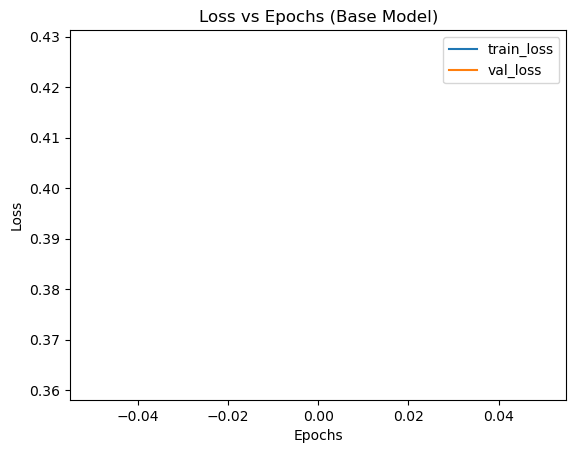

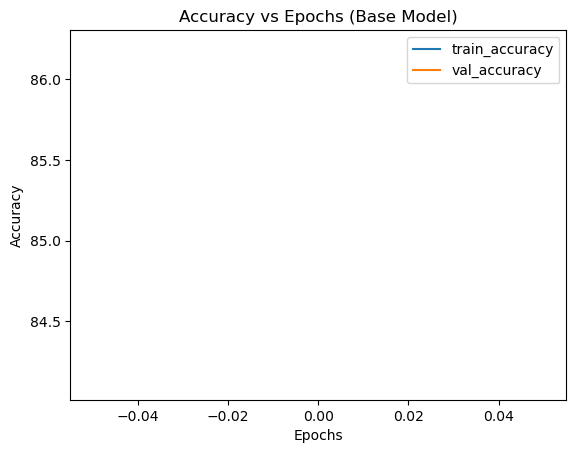

In [13]:
# Set up dictionaries to record how loss and accuracy changes with epochs
loss_history = {'train_loss': [], 'val_loss': []}
accuracy_history = {'train_accuracy':[], 'val_accuracy':[]}

# Record previous losses to enable implementation of early stopping mechanism, therefore also define patience and count
prev_train_loss = float('inf')
prev_val_loss = float('inf')
train_loss = float('inf')
val_loss = float('inf')
patience = 5
count = 0

# Record what is the lowest loss and when does it happen, so to get the best model after training
lowest_loss_epoch = 0
lowest_loss = float('inf')

# Due to limitation of computational resources, the maximum number of epochs train must be set
epoch = 0
max_epoch = 1


while count <= patience and epoch < max_epoch:
    prev_train_loss = train_loss
    prev_val_loss = val_loss
    train_loss = 0.0
    train_correct = 0
    total = 0

    # Training loop
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # Clear previous gradient in optimizer
        optimizer.zero_grad()
        # Get outputs of the model
        outputs = model(inputs)
        # Calculating loss using Cross Entropy loss
        loss = criterion(outputs, labels)
        # Calculate the gradient of loss wrt each parameter
        loss.backward()
        # Update Parameters
        optimizer.step()

        # Accumulate Training Loss for this epoch
        train_loss += loss.item()
        # Predict class based on output (predict the one with greatest probability)
        print(outputs)
        print(torch.max(outputs, 1))
        _, predicted = torch.max(outputs, 1)
        # total and train_correct are calculated to facilitate calculation of accuracy
        total += labels.size(0)
        train_correct += (predicted == labels).sum().item()
    
    # Calculate training accuracy and record training loss and accuracy for this epoch
    train_accuracy = 100 * train_correct / total
    loss_history['train_loss'].append(train_loss / len(train_loader))
    accuracy_history['train_accuracy'].append(train_accuracy)

    # Validation loop
    model.eval()
    val_loss = 0.0
    val_correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            # Get outputs of the model
            outputs = model(inputs)
            # Calculate Loss using Cross Entropy Loss
            loss = criterion(outputs, labels)
            # Accumulate validation loss
            val_loss += loss.item()
            # Get Prediction
            _, predicted = torch.max(outputs, 1)
            # total and train_correct are calculated to facilitate calculation of accuracy
            total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

        # Calculate validation accuracy and record validation loss and accuracy for this epoch
        val_accuracy = 100 * val_correct / total
        loss_history['val_loss'].append(val_loss / len(val_loader))
        accuracy_history['val_accuracy'].append(val_accuracy)
    
    # If there is no improvement, count increase by 1 (early stopping)
    if val_loss >= prev_val_loss:
        count += 1
    else:
        count = 0
        
    # If this training epoch has the lowest validation loss so far, record it and save this model 
    if val_loss < lowest_loss:
            lowest_loss_epoch = epoch
            lowest_loss = val_loss
            torch.save(model, f"BaseModel{epoch}")
    
    epoch += 1

    # Visualize Immediate Results
    print(f"Epoch: {epoch}/{max_epoch}, "
          f"Train Loss: {loss_history['train_loss'][-1]:.4f}, "
          f"Train Accuracy: {accuracy_history['train_accuracy'][-1]:.2f}%, "
          f"Validation Loss: {loss_history['val_loss'][-1]:.4f}, "
          f"Validation Accuracy: {accuracy_history['val_accuracy'][-1]:.2f}%")
    
# Plotting the Required Plots 
#(training loss vs epochs, training accuracy vs epochs, validation loss vs epochs, validation accuracy vs. epochs)
for key in loss_history.keys():
    values = loss_history[key]
    plt.plot(values, label=key)
plt.title("Loss vs Epochs (Base Model)")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

for key in accuracy_history.keys():
    values = accuracy_history[key]
    plt.plot(values, label=key)
plt.title("Accuracy vs Epochs (Base Model)")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")

# show the plot
plt.legend()
plt.show()

In [15]:
# Load the model
model1 = torch.load(f"BaseModel{lowest_loss_epoch}")
print(f"model{lowest_loss_epoch}")

model48


In [16]:
# Create test dataset and dataloader
test_dataset = CustomDataset(x_test, y_test)
test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle= False)

# Evaluate test set performance
model1.eval()
test_loss = 0.0
test_correct = 0
total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # Get outputs of the model
        outputs = model1(inputs)
        # calculate loss
        loss = criterion(outputs, labels)
    
        test_loss += loss.item()
        # select the class with maximum probability as predicted class
        _, predicted = torch.max(outputs, 1)
        # Calculate accuracy
        total += labels.size(0)
        test_correct += (predicted == labels).sum().item()

    test_accuracy = 100 * test_correct / total
print(test_loss/len(test_loader))
#print(test_correct)
print(test_accuracy)

C:\Users\user\AppData\Local\Temp\ipykernel_27552\3193500.py:3: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_numpy.cpp:178.)
  self.img_labels = torch.from_numpy(labels)


0.2535322828657308
91.63


In [7]:
# data augmentation performed when training (for adjusted model/ modified model)
adjusted_transformation = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomCrop(28, padding=4, fill = 0, padding_mode='constant')
])

In [11]:
# Creation of dataset and validation set used for adjusted model's training and validation
adjust_train_dataset = CustomDataset(x_train, y_train, adjusted_transformation)
adjust_val_dataset = CustomDataset(x_valid, y_valid)

In [12]:
# Creation of train and validation dataloader which is used for adjusted model's training and validation
batch_size = 64
adjust_train_loader = DataLoader(adjust_train_dataset, batch_size = batch_size, shuffle = True)
adjust_val_loader = DataLoader(adjust_val_dataset, batch_size = batch_size, shuffle = False)

In [19]:
# Build the Adjusted Model
class AdjustedModel(nn.Module):
    def __init__(self, dropout_rate = 0.2):
        super(AdjustedModel, self).__init__()
        # 3*3 Convolutional layer (1 input, 32 outputs)
        self.conv0 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        # Batch Normalization Layer for convolutional layer(32)
        self.norm0 = nn.BatchNorm2d(32)
        # ReLU set up
        self.relu0 = nn.ReLU()
        # 2*2 max pooling, stride = 2
        self.max_pool0 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # 3*3 Convolutional layer (32 input, 64 outputs)
        self.conv1 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        # Batch Normalization Layer for convolutional layer(32)
        self.norm1 = nn.BatchNorm2d(64)
        #ReLU set up
        self.relu1 = nn.ReLU()
        # 2*2 max pooling, stride = 2
        self.max_pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # 3*3 Convolutional layer (64 input, 128 outputs)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        # Batch Normalization Layer for convolutional layer(32)
        self.norm2 = nn.BatchNorm2d(128)
        # ReLU set up
        self.relu2 = nn.ReLU()
        # 2*2 max pooling, stride = 2
        self.max_pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully Connected Linear Layer (128*3*3 inputs, 2048 outputs)
        self.fc1 = nn.Linear(128 * 3 * 3, 2048)
        # Batch Normalization Layer for linear layer(2048)
        self.norm3 = nn.BatchNorm1d(2048)
        # Drop out layer, dropout_rate = 0.2
        self.dropout = nn.Dropout(dropout_rate)
        # Set up ReLU
        self.relu3 = nn.ReLU()
        # Fully Connected Linear Layer (2048 inputs, 10 outputs)
        self.fc2 = nn.Linear(2048, 10)

    def forward(self, x):
        # Defining how the input data is processed in this CNN network layer by layer to generate the output
        x = self.conv0(x)
        x = self.norm0(x)
        x = self.relu0(x)
        x = self.max_pool0(x)
        
        x = self.conv1(x)
        x = self.norm1(x)
        x = self.relu1(x)
        x = self.max_pool1(x)
        
        x = self.conv2(x)
        x = self.norm2(x)
        x = self.relu2(x)
        x = self.max_pool2(x)
        
        x = x.view(x.size(0), -1)
        
        x = self.fc1(x)
        x = self.norm3(x)
        x = self.dropout(x)
        x = self.relu3(x)
        x = self.fc2(x)
        return x

In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model2 = AdjustedModel().to(device)
criterion2 = nn.CrossEntropyLoss()
optimizer2 = optim.Adam(model2.parameters(), lr=1e-3, betas=(0.9, 0.999))

Epoch: 1/70, Train Loss: 0.4218, Train Accuracy: 84.61%, Validation Loss: 0.3873, Validation Accuracy: 86.10%
Epoch: 2/70, Train Loss: 0.3871, Train Accuracy: 85.74%, Validation Loss: 0.3432, Validation Accuracy: 88.40%
Epoch: 3/70, Train Loss: 0.3671, Train Accuracy: 86.49%, Validation Loss: 0.3961, Validation Accuracy: 86.50%
Epoch: 4/70, Train Loss: 0.3478, Train Accuracy: 87.19%, Validation Loss: 0.3747, Validation Accuracy: 86.80%
Epoch: 5/70, Train Loss: 0.3337, Train Accuracy: 87.79%, Validation Loss: 0.3013, Validation Accuracy: 89.20%
Epoch: 6/70, Train Loss: 0.3237, Train Accuracy: 88.22%, Validation Loss: 0.3328, Validation Accuracy: 88.40%
Epoch: 7/70, Train Loss: 0.3107, Train Accuracy: 88.59%, Validation Loss: 0.3477, Validation Accuracy: 86.80%
Epoch: 8/70, Train Loss: 0.3041, Train Accuracy: 88.91%, Validation Loss: 0.3258, Validation Accuracy: 88.40%
Epoch: 9/70, Train Loss: 0.2922, Train Accuracy: 89.25%, Validation Loss: 0.2959, Validation Accuracy: 89.60%
Epoch: 10/

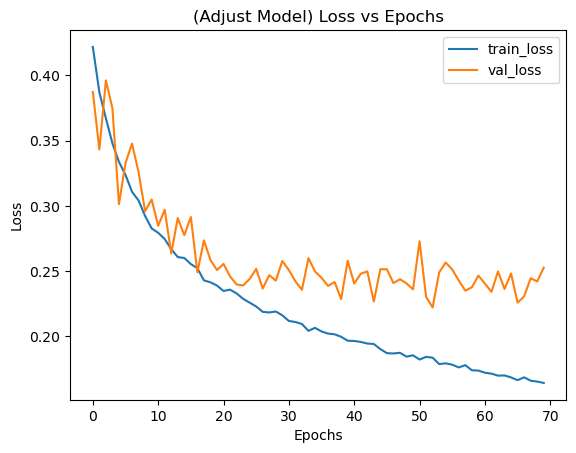

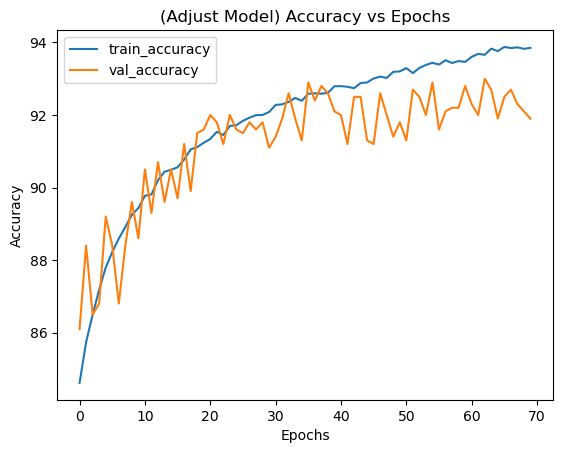

In [23]:
adjust_loss_history = {'train_loss': [], 'val_loss': []}
adjust_accuracy_history = {'train_accuracy':[], 'val_accuracy':[]}

prev_train_loss = float('inf')
prev_val_loss = float('inf')
train_loss = float('inf')
val_loss = float('inf')

adjust_lowest_loss_epoch = 0
adjust_lowest_loss = float('inf')

epoch = 0
max_epoch = 70

patience = 5
count = 0

while count <= patience and epoch < max_epoch:
    prev_train_loss = train_loss
    prev_val_loss = val_loss
    train_loss = 0.0
    train_correct = 0
    total = 0

    # Training loop
    model2.train()
    for inputs, labels in adjust_train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer2.zero_grad()
        outputs = model2(inputs)
        loss = criterion2(outputs, labels)
        loss.backward()
        optimizer2.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        train_correct += (predicted == labels).sum().item()

    train_accuracy = 100 * train_correct / total
    adjust_loss_history['train_loss'].append(train_loss / len(adjust_train_loader))
    adjust_accuracy_history['train_accuracy'].append(train_accuracy)

    # Validation loop
    model2.eval()
    val_loss = 0.0
    val_correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in adjust_val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model2(inputs)
            loss = criterion2(outputs, labels)

            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

        val_accuracy = 100 * val_correct / total
        adjust_loss_history['val_loss'].append(val_loss / len(adjust_val_loader))
        adjust_accuracy_history['val_accuracy'].append(val_accuracy)

        if val_loss >= prev_val_loss:
            count += 1
        else:
            count = 0
            
        if val_loss < adjust_lowest_loss:
            adjust_lowest_loss_epoch = epoch
            adjust_lowest_loss = val_loss
            torch.save(model2, f"AdjustedModel{epoch}")
    
    epoch += 1
    
    print(f"Epoch: {epoch}/{max_epoch}, "
          f"Train Loss: {adjust_loss_history['train_loss'][-1]:.4f}, "
          f"Train Accuracy: {adjust_accuracy_history['train_accuracy'][-1]:.2f}%, "
          f"Validation Loss: {adjust_loss_history['val_loss'][-1]:.4f}, "
          f"Validation Accuracy: {adjust_accuracy_history['val_accuracy'][-1]:.2f}%")

                       
for key in adjust_loss_history.keys():
    values = adjust_loss_history[key]
    plt.plot(values, label=key)
plt.title("(Adjust Model) Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

for key in adjust_accuracy_history.keys():
    values = adjust_accuracy_history[key]
    plt.plot(values, label=key)
plt.title("(Adjust Model) Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")

# show the plot
plt.legend()
plt.show()

In [24]:
adjusted_model1 = torch.load(f"AdjustedModel{adjust_lowest_loss_epoch}")

In [27]:
test_dataset = CustomDataset(x_test, y_test)
test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle= False)
adjusted_model1.eval()
test_loss = 0.0
test_correct = 0
total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = adjusted_model1(inputs)
        loss = criterion2(outputs, labels)

        test_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        test_correct += (predicted == labels).sum().item()

    test_accuracy = 100 * test_correct / total
#print(len(test_loader))
print("test loss: ", test_loss/len(test_loader))
#print(test_correct)
print("test accuracy: ",test_accuracy)

test loss:  0.20377893520483545
test accuracy:  92.99


In [26]:
print(adjust_lowest_loss_epoch)

52
